# Importing libraries

In [1]:
import glob

In [2]:
import nltk,re,string
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from string import punctuation
from heapq import nlargest
from sklearn.feature_extraction.text import TfidfVectorizer
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# Lemmatizing the text

In [3]:
from nltk.stem import WordNetLemmatizer 

class LemmaTokenizer(object):
    def __init__(self):
        self.lemmatizer = WordNetLemmatizer()
    def __call__(self, articles):
        return [self.lemmatizer.lemmatize(t) for t in word_tokenize(articles)]

# Merges an acronyms in a given sentence

In [4]:
def merge_acronyms(s):
    """Merges all acronyms in a given sentence. For example M.I.T -> MIT"""
    
    s = re.sub(r'(?<!\w)([A-Z])\.', r'\1', s)
    return s

# Preprocessing to remove unwanted punctuations

In [5]:
def preprocessing(line):
    line = line.lower()
    braces = ['[',']','{','}','(',')','-','...','_']
    line = re.sub(r"[0-9]".format(string.punctuation), " ", line)
    line = merge_acronyms(line)
    for b in braces:
        line = line.replace(b,'')
    return line

# Ranking the sentences according to the Tf-idf scores

In [6]:
def maxTfIdfIndex(sentence_list, feature_names, tfidf):
    
    word_frequencies = {}
    doc = 0
    lemma = LemmaTokenizer()
    feature_index = tfidf[doc,:].nonzero()[1]
    tfidf_scores = zip(feature_index, [tfidf[doc, x] for x in feature_index])

    for w, s in [(feature_names[j], s) for (j, s) in tfidf_scores]:
        word_frequencies[w] = s

    sum_all_words = sum(word_frequencies.values())
    #print(sum_all_words)
    sen1 = ""
    
    sentence_scores = {}  
    for sent in sentence_list: 
        sent = preprocessing(sent)
        #nltk.word_tokenize(sent.lower())
        sen1 = sent[:]
        for word in lemma.__call__(sen1):
            if word in word_frequencies.keys():
                if sent not in sentence_scores.keys():
                    # sentence_score = [sum(tf-idf of all words of sentence) / sum(tf-idf of all words of document)] 
                    sentence_scores[sent] = word_frequencies[word]
                else:
                    sentence_scores[sent] += word_frequencies[word]

        if sent in sentence_scores.keys(): 
            sentence_scores[sent] = sentence_scores[sent]/sum_all_words
        
    key_list = list(sentence_scores.keys()) 
    val_list = list(sentence_scores.values()) 
  
    #print(key_list[val_list.index(max(val_list))]) 
    #print(val_list.index(max(val_list)))
    #print()
    return val_list.index(max(val_list))

# Determining the optimal number of clusters using combination of Silhouette Analysis and Thumb Rule

In [7]:
from sklearn.metrics import silhouette_score
import math

def cluster_no(X, text_size):
    """if (text_size <100):
        no_of_clusters = text_size
    else:
        no_of_clusters = int(math.sqrt(text_size//2))+10
    """
    no_of_clusters = text_size
    score_list = [0 for i in range(no_of_clusters)]
    for i in range(2,no_of_clusters):
        print(i,end=" ")
        kmeans = KMeans(n_clusters = i, init='k-means++', max_iter=100, n_init=1).fit(X)
        y_pred = list(kmeans.predict(tfidf))
        score = silhouette_score(X, y_pred, metric='euclidean')
        score_list[i] = score
        
        #print("score for the n_cluster {} is {}".format(i,score))
    # Visualizing the Silhouette score.
    plt.scatter(list(range(no_of_clusters)), score_list, c = "r")
    plt.plot(list(range(no_of_clusters)), score_list, c = "r")
    plt.xlabel("Number of clusters")
    plt.ylabel("Silhouette Score")
    plt.title("Silhouette Score vs no. of clusters")
    plt.show()

    return (score_list.index(max(score_list)))

# Reading Multiple documents for Current working directory

In [8]:
all_doc_data = []
path = input("Enter path:")
for filename in glob.glob(path+'/*.txt'):
    with open(filename,'r') as file:
        text = file.read()
        if len(text) > 0:
            all_doc_data.append(text)
print(len(all_doc_data))

Enter path:C:\Users\Nagendra\Desktop\NLP\BBC News Summary\News Articles\business
520


# Performing actual Summarization of individual document according to their TF-IDF scores

Document  1

Number of Lines in Actual text
20


C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 

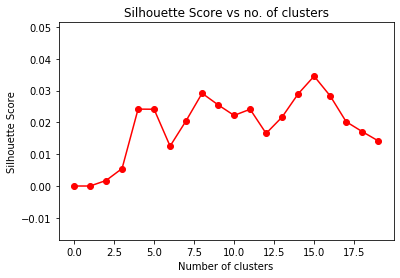

Optimal cluster number is  15

Number of Lines in Summarized text 
4

Ad sales boost Time Warner profit

Quarterly profits at US media giant TimeWarner jumped 76% to $1.13bn (600m) for the three months to December, from $639m year-earlier. TimeWarner said fourth quarter sales rose 2% to $11.1bn from $10.9bn. For the full-year, TimeWarner posted a profit of $3.36bn, up 27% from its 2003 performance, while revenues grew 6.4% to $42.09bn. "Our financial performance was strong, meeting or exceeding all of our full-year objectives and greatly enhancing our flexibility," chairman and chief executive Richard Parsons said.

Document  2

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


11 12 13 14 

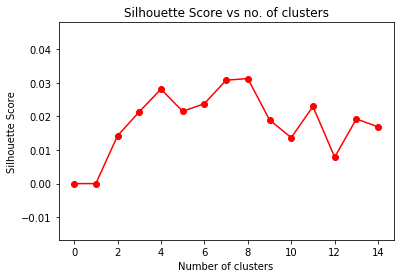

Optimal cluster number is  8

Number of Lines in Summarized text 
3

Dollar gains on Greenspan speech

The dollar has hit its highest level against the euro in almost three months after the Federal Reserve head said the US trade deficit is set to stabilise. Market concerns about the deficit has hit the greenback in recent months. In the meantime, the US Federal Reserve's decision on 2 February to boost interest rates by a quarter of a point - the sixth such move in as many months - has opened up a differential with European rates.

Document  3

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


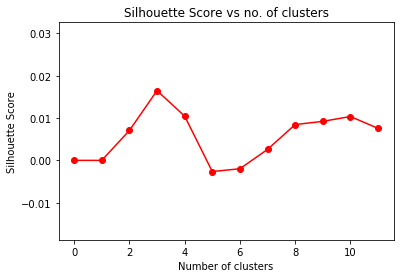

Optimal cluster number is  3

Number of Lines in Summarized text 
3

Yukos unit buyer faces loan claim

The owners of embattled Russian oil giant Yukos are to ask the buyer of its former production unit to pay back a $900m (Â£479m) loan. Rosneft already faces a similar $540m repayment demand from foreign banks. Rosneft officials were unavailable for comment.

Document  4

Number of Lines in Actual text
19
2 3 4 5 6 7 8 9 10 11 12

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 13 14 15 16 17 18 

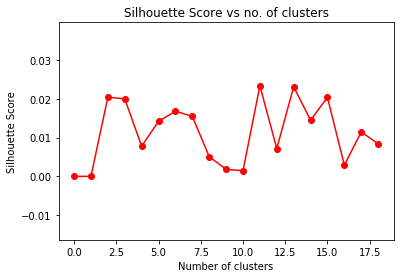

Optimal cluster number is  11

Number of Lines in Summarized text 
2

High fuel prices hit BA's profits

British Airways has blamed high fuel prices for a 40% drop in profits. To help offset the increased price of aviation fuel, BA last year introduced a fuel surcharge for passengers.

Document  5

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


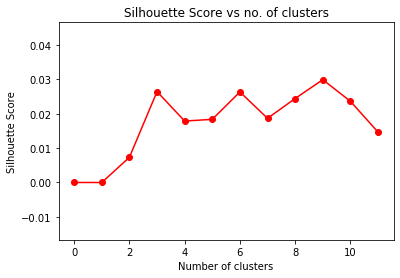

Optimal cluster number is  9

Number of Lines in Summarized text 
2

Pernod takeover talk lifts Domecq

Shares in UK drinks and food firm Allied Domecq have risen on speculation that it could be the target of a takeover by France's Pernod Ricard. Allied Domecq shares in London rose 4% by 1200 GMT, while Pernod shares in Paris slipped 1.2%.

Document  6

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


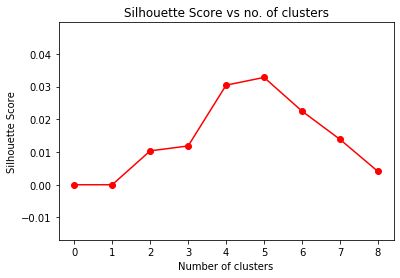

Optimal cluster number is  5

Number of Lines in Summarized text 
2

Japan narrowly escapes recession

Japan's economy teetered on the brink of a technical recession in the three months to September, figures show. "I maintain the view that Japan's economy remains in a minor adjustment phase in an upward climb, and we will monitor developments carefully," said economy minister Heizo Takenaka.

Document  7

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


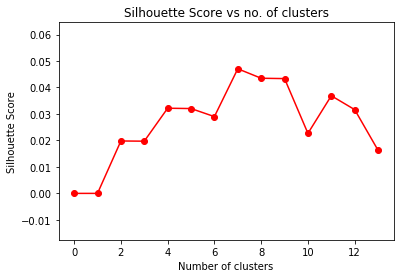

Optimal cluster number is  7

Number of Lines in Summarized text 
2

Jobs growth still slow in the US

The US created fewer jobs than expected in January, but a fall in jobseekers pushed the unemployment rate to its lowest level in three years. Nevertheless it was enough to push down the unemployment rate to 5.2%, its lowest level since September 2001.

Document  8

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


13 14 

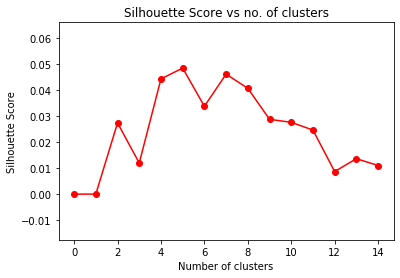

Optimal cluster number is  5

Number of Lines in Summarized text 
3

India calls for fair trade rules

India, which attends the G7 meeting of seven leading industrialised nations on Friday, is unlikely to be cowed by its newcomer status. In London on Thursday ahead of the meeting, India's finance minister, lashed out at the restrictive trade policies of the G7 nations. India, along with China, Brazil, South Africa and Russia, has been invited to take part in the G7 meeting taking place in London on Friday and Saturday.

Document  9

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


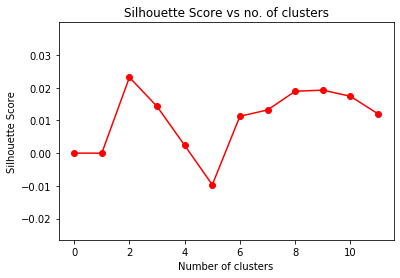

Optimal cluster number is  2

Number of Lines in Summarized text 
4

Ethiopia's crop production up 24%

Ethiopia produced 14.27 million tonnes of crops in 2004, 24% higher than in 2003 and 21% more than the average of the past five years, a report says. In eastern and southern Ethiopia, a prolonged drought has killed crops and drained wells. Agriculture is the main economic activity in Ethiopia, representing 45% of gross domestic product. About 80% of Ethiopians depend directly or indirectly on agriculture.

Document  10

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


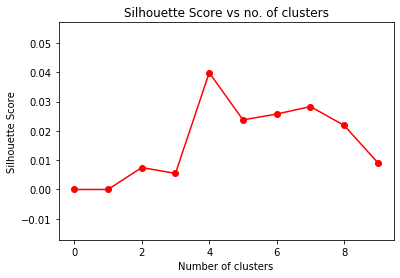

Optimal cluster number is  4

Number of Lines in Summarized text 
4

Court rejects $280bn tobacco case

A US government claim accusing the country's biggest tobacco companies of covering up the effects of smoking has been thrown out by an appeal court. But the Court of Appeals for the District of Columbia ruled that the US government could not sue the firms under legislation drawn up to counteract Mafia infiltration of business. The tobacco companies deny that they illegally conspired to promote smoking and defraud the public. They also say they have already met many of the government's demands in a landmark $206bn settlement reached with 46 states in 1998.

Document  11

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


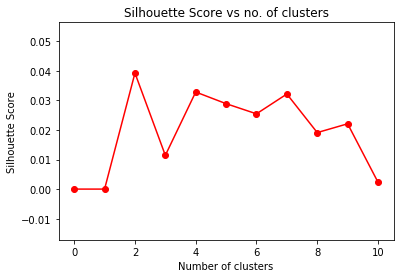

Optimal cluster number is  2

Number of Lines in Summarized text 
9

Ask Jeeves tips online ad revival

Ask Jeeves has become the third leading online search firm this week to thank a revival in internet advertising for improving fortunes. The firm's revenue nearly tripled in the fourth quarter of 2004, exceeding $86m (Â£46m). Ask Jeeves, once among the best-known names on the web, is now a relatively modest player. Its $17m profit for the quarter was dwarfed by the $204m announced by rival Google earlier in the week. The trend has taken hold relatively quickly. But on Thursday, it announced that a sharp turnaround had brought about an unexpected increase in profits. Neither Ask Jeeves nor Doubleclick thrilled investors with their profit news, however. In both cases, their shares fell by some 4%. Analysts attributed the falls to excessive expectations in some quarters, fuelled by the dramatic outperformance of Google on Tuesday.

Document  12

Number of Lines in Actual text
14
2 3 4 5 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


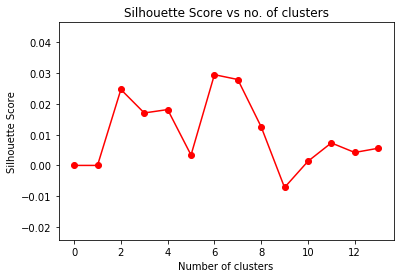

Optimal cluster number is  6

Number of Lines in Summarized text 
5

Indonesians face fuel price rise

Indonesia's government has confirmed it is considering raising fuel prices by as much as 30%. Millions of Indonesians use kerosene for basic cooking, and prices have been heavily subsidised for years. Indonesia pays subsidies to importers in order to stabilise domestic fuel prices, but higher oil prices have forced the government to spend more on holding prices down. Since President Yudhoyono's government came to power in October, it has indicated its intention of raising domestic fuel prices by cutting subsidies. "We are still considering if a 30% hike is suitable at the moment.

Document  13

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


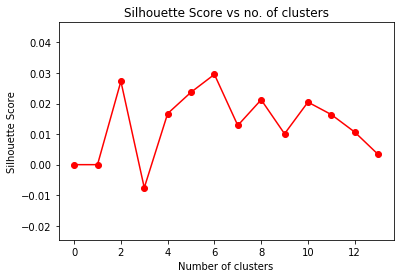

Optimal cluster number is  6

Number of Lines in Summarized text 
2

Peugeot deal boosts Mitsubishi

Struggling Japanese car maker Mitsubishi Motors has struck a deal to supply French car maker Peugeot with 30,000 sports utility vehicles (SUV). As a result, the Japanese car maker has sought a series of financial bailouts.

Document  14

Number of Lines in Actual text
22
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 16 17 18 19 20 21 

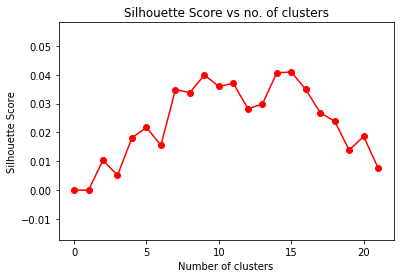

Optimal cluster number is  15

Number of Lines in Summarized text 
2

Telegraph newspapers axe 90 jobs

The Daily and Sunday Telegraph newspapers are axing 90 journalist jobs - 17% of their editorial staff. "Journalists are the lifeblood of any newspaper, and maintaining the quality of The Daily Telegraph and The Sunday Telegraph for our readers is vital," he said.

Document  15

Number of Lines in Actual text
28


C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 

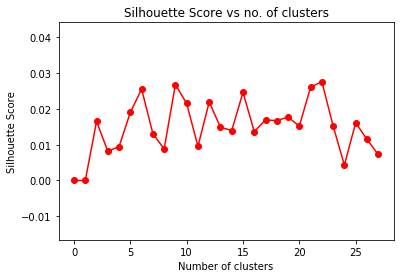

Optimal cluster number is  22

Number of Lines in Summarized text 
2

Air passengers win new EU rights

Air passengers who are unable to board their flights because of overbooking, cancellations or flight delays can now demand greater compensation. However, only scheduled flight operators were obliged to offer compensation in cases of overbooking and they did not have to offer compensation for flight cancellations.

Document  16

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


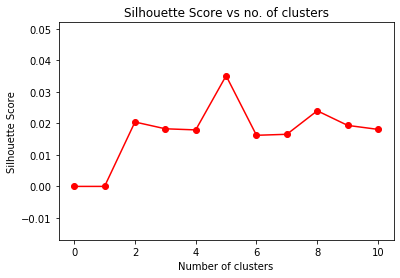

Optimal cluster number is  5

Number of Lines in Summarized text 
2

China keeps tight rein on credit

China's efforts to stop the economy from overheating by clamping down on credit will continue into 2005, state media report. To some extent, the credit controls do seem to be taking effect.

Document  17

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


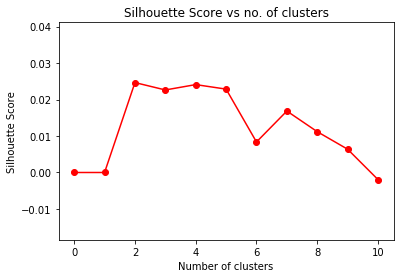

Optimal cluster number is  2

Number of Lines in Summarized text 
6

Parmalat boasts doubled profits

Parmalat, the Italian food group at the centre of one of Europe's most painful corporate scandals, has reported a doubling in profit. The firm sought bankruptcy protection in December 2003 after disclosing a 4bn-euro hole in its accounts. But a crucial factor for the company's future is the legal unwinding of its intensely complex financial position. That brought to 49 the number of banks that Mr Bondi has sued, a mass of legal action that could bring in as much as 3bn euros. The company has also sued former auditors and financial advisors for damages. And criminal cases against the company's former management are proceeding separately.

Document  18

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


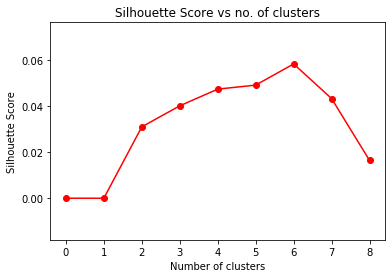

Optimal cluster number is  6

Number of Lines in Summarized text 
1

India's rupee hits five-year high

India's rupee has hit a five-year high after Standard & Poor's (S&P) raised the country's foreign currency rating.

Document  19

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


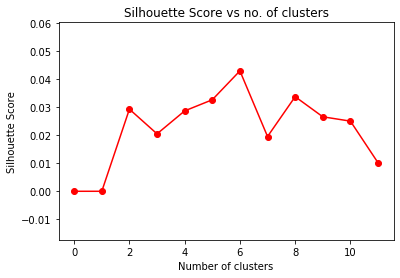

Optimal cluster number is  6

Number of Lines in Summarized text 
2

India widens access to telecoms

India has raised the limit for foreign direct investment in telecoms companies from 49% to 74%. Investment bank Morgan Stanley has forecast that India's mobile market is likely to grow by about 40% a year until 2007.

Document  20

Number of Lines in Actual text
29
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 

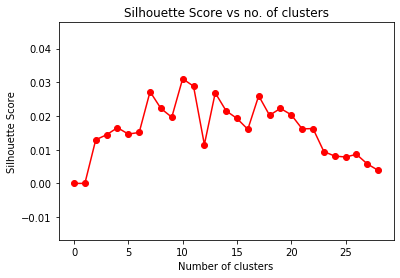

Optimal cluster number is  10

Number of Lines in Summarized text 
2

Call centre users 'lose patience'

Customers trying to get through to call centres are getting impatient and quicker to hang up, a survey suggests. The surge in customers trying to get through to call centres is also a reflection of the centres' growing range of tasks.

Document  21

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


14 

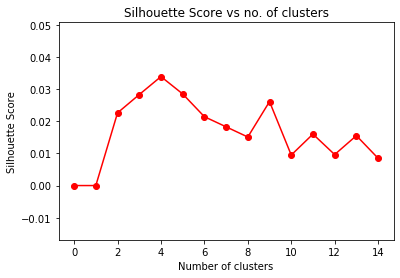

Optimal cluster number is  4

Number of Lines in Summarized text 
7

Rank 'set to sell off film unit'

Leisure group Rank could unveil plans to demerge its film services unit and sell its media business, reports claim. Since Mike Smith's appointment as chief executive in 1999, the group has focused on fewer businesses and embarked on a major cost-cutting programme which has seen it dispose of a number of businesses, including the Odeon cinema chain and the Pinewood studios. The move left the group with three core divisions: gaming, Hard Rock and Deluxe Films, which provides technical services to Hollywood studios. Rank now aims to concentrate on its gaming, bars and hotels business, including extending its Hard Rock brand to its casinos - trials of which have been a success. However, that business is seen as less successful. It has now diversified into a range of other leisure activities - mainly in the UK - including hotels, roadside service areas and holiday centres. It now owns 34 G

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


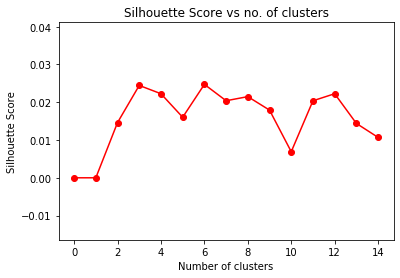

Optimal cluster number is  6

Number of Lines in Summarized text 
3

Sluggish economy hits German jobs

The number of people out of work in Europe's largest economy has risen for the tenth straight month as growth remains stubbornly slow. The seasonally adjusted rise showed a smaller rise than expected, as government measures to encourage job creation began to take effect. "Job creation measures probably prevented a stronger increase in the seasonally adjusted numbers."

Document  23

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


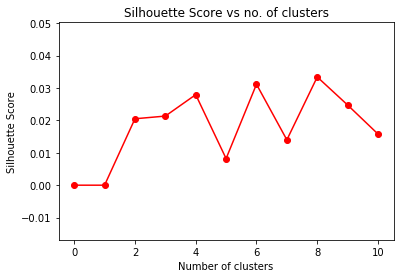

Optimal cluster number is  8

Number of Lines in Summarized text 
2

Mixed signals from French economy

The French economy picked up speed at the end of 2004, official figures show - but still looks set to have fallen short of the government's hopes. It leaves GDP up 2.3% for the full year, but short of the 2.5% which the French government had predicted.

Document  24

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


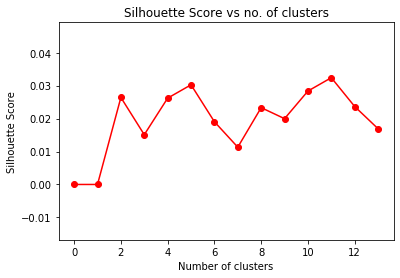

Optimal cluster number is  11

Number of Lines in Summarized text 
3

US trade gap hits record in 2004

The gap between US exports and imports hit an all-time high of $671.7bn (Â£484bn) in 2004, latest figures show. However, on a monthly basis the US trade gap narrowed by 4.9% in December to Â£56.4bn. For all of 2004, US exports rose 12.3% to $1.15 trillion, but imports rose even faster by 16.3% to a new record of $1.76 trillion.

Document  25

Number of Lines in Actual text
23
2 3 4 5 6 7 8 9 10 11 12

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 13 14 15 16 17 18 19 20 21 22 

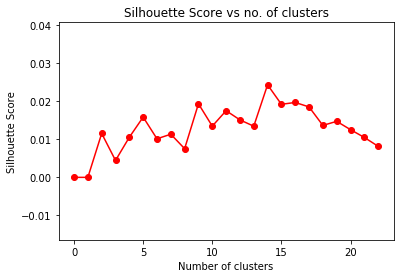

Optimal cluster number is  14

Number of Lines in Summarized text 
2

Yukos loses US bankruptcy battle

A judge has dismissed an attempt by Russian oil giant Yukos to gain bankruptcy protection in the US. Yukos filed for Chapter 11 protection in Houston in an unsuccessful attempt to halt the auction of its Yugansk division by the Russian authorities.

Document  26

Number of Lines in Actual text
14
2

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 3 4 5 6 7 8 9 10 11 12 13 

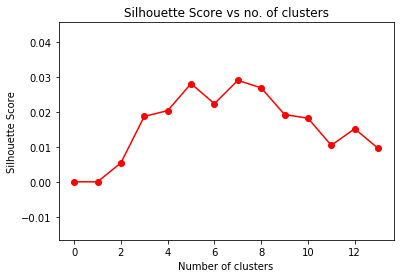

Optimal cluster number is  7

Number of Lines in Summarized text 
2

Safety alert as GM recalls cars

The world's biggest carmaker General Motors (GM) is recalling nearly 200,000 vehicles in the US on safety grounds, according to federal regulators. The world's biggest car maker is grappling with losses in its European business, weak US sales and now a product recall.

Document  27

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


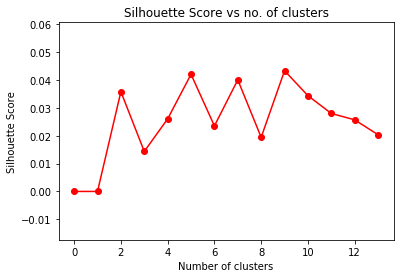

Optimal cluster number is  9

Number of Lines in Summarized text 
2

Steel firm 'to cut' 45,000 jobs

Mittal Steel, one of the world's largest steel producers, could cut up to 45,000 jobs over the next five years, its chief executive has said. A Mittal Steel spokeman said that no decisions on job cuts have been made yet.

Document  28

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


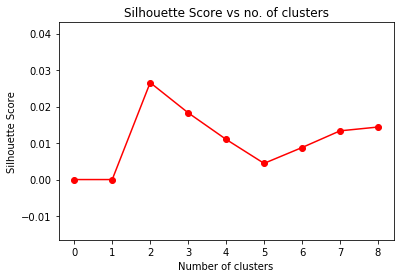

Optimal cluster number is  2

Number of Lines in Summarized text 
6

Strong demand triggers oil rally

Crude oil prices surged back above the $47 a barrel mark on Thursday after an energy market watchdog raised its forecasts for global demand. US light crude rose $1.64 to $47.10, while Brent crude in London gained $1.32 to $44.45. The Paris-based IEA watchdog, which advises industrialized nations on energy policy, said the upward revision was due to stronger demand from China and other Asian countries. The fresh rally in crude prices followed gains on Wednesday which were triggered by large falls in US crude supplies following a cold spell in North America in January. On top of that, ongoing problems for beleaguered Russian oil giant Yukos have also prompted the IEA to revise its output estimates from Russia - a major non-Opec supplier. "I think that prices are now beginning to set a new range and it looks like the $40 to $50 level," said energy analyst Orin Middleton of Barclays Capit

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 17 18 19 

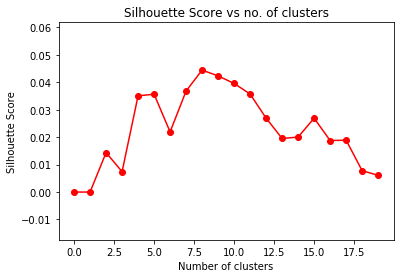

Optimal cluster number is  8

Number of Lines in Summarized text 
5

UK firm faces Venezuelan land row

Venezuelan authorities have said they will seize land owned by a British company as part of President Chavez's agrarian reform programme. Officials in Cojedes state said on Friday that farmland owned by a subsidiary of the Vestey Group would be taken and used to settle poor farmers. The Vestey Group said it had not been informed of any planned seizure. Officials claim that Agroflora does not possess valid documents proving its ownership of the land in question. The Vestey Group said it had owned the land since 1920 and would co-operate fully with the authorities.

Document  30

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 16 

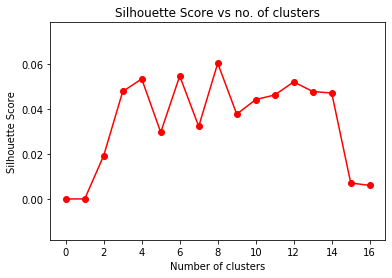

Optimal cluster number is  8

Number of Lines in Summarized text 
5

Soaring oil 'hits world economy'

The soaring cost of oil has hit global economic growth, although world's major economies should weather the storm of price rises, according to the OECD. However, the Paris-based economics think tank said it believed the global economy could still regain momentum. "There are nonetheless good reasons to believe that despite recent oil price turbulence the world economy will regain momentum in a not-too-distant future," said Jean-Philippe Cotis, the OECD's chief economist. If the oil price does not rise any further, then we think the shock can be absorbed within the next few quarters," Vincent Koen, a senior economist with the OECD, told the BBC's World Business Report. China's booming economy and a "spectacular comeback" in Japan - albeit one that has faltered in recent months - would help world economic recovery, the OECD said.

Document  31

Number of Lines in Actual text
16
2 3 4 5 6

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 15 

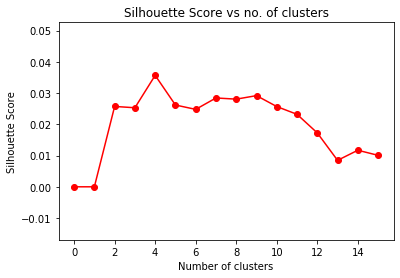

Optimal cluster number is  4

Number of Lines in Summarized text 
4

Irish markets reach all-time high

Irish shares have risen to a record high, with investors persuaded to buy into the market by low inflation and strong growth forecasts. Several of Ireland's biggest companies saw their market value hit recent highs on Thursday. Allied Irish Banks, Ireland's biggest company by capitalisation, touched a five year peak while Bank of Ireland shares rose to their highest level since August 2002. Telecoms firm Eircom, which recently revealed that it would re-enter the Irish mobile phone market, hit a yearly high.

Document  32

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


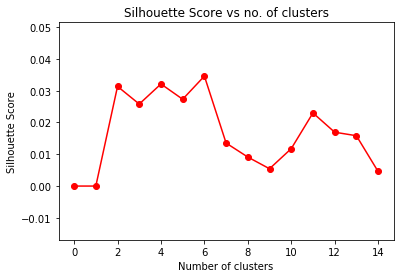

Optimal cluster number is  6

Number of Lines in Summarized text 
7

Japanese banking battle at an end

Japan's Sumitomo Mitsui Financial has withdrawn its takeover offer for rival bank UFJ Holdings, enabling the latter to merge with Mitsubishi Tokyo. Sumitomo's exit ends the most high profile fight in Japanese bank history. UFJ Holdings, Japan's fourth-largest bank, has been at the centre of a fierce bid battle over the last year. Sumitomo, Japan's third-largest bank, tabled a higher offer for UFJ than its rival, valuing the company at $35bn. However, UFJ's management was known to prefer the offer from Mitsubishi Tokyo Financial Group (MTFG), Japan's second-largest bank. Sumitomo may now turn its attention to deepening its ties with Daiwa Securities, another Japanese financial firm. The two are set to merge their venture capital operations and there has been speculation that this could lead to a full-blown merger.

Document  33

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


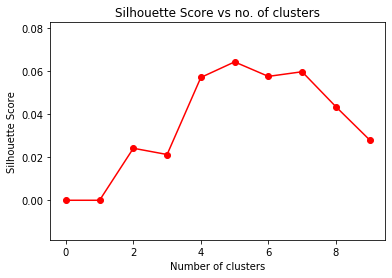

Optimal cluster number is  5

Number of Lines in Summarized text 
2

Rich grab half Colombia poor fund

Half of the money put aside by the Colombian government to help the country's poor is benefiting people who do not need it, a study has found. Colombia has a population of about 44 million and half lives below poverty line.

Document  34

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


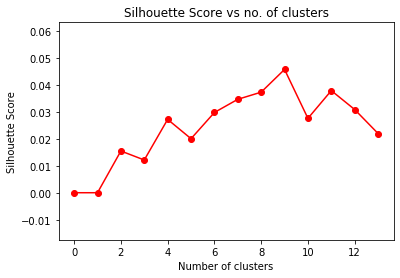

Optimal cluster number is  9

Number of Lines in Summarized text 
2

Rover deal 'may cost 2,000 jobs'

Some 2,000 jobs at MG Rover's Midlands plant may be cut if investment in the firm by a Chinese car maker goes ahead, the Financial Times has reported. A tie-up, seen as Rover's last chance to save its Longbridge plant, has been pushed by UK Chancellor Gordon Brown.

Document  35

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


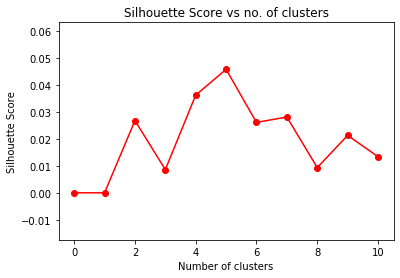

Optimal cluster number is  5

Number of Lines in Summarized text 
3

Ad firm WPP's profits surge 15%

UK advertising giant WPP has posted larger-than-expected annual profits and predicted that it will outperform the market in 2005. Revenues were Â£4.3bn while the firm's operating margins were 14.1%, which it said could reach 14.8% by 2006. Events such as the Olympics helped boost WPP's profits in 2004.

Document  36

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


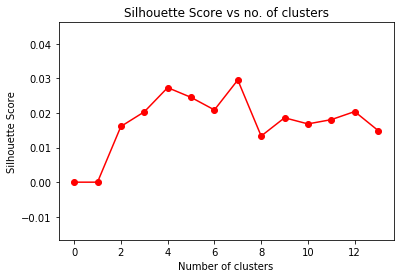

Optimal cluster number is  7

Number of Lines in Summarized text 
2

US gives foreign firms extra time

Foreign firms have been given an extra year to meet tough new corporate governance regulations imposed by the US stock market watchdog. Big US firms already have to meet the requirements, but smaller ones and foreign-based firms which list their shares on US stock markets originally had until the middle of this year.

Document  37

Number of Lines in Actual text
19
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


14 15 16 17 18 

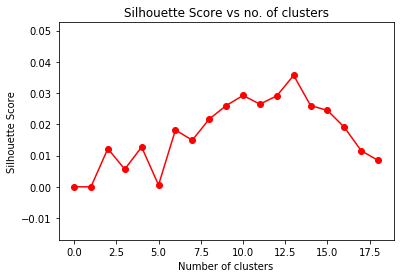

Optimal cluster number is  13

Number of Lines in Summarized text 
1

Japanese mogul arrested for fraud

One of Japan's best-known businessmen was arrested on Thursday on charges of falsifying shareholder information and selling shares based on the false data.

Document  38

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


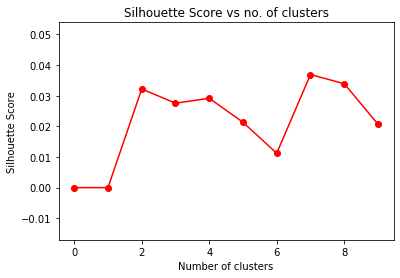

Optimal cluster number is  7

Number of Lines in Summarized text 
2

Deutsche Telekom sees mobile gain

German telecoms firm Deutsche Telekom saw strong fourth quarter profits on the back of upbeat US mobile earnings and better-than-expected asset sales. Sales of stakes in firms including Russia's OAO Mobile Telesystems raised 1.17bn euros.

Document  39

Number of Lines in Actual text
11
2 3 4 5 6

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 7 8 9 10 

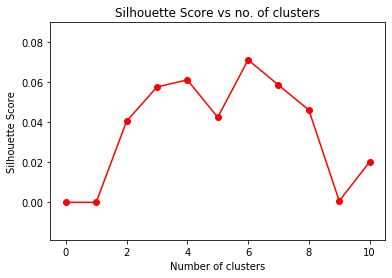

Optimal cluster number is  6

Number of Lines in Summarized text 
1

Chinese wine tempts Italy's Illva

Italy's Illva Saronno has agreed to buy 33% of Changyu, the largest wine maker in China.

Document  40

Number of Lines in Actual text
11
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 

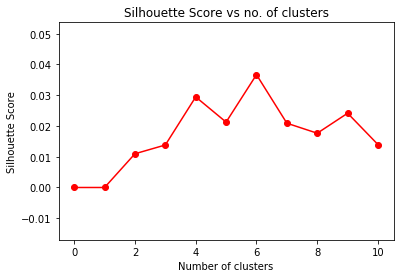

Optimal cluster number is  6

Number of Lines in Summarized text 
2

Umbro profits lifted by Euro 2004

UK sportswear firm Umbro has posted a 222% rise in annual profit after sales of replica England football kits were boosted by the Euro 2004 tournament. Shares in Umbro were up 1.76% at 115.5 pence in morning trade.

Document  41

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 13 14 

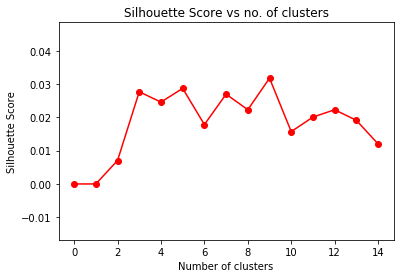

Optimal cluster number is  9

Number of Lines in Summarized text 
2

Fed chief warning on US deficit

Federal Reserve chairman Alan Greenspan has warned that allowing huge US budget deficits to continue could have "severe" consequences. While the US economy is growing at a "reasonably good pace" he warned that budget concerns were clouding the economic outlook for the US.

Document  42

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


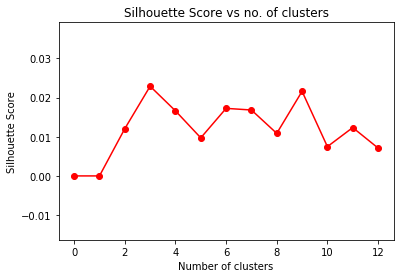

Optimal cluster number is  3

Number of Lines in Summarized text 
7

UK Coal plunges into deeper loss

Shares in UK Coal have fallen after the mining group reported losses had deepened to Â£51.6m in 2004 from Â£1.2m. The South Yorkshire company, led by new chief executive Gerry Spindler, said it hoped to return to profit in 2006. In early trade on Thursday, its shares were down 10% at 119 pence. It had introduced new wage structures, a new daily maintenance regime for machinery at its mines and methods to continue mining in adverse conditions. The recent rise in coal prices has failed to benefit the company as most of its output had already been sold, it said. Total production costs were Â£1.30 per gigajoule, UK Coal said, but the average selling price was just Â£1.18 per gigajoule. UK Coal operates 15 deep and surface mines across Nottinghamshire, Derbyshire, Leicestershire, Yorkshire, the West Midlands, Northumberland and Durham.

Document  43

Number of Lines in Actual text
9
2 3 4 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


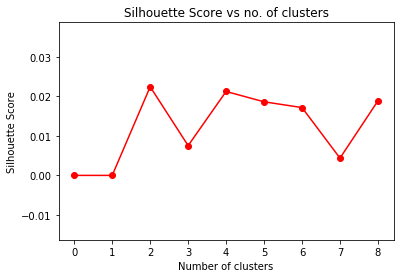

Optimal cluster number is  2

Number of Lines in Summarized text 
7

Saudi ministry to employ women

Women will be employed in Saudi Arabia's foreign ministry for the first time this year, Foreign Minister Prince Saud Al-Faisal has been reported as saying. The move comes as the conservative country inches open the door to working women. Earlier this week, the local Arab News said Labour Minister Ghazi al-Gosaibi had "caused uproar" when he said his ministry was having difficulty hiring women because they demanded segregated offices. The newspaper said many Saudi women found his explanation "a pitiful excuse for not employing women". Women now make up more than half of all graduates from Saudi universities but only 5% of the workforce. "Our educational reforms have created a new generation of highly-educated and professionally trained Saudi women who are acquiring their rightful position in Saudi society," Arab News quoted Prince Saud as saying. "I am proud to mention here that this yea

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 16 17 

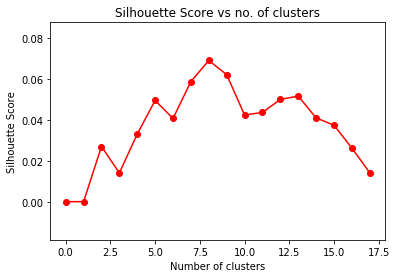

Optimal cluster number is  8

Number of Lines in Summarized text 
2

Japan economy slides to recession

The Japanese economy has officially gone back into recession for the fourth time in a decade. Japan's economy has seen stretches of moderate growth over the past decade but has periodically slipped back into recession.

Document  45

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


12 

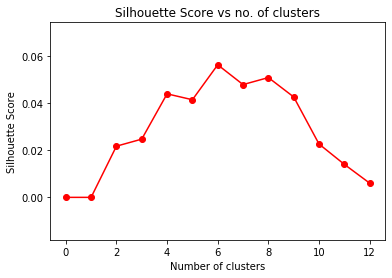

Optimal cluster number is  6

Number of Lines in Summarized text 
3

US crude prices surge above $53

US crude prices have soared to fresh four-month highs above $53 in the US as refinery problems propelled petrol prices to an all-time high. US light sweet crude futures jumped to $53.09 a barrel in New York before closing at $53.03. The gains tracked a surge in US gasoline futures to a record high of $1.4850 a gallon.

Document  46

Number of Lines in Actual text
15
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


9 10 11 12 13 14 

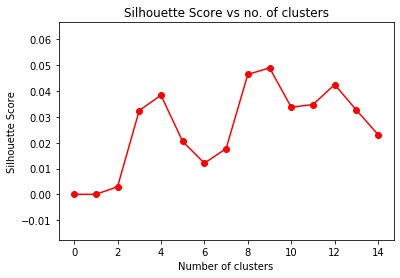

Optimal cluster number is  9

Number of Lines in Summarized text 
3

Industrial output falls in Japan

Japanese industrial output fell in October while unemployment rose, casting further doubt on the strength of the country's economic recovery. Analysts had been forecasting a 0.1% rise in month on month industrial output. Although inventories fell 0.7% month on month, they were 36% higher than a year ago.

Document  47

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


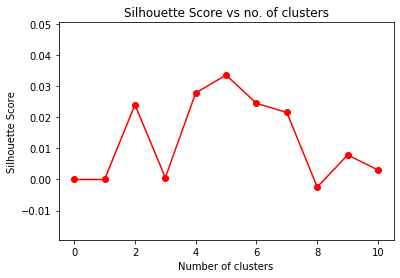

Optimal cluster number is  5

Number of Lines in Summarized text 
4

Ryanair in $4bn Boeing plane deal

Budget airline Ryanair has placed an order for 70 Boeing 737-800 planes, in a deal valued at $4bn (Â£2.1bn) which should lead to 2,500 new Ryanair jobs. "With this new order and new pricing in place, Ryanair expects that unit operating costs (excluding fuel) will continue to fall each year for the next five years," he added. At the end of this year, Ryanair will have taken delivery of about 100 new planes, while the 70 new orders are due for delivery between 2008 and 2012. About 2,500 new jobs should be created in the next seven years, it added.

Document  48

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


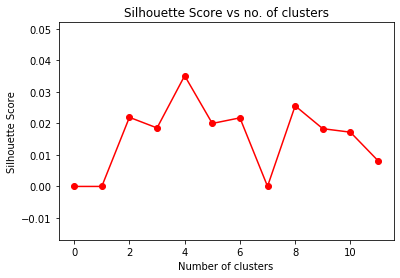

Optimal cluster number is  4

Number of Lines in Summarized text 
4

Parmalat to return to stockmarket

Parmalat, the Italian dairy company which went bust after an accounting scandal, hopes to be back on the Italian stock exchange in July. As part of the re-listing on the Italian stock exchange, creditors' debts are expected to be converted into shares through two new share issues amounting to more than 2bn euros. Several former top Parmalat executives are under investigation for the fraud scandal. Lawmakers said on Wednesday night Enrico Bondi, the turnaround specialist appointed by the Italian government as Parmalat's chief executive, spoke positively about the company during a closed-door hearing of the Chamber of Deputies industry commission.

Document  49

Number of Lines in Actual text
28
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 

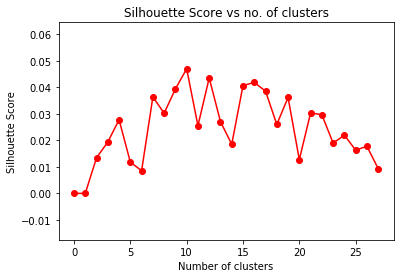

Optimal cluster number is  10

Number of Lines in Summarized text 
6

BMW cash to fuel Mini production

Less than four years after the new Mini was launched, German car maker BMW has announced Â£100m of new investment. The result of the investment could be to raise output to more than 200,000 cars from 2007. Before Wednesday's announcement, BMW had invested some Â£280m in Mini production. Last year, almost one in six cars sold by the BMW group was a Mini. Second-hand Minis are not cheap either. BMW's Mini adventure has made good much of what went wrong during its stewardship of the UK car maker Rover which it sold for Â£10 five years ago to the Phoenix consortium.

Document  50

Number of Lines in Actual text
15
2 3 4 5 6 7

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 8 9 10 11 12 13 14 

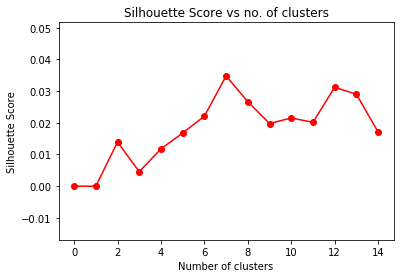

Optimal cluster number is  7

Number of Lines in Summarized text 
1

Bad weather hits Nestle sales

A combination of bad weather, rising raw material costs and the sluggish European economy has hit sales at Swiss food and drink giant Nestle.

Document  51

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


14 15 

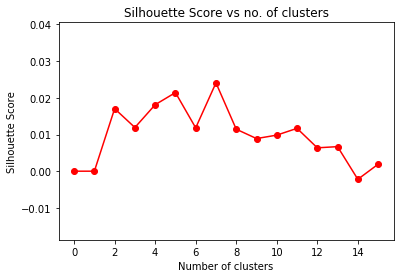

Optimal cluster number is  7

Number of Lines in Summarized text 
2

Fiat mulls Ferrari market listing

Ferrari could be listed on the stock market as part of an overhaul of Fiat's carmaking operations, the Financial Times has reported. Under the proposals - which the paper said could be announced within days - the iconic sportscar maker could be listed separately on the market.

Document  52

Number of Lines in Actual text
21
2 3 4 5 6 7 8 9 10 11

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 12 13 14 15 16 17 18 19 20 

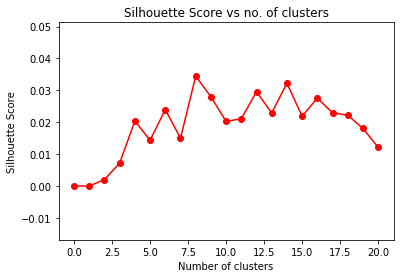

Optimal cluster number is  8

Number of Lines in Summarized text 
3

Italy to get economic action plan

Italian Prime Minister Silvio Berlusconi will unveil plans aimed at kickstarting the country's sputtering economy on Thursday night in Rome. The prime minister is scheduled to start the meeting at 1830 GMT. The country has been one of the eurozone's worst economic performers in recent years.

Document  53

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


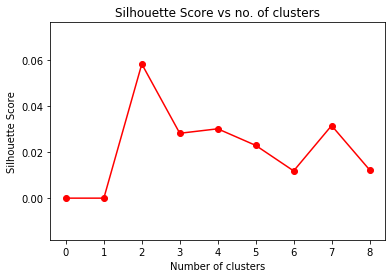

Optimal cluster number is  2

Number of Lines in Summarized text 
7

Weak dollar hits Reuters

Revenues at media group Reuters slipped 11% during 2004, mainly due to the weakness of the dollar, the group said. The company said it was optimistic about growth even as revenues slipped 11% from Â£3.24bn ($6.13bn) in 2003 to Â£2.89bn in 2004. Reuters beat profit forecasts, posting a 52% rise in profits for the year to Â£198m from the Â£130m seen a year earlier. Reuters also beat its savings target for 2004, delivering Â£234m of cuts. Under its three-year Fast Forward turnaround plan it had aimed to save Â£220m during the 12 months to 31 December. Reuters also managed to slow a decline in underlying revenues to 5.4% from 10.2% in 2003 and cut its debt back to Â£160m from Â£610m a year earlier. It added it was planning to deliver a further Â£105m of savings over the coming year - but said it expects to be hit with an Â£80m restructuring charge to pay for the cost of moving from Fleet Street t

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


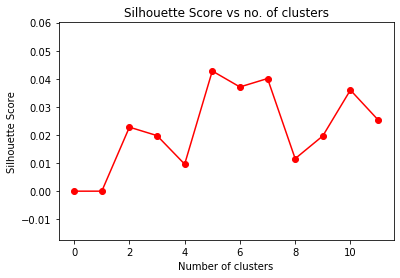

Optimal cluster number is  5

Number of Lines in Summarized text 
5

Hyundai to build new India plant

South Korea's Hyundai Motor has announced that it plans to build a second plant in India to meet the country's growing demand for cars. This will boost the annual production capacity of the company - India's second-largest car manufacturer - to 400,000 units. Demand in India has been driven by the poor state of public transport and the very low level of car ownership, analysts said. Figures show that currently only eight people per thousand are car owners. He said the company plans to use India as a base for exports to Europe, Latin America and the Middle East.

Document  55

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


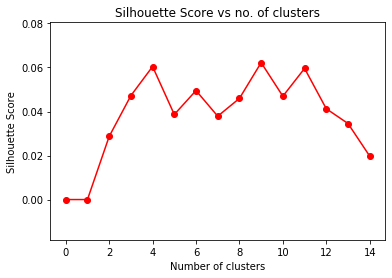

Optimal cluster number is  9

Number of Lines in Summarized text 
1

SA unveils 'more for all' budget

The South African government has put tax cuts and increased social spending at the centre of its latest budget.

Document  56

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


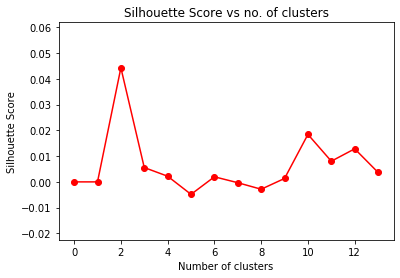

Optimal cluster number is  2

Number of Lines in Summarized text 
11

BMW drives record sales in Asia

BMW has forecast sales growth of at least 10% in Asia this year after registering record sales there in 2004. The luxury carmaker saw strong sales of its three marques - BMW, Mini and Rolls-Royce - in Asia last year after the launch of three new models. BMW sold nearly 95,000 cars in Asia last year, up 2.6% on 2003. BMW-brand sales rose 2.3% to 80,600 while sales of Mini models rose 3.6% to 14,800. There was also a significant increase in sales of Rolls-Royces on the continent. BMW sold more than 100 of the iconic models compared with just ten the previous year. The German carmaker is aiming to boost annual sales in Asia to 150,000 by 2008. "Here in Asia, we consider a double-digit increase in retail on the order of 10 to 15% to be realistic on the basis of current features," said Helmut Panke, BMW's group chief executive. China remains the main area of concern for BMW after sales the

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


17 18 19 20 

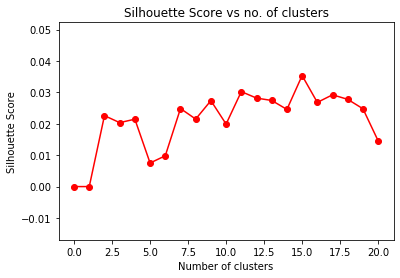

Optimal cluster number is  15

Number of Lines in Summarized text 
1

Economy 'stronger than forecast'

The UK economy probably grew at a faster rate in the third quarter than the 0.4% reported, according to Bank of England deputy governor Rachel Lomax.

Document  58

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


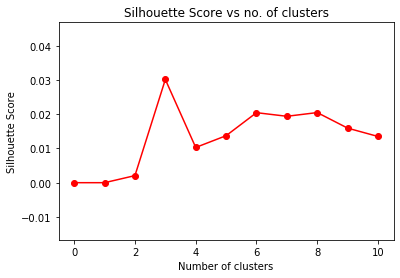

Optimal cluster number is  3

Number of Lines in Summarized text 
6

Electrolux to export Europe jobs

Electrolux saw its shares rise 14% on Tuesday after it said it would be shifting more of its manufacturing to low-cost countries. The Swedish firm, the world's largest maker of home appliances, said it is to relocate about 10 of its 27 plants in western Europe and North America. It did not say which facilities would be affected, but intends moving them to Asia, eastern Europe and Mexico. It makes lawn and garden products in Newton Aycliffe, and cookers and ovens in Spennymoor. The Newton Aycliffe plant could also be affected by Electrolux's separate announcement that it is to spin-off its outdoor products unit into a new separate company. Electrolux's subsidiary brands include AEG, Zanussi and Frigidaire.

Document  59

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


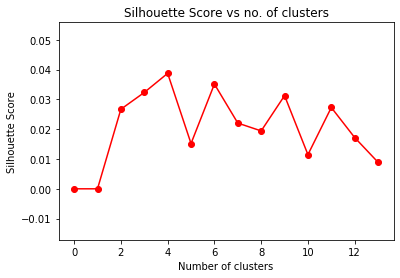

Optimal cluster number is  4

Number of Lines in Summarized text 
3

Worldcom ex-boss launches defence

Lawyers defending former WorldCom chief Bernie Ebbers against a battery of fraud charges have called a company whistleblower as their first witness. Mr Ebbers has pleaded not guilty to charges of fraud and conspiracy. Mr Ebbers could face a jail sentence of 85 years if convicted of all the charges he is facing.

Document  60

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


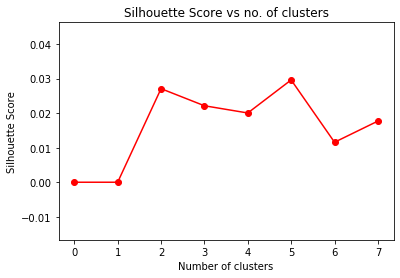

Optimal cluster number is  5

Number of Lines in Summarized text 
2

Insurance bosses plead guilty

Another three US insurance executives have pleaded guilty to fraud charges stemming from an ongoing investigation into industry malpractice. Mr Spitzer's investigation of the US insurance industry looked at whether companies rigged bids and fixed prices.

Document  61

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


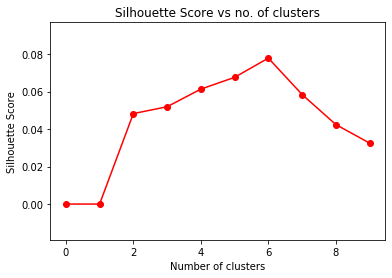

Optimal cluster number is  6

Number of Lines in Summarized text 
1

Further rise in UK jobless total

The UK's jobless total rose for the second month in a row in December, official figures show.

Document  62

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 

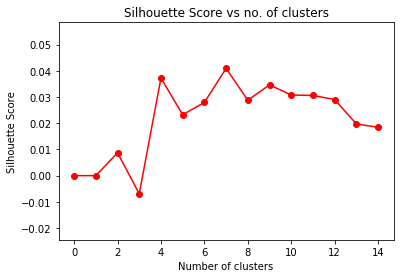

Optimal cluster number is  7

Number of Lines in Summarized text 
3

Wembley firm won't make a profit

Shares in Multiplex Group, which is building the new Wembley stadium, fell as much as 19% after it said it would not make any money on the project. Any profits would depend on the outcome of legal cases resulting from a change in steel contractor, it added. To recoup any profit from Wembley, where the firm changed its steel contractor due to a legal dispute, Multiplex will have to win legal claims against subcontractors.

Document  63

Number of Lines in Actual text
15
2

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 3 4 5 6 7 8 9 10 11 12 13 14 

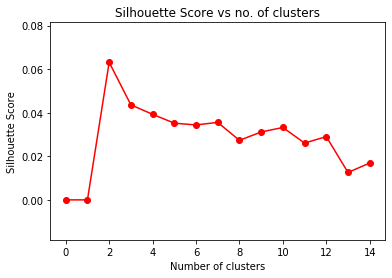

Optimal cluster number is  2

Number of Lines in Summarized text 
7

Cars pull down US retail figures

US retail sales fell 0.3% in January, the biggest monthly decline since last August, driven down by a heavy fall in car sales. The 3.3% fall in car sales had been expected, coming after December's 4% rise in car sales, fuelled by generous pre-Christmas special offers. Excluding the car sector, US retail sales were up 0.6% in January, twice what some analysts had been expecting. US retail spending is expected to rise in 2005, but not as quickly as in 2004. Steve Gallagher, US chief economist at SG Corporate & Investment Banking, said January's figures were "decent numbers". Excluding the car sector, sales rose by just 0.3%. Van Rourke, a bond strategist at Popular Securities, agreed that the latest retail sales figures were "slightly stronger than expected".

Document  64

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


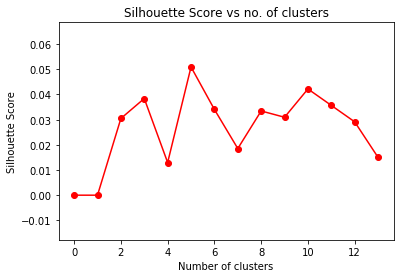

Optimal cluster number is  5

Number of Lines in Summarized text 
4

Lufthansa may sue over Bush visit

German airline Lufthansa may sue federal agencies for damages after the arrival of US president George W Bush disrupted flights. Mr Lamberty explained that the company did not plan to pursue Germany's air traffic controllers' organisation or the airport authority but wanted instead to see if it was possible to sue the German federal agencies that gave the orders. Central to the problem was that instead of half an hour, the arrival of President Bush on the German leg of his European tour took the best part of an hour, Lufthansa said. Despite the problems, Mr Lamberty said that it was not certain that Lufthansa would take legal action.

Document  65

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


14 15 

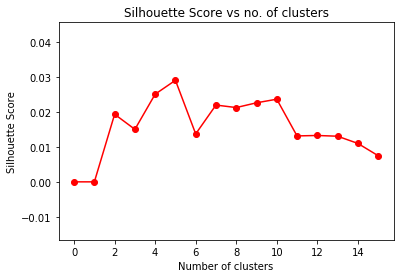

Optimal cluster number is  5

Number of Lines in Summarized text 
7

EU aiming to fuel development aid

European Union finance ministers meet on Thursday to discuss proposals, including a tax on jet fuel, to boost development aid for poorer nations. The policy makers are to ask for a report into how more development money can be raised, the EU said. Things have picked up, but some European and US companies are teetering on the brink of bankruptcy. At present, the fuel used by airlines enjoys either a very low tax rate or is untaxed in EU member states. said Ulrich Schulte-Strathaus, secretary general of the Association of European Airlines. The EU sought to allay the airlines' fears, stressing that Thursday's meeting was only a first step and that other proposals were also under consideration. Any tax would only be implemented after full consultation with the airlines, the EU said.

Document  66

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


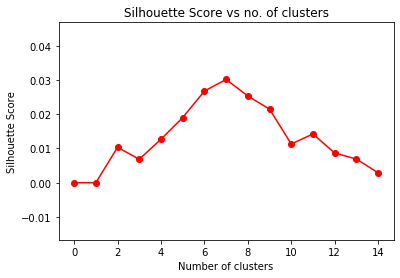

Optimal cluster number is  7

Number of Lines in Summarized text 
4

German business confidence slides

German business confidence fell in February knocking hopes of a speedy recovery in Europe's largest economy. Munich-based research institute Ifo said that its confidence index fell to 95.5 in February from 97.5 in January, its first decline in three months. "We're surprised that the Ifo index has taken such a knock," said DZ bank economist Bernd Weidensteiner. He said that despite the retreat, the index remained at a relatively high level and that he expected "a modest economic upswing" to continue.

Document  67

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


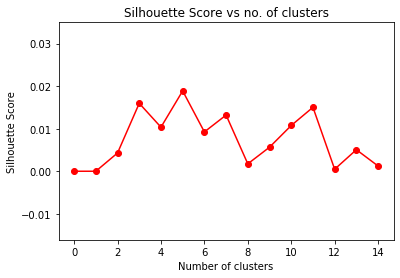

Optimal cluster number is  5

Number of Lines in Summarized text 
2

FAO warns on impact of subsidies

Billions of farmers' livelihoods are at risk from falling commodity prices and protectionism, the UN's Food & Agriculture Organisation has warned. As a result, the 2.5 billion people in the developing world who rely on farming face food insecurity.

Document  68

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


13 14 15 16 

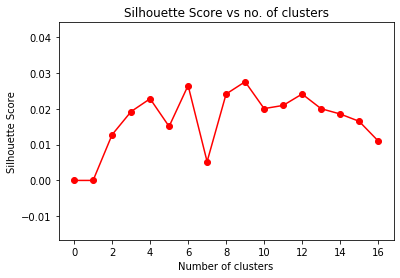

Optimal cluster number is  9

Number of Lines in Summarized text 
2

India seeks to boost construction

India has cleared a proposal allowing up to 100% foreign direct investment in its construction sector. The government proposal states that foreign investment of up to 100% will be allowed on the 'automatic route' in the construction sector, on projects including housing, hotels, resorts, hospitals and educational establishments.

Document  69

Number of Lines in Actual text
25
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


15 16 17 18 19 20 21 22 23 24 

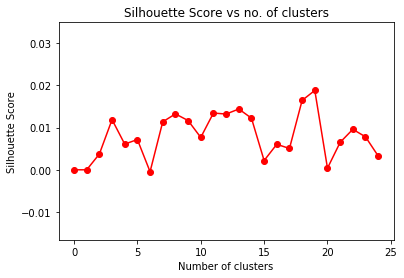

Optimal cluster number is  19

Number of Lines in Summarized text 
2

Boeing unveils new 777 aircraft

US aircraft firm Boeing has unveiled its new long-distance 777 plane, as it tries to regain its position as the industry's leading manufacturer. Both Boeing and Airbus have been taking orders for their new planes.

Document  70

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


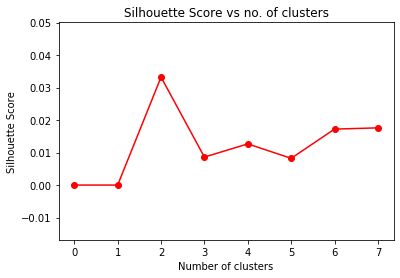

Optimal cluster number is  2

Number of Lines in Summarized text 
3

Circuit City gets takeover offer

Circuit City Stores, the second-largest electronics retailer in the US, has received a $3.25bn (Â£1.7bn) takeover offer. The bid has come from Boston-based private investment firm Highfields Capital Management, which already owns 6.7% of Circuit City's shares. Shares in the retailer were up 19.6% at $17.04 in Tuesday morning trading in New York following the announcement.

Document  71

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


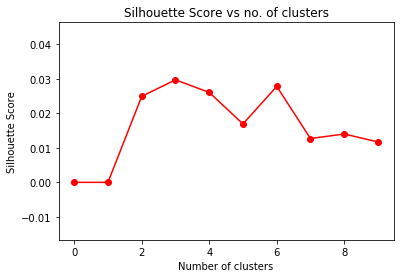

Optimal cluster number is  3

Number of Lines in Summarized text 
2

Japan turns to beer alternatives

Japanese brewers are increasingly making money from beer-flavoured drinks rather than beer itself

Beer and spirits are heavily taxed in Japan, driving breweries to search for alternatives. Suntory, meanwhile, is doing well with "Super Blue", which combines happoshu - an existing low-cost beer alternative made with malt and seawater - and shochu, a distilled alcohol derived from sweet potatoes or barley.

Document  72

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


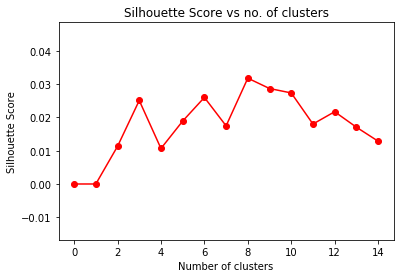

Optimal cluster number is  8

Number of Lines in Summarized text 
3

S Korean consumers spending again

South Korea looks set to sustain its revival thanks to renewed private consumption, its central bank says. Mr Park's statement came as the bank decided to keep interest rates at an all-time low of 3.25%. Economic growth in 2004 was about 4.7%, with the central bank predicting 4% growth this year.

Document  73

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


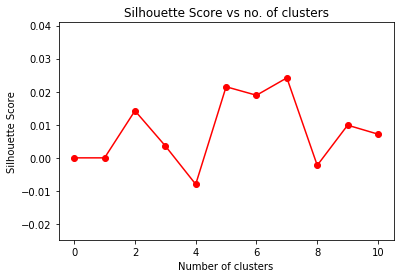

Optimal cluster number is  7

Number of Lines in Summarized text 
3

German growth goes into reverse

Germany's economy shrank 0.2% in the last three months of 2004, upsetting hopes of a sustained recovery. The figures confounded hopes of a 0.2% expansion in the fourth quarter in Europe's biggest economy. The ECB's mandate is to fight rising prices by boosting interest rates - and that could further threaten Germany's hopes of recovery.

Document  74

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


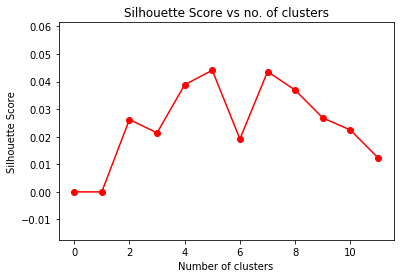

Optimal cluster number is  5

Number of Lines in Summarized text 
6

Turkey-Iran mobile deal 'at risk'

Turkey's investment in Iran's mobile industry looks set to be scrapped after its biggest mobile firm saw its investment there slashed by MPs. Iran's parliament voted by a large majority to cut Turkcell's stake in a new mobile network from 70% to 49%. Turkcell said the decision "increases the risks" attached to the project. Although the company's statement said it would continue to monitor developments, observers said they thought Turkcell was set to pull out of the $3bn deal. The company has said it is prepared to accept a minority stake if Iran will award it the mobile deal. Turkcell's mobile deal is the second Turkish investment in Iran to run into trouble.

Document  75

Number of Lines in Actual text
10
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


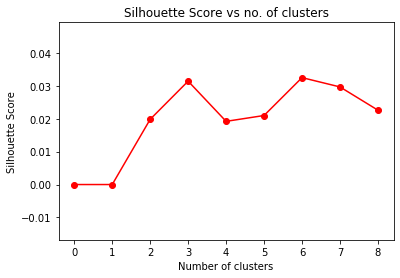

Optimal cluster number is  6

Number of Lines in Summarized text 
4

EU ministers to mull jet fuel tax

European Union finance ministers are meeting on Thursday in Brussels, where they are to discuss a controversial jet fuel tax. The EU said a tax would only be passed after full consultation with airlines. Global leaders have focused attention on poverty reduction and development at recent meetings of the G7 Group and World Economic Forum. Many EU ministers are thought to support the plan to tax jet fuel - tabled by France and Germany following the recent G7 meeting.

Document  76

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


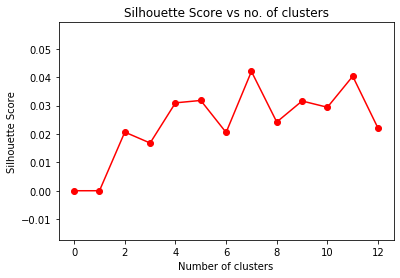

Optimal cluster number is  7

Number of Lines in Summarized text 
4

Palestinian economy in decline

Despite a short-lived increase in Palestinian jobs in 2003, the economy is performing well below its potential, said a World Bank report. But 104,000 new jobs were created last year during a brief easing of violence and closures. However, during the first half of this year, the Palestinian economy lost more than 22,000 jobs. The report said even more would be on the poverty line without an average of $950m a year from international donors, some of which goes towards job creation.

Document  77

Number of Lines in Actual text
22
2 3 4

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 

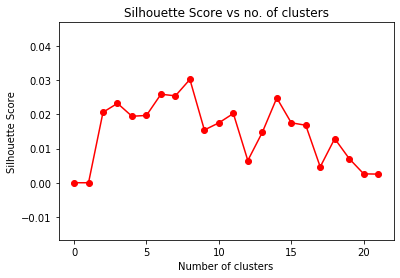

Optimal cluster number is  8

Number of Lines in Summarized text 
3

China had role in Yukos split-up

China lent Russia $6bn (Â£3.2bn) to help the Russian government renationalise the key Yuganskneftegas unit of oil group Yukos, it has been revealed. The Kremlin said on Tuesday that the $6bn which Russian state bank VEB lent state-owned Rosneft to help buy Yugansk in turn came from Chinese banks. Yugansk was sold for $9.3bn in an auction last year to help Yukos pay off part of a $27bn bill in unpaid taxes and fines.

Document  78

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


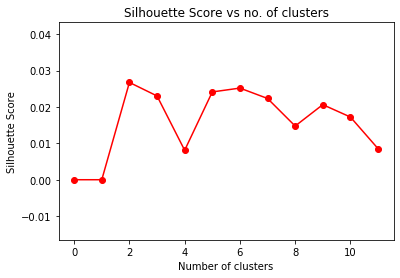

Optimal cluster number is  2

Number of Lines in Summarized text 
2

Deadline nears for Fiat-GM deal

Fiat and General Motors (GM) have until midnight on 1 February to settle a disagreement over a potential takeover. The 2000 deal resulted from a race between GM and DaimlerChrysler to ally with Fiat.

Document  79

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


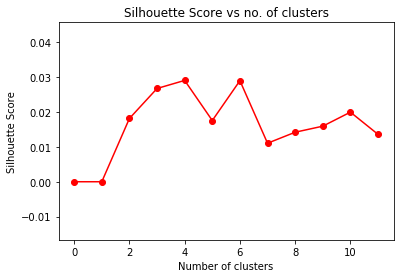

Optimal cluster number is  4

Number of Lines in Summarized text 
3

ID theft surge hits US consumers

Almost a quarter of a million US consumers complained of being targeted for identity theft in 2004, official figures suggest. The Federal Trade Commission said two in five of the 635,173 reports it had from consumers concerned ID fraud. Outside the field of ID theft, 53% of the near-400,000 complaints were internet-related.

Document  80

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


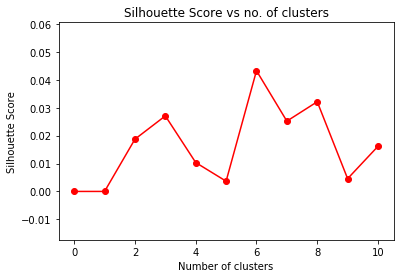

Optimal cluster number is  6

Number of Lines in Summarized text 
3

Argentina, Venezuela in oil deal

Argentina and Venezuela have extended a food-for-oil deal, which helped the former to overcome a severe energy crisis last year. Last year, Argentina's severe energy crisis forced President Kirchner to suspend gas exports to Chile. Argentina fears that rising demand could spark another crisis and wants to prevent it by signing this deal.

Document  81

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


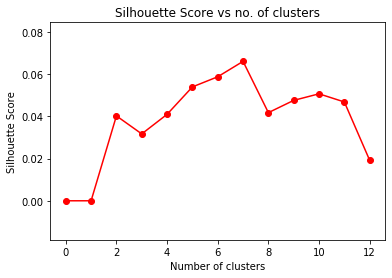

Optimal cluster number is  7

Number of Lines in Summarized text 
3

BMW to recall faulty diesel cars

BMW is to recall all cars equipped with a faulty diesel fuel-injection pump supplied by parts maker Robert Bosch. Audi and Mercedes Benz were also supplied with the defective diesel fuel-injection pumps but neither of them have to recall any vehicles. It is to close the Mercedes factory in Sindelfingen on Monday and Tuesday.

Document  82

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


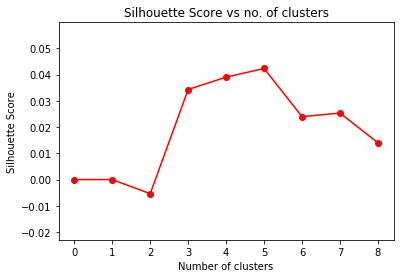

Optimal cluster number is  5

Number of Lines in Summarized text 
1

Takeover rumour lifts Exel shares

Shares in storage and delivery firm Exel closed up 9% at a two-and-a-half year high on Tuesday on speculation it is to receive an imminent takeover bid.

Document  83

Number of Lines in Actual text
24
2 3 4 5 6 7 8 9 10 11 12 13 14 15

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 16 17 18 19 20 21 22 23 

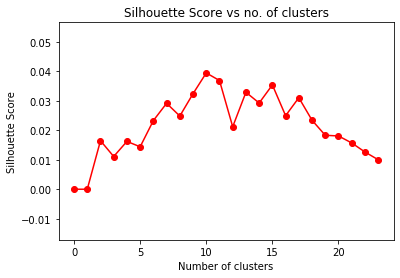

Optimal cluster number is  10

Number of Lines in Summarized text 
5

Yukos accused of lying to court

Russian oil firm Yukos lied to a US court in an attempt to stop the Russian government selling off its key production unit, the court has heard. By doing so, he said, the firm had intended to reinforce its US presence - and thus its chances of getting its case heard in US courts. It had agreed to loan to an arm of Russian state gas firm Gazprom the money to bid for Yuganskneftegaz, as the Yukos unit is formally known. Analysts have questioned whether a US court has any jurisdiction over Russian companies, while Moscow officials have dismissed Yukos' legal wrangling as meaningless. Yukos claims that the rights of its shareholders have been ignored and that is has been punished for the political ambitions of its founder Mikhail Khodorkovsky.

Document  84

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


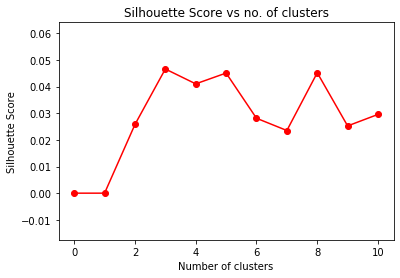

Optimal cluster number is  3

Number of Lines in Summarized text 
4

Mexican in US send $16bn home

Mexican labourers living in the US sent a record $16.6bn (Â£8.82bn) home last year. Better records and greater prosperity of Mexican expatriates in the US are the main reasons behind the increase. About 10 million Mexicans live in the US, where there are 16 million citizens of Mexican origin. Last year, there were 50.9 million transactions, with an average value of $327 per remittance, the bank said.

Document  85

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


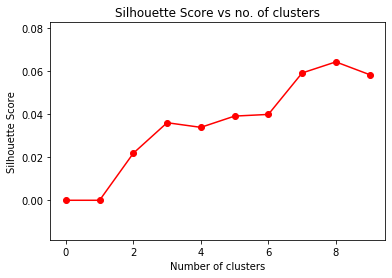

Optimal cluster number is  8

Number of Lines in Summarized text 
1

Home loan approvals rising again

The number of mortgages approved in the UK has risen for the first time since May last year, according to lending figures from the Bank of England.

Document  86

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


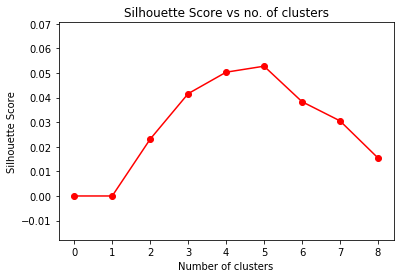

Optimal cluster number is  5

Number of Lines in Summarized text 
2

Manufacturing recovery 'slowing'

UK manufacturing grew at its slowest pace in one-and-a-half years in January, according to a survey. The survey is more upbeat than official figures - which suggest that manufacturing is in recession - but analysts said the survey did suggest that the manufacturing recovery was running out of steam.

Document  87

Number of Lines in Actual text
18
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 13 14 15 16 17 

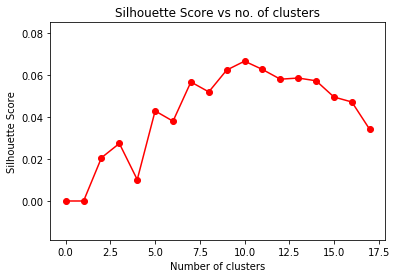

Optimal cluster number is  10

Number of Lines in Summarized text 
2

Worldcom boss 'left books alone'

Former Worldcom boss Bernie Ebbers, who is accused of overseeing an $11bn (Â£5.8bn) fraud, never made accounting decisions, a witness has told jurors. Whatever his abilities, Mr Ebbers transformed Worldcom from a relative unknown into a $160bn telecoms giant and investor darling of the late 1990s.

Document  88

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


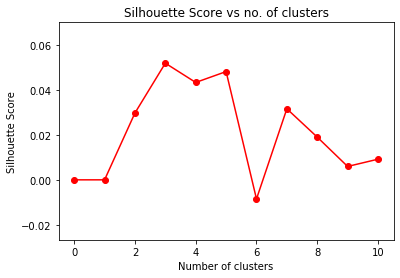

Optimal cluster number is  3

Number of Lines in Summarized text 
5

Metlife buys up Citigroup insurer

US banking giant Citigroup has sold its Travelers Life & Annuity insurance arm to Metlife for $11.5bn (Â£6.1bn). The sale is a further move by Citigroup away from its 1990s strategy of offering every financial service - insurance, broking and banking. Profit growth in the insurance market has not matched expansion at Citigroup's other businesses. Under the agreement, Metlife will be able to sell its products through Citigroup over the next 10 years. Travelers had sales of $5.2bn in 2004 and made a profit of $901m.

Document  89

Number of Lines in Actual text
20
2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


17 18 19 

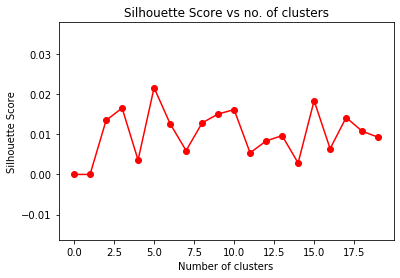

Optimal cluster number is  5

Number of Lines in Summarized text 
7

Europe blames US over weak dollar

European leaders have openly blamed the US for the sharp rise in the value of the euro. US officials were talking up the dollar, they said, but failing to take action to back up their words. The dollar is within touching distance of an all-time low reached earlier in November. At 0619 GMT on Tuesday, the dollar was up slightly at just above $1.29 to the euro, and buying 105.6 yen in Tokyo. And the European Union's monetary affairs commissioner, made it clear that action was necessary. Not only does it boost US exports, but it also makes the budget deficit easier to fund. On the other hand, slower European exports would mean slower EU growth - potentially reducing the demand for US goods.

Document  90

Number of Lines in Actual text
18
2 3 4 5 6

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 7 8 9 10 11 12 13 14 15 16 17 

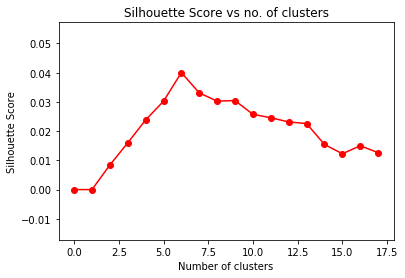

Optimal cluster number is  6

Number of Lines in Summarized text 
3

French wine gets 70m euro top-up

The French government is to hand its struggling wine industry 70m euros ($91m) in aid to help it battle falling sales and damaging overproduction. The bulk of the money - about 40m euros - will be offered in the form of preferential loans to heavily indebted producers to enable them to reschedule their payments. Efforts to promote French wine abroad are to be boosted by an extra 3.5m euros in funding.

Document  91

Number of Lines in Actual text
16
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 11 12 13 14 15 

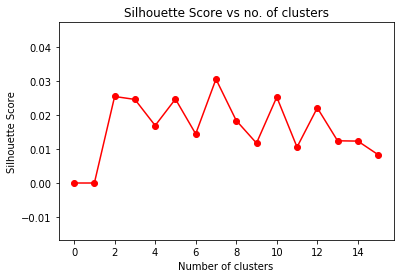

Optimal cluster number is  7

Number of Lines in Summarized text 
4

Russia gets investment blessing

Soaring oil sales and a budget surplus mean Russian debt is no longer a risky investment, one of the world's leading credit rating agencies says. Gold and foreign currency reserves of $119bn beat its foreign public debt of some $113bn. The other two major ratings agencies - Fitch and Moody's have long since upped their rating of Russia's sovereign debt. But the agency made it clear that the improved rating did not mean that the risks were a thing of the past.

Document  92

Number of Lines in Actual text
18
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 11 12 13 14 15 16 17 

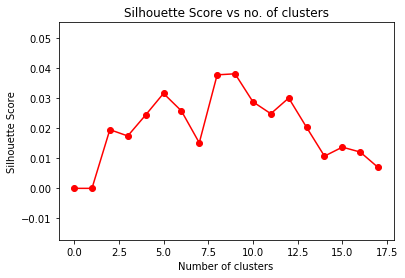

Optimal cluster number is  9

Number of Lines in Summarized text 
2

Iranian MPs threaten mobile deal

Turkey's biggest private mobile firm could bail out of a $3bn ($1.6bn) deal to build a network in Iran after MPs there slashed its stake in the project. The new operator planned to offer subscriptions for about $180, well below the existing firm's $500 price tag.

Document  93

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 13 

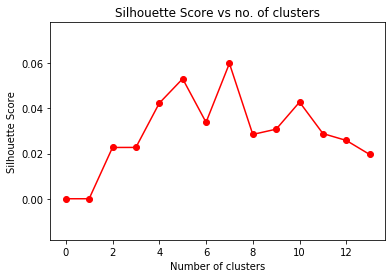

Optimal cluster number is  7

Number of Lines in Summarized text 
3

Argentina closes $102.6bn debt swap

Argentina is set to close its $102.6bn (Â£53.51bn) debt restructuring offer for bondholders later on Friday, with the government hopeful that most creditors will accept the deal. The country has been in default on the $102.6bn - based on an original debt of $81.8bn plus interest - for the past three years. By 18 February, creditors holding $41bn - or 40% of the total debt - had accepted the offer.

Document  94

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


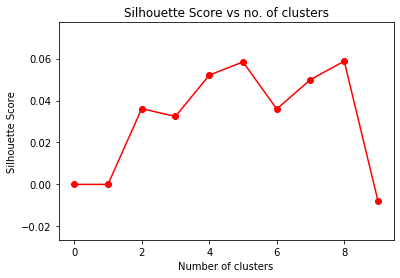

Optimal cluster number is  8

Number of Lines in Summarized text 
1

US economy shows solid GDP growth

The US economy has grown more than expected, expanding at an annual rate of 3.8% in the last quarter of 2004.

Document  95

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


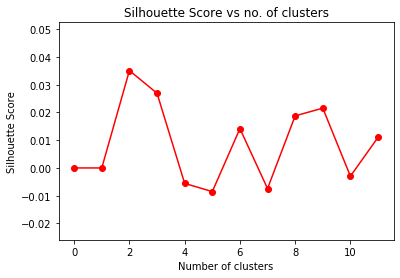

Optimal cluster number is  2

Number of Lines in Summarized text 
7

Profits slide at India's Dr Reddy

Profits at Indian drugmaker Dr Reddy's fell 93% as research costs rose and sales flagged. The firm said its profits were 40m rupees ($915,000; Â£486,000) for the three months to December on sales which fell 8% to 4.7bn rupees. Research and development of new drugs is continuing apace, with R&D spending rising 37% to 705m rupees - a key cause of the decrease in profits alongside the fall in sales. Sales in Dr Reddy's generics business fell 8.6% to 966m rupees. Another staple of the the firm's business, the sale of ingredients for drugs, also performed poorly. Sales were down more than 25% from the previous year to 1.4bn rupees in the face of strong competition both at home, and in the US and Europe. Dr Reddy's Indian competitors are gathering strength although they too face heavy competitive pressures.

Document  96

Number of Lines in Actual text
7
2 3 4 5 6 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


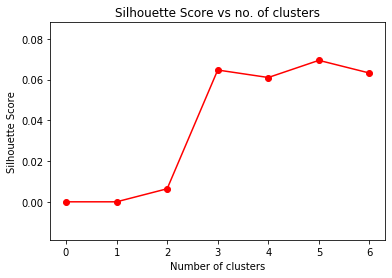

Optimal cluster number is  5

Number of Lines in Summarized text 
2

Burren awarded Egyptian contracts

British energy firm Burren Energy has been awarded two potentially lucrative oil exploration contracts in Egypt. Burren Energy already has a presence in Egypt, having been awarded an exploration contract last year.

Document  97

Number of Lines in Actual text
23
2 3 4 5 6 7 8 9 10 11 12

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 13 14 15 16 17 18 19 20 21 22 

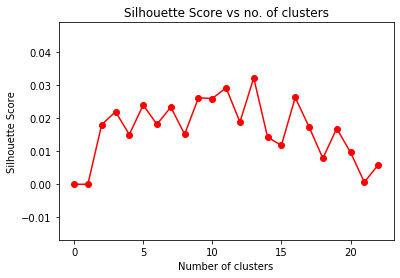

Optimal cluster number is  13

Number of Lines in Summarized text 
2

'Strong dollar' call halts slide

The US dollar's slide against the euro and yen has halted after US Treasury Secretary John Snow said a strong dollar was "in America's interest". Policy makers in Europe have called the dollar's slide "brutal" and have blamed the strength of the euro for dampening economic growth.

Document  98

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


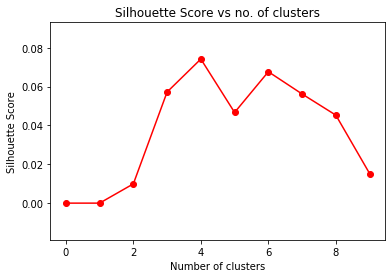

Optimal cluster number is  4

Number of Lines in Summarized text 
3

IMF 'cuts' German growth estimate

The International Monetary Fund is to cut its 2005 growth forecast for the German economy from 1.8% to 0.8%, the Financial Times Deutschland reported. The IMF will also reduce its growth estimate for the 12-member eurozone economy from 2.2% to 1.6%, the newspaper reported. In September, the IMF had said that German growth for the current year would be 1.8%.

Document  99

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


15 16 

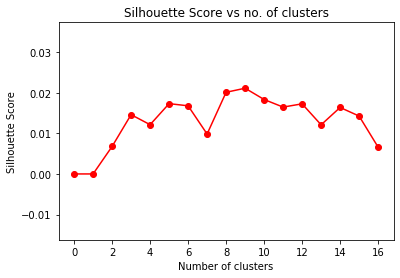

Optimal cluster number is  9

Number of Lines in Summarized text 
2

GM, Ford cut output as sales fall

US car firms General Motors (GM) and Ford have been forced to cut production in the face of falling car sales. The slump in sales prompted the group to cut production in North America by 3% - it has already reduced output by around 9% in the face of growing stockpiles.

Document  100

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


13 14 15 

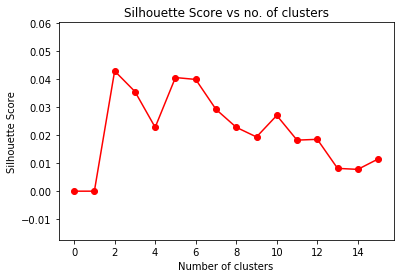

Optimal cluster number is  2

Number of Lines in Summarized text 
10

Ebbers denies WorldCom fraud

Former WorldCom chief Bernie Ebbers has denied claims that he knew accountants were doctoring the books at the firm. Speaking in court, Mr Ebbers rejected allegations he pressured ex-chief financial officer Scott Sullivan to falsify company financial statements. Mr Ebbers has denied charges of fraud and conspiracy. During his second day of questioning in the New York trial Mr Ebbers played down his working relationship with Mr Sullivan and denied he frequently met him to discuss company business when questioned by the prosecution. Mr Ebbers relationship to Mr Sullivan is key to the case surrounding financial corruption that led to the collapse of the firm in 2002 following the discovery of an $11bn accounting fraud. The prosecution's star witness is Mr Sullivan, one of six WorldCom executives indicted in the case, He has pleaded guilty to fraud and appeared as a prosecution witness as pa

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


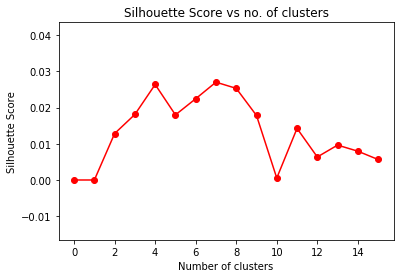

Optimal cluster number is  7

Number of Lines in Summarized text 
6

Australia rates at four year high

Australia is raising its benchmark interest rate to its highest level in four years despite signs of a slowdown in the country's economy. The Reserve Bank of Australia lifted interest rates 0.25% to 5.5%, their first upwards move in more than a year. Consumer spending remains strong, however, and the Bank is concerned about growing inflationary pressures. At 2.6%, inflation remains within the Bank's 2-3% target range. The Australian government said the economy remained strong with unemployment at a near 30 year low. "That 1.5% annual growth rate is the lowest we have seen since the post-election slump we saw back in 2000-1," said Michael Blythe, chief economist at the Commonwealth Bank of Australia.

Document  102

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


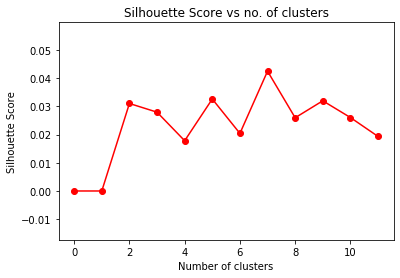

Optimal cluster number is  7

Number of Lines in Summarized text 
1

US company admits Benin bribery

A US defence and telecommunications company has agreed to pay $28.5m after admitting bribery in the West African state of Benin.

Document  103

Number of Lines in Actual text
20
2 3 4

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 

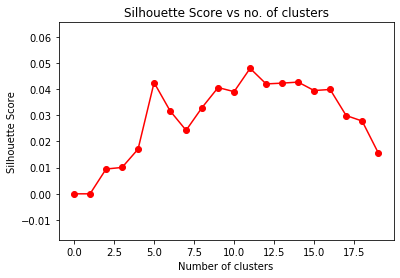

Optimal cluster number is  11

Number of Lines in Summarized text 
3

US insurer Marsh cuts 2,500 jobs

Up to 2,500 jobs are to go at US insurance broker Marsh & McLennan in a shake up following bigger-than-expected losses. Looking ahead, Mr Cherkasky forecast profitable growth for the year ahead "with an operating margin in the upper-teens, and with the opportunity for further margin expansion". "As a result, we are ready to put these matters behind us and move ahead in 2005 to restore the trust our clients have placed in us and to rebuild shareholder value," Mr Cherkasky said.

Document  104

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12 13 14 15 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


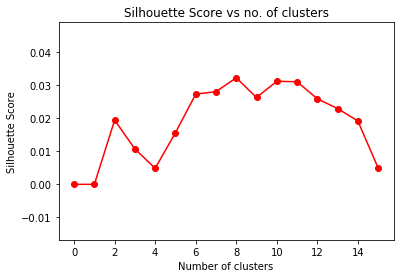

Optimal cluster number is  8

Number of Lines in Summarized text 
2

US seeks new $280bn smoker ruling

The US Justice Department is to try to overturn a court ruling that threw out its claim for $280bn (Â£149bn) in damages from tobacco firms. They also said that they have met many of the government's demands laid out in a landmark $206bn settlement hammered out in 1998 with 46 states.

Document  105

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


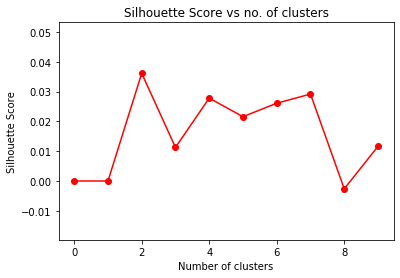

Optimal cluster number is  2

Number of Lines in Summarized text 
9

Budget Aston takes on Porsche

British car maker Aston Martin has gone head-to-head with Porsche's 911 sports cars with the launch of its cheapest model yet. With a price tag under Â£80,000, the V8 Vantage is tens of thousands of pounds cheaper than existing Aston models. The Vantage is "the most important car in the history of our company", said Aston's chief executive Ulrich Bez. Aston - whose cars were famously used by James Bond - will unveil the Vantage at the Geneva Motor Show on Thursday. Mr Bez - himself a former executive at rival Porsche - said the new car was the company's "most affordable car ever and makes the brand accessible". This in turn would make Aston Martin "globally visible, but still very, very exclusive", he added. First shown as a concept car at the 2003 North American International Auto Show in Detroit, the V8 Vantage will be available in the UK in late summer. Development costs for the Vanta

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


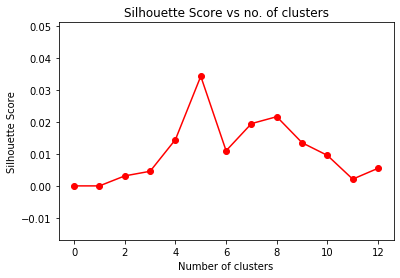

Optimal cluster number is  5

Number of Lines in Summarized text 
2

Golden rule 'intact' says ex-aide

Chancellor Gordon Brown will meet his golden economic rule "with a margin to spare", according to his former chief economic adviser. He said he hoped more would be done to build on current tax credit rules.

Document  107

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


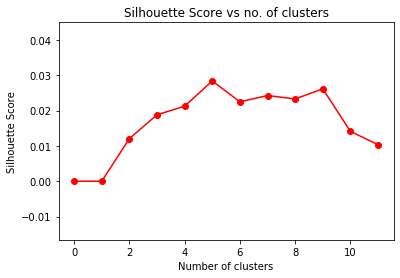

Optimal cluster number is  5

Number of Lines in Summarized text 
4

Liberian economy starts to grow

The Liberian economy started to grow in 2004, but "sustained and deep reform efforts" are needed to ensure long term growth, the International Monetary Fund (IMF) has said. The IMF said Liberia's economy started to grow last year thanks to a "continued strong recovery in rubber production, domestic manufacturing and local services including post-conflict reconstruction". In particular, it pointed to mystery surrounding the sale of iron ore stockpiles and the alleged disappearance of some import and export permits. These matters are now being investigated by the Liberian authorities and the IMF has called for their findings to be made public.

Document  108

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


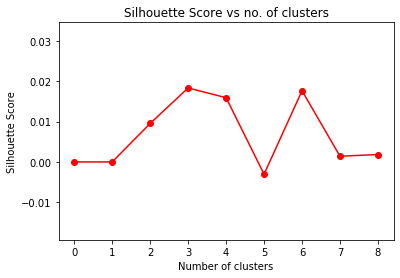

Optimal cluster number is  3

Number of Lines in Summarized text 
1

Slowdown hits US factory growth

US industrial production increased for the 21st month in a row in February, but at a slower pace than in January, official figures show.

Document  109

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


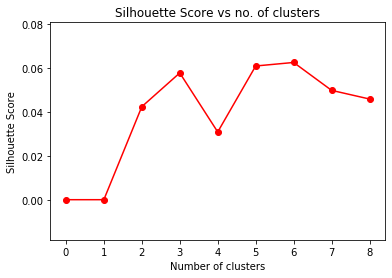

Optimal cluster number is  6

Number of Lines in Summarized text 
3

Lufthansa flies back to profit

German airline Lufthansa has returned to profit in 2004 after posting huge losses in 2003. The board of Lufthansa has recommended paying a 2004 dividend of 0.30 euros per share. In 2003, shareholders did not get a dividend.

Document  110

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


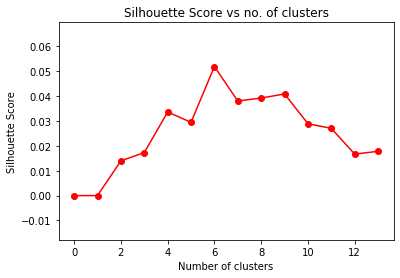

Optimal cluster number is  6

Number of Lines in Summarized text 
2

Japanese growth grinds to a halt

Growth in Japan evaporated in the three months to September, sparking renewed concern about an economy not long out of a decade-long trough. The government may now find it more difficult to raise taxes, a policy it will have to implement when the economy picks up to help deal with Japan's massive public debt.

Document  111

Number of Lines in Actual text
25
2 3 4 5 6 7 8 9 10 11

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 12 13 14 15 16 17 18 19 20 21 22 23 24 

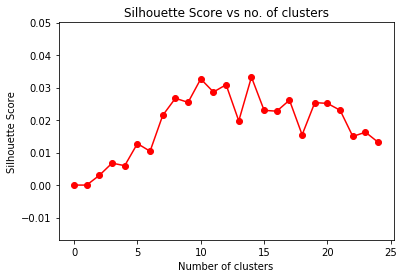

Optimal cluster number is  14

Number of Lines in Summarized text 
2

Unilever shake up as profit slips

Anglo-Dutch consumer goods giant Unilever is to merge its two management boards after reporting "unsatisfactory" earnings for 2004. Oil giant Shell last year dismantled its dual-ownership structure, after a series of problems relating to the size of its oil reserves that hammered its share price and led to the resignation of key board members.

Document  112

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


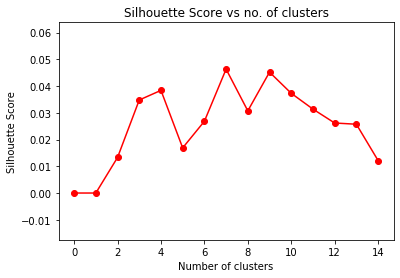

Optimal cluster number is  7

Number of Lines in Summarized text 
3

France Telecom gets Orange boost

Strong growth in subscriptions to mobile phone network Orange has helped boost profits at owner France Telecom. Orange added more than five million new customers in 2004, leading to a 10% increase in its revenues. Orange enjoyed strong growth outside France and the United Kingdom - its core markets - swelling its subscriber base to 5.4 million.

Document  113

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 13 14 15 16 

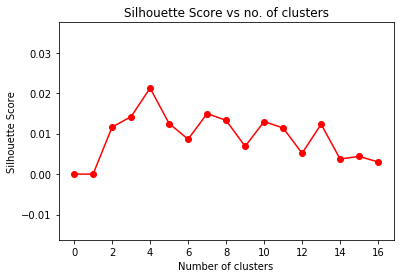

Optimal cluster number is  4

Number of Lines in Summarized text 
8

Brussels raps mobile call charges

The European Commission has written to the mobile phone operators Vodafone and T-Mobile to challenge "the high rates" they charge for international roaming. In letters sent to the two companies, the Commission alleged the firms were abusing their dominant market position in the German mobile phone market. "We believe the roaming market is competitive and we expect to resist the charges," said a Vodafone spokesman. The Commission's investigation into Vodafone and Deutsche Telekom's T-Mobile centres on the tariffs the two companies charge foreign mobile operators to access their networks when subscribers of those foreign operators use their mobile phones in Germany. The Commission believes these wholesale prices are too high and that the excess is passed on to consumers. "The Commission aims to ensure that European consumers are not overcharged when they use their mobile phones on thei

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


13 14 15 16 17 

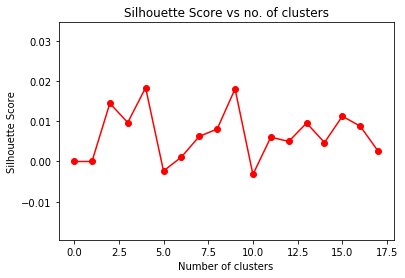

Optimal cluster number is  4

Number of Lines in Summarized text 
3

WorldCom director admits lying

The former chief financial officer at US telecoms firm WorldCom has admitted before a New York court that he used to lie to fellow board members. Mr Ebbers, 63, has always insisted that he was unaware of any hidden shortfalls in WorldCom's finances. Mr Sullivan also rejects a suggestion that he had once told fellow WorldCom board member Bert Roberts that Mr Ebbers was unaware of the accounting fraud at WorldCom.

Document  115

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


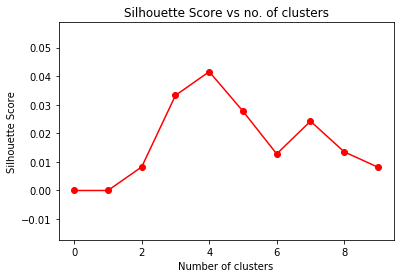

Optimal cluster number is  4

Number of Lines in Summarized text 
3

Glaxo aims high after profit fall

GlaxoSmithKline saw its profits fall 9% last year to Â£6.2bn ($11.5bn), but Europe's biggest drugmaker says a recovery during 2005 is on the way. In early afternoon trade in London the company share price was down 1% at 1218 pence. Mr Garnier said the company had absorbed over Â£1.5bn of lost sales to generics but still managing to grow the business.

Document  116

Number of Lines in Actual text
11
2 3 4 5

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 6 7 8 9 10 

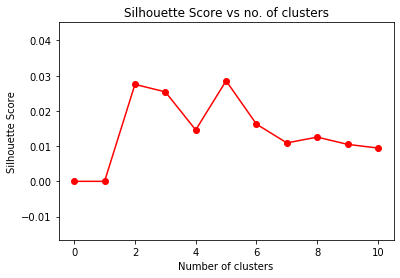

Optimal cluster number is  5

Number of Lines in Summarized text 
3

Japan bank shares up on link talk

Shares of Sumitomo Mitsui Financial (SMFG), and Daiwa Securities jumped amid speculation that two of Japan's biggest financial companies will merge. Combining SMFG, Japan's third-biggest lender, and Daiwa, the country's second-largest brokerage firm, would create a company with assets of more than $1,000bn (Â£537bn). Analysts said that consolidation in Japan's financial sector was likely to continue and that it was likely to have a positive impact on earnings.

Document  117

Number of Lines in Actual text
21
2 3 4 5 6 7 8 9 10 11 12

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 13 14 15 16 17 18 19 20 

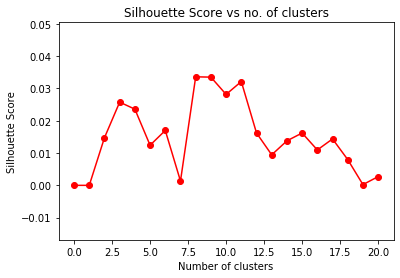

Optimal cluster number is  8

Number of Lines in Summarized text 
2

Car giant hit by Mercedes slump

A slump in profitability at luxury car maker Mercedes has prompted a big drop in profits at parent DaimlerChrysler. Mercedes faces fierce competition in the luxury car sector from BMW and but hopes to revive its fortunes by 2006.

Document  118

Number of Lines in Actual text
12
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


9 10 11 

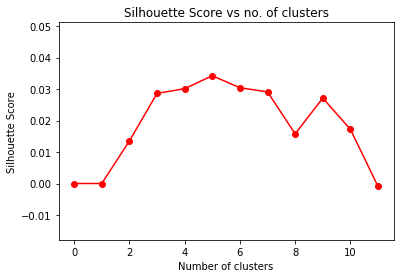

Optimal cluster number is  5

Number of Lines in Summarized text 
1

Ericsson sees earnings improve

Telecoms equipment supplier Ericsson has posted a rise in fourth quarter profits thanks to clients like Deutsche Telekom upgrade their networks.

Document  119

Number of Lines in Actual text
21
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


13 14 15 16 17 18 19 20 

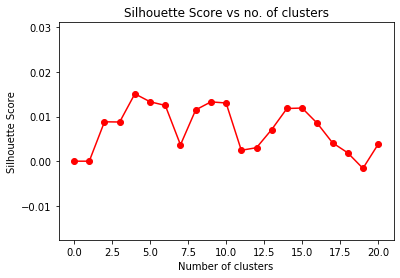

Optimal cluster number is  4

Number of Lines in Summarized text 
5

Bank opts to leave rates on hold

The Bank of England has left interest rates on hold at 4.75% for a sixth month in a row. The Bank's Monetary Policy Committee (MPC) decided to take no action amid mixed signals from the economy. But some economists predict a further rise in the cost of borrowing will come later this year. Economists see next week's inflation report from the MPC as key in assessing whether a further interest rate rise is necessary to keep the economy in check. Business groups welcomed the MPC's widely-expected move to leave rates on hold and cautioned against further rises.

Document  120

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


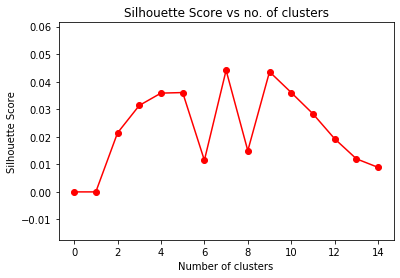

Optimal cluster number is  7

Number of Lines in Summarized text 
3

Nigeria to boost cocoa production

The government of Nigeria is hoping to triple cocoa production over the next three years with the launch of an ambitious development programme. Nigeria is currently the world's fourth-largest cocoa producer. Cocoa was the main export product in Nigeria during the 1960s.

Document  121

Number of Lines in Actual text
23
2 3 4 5 6 7 8 9 10 11 12 13 14 15 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


16 17 18 19 20 21 22 

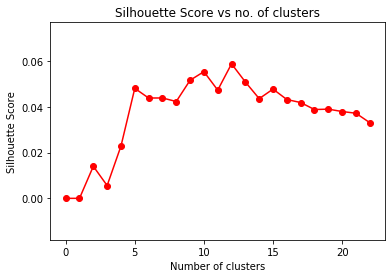

Optimal cluster number is  12

Number of Lines in Summarized text 
3

US interest rates increased to 2%

US interest rates are to rise for the fourth time in five months, in a widely anticipated move. The further rise in US rates is unlikely to have a direct bearing on UK monetary policy. In a report published on Wednesday, the Bank said that with rates at their current level, inflation would rise to its 2% target within two years.

Document  122

Number of Lines in Actual text
18
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 13 14 15 16 17 

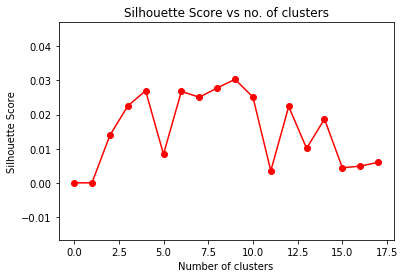

Optimal cluster number is  9

Number of Lines in Summarized text 
3

US bank in $515m SEC settlement

Five Bank of America subsidiaries have agreed to pay a total of $515m (Â£277m) to settle an investigation into fraudulent trading share practices. In both cases, it said there had been secret deals to engage in market timing in mutual fund shares. It was made up of $250m to pay back gains from market timing, and $125m in penalties.

Document  123

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


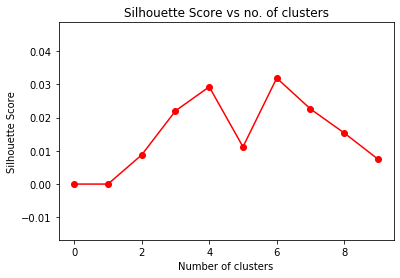

Optimal cluster number is  6

Number of Lines in Summarized text 
2

Train strike grips Buenos Aires

A strike on the Buenos Aires underground has caused traffic chaos and large queues at bus stops in the Argentine capital. Some tube commuters have not hidden their frustration at the ongoing strike and have broken the windows of the underground trains, according to the local press.

Document  124

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


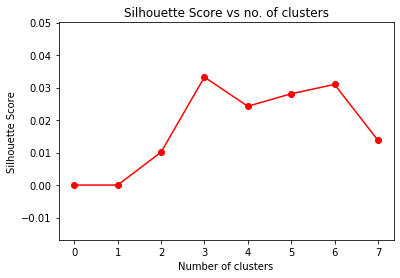

Optimal cluster number is  3

Number of Lines in Summarized text 
4

Bargain calls widen Softbank loss

Japanese communications firm Softbank has widened losses after heavy spending on a new cut-rate phone service. The service, launched in December and dubbed "Otoku" or "bargain", has had almost 900,000 orders, Softbank said. But without the Otoku marketing spend it would have made a profit - and expects to move into the black in 2006. It was born in the 1990s tech boom, investing widely and becoming a fast-rising star, till the end of the tech bubble hit it hard.

Document  125

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


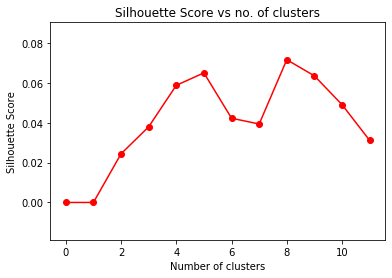

Optimal cluster number is  8

Number of Lines in Summarized text 
1

WMC profits up amid bid criticism

Australian mining firm WMC Resources has seen a fivefold rise in profits while continuing to be the target of a hostile takeover bid.

Document  126

Number of Lines in Actual text
19
2 3 4 5 6 7 8 9 10 11 12 13 14 15 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


16 17 18 

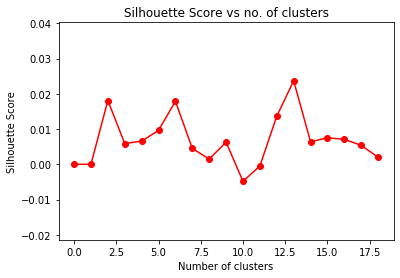

Optimal cluster number is  13

Number of Lines in Summarized text 
1

Barclays profits hit record level

Barclays, the UK's third-biggest bank, has seen annual pre-tax profits climb to record levels boosted by a sharp rise in business at its investment arm.

Document  127

Number of Lines in Actual text
21
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


13 14 15 16 17 18 19 

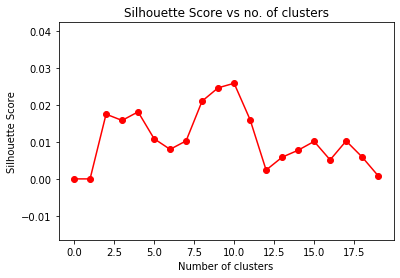

Optimal cluster number is  10

Number of Lines in Summarized text 
4

Yukos owner sues Russia for $28bn

The majority owner of embattled Russian oil firm Yukos has sued the Russian government for $28.3bn (Â£15.2bn). The Kremlin last year seized and sold Yukos' main production arm, Yugansk, to state-run oil group Rosneft for $9.3bn to offset a massive back tax bill. It accused the firm of using a web of offshore firms to avoid its tax liabilities, and the courts sent in bailiffs to freeze Yukos accounts and seize Yugansk. Yukos is still waiting to see what will happen to its filing in a US court for bankruptcy protection.

Document  128

Number of Lines in Actual text
16
2

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 3 4 5 6 7 8 9 10 11 12 13 14 15 

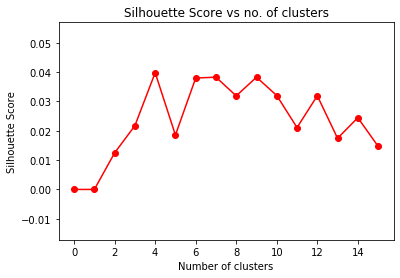

Optimal cluster number is  4

Number of Lines in Summarized text 
6

Qantas sees profits fly to record

Australian airline Qantas has posted a record fiscal first-half profit thanks to cost-cutting measures. Net profit in the six months ending 31 December rose 28% to A$458.4m ($357.6m; Â£191m) from a year earlier. Analysts expected a figure closer to A$431m. Sales will dip by at least A$30m after the Indian ocean tsunami devastated many holiday destinations, Qantas said. Analysts have forecast full-year profit will rise about 11% to around A$720 million ($563 million). During the first six months of the fiscal year, Qantas made savings of A$245m, and is on track to top its target of A$500m for the full year.

Document  129

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


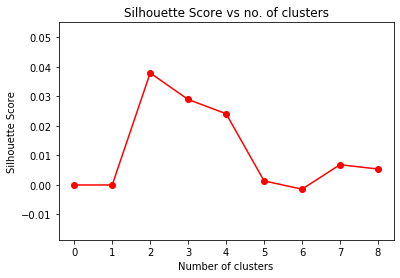

Optimal cluster number is  2

Number of Lines in Summarized text 
6

Iraq to invite phone licence bids

Iraq is to invite bids for two telephone licences, saying it wants to significantly boost nationwide coverage over the next decade. Bids have been invited from local, Arab and foreign companies, Iraq's Ministry of Communications said. The firms will install and operate a fixed phone network, providing voice, fax and internet services. The ministry said that it wanted to increase Iraq's "very low telephone service penetration rate from about 4.5% today to about 25% within 10 years." It also is planning a road-show for investors in Amman, Jordan. The ministry said it would base its selection on criteria including the speed of implementation, tariff rates, coverage, and the firm's experience and financial strength.

Document  130

Number of Lines in Actual text
20
2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


18 19 

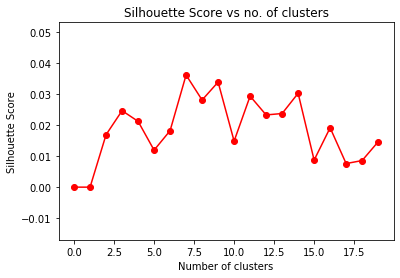

Optimal cluster number is  7

Number of Lines in Summarized text 
4

Aviation firms eye booming India

India's defence minister has opened the country's Aero India 2005 air show with an invitation for global aerospace firms to outsource jobs to the nation. More than 240 civil and military aerospace firms from 31 countries are attending the show. Giants such Boeing and Airbus - on the civil aviation front - as well as Lockheed Martin and France's Snecma - on the military side - are some of the firms attending the show. But the Indian Air Force is also considering proposals from other foreign firms such as France's Dassault Aviation, Sweden's Saab and Russia's Mikoyan-Gurevich.

Document  131

Number of Lines in Actual text
23
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


14 15 16 17 18 19 20 21 22 

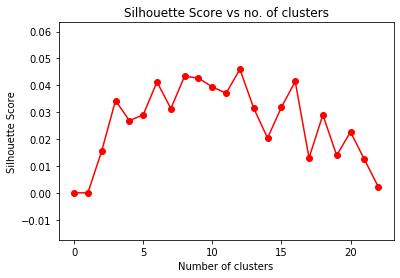

Optimal cluster number is  12

Number of Lines in Summarized text 
2

Russian oil merger excludes Yukos

The merger of Russian gas giant Gazprom and oil firm Rosneft is to go ahead, but will not include Yugansk, which was controversially bought last year. Speaking on NTV television, which is controlled by Gazprom, Mr Miller added that Yugansk, which was swallowed up by Rosneft late last year, will operate as a separate, state-owned oil firm headed by current Rosneft chief Sergei Bogdanchikov.

Document  132

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


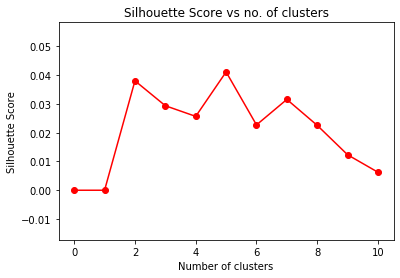

Optimal cluster number is  5

Number of Lines in Summarized text 
2

Brazil buy boosts Belgium's Inbev

Belgian brewing giant Inbev has seen its profits soar thanks to its acquisition of Brazil's biggest beer firm Ambev last year. The firm, formerly Interbrew, became the world's biggest brewer by volume when it bought Ambev in August 2004.

Document  133

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


13 

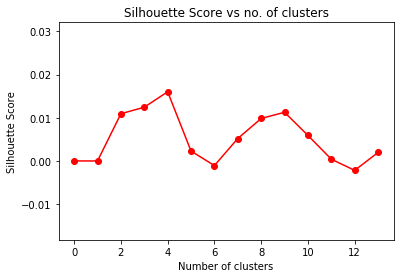

Optimal cluster number is  4

Number of Lines in Summarized text 
4

Salary scandal in Cameroon

Cameroon says widespread corruption in its finance ministry has cost it 1bn CFA francs ($2m; Â£1m) a month. Fidelis Nanga, a journalist based in the Cameroon capital Yaounde, said the government was considering taking criminal action against those found guilty and forcing them to repay any money owed. Mr Inoni launched an anti-corruption drive in December after foreign investors criticised a lack of transparency in the country's public finances. In a report compiled by anti-corruption body Transparency International in 2003, graft was said to be "pervasive" in Cameroon.

Document  134

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


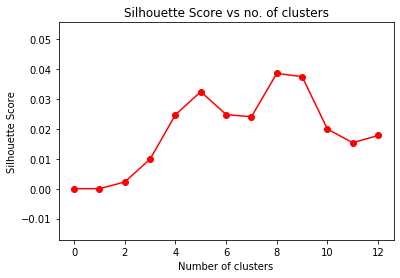

Optimal cluster number is  8

Number of Lines in Summarized text 
2

US adds more jobs than expected

The US economy added 337,000 jobs in October - a seven-month high and far more than Wall Street expectations. The 337,000 new jobs added to US payrolls in October was twice the 169,000 figure that Wall Street economists had forecast.

Document  135

Number of Lines in Actual text
20
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


15 16 17 18 19 

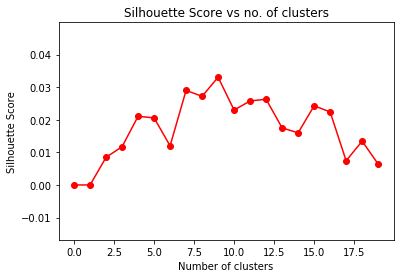

Optimal cluster number is  9

Number of Lines in Summarized text 
2

Feta cheese battle reaches court

A row over whether only Greece should be allowed to label its cheese feta has reached the European Court of Justice. The Court is expected to reach a verdict in the case in the autumn.

Document  136

Number of Lines in Actual text
26
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 16 17 18 19 20 21 22 23 24 25 

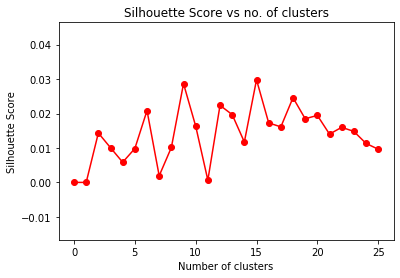

Optimal cluster number is  15

Number of Lines in Summarized text 
1

Ukraine revisits state sell-offs

Ukraine is preparing what could be a wholesale review of the privatisation of thousands of businesses by the previous administration.

Document  137

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


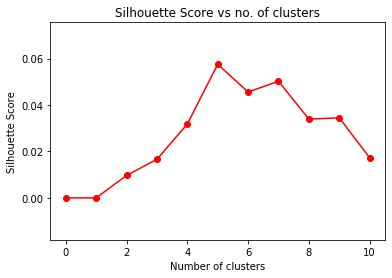

Optimal cluster number is  5

Number of Lines in Summarized text 
3

Bank set to leave rates on hold

UK interest rates are set to remain on hold at 4.75% following the latest meeting of the Bank of England. The Bank's rate-setting committee has put up rates five times in the past year but rates have been on hold since September amid signs of a slowdown. "There have been sufficient signs in the economy of a slowdown to stay the Bank of England's hand," he told BBC Radio 4's Today programme.

Document  138

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


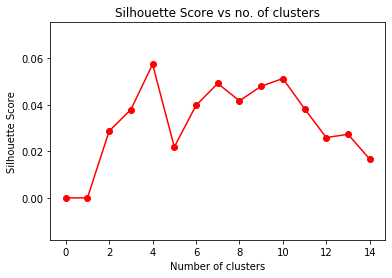

Optimal cluster number is  4

Number of Lines in Summarized text 
6

Winter freeze keeps oil above $50

Oil prices carried on rising on Wednesday after cold weather on both sides of the North Atlantic pushed US crude prices to four-month highs. Freezing temperatures and heavy snowfalls took crude oil prices past $50 a barrel on Tuesday for the first time since November. US crude was trading at $51.39 at 0710 GMT in Asian electronic trade on Wednesday. A barrel of US crude oil closed up $2.80 at $51.15 in New York on Tuesday. Although below last year's peak of $55.67 a barrel, which was reached in October, prices are now well above 2004's average of $41.48. Brent crude also rose in London trading, adding $1.89 to $48.62 at the close.

Document  139

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


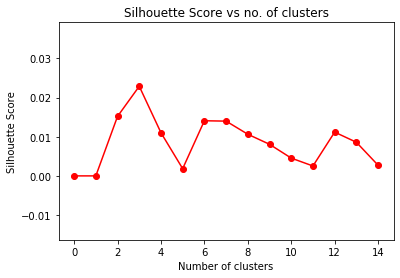

Optimal cluster number is  3

Number of Lines in Summarized text 
8

German jobless rate at new record

More than 5.2 million Germans were out of work in February, new figures show. The figure of 5.216 million people, or 12.6% of the working-age population, is the highest jobless rate in Europe's biggest economy since the 1930s. The latest unemployment figures look set to increase the pressure on the government. Widely leaked to the German newspapers a day in advance, they produced screaming headlines criticising Chancellor Gerhard Schroeder's Social Democrat-Green Party administration. Still, some measures suggest the picture is not quite so bleak. The soaring official unemployment figure follows a change in the methodology which pushed up the jobless rate by more than 500,000 in January. Adjusted for seasonal changes, the overall unemployment rate is 4.875 million people or 11.7%, up 0.3 percentage points from the previous month. And ILO-based figures also suggest that 14,000 new net

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 

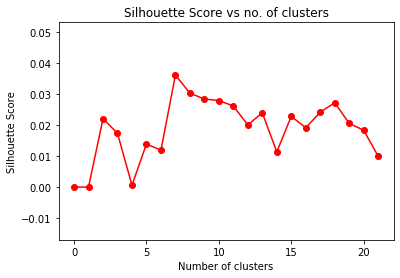

Optimal cluster number is  7

Number of Lines in Summarized text 
2

Ore costs hit global steel firms

Shares in steel firms have dropped worldwide amid concerns that higher iron ore costs will hit profit growth. The threat of higher raw material costs also hit industries such as carmakers.

Document  141

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


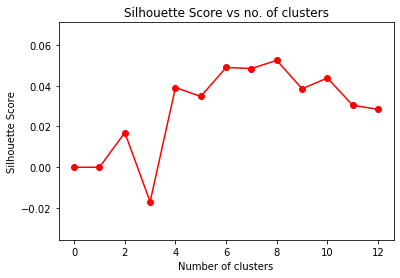

Optimal cluster number is  8

Number of Lines in Summarized text 
1

BMW reveals new models pipeline

BMW is preparing to enter the market for car-style people carriers, the firm's chief has told BBC News.

Document  142

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


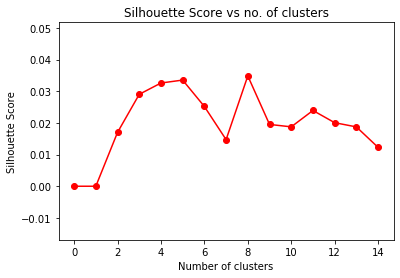

Optimal cluster number is  8

Number of Lines in Summarized text 
4

Asian banks halt dollar's slide

The dollar regained some lost ground against most major currencies on Wednesday after South Korea and Japan denied they were planning a sell-off. The dollar suffered its biggest one-day fall in four months on Tuesday on fears that Asian central banks were about to lower their reserves of dollars. Japan is the biggest holder of dollar reserves in the world, with South Korea the fourth largest. On Wednesday, however, South Korea moved to steady the financial markets.

Document  143

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


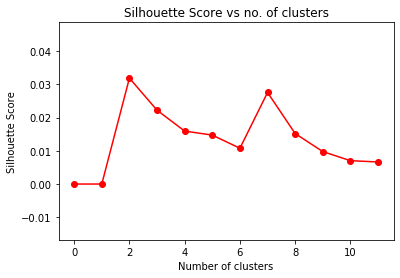

Optimal cluster number is  2

Number of Lines in Summarized text 
11

Weak dollar trims Cadbury profits

The world's biggest confectionery firm, Cadbury Schweppes, has reported a modest rise in profits after the weak dollar took a bite out of its results. Underlying pre-tax profits rose 1% to Â£933m ($1.78bn) in 2004, but would have been 8% higher if currency movements were stripped out. The owner of brands such as Dairy Milk, Dr Pepper and Snapple generates more than 80% of its sales outside the UK. Cadbury said it was confident it would hit its targets for 2005. "While the external commercial environment remains competitive, we are confident that we have the strategy, brands and people to deliver within our goal ranges in 2005," said chief executive Todd Stitzer. The modest profit rise had been expected by analysts after the company said in December that the poor summer weather had hit soft drink sales in Europe. Cadbury said its underlying sales were up by 4% in 2004. Growth was hel

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


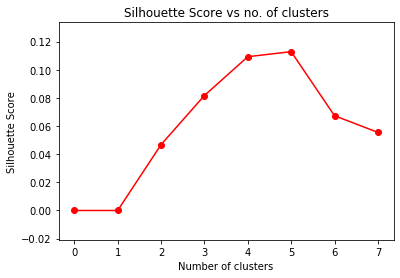

Optimal cluster number is  5

Number of Lines in Summarized text 
2

Oil prices fall back from highs

Oil prices retreated from four-month highs in early trading on Tuesday after producers' cartel Opec said it was now unlikely to cut production. He said that high oil prices meant Opec was unlikely to stick to its plan to cut output in the second quarter.

Document  145

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


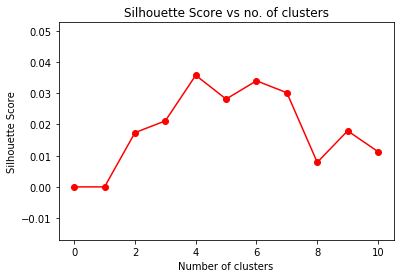

Optimal cluster number is  4

Number of Lines in Summarized text 
3

Winn-Dixie files for bankruptcy

US supermarket group Winn-Dixie has filed for bankruptcy protection after succumbing to stiff competition in a market dominated by Wal-Mart. Winn-Dixie, once among the most profitable of US grocers, said Chapter 11 protection would enable it to successfully restructure. A 10-month restructuring plan was deemed a failure, and following a larger-than-expected quarterly loss earlier this month, Winn-Dixie's slide into bankruptcy was widely expected.

Document  146

Number of Lines in Actual text
47
2 3 4 5 6 7 8 9 10 11 12 13 14 15 16

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 

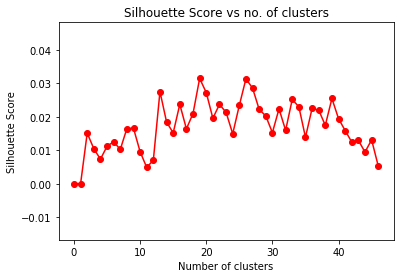

Optimal cluster number is  19

Number of Lines in Summarized text 
4

Why few targets are better than many

The economic targets set out at the Lisbon summit of European Union leaders in 2000 were meant to help Europe leapfrog its way past the United States to become the world's leading economy by 2010. They are also about ensuring Europe can continue to compete as an equal with the growing economic giants of Asia, India and China, as well as with the economic might of the United States. That has in part been due to the state of the global economy in the past few years. "This is something that no advanced economy in the world has tried to do.

Document  147

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


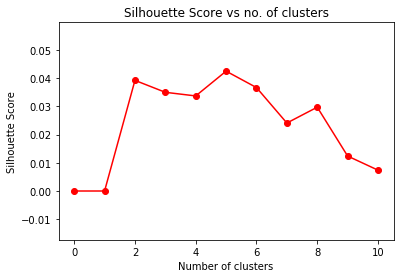

Optimal cluster number is  5

Number of Lines in Summarized text 
3

Malaysia lifts Islamic bank limit

Malaysia's central bank is to relax restrictions on foreign ownership to encourage Islamic banking. Banks in Malaysia will now be able to sell up to 49% of their Islamic banking units, while the limit on other kinds of bank remains at 30%. RHB, Malaysia's third-biggest lender, is already scouting for a foreign partner for its new Islamic banking unit, the firm told Reuters.

Document  148

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


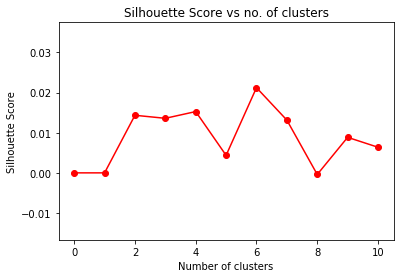

Optimal cluster number is  6

Number of Lines in Summarized text 
2

Alfa Romeos 'to get GM engines'

Fiat is to stop making six-cylinder petrol engines for its sporty Alfa Romeo subsidiary, unions at the Italian carmaker have said. All Alfa Romeo models can be bought with a six-cylinder engine - the 147, 156, 156 Sportwagon, 166, GTV, GT and Spider.

Document  149

Number of Lines in Actual text
28
2 3 4 5 6 7 8 9 10 11 12 13 14

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 15 16 17 18 19 20 21 22 23 24 25 26 27 

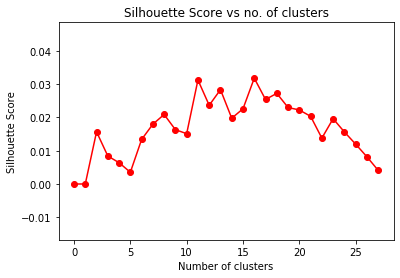

Optimal cluster number is  16

Number of Lines in Summarized text 
2

Saab to build Cadillacs in Sweden

General Motors, the world's largest car maker, has confirmed that it will build a new medium-sized Cadillac BLS at its loss-making Saab factory in Sweden. Bringing Cadillac production to Sweden should help introduce desperately-needed scale to the Saab factory, which currently produces fewer than 130,000 cars per year.

Document  150

Number of Lines in Actual text
16


C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


2 3 4 5 6 7 8 9 10 11 12 13 14 15 

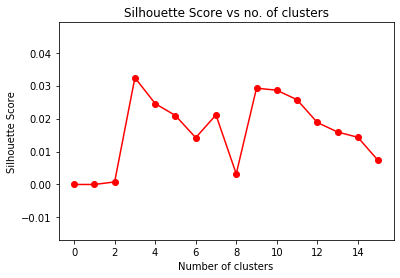

Optimal cluster number is  3

Number of Lines in Summarized text 
9

Shares hit by MS drug suspension

Shares in Elan and Biogen Idec plunged on Monday as the firms suspended sales of new multiple sclerosis drug Tysabri after a patient's death in the US. The firms took action after the death from a central nervous system disease and a suspected case of the condition. The cases cited involved the use of both Tysabri and Avonex, Biogen Idec's existing multiple sclerosis drug. The companies said they have no reports of the rare condition - progressive multifocal leukoencephalopathy (PML) - in patients taking either Tysabri or Avonex alone. Tysabri was approved for use in the US last November and was widely tipped to become the world's leading multiple sclerosis treatment. "The outcome of these evaluations will be used to determine possible re-initiation of dosing in clinical trials and future commercial availability." "Most of the value in the company was in Tysabri," said Ian Hunter at G

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


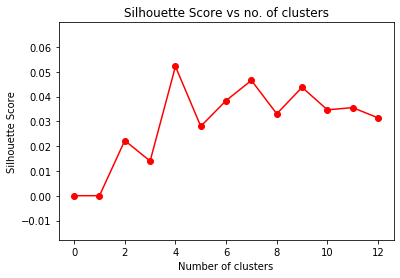

Optimal cluster number is  4

Number of Lines in Summarized text 
5

Bank voted 8-1 for no rate change

The decision to keep interest rates on hold at 4.75% earlier this month was passed 8-1 by the Bank of England's rate-setting body, minutes have shown. The Bank's latest inflation report, released last week, had noted that the main reason inflation might fall was weaker consumer spending. The Bank's minutes said that risks to the inflation forecast were "sufficiently to the downside" to keep rates on hold at its latest meeting. Ross Walker, UK economist at Royal Bank of Scotland, said he was surprised that a dissenting vote had been made so soon. He said the minutes appeared to be "trying to get the market to focus on the possibility of a rise in rates".

Document  152

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


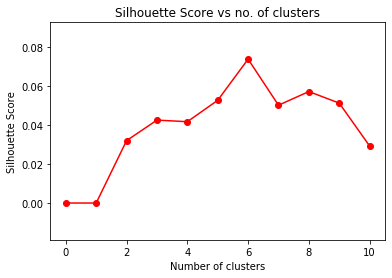

Optimal cluster number is  6

Number of Lines in Summarized text 
4

Crude oil prices back above $50

Cold weather across parts of the United States and much of Europe has pushed US crude oil prices above $50 a barrel for the first time in almost three months. Fresh falls in the value of the dollar helped carry prices above the $50 mark for the first time since November. A barrel of US crude oil closed up $2.80 to $51.15 in New York on Tuesday. The arrival of spring in the northern hemisphere will focus attention on stockpiles of US crude and gasoline, which are up to 9% higher than at this time last year.

Document  153

Number of Lines in Actual text
21
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


12 13 14 15 16 17 18 19 20 

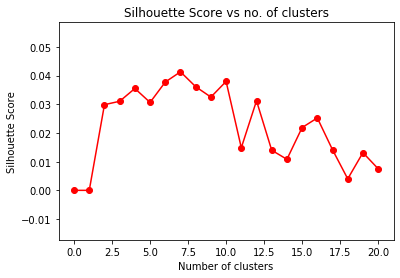

Optimal cluster number is  7

Number of Lines in Summarized text 
6

House prices show slight increase

Prices of homes in the UK rose a seasonally adjusted 0.5% in February, says the Nationwide building society. Nationwide said that in January house prices went up by 0.4% on the month and by 12.6% on a year earlier. And last summer, economists at PricewaterhouseCoopers (PWC) warned house prices were overvalued and could fall by between 10% and 15% by 2009. Homeowners now expect house prices to rise by 1% over the next six months, Mr Bannister said. House prices have risen 0.9% this year, Nationwide said, and if this pace of increase persists, prices would rise by just under 6% in the year to December. This is slightly above the 0-5% range Nationwide predicts.

Document  154

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 15 16 

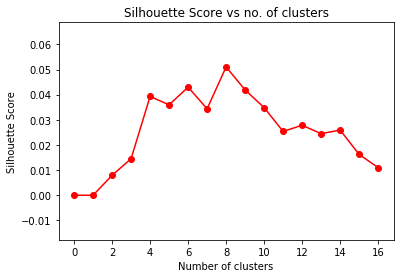

Optimal cluster number is  8

Number of Lines in Summarized text 
5

Golden rule boost for Chancellor

Chancellor Gordon Brown has been given a Â£2.1bn boost in his attempts to meet his golden economic rule, which allows him to borrow only for investment. Correcting the error would mean reducing current expenditure and increasing net investment, thus helping Mr Brown to meet his "golden rule" of borrowing only to invest over the economic cycle. But the Treasury said there would be no relaxation of economic discipline and the golden rule would be met even without the data revisions. It also said the government might narrowly miss its "golden rule" if the current economic cycle ended in 2005/06. After the ONS announcement, economists said there could also be a proportionate boost to the current budget in 2004/05 of about Â£400m.

Document  155

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 

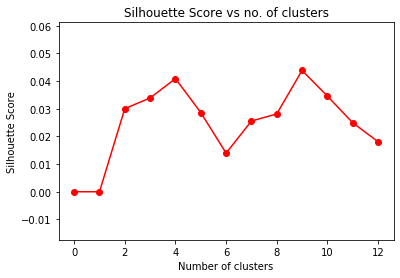

Optimal cluster number is  9

Number of Lines in Summarized text 
4

Macy's owner buys rival for $11bn

US retail giant Federated Department Stores is to buy rival May Department Stores for $11bn (Â£5.7bn). The combined firm will operate about 1,000 stores across the US, with combined annual sales of $30bn. As part of the deal, Federated - owner of Macy's and Bloomingdale's - will assume $6bn of May's debt, bringing the deal's total value to $17bn. Federated has annual sales of $15.6bn, while May's yearly sales are $14.4bn.

Document  156

Number of Lines in Actual text
13
2 3 4 5

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 6 7 8 9 10 11 12 

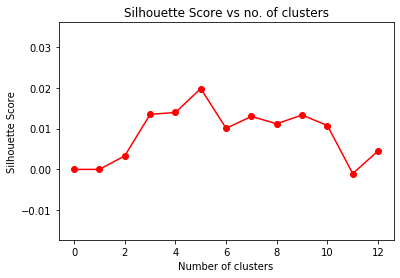

Optimal cluster number is  5

Number of Lines in Summarized text 
4

Industrial revival hope for Japan

Japanese industry is growing faster than expected, boosting hopes that the country's retreat back into recession is over. Industrial output rose 2.1% - adjusted for the time of year - in January from a month earlier. At the same time, retail sales picked up faster than at any time since 1997. Among the best-performing sectors were key overseas sales areas such as cars, chemicals and electronic goods.

Document  157

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 

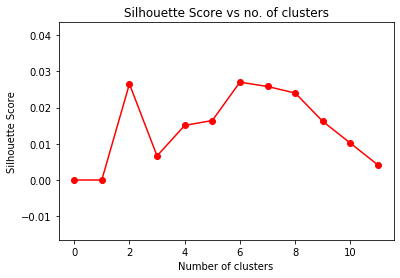

Optimal cluster number is  6

Number of Lines in Summarized text 
3

Khodorkovsky ally denies charges

A close associate of former Yukos boss Mikhail Khodorkovsky has told a court that fraud charges levelled against him are "false". "To my embarrassment, I could not understand the file of complaints against me," he told a Moscow court. Mr Khodorkovsky began his testimony last week, telling the court that he objected to the way that the "running of a normal business has been presented as a work of criminal fiction".

Document  158

Number of Lines in Actual text
7
2 3 4 5 6 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


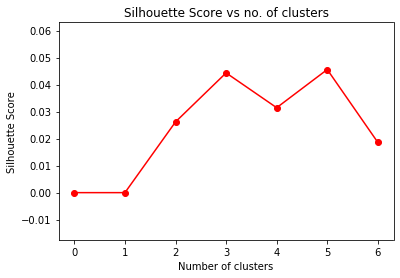

Optimal cluster number is  5

Number of Lines in Summarized text 
2

Qatar and Shell in $6bn gas deal

Shell has signed a $6bn (Â£3.12bn) deal with the Middle Eastern sheikhdom of Qatar to supply liquid natural gas (LNG) to North America and Europe. The agreement is the latest in a string of deals reached by Qatar, which is trying to make itself a regional leader in natural gas.

Document  159

Number of Lines in Actual text
23
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


15 16 17 18 19 20 21 22 

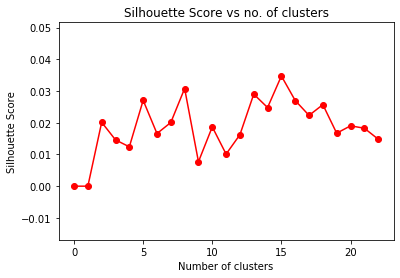

Optimal cluster number is  15

Number of Lines in Summarized text 
1

India unveils anti-poverty budget

India is to boost spending on primary schools and health in a budget flagged as a boost for the ordinary citizen.

Document  160

Number of Lines in Actual text
17
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 11 12 13 14 15 16 

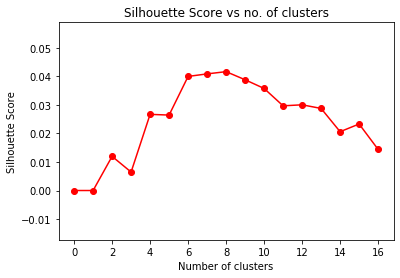

Optimal cluster number is  8

Number of Lines in Summarized text 
3

GM pays $2bn to evade Fiat buyout

General Motors of the US is to pay Fiat 1.55bn euros ($2bn; Â£1.1bn) to get out of a deal which could have forced it to buy the Italian car maker outright. Analysts said Fiat seemed to have done well out of the deal, although some predictions had expected a 2bn euro pay-off. Fiat is to get 1bn euros immediately, with another 550m to follow within 90 days.

Document  161

Number of Lines in Actual text
18
2 3 4 5 6 7

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 8 9 10 11 12 13 14 15 16 17 

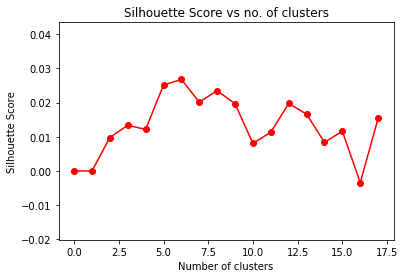

Optimal cluster number is  6

Number of Lines in Summarized text 
3

Ex-Boeing director gets jail term

An ex-chief financial officer at Boeing has received a four-month jail sentence and a fine of $250,000 (Â£131,961) for illegally hiring a top Air Force aide. The contract, to provide refuelling tankers for the US Air Force, was cancelled last year. However, analysts believe Boeing may yet face civil charges arising from the scandal.

Document  162

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 

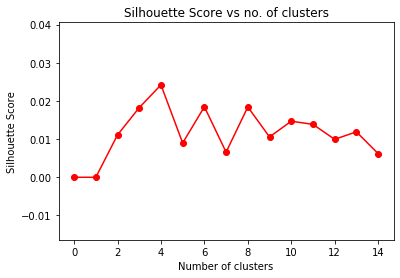

Optimal cluster number is  4

Number of Lines in Summarized text 
5

Verizon 'seals takeover of MCI'

Verizon has won a takeover battle for US phone firm MCI with a bid worth $6.8bn (Â£3.6bn), reports say. The two firms are expected to seal the deal on Monday morning, according to news agency reports, despite what was thought to be a higher bid from Qwest. Shareholders lost about $180bn when the company collapsed, while 20,000 workers lost their jobs. Consolidation in the US telecommunications industry has picked up in the past few months as companies look to cut costs and boost client bases. Verizon is by far the bigger company and has its own successful mobile arm - factors which may have swung the board in its favour since both suitors are offering a mixture of cash and shares.

Document  163

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


13 14 15 16 

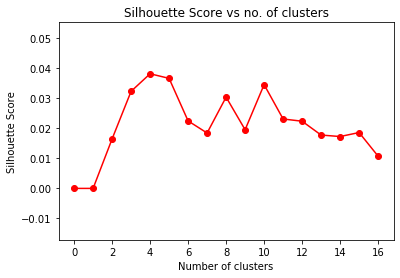

Optimal cluster number is  4

Number of Lines in Summarized text 
6

US data sparks inflation worries

Wholesale prices in the US rose at the fastest rate in more than six years in January, according to government data. New figures show the Labor Department producer price index (PPI) rose by 0.3% - in line with forecasts. But core producer prices, which exclude food and energy costs, surged by 0.8%, the biggest rise since December 1998, increasing inflationary concerns. The economic figures come on the back of increased fears that the Federal Reserve chairman may be about to raise interest rates in order to stifle any inflationary pressures. Mr Greenspan told Congress this week that the central bank was on guard against the possibility that a rebounding economy could trigger stronger inflation pressures. However on Friday, it was overshadowed by the core PPI core figure, which surged 2.7% during the past 12 months, the biggest year-on-year gain in nine years.

Document  164

Number of 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 7 8 9 10 11 12 13 14 

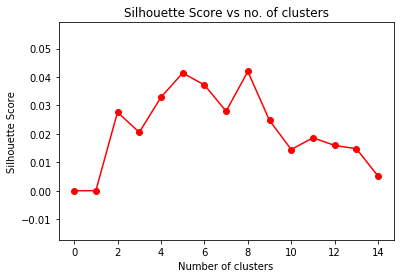

Optimal cluster number is  8

Number of Lines in Summarized text 
2

Yukos sues four firms for $20bn

Russian oil firm Yukos has sued four companies for their role in last year's forced state auction of its key oil production unit Yuganskneftegas. To settle the bill, Russia forced Yukos to sell off Yuganskneftegas.

Document  165

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


12 13 14 15 16 

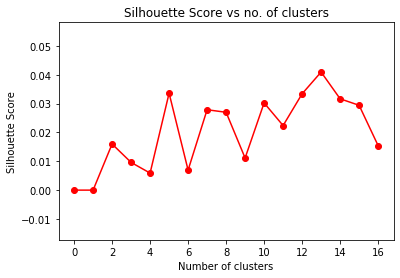

Optimal cluster number is  13

Number of Lines in Summarized text 
4

Consumer spending lifts US growth

US economic growth accelerated in the third quarter, helped by strong consumer spending, official figures have shown. The increase reflected the biggest jump in consumer spending in a year. Consumer spending accounts for about two thirds of all economic activity in the US. The weaker than expected growth figure makes it less likely that the US Federal Reserve will raise interest rates next month, economists said.

Document  166

Number of Lines in Actual text
12
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 11 

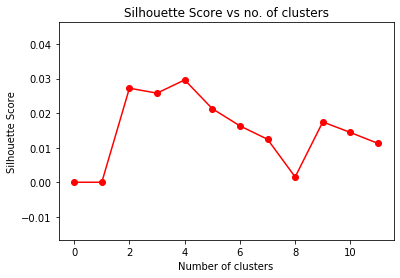

Optimal cluster number is  4

Number of Lines in Summarized text 
6

Crossrail link 'to get go-ahead'

The Â£10bn Crossrail transport plan, backed by business groups, is to get the go-ahead this month, according to The Mail on Sunday. It says the UK Treasury has allocated Â£7.5bn ($13.99bn) for the project and that talks with business groups on raising the rest will begin shortly. The paper says it will go before the House of Commons on 23 February. A second reading could follow on 16 or 17 March. Jeremy de Souza, a spokesman for Crossrail, said on Sunday he could not confirm whether the Treasury was planning to invest Â£7.5bn or when the bill would go before Parliament. The Mail on Sunday's Financial Mail said the Â£7.5bn of Treasury money was earmarked for spending in Â£2.5bn instalments in 2010, 2011 and 2012.

Document  167

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


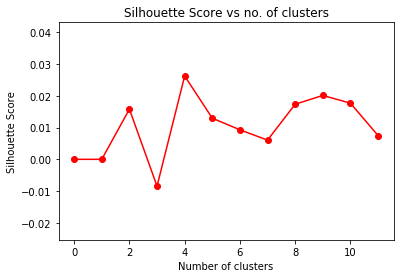

Optimal cluster number is  4

Number of Lines in Summarized text 
4

Hariri killing hits Beirut shares

Shares in Solidere, the Lebanese company founded by assassinated former prime minister Rafik Hariri, fell 15% in renewed trading in Beirut. Beirut's benchmark BLOM stock index closed down 7.9% at 642.80. This is a very big company held by many Lebanese." Solidere posted profits of $12.5m in the first half of 2004, and its shares had been gaining in recent months.

Document  168

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


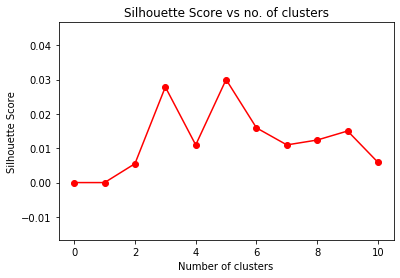

Optimal cluster number is  5

Number of Lines in Summarized text 
3

Small firms 'hit by rising costs'

Rising fuel and materials costs are hitting confidence among the UK's small manufacturers despite a rise in output, business lobby group the CBI says. The CBI also found spending on innovation, training and retraining is forecast to go up over the next year. The CBI found some firms managed to increase prices for the first time in nine years - but many said increases failed to keep up the rise in costs.

Document  169

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


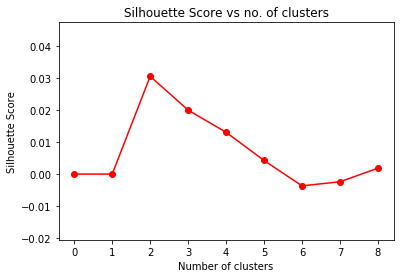

Optimal cluster number is  2

Number of Lines in Summarized text 
6

Buyers snap up Jet Airways' shares

Investors have snapped up shares in Jet Airways, India's biggest airline, following the launch of its much anticipated initial public offer (IPO). The IPO for 17.3 million shares was fully sold within 10 minutes of opening, on Friday. The share offer, representing about 20% of Jet's equity, was oversubscribed, news agency Reuters reported. The company has grown rapidly since it launched operations in 1993, overtaking state-owned flag carrier Indian Airlines. However, it faces stiff competition from rivals and low-cost carriers. Jet's IPO is the first in a series of expected share offers from Indian companies this year, as they move to raise funds to help them do business in a rapidly-growing economy.

Document  170

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


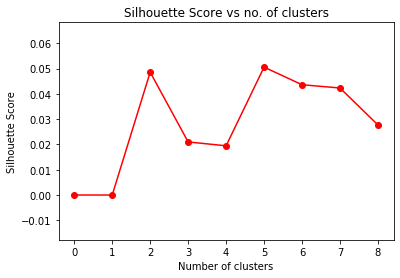

Optimal cluster number is  5

Number of Lines in Summarized text 
4

House prices suffer festive fall

UK house prices fell 0.7% in December, according to figures from the Office of the Deputy Prime Minister. Nationally, house prices rose at an annual rate of 10.7% in December, less than the 13.7% rise the previous month. All major UK regions, apart from Northern Ireland, experienced a fall in annual growth during December. After registering falls at the back-end of 2004, Halifax said house prices rose by 0.8% in January and Nationwide reported a rise of 0.4% in the first month of the year.

Document  171

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


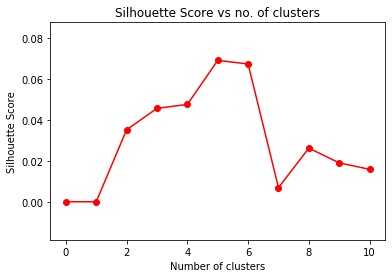

Optimal cluster number is  5

Number of Lines in Summarized text 
3

Deutsche Boerse boosts dividend

Deutsche Boerse, the German stock exchange that is trying to buy its London rival, has said it will boost its 2004 dividend payment by 27%. "Most of the disgruntled shareholders of Deutsche Boerse are complaining that the money that is being used for the bid could be better placed in their hands, paid out in dividends," Mr Faraj continued. Deutsche Boerse is "trying to buy them off in a sense", he said.

Document  172

Number of Lines in Actual text
18
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 16 17 

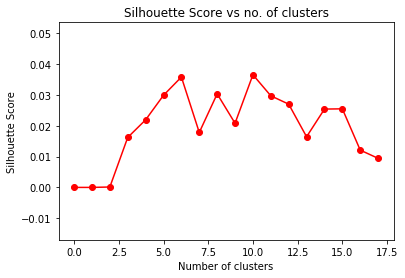

Optimal cluster number is  10

Number of Lines in Summarized text 
1

Newest EU members underpin growth

The European Union's newest members will bolster Europe's economic growth in 2005, according to a new report.

Document  173

Number of Lines in Actual text
18
2 3 4 5 6

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 7 8 9 10 11 12 13 14 15 16 17 

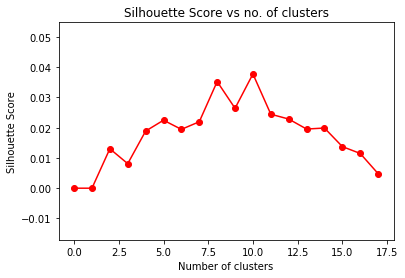

Optimal cluster number is  10

Number of Lines in Summarized text 
1

Brewers' profits lose their fizz

Heineken and Carlsberg, two of the world's largest brewers, have reported falling profits after beer sales in western Europe fell flat.

Document  174

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 13 

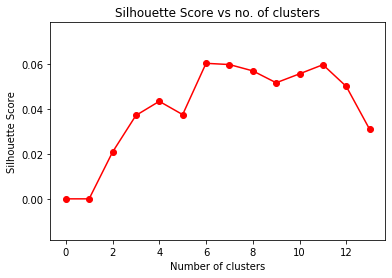

Optimal cluster number is  6

Number of Lines in Summarized text 
5

Yangtze Electric's profits double

Yangtze Electric Power, the operator of China's Three Gorges Dam, has said its profits more than doubled in 2004. Yangtze Electric has been expanding its output to meet demand driven by China's booming economy. The government has delayed the building of a number of power plants in an effort to rein in growth amid concerns that the economy may overheat. Earlier this month, work was halted on an underground power station, and a supply unit on the Three Gorges Dam, as well as a power station on its sister Xiluodu dam because of environmental worries. Its sister project, the Xiluodu Dam, is being built on the Jinshajiang - or "river of golden sand" as the upper reaches of the Yangtze are known.

Document  175

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


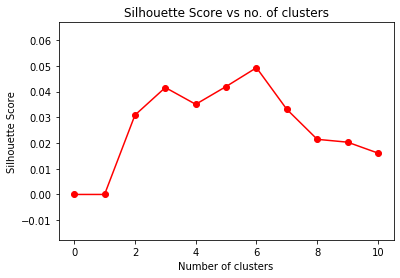

Optimal cluster number is  6

Number of Lines in Summarized text 
5

French consumer spending rising

French consumers increased their spending by 1.5% in January, a figure which bodes well for the country's economic growth, figures revealed. The National Statistic Institute (INSEE) added that consumer spending in January rose 3.8% on a year-on-year basis. The INSEE also said that French consumer prices fell 0.6% in January, but were up 1.6% on an annual basis. According to the INSEE, car sales fell 2.8% in January, following a fall of 0.6% in December. But on a year-on-year basis, the sector still saw a sales increase of 6.5%.

Document  176

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


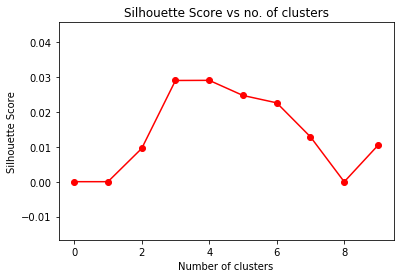

Optimal cluster number is  4

Number of Lines in Summarized text 
3

GSK aims to stop Aids profiteers

One of the world's largest manufacturers of HIV/Aids drugs has launched an initiative to combat the smuggling of cheaper pills - supplied to poorer African countries - back into Europe for resale at far higher price. The result is that drugs supplied to Africa are now more than thirty times cheaper than those sold in Europe; bringing these medicines within the reach of millions of HIV-positive Africans through their government's health care systems. But the wide difference in price also means that there are big gains to be made from illegally diverting these cheaper drugs back into wealthier countries and re-selling them at a higher price.

Document  177

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12 13 14

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 15 

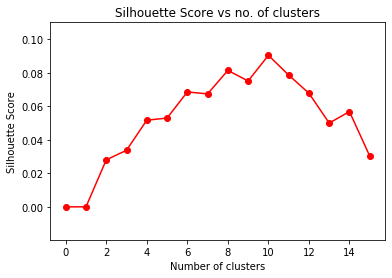

Optimal cluster number is  10

Number of Lines in Summarized text 
4

Optimism remains over UK housing

The UK property market remains robust despite the recent slowdown, according to mortgage lender Bradford & Bingley and housebuilder George Wimpey. Recent housing market surveys have indicated that the UK property market has cooled in recent months after several years of rapid growth. Wimpey said the UK housing market had proved "challenging" last year. However, the first seven weeks of this year had produced promising signs, Wimpey said.

Document  178

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


11 12 

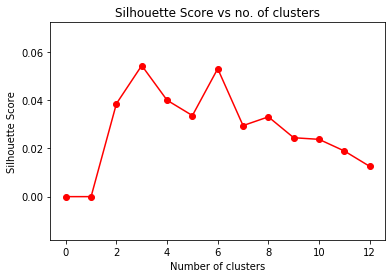

Optimal cluster number is  3

Number of Lines in Summarized text 
5

Russia WTO talks 'make progress'

Talks on Russia's proposed membership of the World Trade Organisation (WTO) have been "making good progress" say those behind the negotiations. His comments came as President George W Bush said the US backed Russian entry. Russia has been waiting for a decade to join the WTO and hopes to finally become a member by early 2006. Sticking points to membership have included limits on foreign ownership in the telecommunications and life insurance businesses, as well as issues surrounding counterfeiting, piracy, and data protection. Some WTO members also dislike Russia's energy price subsidies, which competitors say give Russian businesses an unfair advantage.

Document  179

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


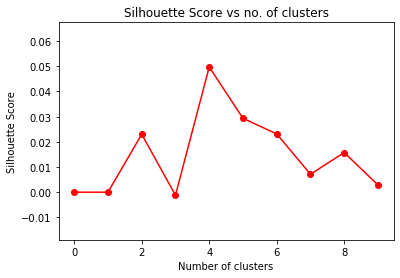

Optimal cluster number is  4

Number of Lines in Summarized text 
3

Irish duo could block Man Utd bid

Irishmen JP McManus and John Magnier, who own a 29% stake in Manchester United, will reportedly reject any formal Â£800m offer for the club. Irish billionaires Mr McManus and Mr Magnier are said to believe that an Â£800m bid undervalues club prospects. Mr Magnier and Mr McManus, who hold their stake through their Cubic Expression investment vehicle have the power to block a bid.

Document  180

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


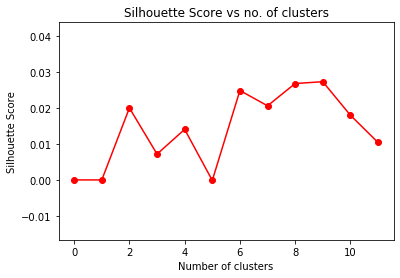

Optimal cluster number is  9

Number of Lines in Summarized text 
2

Dollar drops on reserves concerns

The US dollar has dropped against major currencies on concerns that central banks may cut the amount of dollars they hold in their foreign reserves. South Korea, which has about $200bn in foreign reserves, said it plans instead to boost holdings of currencies such as the Australian and Canadian dollar.

Document  181

Number of Lines in Actual text
22
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 15 16 17 18 19 20 21 

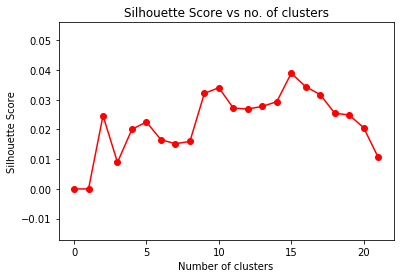

Optimal cluster number is  15

Number of Lines in Summarized text 
2

India and Russia in energy talks

India and Russia are to work together in a series of energy deals, part of a pact which could see India invest up to $20bn in oil and gas projects. The agreement is likely to see the two companies develop refining facilities in Russia, India and elsewhere and organise delivery of oil, gas and petrochemicals from Russia to India and other countries across Asia.

Document  182

Number of Lines in Actual text
12
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


9 10 11 

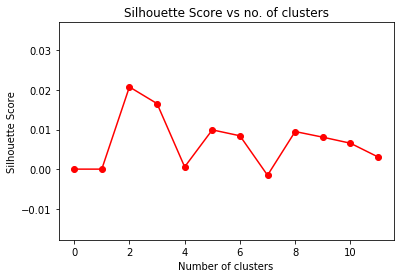

Optimal cluster number is  2

Number of Lines in Summarized text 
5

Weak data buffets French economy

A batch of downbeat government data has cast doubt over the French economy's future prospects. At the same time, finance minister Nicolas Sarkozy warned that high oil prices posed a threat to French growth. Analysts said French companies, keen to protect their profit margins at a time of rising energy costs, were reluctant to take on extra staff. Obligatory employer contributions to worker welfare programmes mean that it costs more to hire staff in France than in many other European economies. Many economists have urged the government to stimulate employment by reducing non-wage payroll costs, and by scrapping restrictions on working hours.

Document  183

Number of Lines in Actual text
39
2 3 4 5 6 7 8 9 10 11

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 

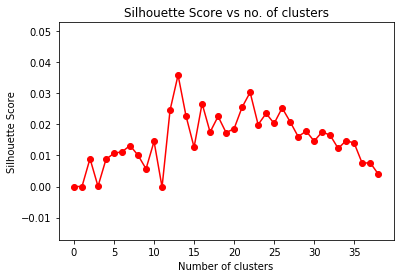

Optimal cluster number is  13

Number of Lines in Summarized text 
4

Business fears over sluggish EU economy

As European leaders gather in Rome on Friday to sign the new EU constitution, many companies will be focusing on matters much closer to home - namely how to stay in business. "In our business the market is absolutely global, you can not imagine living with our size (of business) even within an enlarged European Union, (if we did that) we would need not 350 people but perhaps just 150 or 200," he says. New business has been attracted, but not enough to make up the difference. The Siemens plant at Boscholt makes cordless phones and employs 2,000 staff.

Document  184

Number of Lines in Actual text
15
2 3

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 4 5 6 7 8 9 10 11 12 13 14 

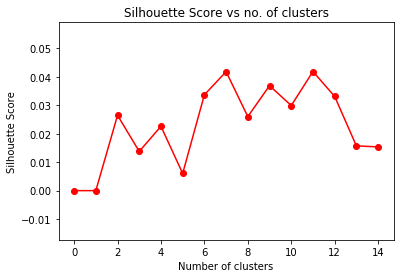

Optimal cluster number is  11

Number of Lines in Summarized text 
2

M&S cuts prices by average of 24%

Marks & Spencer has cut prices in London and the regions by an average of 24%, according to research from a City investment bank. Separately, investment bank Goldman Sachs produced reseach showing that a basket of 35 M&S goods is now 11% above the high-street average, compared with 43% higher last year.

Document  185

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


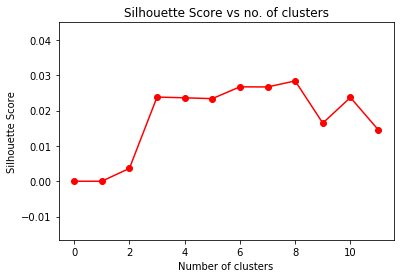

Optimal cluster number is  8

Number of Lines in Summarized text 
2

US bank 'loses' customer details

The Bank of America has revealed it has lost computer tapes containing account details of more than one million customers who are US federal employees. Customers' accounts were being monitoring and account holders would be notified if any "unusual activity" was detected, bank officials said.

Document  186

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


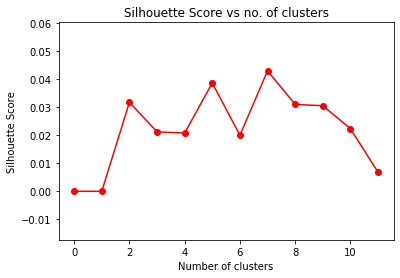

Optimal cluster number is  7

Number of Lines in Summarized text 
2

Huge rush for Jet Airways shares

Indian airline Jet Airways' initial public offering was oversubscribed 16.2 times, bankers said on Friday. The price at which its shares will begin trading will be agreed over the weekend, bankers said.

Document  187

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


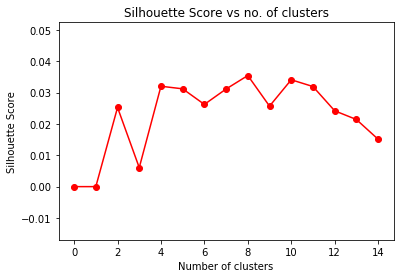

Optimal cluster number is  8

Number of Lines in Summarized text 
4

Bank payout to Pinochet victims

A US bank has said it will donate more than $8m to victims of former Chilean military ruler Augusto Pinochet's regime under a Madrid court settlement. More than 3,000 people were killed for political reasons under Gen Pinochet's regime, an official report says. Last month in a US court, Riggs Bank pleaded guilty to failing to report suspicious activity relating to accounts held by Gen Pinochet and the government of Equatorial Guinea. On that occasion, it was ordered to pay a fine of $16m.

Document  188

Number of Lines in Actual text
19
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


13 14 15 16 17 18 

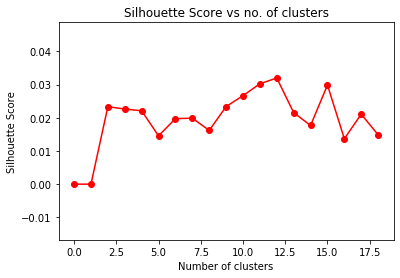

Optimal cluster number is  12

Number of Lines in Summarized text 
1

Qwest may spark MCI bidding war

US phone company Qwest has said it will table a new offer for MCI after losing out to larger rival Verizon, setting the scene for a possible bidding war.

Document  189

Number of Lines in Actual text
20
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 15 16 17 18 19 

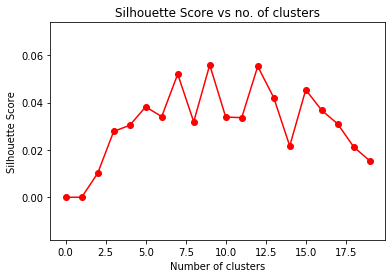

Optimal cluster number is  9

Number of Lines in Summarized text 
3

Fiat chief takes steering wheel

The chief executive of the Fiat conglomerate has taken day-to-day control of its struggling car business in an effort to turn it around. Sergio Marchionne has replaced Herbert Demel as chief executive of Fiat Auto, with Mr Demel leaving the company. Mr Demel, a car industry veteran, took the helm in November 2003 after being recruited by former Fiat chief executive Giuseppe Morchio.

Document  190

Number of Lines in Actual text
19
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 15 16 17 18 

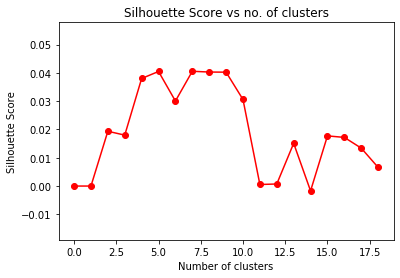

Optimal cluster number is  7

Number of Lines in Summarized text 
5

Consumers drive French economy

France's economic growth accelerated in the last three months of 2004, driven by consumer spending, a report shows. Consumer spending was up by 1.2% in the fourth quarter, and there also was a rebound in business investment that gave the recovery an extra shove. "Consumer spending is still high. But French households have spent their savings to consume. "In the beginning of 2004, growth was mainly driven by consumer spending.

Document  191

Number of Lines in Actual text
20
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


9 10 11 12 13 14 15 16 17 18 19 

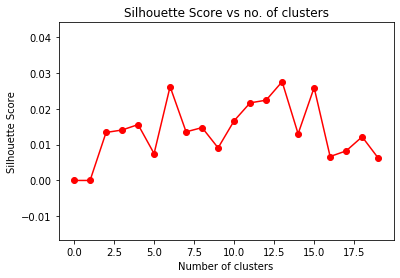

Optimal cluster number is  13

Number of Lines in Summarized text 
4

US regulator to rule on pain drug

US food and drug regulators will decide on Friday whether to recommend the sale of painkillers that have been linked to a high risk of heart attack and stroke. The FDA has been asked to decide if the benefits to patients justify the increased risks. Alarm bells were rung by a research note called Approve which showed that the risk of heart attack and stroke doubled in patients who had been taking the drug for at least 18 months. According to calculations presented to the US Senate by Dr Graham in November, Vioxx may be linked to as many as to 56,000 American deaths.

Document  192

Number of Lines in Actual text
16
2 3 4 5 6

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 7 8 9 10 11 12 13 14 

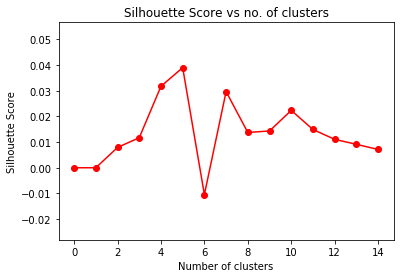

Optimal cluster number is  5

Number of Lines in Summarized text 
4

Yukos bankruptcy 'not US matter'

Russian authorities do not have to abide by any US court decisions taken with regard to troubled oil giant Yukos, a Houston court has been told. Yukos made its surprise Chapter 11 bankruptcy filing in Houston in December in an unsuccessful attempt to halt the auction of Yugansk, its main oil producing unit, by Russian authorities. US bankruptcy judge Letitia Clark, who issued an injunction in December to try and prevent the Yugansk sale, has said she will rule "pretty promptly, however I do not anticipate ruling on it before next Tuesday". Yukos has claimed it sought help in the US because other forums - Russian courts and the European Court of Human Rights - were either unfriendly or offered less protection.

Document  193

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 13 

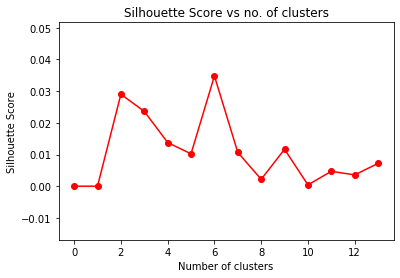

Optimal cluster number is  6

Number of Lines in Summarized text 
2

Borussia Dortmund near bust

German football club and former European champion Borussia Dortmund has warned it will go bankrupt if rescue talks with creditors fail. Fund manager Florian Hamm - Borussia Dortmund's largest investor - said he would only invest more money in the company if he got a greater say in how it is run.

Document  194

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


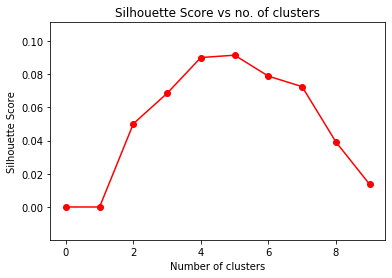

Optimal cluster number is  5

Number of Lines in Summarized text 
2

'Post-Christmas lull' in lending

UK mortgage lending showed a "post-Christmas lull" in January, indicating a slowing housing market, lenders have said. "These figures show beyond doubt the recent slowdown in the housing market," Peter Williams, CML deputy director, said.

Document  195

Number of Lines in Actual text
21
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 13 14 15 16 17 18 19 20 

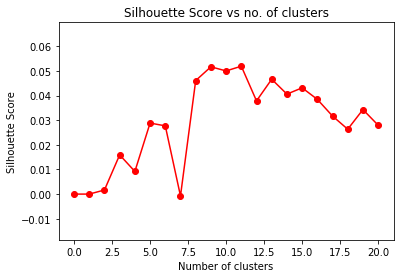

Optimal cluster number is  11

Number of Lines in Summarized text 
3

UK 'risks breaking golden rule'

The UK government will have to raise taxes or rein in spending if it wants to avoid breaking its "golden rule", a report suggests. The rule states that the government can borrow cash only to invest, and not to finance its spending projects. The report is the latest to call into question the viability of government spending projections.

Document  196

Number of Lines in Actual text
15
2 3 4 5 6 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


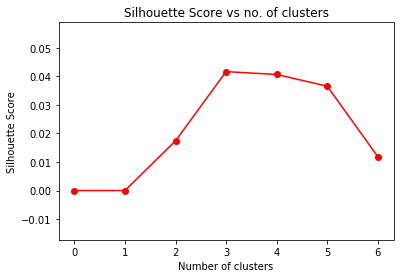

Optimal cluster number is  3

Number of Lines in Summarized text 
3

Worldcom director ends evidence

The former chief financial officer at US telecoms firm WorldCom has finished giving evidence at the trial of his ex-boss Bernie Ebbers. Mr Sullivan has spent two days being cross-examined by lawyers for former Worldcom chief executive Mr Ebbers. The former finance officer said Mr Ebbers knew about the improper accounting entries that were made between 2000 and 2002 to conceal soaring expenses and inflate revenue.

Document  197

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


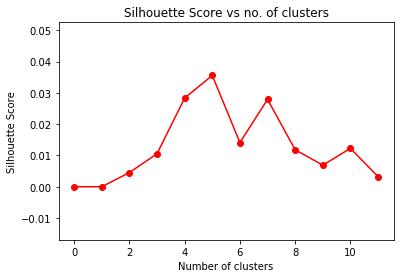

Optimal cluster number is  5

Number of Lines in Summarized text 
2

Ukraine steel sell-off 'illegal'

The controversial sell-off of a Ukrainian steel mill to a relative of the former president was illegal, a court has ruled. One of the foreign bidders who lost out, steel giant LNM, told BBC News that it would be interested in any renewed sale.

Document  198

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 

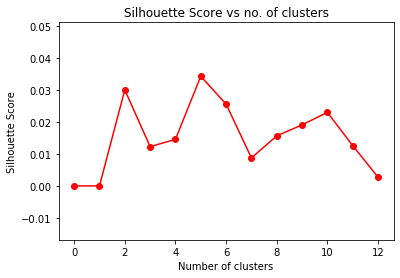

Optimal cluster number is  5

Number of Lines in Summarized text 
6

Cairn shares up on new oil find

Shares in Cairn Energy have jumped 6% after the firm said an Indian oilfield was larger than previously thought. Cairn's share price rose 300% last year after a number of oil finds, but its shares were hit in December following a disappointing drilling update. December's share fall means that Cairn is still in danger of being relegated from the FTSE 100 when the index is reshuffled next month. Cairn's shares closed up 64 pence, or 6%, at 1130p on Thursday. Before Christmas, Cairn revealed that drilling to the north of the field in Rajasthan had been disappointing, which caused its shares to lose 18% in one day. However, on Thursday, the group said its belief that the path of oil in the area actually moved further to the west had proved correct.

Document  199

Number of Lines in Actual text
18
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 16 17 

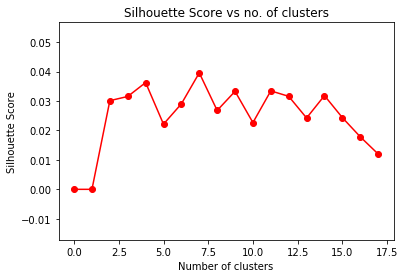

Optimal cluster number is  7

Number of Lines in Summarized text 
4

Georgia plans hidden asset pardon

Georgia is offering a one-off 'tax amnesty' to people who hid their earnings under the regime of former president Eduard Shevardnadze. Mr Saakashvili, elected president in January after Mr Shevardnadze was toppled, has urged the Georgian Parliament to approve the amnesty as soon as possible. Criminal investigations in such cases -thought to involve about 5% of Georgian businesses -are to continue. Mr Saakashvili has accused the Shevardnadze regime, which was toppled by a popular uprising in November, of allowing bribery to flourish.

Document  200

Number of Lines in Actual text
30
2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


17 18 19 20 21 22 23 24 25 26 27 28 29 

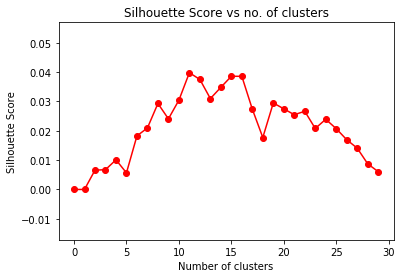

Optimal cluster number is  11

Number of Lines in Summarized text 
2

Cuba winds back economic clock

Fidel Castro's decision to ban all cash transactions in US dollars in Cuba has once more turned the spotlight on Cuba's ailing economy. A leading expert on the Cuban economy says that Castro's tax plan smacks more of a desperate economic measure than a political gesture.

Document  201

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


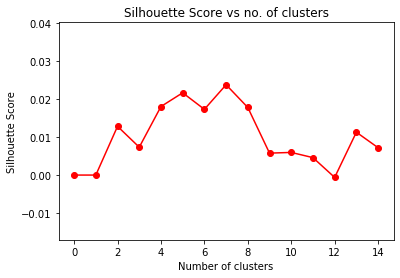

Optimal cluster number is  7

Number of Lines in Summarized text 
2

Novartis hits acquisition trail

Swiss drugmaker Novartis has announced 5.65bn euros ($7.4bn; Â£3.9bn) of purchases to make its Sandoz unit the world's biggest generic drug producer. The deal will see Novartis' Sandoz business overtake Israel's Teva Pharmaceuticals as the world's biggest maker of generics.

Document  202

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


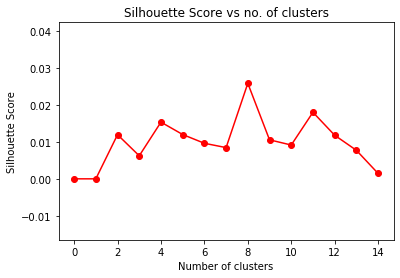

Optimal cluster number is  8

Number of Lines in Summarized text 
2

MCI shareholder sues to stop bid

A shareholder in US phone firm MCI has taken legal action to halt a $6.75bn (Â£3.6bn) buyout by telecoms giant Verizon, hoping to get a better deal. Earlier this month, SBC Communications agreed to buy its former parent and phone pioneer AT&T for about $16bn.

Document  203

Number of Lines in Actual text
14
2 3

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 4 5 6 7 8 9 10 11 12 13 

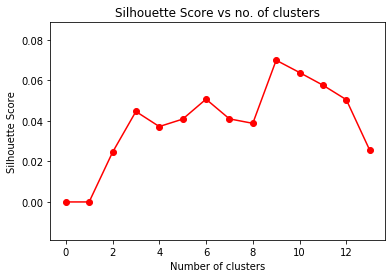

Optimal cluster number is  9

Number of Lines in Summarized text 
2

'Standoff' on Deutsche's LSE bid

Deutsche Boerse investors unhappy with its London Stock Exchange bid will have no chance to throw out the exchange's management until May, Reuters says. Deutsche is in competition with pan-European bourse Euronext to take over the London exchange.

Document  204

Number of Lines in Actual text
23
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


10 11 12 13 14 15 16 17 18 19 20 21 22 

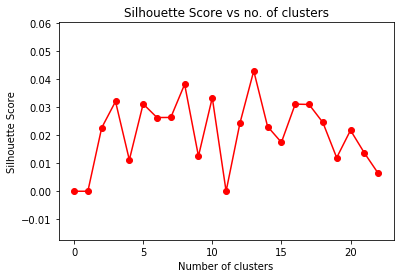

Optimal cluster number is  13

Number of Lines in Summarized text 
1

Bush to outline 'toughest' budget

President Bush is to send his toughest budget proposals to date to the US Congress, seeking large cuts in domestic spending to lower the deficit.

Document  205

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


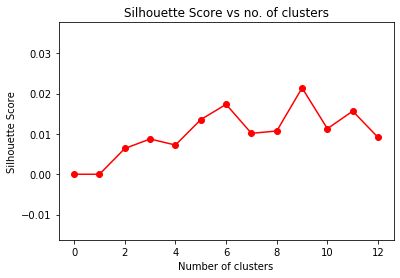

Optimal cluster number is  9

Number of Lines in Summarized text 
1

Orange colour clash set for court

A row over the colour orange could hit the courts after mobile phone giant Orange launched action against a new mobile venture from Easyjet's founder.

Document  206

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 15 

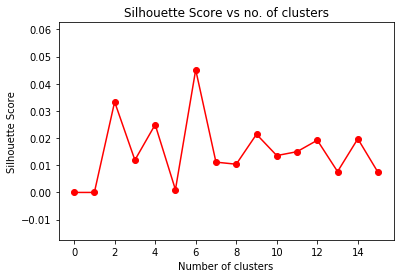

Optimal cluster number is  6

Number of Lines in Summarized text 
5

Standard Life cuts policy bonuses

Standard Life, Europe's largest mutual life insurer, has cut bonuses for with-profit policyholders. Annual bonus rates on its with-profits life policies were cut from 2.5% to 2%, while bonuses on pension policies were reduced from 3.25% to 2.5%. It is the sixth time in three years Standard Life has made cuts to bonus rates, despite an 8.7% rise in the value of the with-profits fund in 2004. Standard Life came in for criticism for sticking with stock market investments during 2001 and 2002. Recently, Norwich Union and Axa Sun Life both cut their with-profit bonus rates.

Document  207

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 12 13 

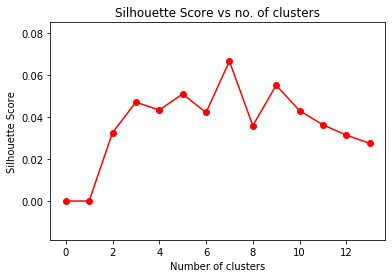

Optimal cluster number is  7

Number of Lines in Summarized text 
2

EMI shares hit by profit warning

Shares in music giant EMI have sunk by more than 16% after the firm issued a profit warning following disappointing sales and delays to two album releases. By 1200 GMT on Monday, EMI shares were down 16.2% at 235.75 pence.

Document  208

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 13 

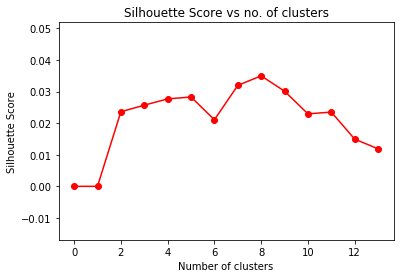

Optimal cluster number is  8

Number of Lines in Summarized text 
3

China's Shanda buys stake in Sina

Chinese online game operator Shanda Interactive Entertainment has bought a 20% stake in Sina, the country's biggest internet portal firm. Shanda said that it may boost its stake in Sina, even buying it outright. Sina said that the purchase of a stake by Shanda would have no impact on its business.

Document  209

Number of Lines in Actual text
26
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 

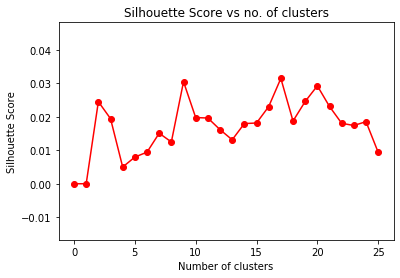

Optimal cluster number is  17

Number of Lines in Summarized text 
3

Mixed reaction to Man Utd offer

Shares in Manchester United were up over 5% by noon on Monday following a new offer from Malcolm Glazer. The board of Man Utd is expected to meet early this week to discuss the latest proposal from the US tycoon that values the club at Â£800m ($1.5bn). But the Man Utd supporters club urged the club to reject the new deal.

Document  210

Number of Lines in Actual text
18
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 11 12 13 14 15 16 17 

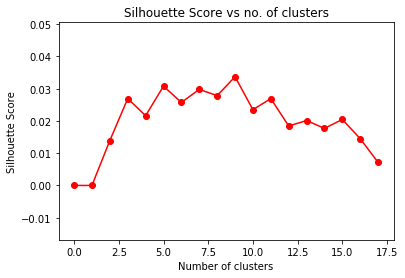

Optimal cluster number is  9

Number of Lines in Summarized text 
3

Gold falls on IMF sale concerns

The price of gold has fallen after the International Monetary Fund (IMF) said it will look at ways of using its gold reserves to provide debt relief. This idea has been put forward before, but there now seems to be a more committed political drive to address the issue of global poverty. While debt relief seems to have jumped to the top of the global agenda, not everyone is convinced that selling IMF gold is the best way forward.

Document  211

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


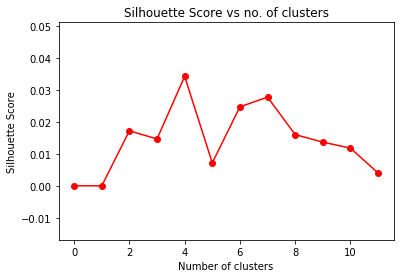

Optimal cluster number is  4

Number of Lines in Summarized text 
3

Electronics firms eye plasma deal

Consumer electronics giants Hitachi and Matshushita Electric are joining forces to share and develop technology for flat screen televisions. The deal will enable Hitachi and Matsushita, which makes Panasonic brand products, to develop new technology and improve their competitiveness. Hitachi recently announced a deal to buy plasma display technology from rival Fujitsu in an effort to strengthen its presence in the market.

Document  212

Number of Lines in Actual text
13
2 3 4 5 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


6 7 8 9 10 11 12 

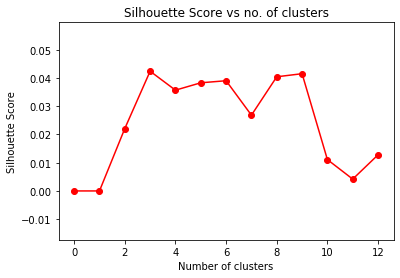

Optimal cluster number is  3

Number of Lines in Summarized text 
6

MG Rover China tie-up 'delayed'

MG Rover's proposed tie-up with China's top carmaker has been delayed due to concerns by Chinese regulators, according to the Financial Times. The paper said Chinese officials had been irritated by Rover's disclosure of its talks with Shanghai Automotive Industry Corp in October. The proposed deal was seen as crucial to safeguarding the future of Rover's Longbridge plant in the West Midlands. There has been continued speculation about the viability of Rover's Longbridge plant because of falling sales and unfashionable models. The paper said that Chinese officials believe cutbacks will be required to keep the MG Rover's costs in line with revenues. It also said that the production of new models through the joint venture would take at least eighteen months.

Document  213

Number of Lines in Actual text
19
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 15 16 17 18 

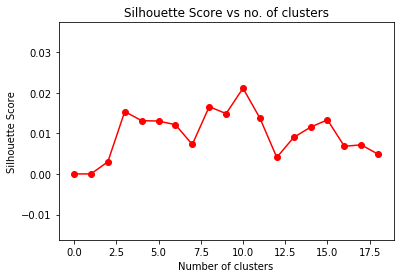

Optimal cluster number is  10

Number of Lines in Summarized text 
2

US bank boss hails 'genius' Smith

US Federal Reserve chairman Alan Greenspan has given a speech at a Scottish church in honour of the pioneering economist, Adam Smith. Dr Greenspan - who became chairman of the Federal Reserve for an unprecedented fifth term in June 2004 - will step down in January next year.

Document  214

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


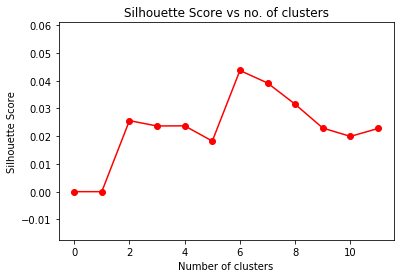

Optimal cluster number is  6

Number of Lines in Summarized text 
2

Economy 'strong' in election year

UK businesses are set to prosper during the next few months - but this could trigger more interest rate rises, according to a report. Rates are likely to rise after the anticipated general election in May.

Document  215

Number of Lines in Actual text
23
2 3 4 5 6 7 8 9 10 11 12 13 14 15 16

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 17 18 19 20 21 22 

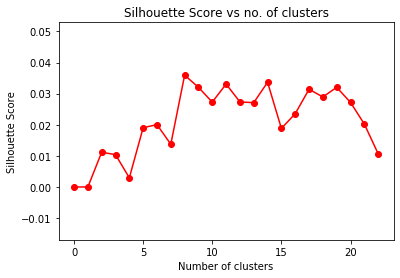

Optimal cluster number is  8

Number of Lines in Summarized text 
7

SEC to rethink post-Enron rules

The US stock market watchdog's chairman has said he is willing to soften tough new US corporate governance rules to ease the burden on foreign firms. European firms have protested that US laws introduced after the Enron scandal make Wall Street listings too costly. The US regulator said foreign firms may get extra time to comply with a key clause in the Sarbanes-Oxley Act. The Act comes into force in mid-2005. The Act also applies to firms with more than 300 US shareholders, a situation many firms without US listings could find themselves in. The SEC has already delayed implementation of this clause for smaller firms - including US ones - with market capitalisations below $700m (Â£374m). A delegation of European firms visited the SEC in December to press for change, the Financial Times reported.

Document  216

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 16 

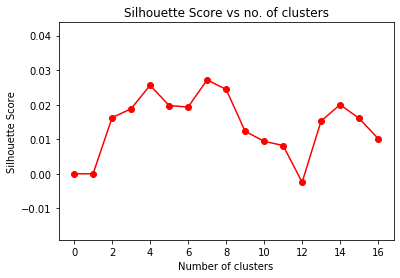

Optimal cluster number is  7

Number of Lines in Summarized text 
4

Nissan names successor to Ghosn

Nissan has named a lifetime employee to run its operations after Carlos Ghosn, its highly successful boss, takes charge at Renault. As chief operating officer, Toshiyuki Shiga will run Nissan on a daily basis, although Mr Ghosn, who masterminded its recovery, will remain chief executive. Mr Ghosn is to become chairman and chief executive of Renault, which owns 44% of the Japanese carmaker, in April. In his new job as Renault chief executive, Mr Ghosn will devote 40% of his time to Renault, 40% to Nissan and the rest to the group's activities in North America and other key markets.

Document  217

Number of Lines in Actual text
23
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


15 16 17 18 19 20 21 22 

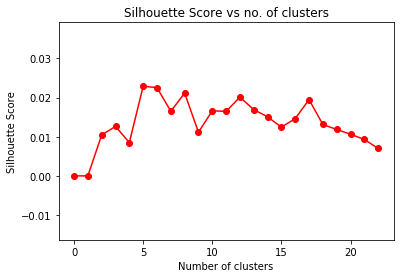

Optimal cluster number is  5

Number of Lines in Summarized text 
9

Ukraine trims privatisation check

Ukraine is to review "dozens" of state asset sales as the country's new administration tackles corruption. Ukraine recently ousted long-serving leader Leonid Kuchma and has said it wants closer European Union links. The comments came as Viktor Yushchenko prepared to head to Brussels to meet with US President George W Bush and other North Atlantic Treaty Organisation (Nato) leaders. Mr Yushchenko recently defeated Moscow-backed presidential candidate and Prime Minister Viktor Yanukovych at the polls, and has made no secret of his wish to fight corruption and make Ukraine more transparent. Earlier this month, new Prime Minister Yulia Tymoshenko said as many as 3,000 firms may have their privatisations put under the spotlight. "We acknowledge that business in Ukraine is now shaped and 98% of privatisations were carried out according to the law," Mr Yushchenko said on Monday. "We have tr

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


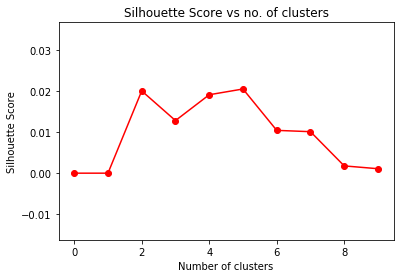

Optimal cluster number is  5

Number of Lines in Summarized text 
4

Absa and Barclays talks continue

South Africa biggest retail bank Absa has said it is still in talks with UK bank Barclays over the sale of majority stake in the group. In November, Absa said it was close to striking a deal with Barclays. "Discussions with Barclays are continuing, but shareholders are advised that no agreement has been reached as to any offer being made by Barclays to acquire a majority stake in Absa," Absa said in a statement. Absa currently has a market value of about $8.5bn (Â£4.4bn).

Document  219

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


13 

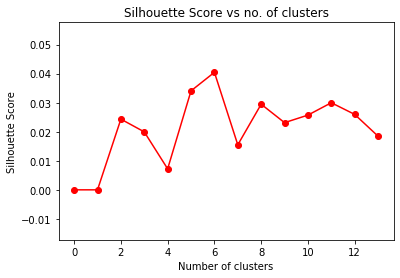

Optimal cluster number is  6

Number of Lines in Summarized text 
4

Rescue hope for Borussia Dortmund

Shares in struggling German football club Borussia Dortmund slipped on Monday despite the club agreeing a rescue plan with creditors on Friday. News of the deal had boosted shares in the club on Friday, but the stock slipped back 7% during Monday morning. On 14 March, one of these creditors - property investment fund Molsiris which owns the club's stadium - holds its AGM at which it will discuss the rescue plan. Borussia Dortmund also is facing calls to appoint executives from outside the club.

Document  220

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


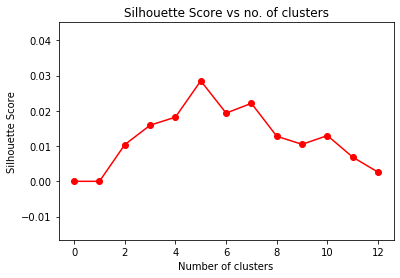

Optimal cluster number is  5

Number of Lines in Summarized text 
4

Standard Life concern at LSE bid

Standard Life is the latest shareholder in Deutsche Boerse to express concern at the German stock market operator's plans to buy the London Stock Exchange. Reports say Standard Life, which owns a 1% stake in Deutsche Boerse, may seek a shareholder vote on the issue. "The onus is on Deutsche Boerse's management to demonstrate why the purchase of the LSE creates more value for shareholders than other strategies, such as a buyback," said Richard Moffat, investment director of UK Equities at Standard Life Investments. And TCI which holds about 5%, has made a request for an extraordinary shareholders meeting to be held to vote on replacing the company's entire supervisory board.

Document  221

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


15 16 

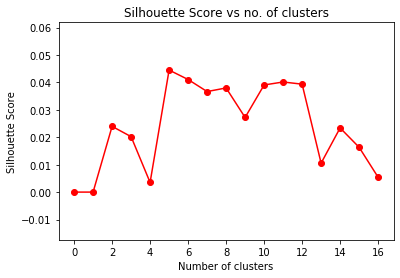

Optimal cluster number is  5

Number of Lines in Summarized text 
6

BP surges ahead on high oil price

Oil giant BP has announced a 26% rise in annual profits to $16.2bn (Â£8.7bn) on the back of record oil prices. Last week, rival Shell reported an annual profit of $17.5bn - a record profit for a UK-listed company. The company is earning about $1.8m an hour. Despite the record annual profits figure, BP's performance was below the expectations of some City analysts. Its profit rise for the year included profits of $3.65bn (Â£1.97bn) for the final three months of 2004 - up from $2.89bn a year ago but below its third quarter. BP put production for the year at 3.997 billion barrels of oil, up 10% on 2003, but slightly lower than the four billion barrels it had initially aimed for.

Document  222

Number of Lines in Actual text
24
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


13 14 15 16 17 18 19 20 21 22 23 

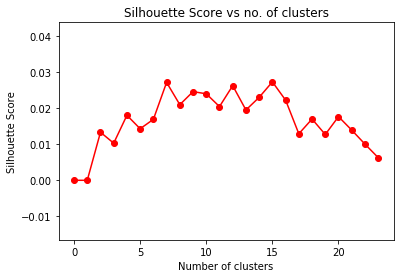

Optimal cluster number is  15

Number of Lines in Summarized text 
4

Oil companies get Russian setback

International oil and mining companies have reacted cautiously to Russia's decision to bar foreign firms from natural resource tenders in 2005. The Federal Natural Resources Agency said "the government is interested in letting Russian companies develop strategic resources". The foreign ownership issue will be dealt with according to Russia's competition law, natural resources minister Yuri Trutnev was quoted as saying by the Interfax news agency. Russia recently wrested back control of a large chunk of its oil industry from stock-market listed company Yukos, a move that prompted calls of outrage from many investors.

Document  223

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


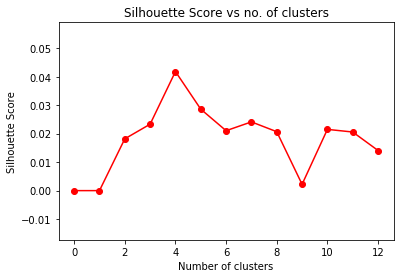

Optimal cluster number is  4

Number of Lines in Summarized text 
5

Gaming firm to sell UK dog tracks

Six UK greyhound tracks have been put up for sale by gaming group Wembley as part of a move which will lead to the break-up of the group. Wembley announced the planned sale as it revealed it was to offload its US gaming division to BLB Investors. The sale of the US gaming unit will leave Wembley with its UK business. "Whilst the completion of the sale of the US Gaming Division remains subject to a number of conditions, we believe this development is a positive step towards the maximisation of value for shareholders," said Wembley chairman Claes Hultman. Wembley sold the English national football stadium in 1999 to concentrate on its gaming operations.

Document  224

Number of Lines in Actual text
25
2 3 4 5 6 7 8 9 10 11 12

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 13 14 15 16 17 18 19 20 21 22 23 24 

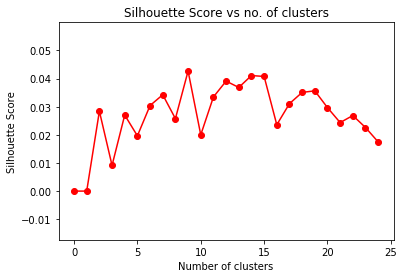

Optimal cluster number is  9

Number of Lines in Summarized text 
6

Man Utd to open books to Glazer

Manchester United's board has agreed to give US tycoon Malcolm Glazer access to its books. Many of Manchester United's supporters own shares in the club, and the fan-based group Shareholders United is strongly opposed to any takeover by Mr Glazer. Manchester United's response comes as little surprise, as the board made clear. At present, Mr Glazer and his family hold a 28.1% stake, making them Manchester United's second biggest shareholders. If the family makes a formal offer, they will need the support of the club's biggest shareholders. Irish horse racing millionaires JP McManus and John Magnier own 29% of United through their investment vehicle Cubic Expression, and have yet to express a view on the bid approach.

Document  225

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


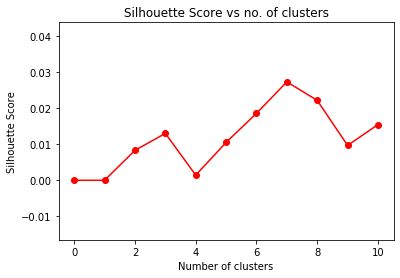

Optimal cluster number is  7

Number of Lines in Summarized text 
2

Sales 'fail to boost High Street'

The January sales have failed to help the UK High Street recover from a poor Christmas season, a survey has found. The previous BRC survey found Christmas 2004 was the worst for 10 years for retailers.

Document  226

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


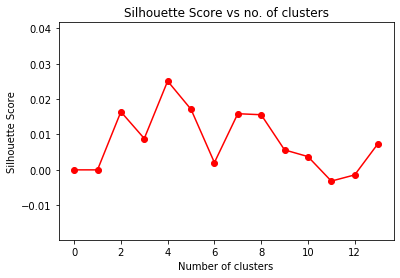

Optimal cluster number is  4

Number of Lines in Summarized text 
3

McDonald's to sponsor MTV show

McDonald's, the world's largest restaurant chain, is to sponsor a programme on music channel MTV as part of its latest youth market promotion. The show Advance Warning highlights new talent and MTV reckons it will give McDonald's access to nearly 400 million homes in 162 countries. Hooking up with MTV is expected to add extra momentum to McDonald's recent revival.

Document  227

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


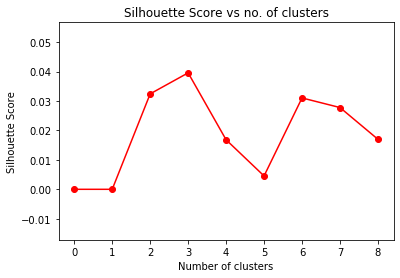

Optimal cluster number is  3

Number of Lines in Summarized text 
1

Call to save manufacturing jobs

The Trades Union Congress (TUC) is calling on the government to stem job losses in manufacturing firms by reviewing the help it gives companies.

Document  228

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


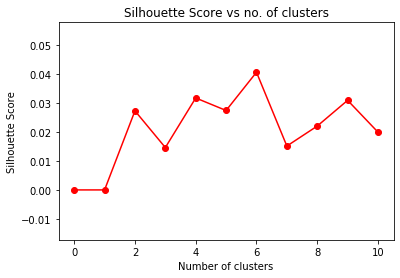

Optimal cluster number is  6

Number of Lines in Summarized text 
1

Tsunami 'to hit Sri Lanka banks'

Sri Lanka's banks face hard times following December's tsunami disaster, officials have warned.

Document  229

Number of Lines in Actual text
24
2 3 4 5 6 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


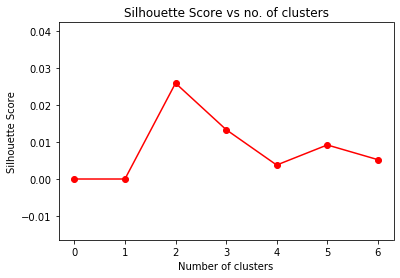

Optimal cluster number is  2

Number of Lines in Summarized text 
4

Shares rise on new Man Utd offer

Shares in Manchester United closed up 4.75% on Monday following a new offer from US tycoon Malcolm Glazer. The board of the football club is expected to meet early this week to discuss the latest proposal, which values the club at Â£800m ($1.5bn). Manchester United revealed on Sunday that it had received a detailed proposal from Mr Glazer, which looks set to receive more serious scrutiny. Supporters' group Shareholders United, however, urged the club to reject the new deal.

Document  230

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


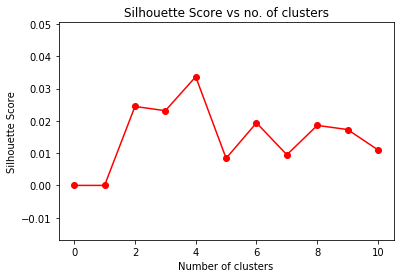

Optimal cluster number is  4

Number of Lines in Summarized text 
4

Yukos drops banks from court bid

Russian oil company Yukos has dropped the threat of legal action against five banks it had accused of involvement in the sale of its key Yugansk unit. The company has also accused Gazprom, the Russian Federation and two other Russian firms. Gazprom had been expected to win the December auction, but ended up not bidding. The firm, whose finance chief is now based in the US, filed for bankruptcy in Houston, Texas, and sought a court injunction against the sale.

Document  231

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


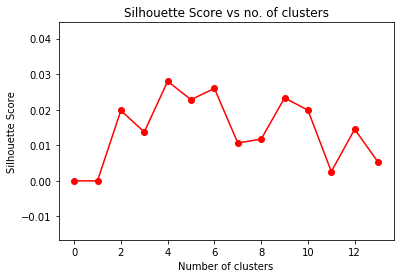

Optimal cluster number is  4

Number of Lines in Summarized text 
4

Venezuela reviews foreign deals

Venezuela is to review all foreign investment in its mining industries in an effort to strengthen its indigenous industrial output. The review will cover production of gold, aluminium and iron ore although it excludes the country's oil sector. Announcing the review of raw material production, minister Victor Alvarez said the government would seek to transfer technology, training capability and content from projects with foreign partners. Companies from the United States, Canada, France and Switzerland all have substantial investments in Venezuela's mining sector.

Document  232

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


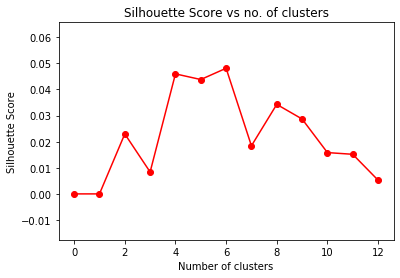

Optimal cluster number is  6

Number of Lines in Summarized text 
3

Lloyd's of London head chides FSA

The head of Lloyd's of London, the insurance market, has criticised Britain's financial watchdog, the Financial Services Authority (FSA). The call came in a speech on improving the London insurance market. All of the insurance business written in the Lloyd's market is placed via brokers.

Document  233

Number of Lines in Actual text
7
2 3 4 5 6 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


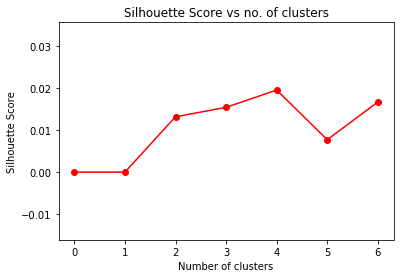

Optimal cluster number is  4

Number of Lines in Summarized text 
3

Bat spit drug firm goes to market

A German firm whose main product is derived from the saliva of the vampire bat is looking to raise more than 70m euros ($91m; Â£49m) on the stock market. Its main drug, desmoteplase, is based on a protein in the bat's saliva. The protein stops blood from clotting - which helps the bat to drink from its victims, but could also be used to help stroke sufferers.

Document  234

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


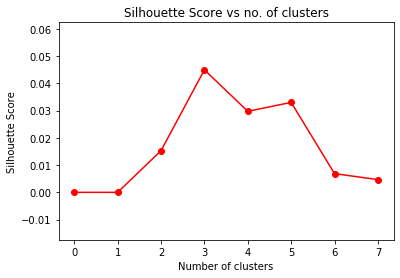

Optimal cluster number is  3

Number of Lines in Summarized text 
2

Vodafone appoints new Japan boss

Vodafone has drafted in its UK chief executive William Morrow to take charge of its troubled Japanese operation. Vodafone had pinned its hopes on the launch of its 3G phones in November but demand for them has been slow.

Document  235

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


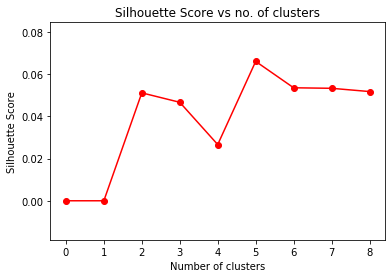

Optimal cluster number is  5

Number of Lines in Summarized text 
2

Pension hitch for long-living men

Male life expectancy is much higher than originally estimated, leading pension researchers have said. Researchers have not updated life expectancy projections for women, who on average live longer than men.

Document  236

Number of Lines in Actual text
19
2 3 4 5 6 7 8 9 10 11 12 13 14 15

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 16 17 18 

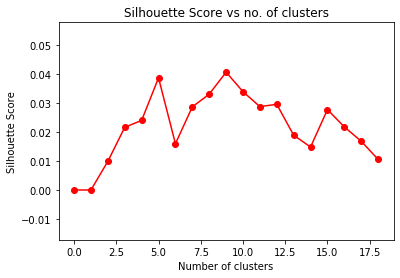

Optimal cluster number is  9

Number of Lines in Summarized text 
1

Card fraudsters 'targeting web'

New safeguards on credit and debit card payments in shops has led fraudsters to focus on internet and phone payments, an anti-fraud agency has said.

Document  237

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


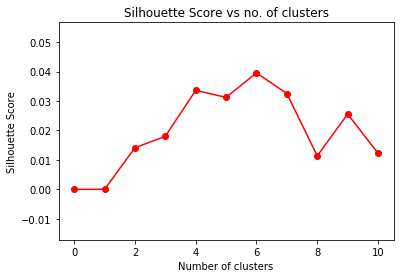

Optimal cluster number is  6

Number of Lines in Summarized text 
3

Britannia members' Â£42m windfall

More than 800,000 Britannia Building Society members are to receive a profit share worth on average Â£52 each. Members of the UK's second largest building society will share Â£42m, with 100,000 receiving a windfall of more than Â£100. Depending on how much they borrow or invest, members earn "reward" points which entitle them to a share of the society's profits.

Document  238

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12 13 14 15 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


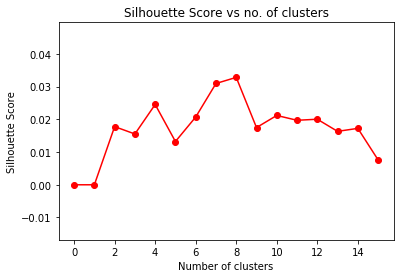

Optimal cluster number is  8

Number of Lines in Summarized text 
4

Firms pump billions into pensions

Employers have spent billions of pounds propping up their final salary pensions over the past year, research suggests. Many firms are struggling to keep this type of scheme open, because of rising costs and increased liabilities. A final salary scheme, also known as a defined benefit scheme, promises to pay a pension related to the salary the scheme member is earning when they retire. The rising cost of maintaining such schemes has led many employers to replace final salary schemes with money purchase, or defined contribution, schemes.

Document  239

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


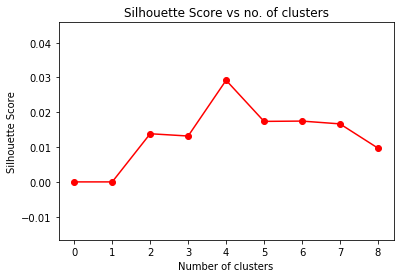

Optimal cluster number is  4

Number of Lines in Summarized text 
3

UK homes hit Â£3.3 trillion total

The value of the UK's housing stock reached the Â£3.3 trillion mark in 2004 - triple the value 10 years earlier, a report indicates. More than a third of the UK's private housing assets - representing more than a trillion pounds in value - are concentrated in London and the South East, the Halifax's figures indicate. Halifax's own monthly figures on house sales - issued on Thursday - suggest the average price of a British property now stands at Â£163,748 after a 0.8% rise in January.

Document  240

Number of Lines in Actual text
12
Number of Lines in Summarized text 
0

Document  241

Number of Lines in Actual text
35


C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 

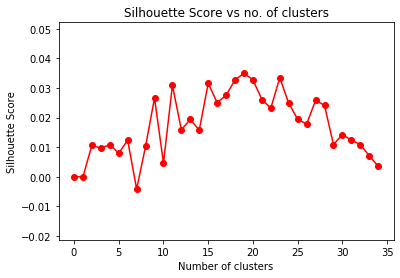

Optimal cluster number is  19

Number of Lines in Summarized text 
5

G7 backs Africa debt relief plan

G7 finance ministers have backed plans to write off up to 100% of the debts of some of the world's poorest countries. But the US says it cannot support Mr Brown's International Finance Facility to boost aid to developing countries. The International Monetary Fund (IMF) is to look at a proposal to use its gold supplies to help the debt relief effort when it meets in April. But UK plans for an International Finance Facility (IFF) to help deal with debt in the developing world have not been agreed. It is a key element of his proposals for a modern version of the Marshall Plan, which brought US aid to rebuild Europe after World War II, for the developing world.

Document  242

Number of Lines in Actual text
32
2 3 4 5 6

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 

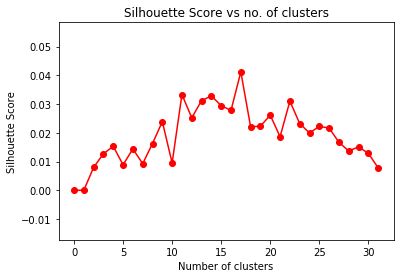

Optimal cluster number is  17

Number of Lines in Summarized text 
2

Q&A: Malcolm Glazer and Man Utd

The battle for control of Manchester United has taken another turn after the club confirmed it had received a fresh takeover approach from US business tycoon Malcolm Glazer. Malcolm Glazer was little-known in the UK until he started to build up his stake in Manchester United in late 2003.

Document  243

Number of Lines in Actual text
42
2 3 4 5 6

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 

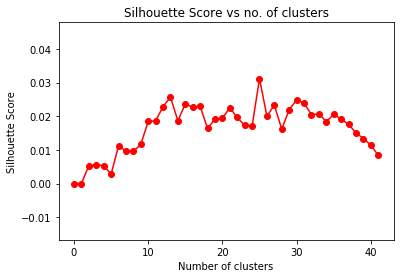

Optimal cluster number is  25

Number of Lines in Summarized text 
4

Making your office work for you

Our mission to brighten up your working lives continues - and this time, we're taking a long hard look at your offices. This week, we're hearing from Marianne Petersen, who is planning to convert a barn in Sweden into a base for her freelance writing work. In order for a virtual office to succeed, keeping the boundary between work and home life is essential. It may be useful to be quite rigid about who is allowed to visit, and to keep strict office hours.

Document  244

Number of Lines in Actual text
24
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 15 16 17 18 19 20 21 22 23 

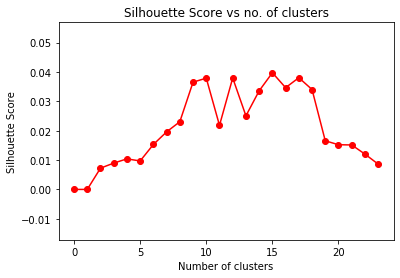

Optimal cluster number is  15

Number of Lines in Summarized text 
2

Market unfazed by Aurora setback

As the Aurora limped back to its dock on 20 January, a blizzard of photos and interviews seemed to add up to an unambiguous tale of woe. The hundreds of disappointed passengers who have now had to give up the opportunity to spend the next three months on the Aurora have got both a refund and a credit for another cruise.

Document  245

Number of Lines in Actual text
48
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 

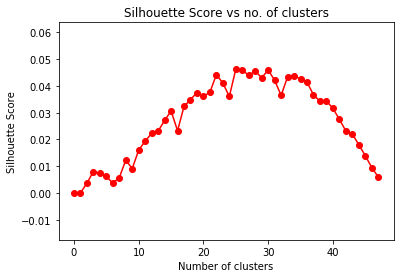

Optimal cluster number is  25

Number of Lines in Summarized text 
2

The 'ticking budget' facing the US

The budget proposals laid out by the administration of US President George W Bush are highly controversial. The Bush administration's chosen remedy is the least feasible one.

Document  246

Number of Lines in Actual text
22
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


11 12 13 14 15 16 17 18 19 20 

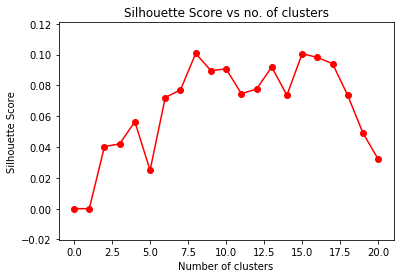

Optimal cluster number is  8

Number of Lines in Summarized text 
2

Ebbers 'aware' of WorldCom fraud

Former WorldCom boss Bernie Ebbers was directly involved in the $11bn financial fraud at the firm, his closest associate has told a US court. "He [Ebbers] has got a hands-on grasp of financial information," Mr Sullivan told a New York court.

Document  247

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


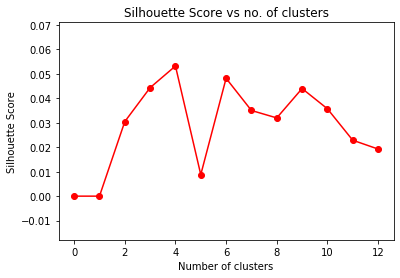

Optimal cluster number is  4

Number of Lines in Summarized text 
3

Renault boss hails 'great year'

Strong sales outside western Europe helped Renault boost its profits by more than 40% in 2004 although the firm warned of lower margins this year. The firm said strong demand outside western Europe and the good performance of its Megane range lifted its results. Growth came mainly from outside western Europe, with particularly strong sales in Turkey, Russia and North Africa.

Document  248

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


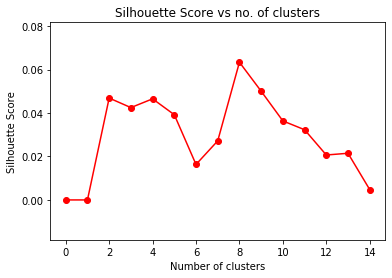

Optimal cluster number is  8

Number of Lines in Summarized text 
3

Survey confirms property slowdown

Government figures have confirmed a widely reported slowdown of the UK's housing market in late 2004. The government figures are the first official confirmation of falls in the market at the end of 2004. Although the figures point to a slowdown in the market, the most recent surveys from Nationwide and Halifax have indicated the market may be undergoing a revival.

Document  249

Number of Lines in Actual text
27
2 3 4 5 6 7 8 9 10 11 12 13 14

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 15 16 17 18 19 20 21 22 23 24 25 26 

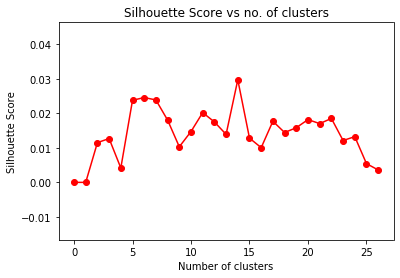

Optimal cluster number is  14

Number of Lines in Summarized text 
3

Bush budget seeks deep cutbacks

President Bush has presented his 2006 budget, cutting domestic spending in a bid to lower a record deficit projected to peak at $427bn (Â£230bn) this year. The state department's planned budget would rise to just under $23bn - a fraction of the defence department's request - including almost $6bn to assist US allies in the "war on terror". Yet Mr Bush's proposed spending of $3bn on that project is well below his initial promise of $5bn.

Document  250

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


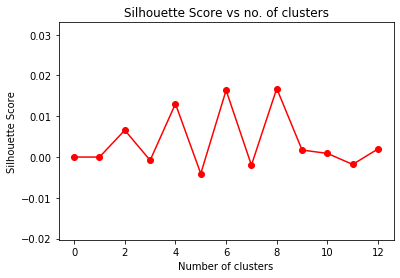

Optimal cluster number is  8

Number of Lines in Summarized text 
6

Profits stall at China's Lenovo

Profits at Chinese computer firm Lenovo have stood still amid slowing demand at home and stiffening competition. Lenovo's profit for the three months to December was HK$327m (US$42m; Â£22m), less than 1% up on the year before. The company is still by far the biggest player in China, with more than a quarter of the market. But Western firms such as Dell and Hewlett-Packard are also mounting a more solid fight for market share in China, and Lenovo's sales were down 3.7% by revenue to HK$6.31bn. If the $1.75bn agreement Lenovo signed with IBM on 8 December goes through, it will mark the end of an era. But investors have been less than impressed with Lenovo's move, designed to take it out of China and further onto the world stage.

Document  251

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


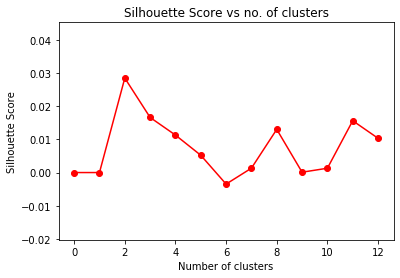

Optimal cluster number is  2

Number of Lines in Summarized text 
4

MCI shares climb on takeover bid

Shares in US phone company MCI have risen on speculation that it is in takeover talks. Other firms have also expressed an interest in MCI, the second-largest US long-distance phone firm, and may now table rival bids, analysts said. Competition has intensified and fixed-line phone providers such as MCI and AT&T have seen themselves overtaken by rivals. Buying MCI would give Qwest, a local phone service provider, access to MCI's global network and business-based subscribers.

Document  252

Number of Lines in Actual text
26
2 3 4 5 6 7 8 9 10 11 12 13 14 15

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 16 17 18 19 20 21 22 23 24 25 

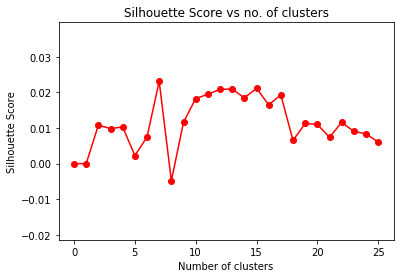

Optimal cluster number is  7

Number of Lines in Summarized text 
9

BT offers equal access to rivals

BT has moved to pre-empt a possible break-up of its business by offering to cut wholesale broadband prices and open its network to rivals. At the time, Ofcom offered BT the choice of change or splitting into two. BT's competitors have frequently accused it of misusing its status as the former telecoms monopoly and controller of access to many customers to favour its own retail arm. "Central to the proposals are plans by BT to offer operators lower wholesale prices, faster broadband services and transparent, highly-regulated access to BT's local network," the former monopoly said in a statement. The group is to set up a new Access Services division - with a separate board which would include independent members - to ensure equal access for rivals to the "local loop", the copper wires that run between telephone exchanges and households. It added that it plans to invest Â£10bn in the nex

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


12 13 14 15 

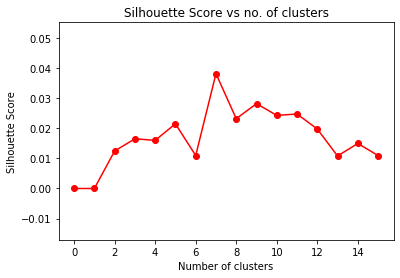

Optimal cluster number is  7

Number of Lines in Summarized text 
4

News Corp eyes video games market

News Corp, the media company controlled by Australian billionaire Rupert Murdoch, is eyeing a move into the video games market. According to the Financial Times, chief operating officer Peter Chernin said that News Corp is "kicking the tyres of pretty much all video games companies". And with their price tags reflecting the heavy investment by development companies, video games are proving almost as profitable as they are fun. Mr Chernin, however, told the FT that News Corp was finding it difficult to identify a suitable target.

Document  255

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


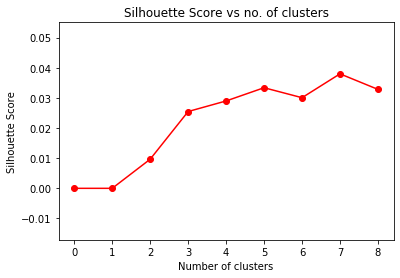

Optimal cluster number is  7

Number of Lines in Summarized text 
1

Call to overhaul UK state pension

The UK pension system has been branded inadequate and too complex by a leading retirement think-tank.

Document  256

Number of Lines in Actual text
11
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


8 9 10 

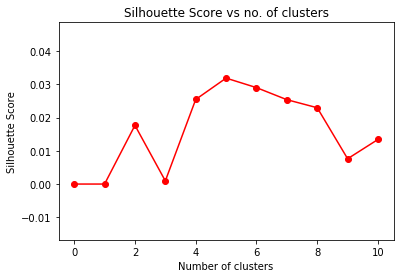

Optimal cluster number is  5

Number of Lines in Summarized text 
2

Singapore growth at 8.1% in 2004

Singapore's economy grew by 8.1% in 2004, its best performance since 2000, figures from the trade ministry show. Economic growth is set to halve in Singapore this year to between 3% and 5%.

Document  257

Number of Lines in Actual text
22
2 3 4 5 6 7 8 9 10 11 12 13 14 15

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 16 17 18 19 20 21 

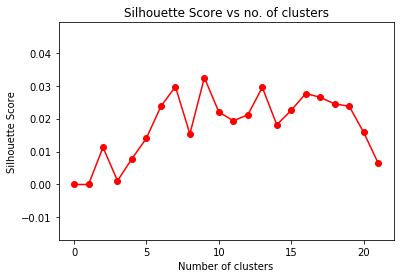

Optimal cluster number is  9

Number of Lines in Summarized text 
3

Turkey knocks six zeros off lira

Turkey is to relaunch its currency on Saturday, knocking six zeros off the lira in the hope of boosting trade and powering its growing economy. The government hopes the change will be seen as a promise of growing economic stability as Turkey embarks on the long process of trying to join the European Union. The government hopes that the new currency will cement the country's economic progress, two weeks after EU leaders set a date for the start of Turkey's accession talks.

Document  258

Number of Lines in Actual text
20
2 3 4 5 6 7 8 9 10 11 12

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 13 14 15 16 17 18 19 

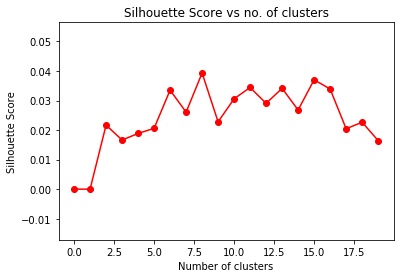

Optimal cluster number is  8

Number of Lines in Summarized text 
3

S Korea spending boost to economy

South Korea will boost state spending next year in an effort to create jobs and kick start its sputtering economy. The problem facing South Korea is that many consumers are reeling from the effects of a credit bubble that only recently burst. As a result, South Korea will give private companies also will be given the chance to build schools, hospitals, houses and other public buildings.

Document  259

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


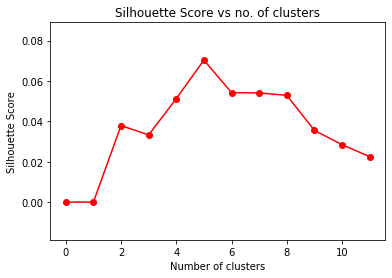

Optimal cluster number is  5

Number of Lines in Summarized text 
4

Latin America sees strong growth

Latin America's economy grew by 5.5% in 2004, its best performance since 1980, while exports registered their best performance in two decades. The United Nations' Economic Commission for Latin America and the Caribbean said the region grew by 5.5% this year. Nevertheless, the Economic Commission for Latin America and the Caribbean (ECLAC) still forecasts growth of 4% for 2005. ECLAC also said that the six largest Latin American economies (Argentina, Brazil, Chile, Colombia, Mexico and Venezuela) grew by more than 3% for only the second time in 20 years.

Document  260

Number of Lines in Actual text
26
2 3 4 5 6 7 8 9 10 11 12 13 14

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 15 16 17 18 19 20 21 22 23 24 25 

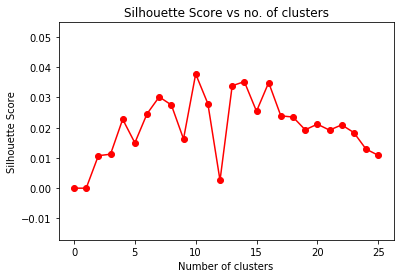

Optimal cluster number is  10

Number of Lines in Summarized text 
1

Asia shares defy post-quake gloom

Indonesian, Indian and Hong Kong stock markets reached record highs.

Document  261

Number of Lines in Actual text
33
2 3 4 5 6 7 8 9 10 11 12

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 

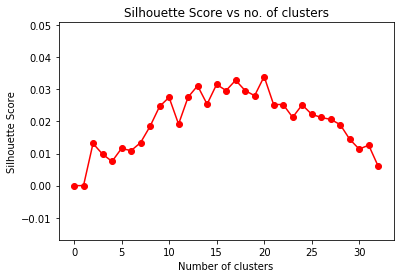

Optimal cluster number is  20

Number of Lines in Summarized text 
1

Booming markets shed few tears

The market, former British government minister Michael Heseltine once said, has no morality.

Document  262

Number of Lines in Actual text
33
2 3 4 5 6 7

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 

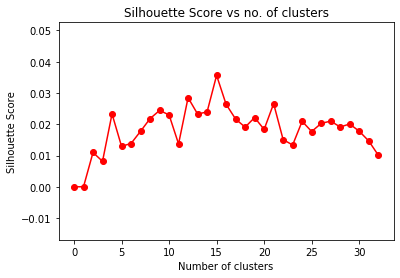

Optimal cluster number is  15

Number of Lines in Summarized text 
2

Asian quake hits European shares

Shares in Europe's leading reinsurers and travel firms have fallen as the scale of the damage wrought by tsunamis across south Asia has become apparent. Insurers and reinsurance firms were also under pressure in Europe.

Document  263

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 13 14 15 

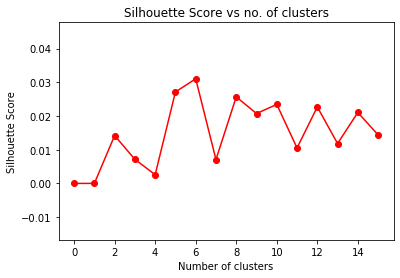

Optimal cluster number is  6

Number of Lines in Summarized text 
4

Split-caps pay Â£194m compensation

Investors who lost money following the split-capital investment trust scandal are to receive Â£194m compensation, the UK's financial watchdog has announced. The paying of compensation will be overseen by an independent company, the FSA said. In May, the FSA was widely reported as having asked firms to pay up to Â£350m in compensation. Mr McIvor told the BBC that the final settlement figure was smaller because two unnamed firms had pulled out of the compensation negotiations.

Document  264

Number of Lines in Actual text
18
2 3 4 5 6 7 8 9 10 11 12 13 14 15

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 16 17 

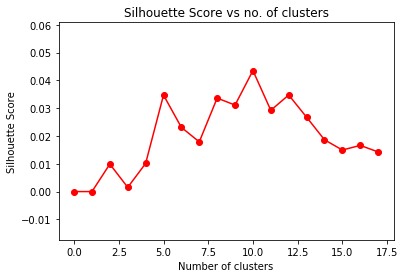

Optimal cluster number is  10

Number of Lines in Summarized text 
3

French suitor holds LSE meeting

European stock market Euronext has met with the London Stock Exchange (LSE) amid speculation that it may be ready to launch a cash bid. There was speculation Euronext would use Friday's meeting as an opportunity to take advantage of growing disquiet over Deutsche Boerse's own plans for dominance over the London market. German politicians are also said to be angry over the market operator's promise to move its headquarters to London if a bid were successful.

Document  265

Number of Lines in Actual text
13
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 11 12 

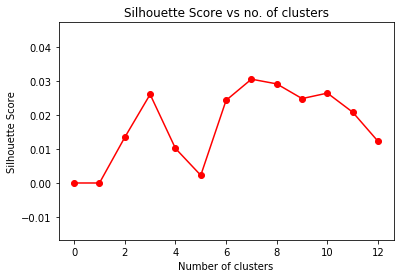

Optimal cluster number is  7

Number of Lines in Summarized text 
2

Troubled Marsh under SEC scrutiny

The US stock market regulator is investigating troubled insurance broker Marsh & McLennan's shareholder transactions, the firm has said. Prosecutors allege that Marsh - the world's biggest insurance broker - and other US insurance firms may have fixed bids for corporate cover.

Document  266

Number of Lines in Actual text
31
2 3 4 5 6

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 

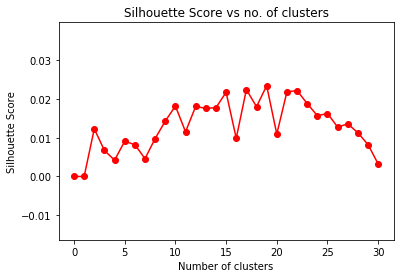

Optimal cluster number is  19

Number of Lines in Summarized text 
2

Could Yukos be a blessing in disguise? Does this analysis make sense?

Document  267

Number of Lines in Actual text
10
2

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 3 4 5 6 7 8 9 

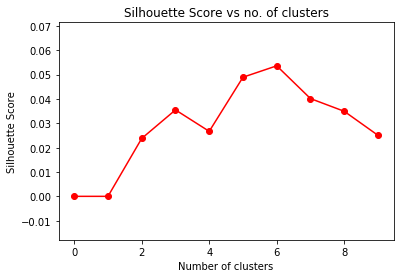

Optimal cluster number is  6

Number of Lines in Summarized text 
2

Nasdaq planning $100m share sale

The owner of the technology-dominated Nasdaq stock index plans to sell shares to the public and list itself on the market it operates. According to a registration document filed with the Securities and Exchange Commission, Nasdaq Stock Market plans to raise $100m (Â£52m) from the sale.

Document  268

Number of Lines in Actual text
39
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 

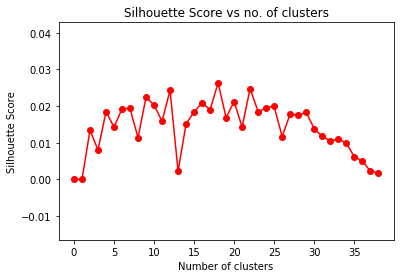

Optimal cluster number is  18

Number of Lines in Summarized text 
2

Giving financial gifts to children

Your child or grandchild may want the latest toy this Christmas, but how about giving them a present that will help their financial future? The only drawback with all financial gifts is that the children gain an absolute right to the money at age 18, and parents will have no control over how it is spent.

Document  269

Number of Lines in Actual text
19
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 11 12 13 14 15 16 17 18 

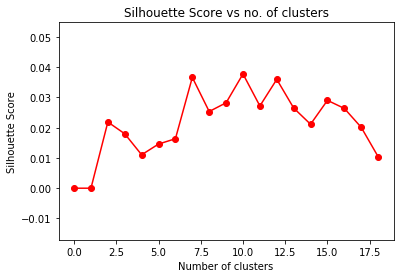

Optimal cluster number is  10

Number of Lines in Summarized text 
5

Air China in $1bn London listing

China's national airline is to make its overseas stock market debut with a dual listing in London and Hong Kong, the London Stock Exchange (LSE) has said. For China's aviation authorities, the listing is part of the modernisation of its airline sector to cope with soaring demand for air travel. The LSE has been working hard to woo Chinese companies to choose London, rather than New York for their listings. "The London Stock Exchange offers ambitious Chinese companies access to the world's most international equity market combined with high regulatory and corporate governance standards," she said. Air China's primary listing will be in Hong Kong, with a secondary listing in London.

Document  270

Number of Lines in Actual text
26
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


13 14 15 16 17 18 19 20 21 22 23 24 25 

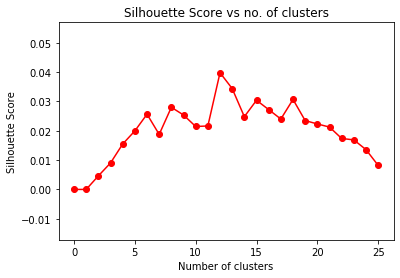

Optimal cluster number is  12

Number of Lines in Summarized text 
5

Oil prices reach three-month low

Oil prices have fallen heavily for a second day, closing at three-month lows after news that US crude stocks have improved ahead of winter. Weak US fuel and heating oil stocks have been a persistent factor in pushing up oil prices. The stronger fuel inventories helped boost US stock markets to nine-month highs on Wednesday, though only the Nasdaq index had hung onto those gains by the end of Thursday. The long-awaited drop in oil prices helped to ease persistent investor jitters over the impact of energy costs on company profits and economic growth. Fears still remain over the level of US heating oil stocks, which are rising but remain down on 2004 levels.

Document  271

Number of Lines in Actual text
18


C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 

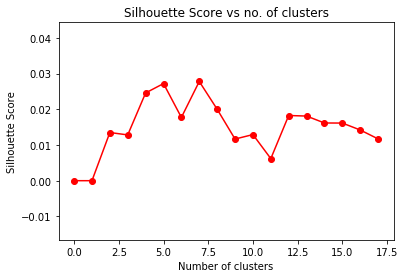

Optimal cluster number is  7

Number of Lines in Summarized text 
3

Arsenal 'may seek full share listing'

Arsenal vice-chairman David Dein has said the club may consider seeking a full listing for its shares on the London Stock Exchange. When Arsenal moves to its new stadium it will see its proportion of turnover from media earnings drop from 52% this season to 34% in two years' time. The club is hoping to increase matchday earnings from 29% to 40% of turnover, and has not ruled out other money-earning means, including a full share listing.

Document  272

Number of Lines in Actual text
16
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 11 12 13 14 15 

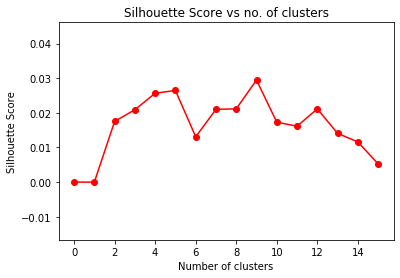

Optimal cluster number is  9

Number of Lines in Summarized text 
2

Markets signal Brazilian recovery

The Brazilian stock market has risen to a record high as investors display growing confidence in the durability of the country's economic recovery. The market's buoyancy reflects optimism about the Brazilian economy, which could grow by as much as 4.5% in 2004.

Document  273

Number of Lines in Actual text
23
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


10 11 12 13 14 15 16 17 18 19 20 21 22 

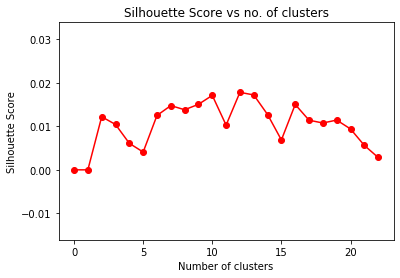

Optimal cluster number is  12

Number of Lines in Summarized text 
2

Markets fall on weak dollar fears

Rising oil prices and the sinking dollar hit shares on Monday after a finance ministers' meeting and stern words from Fed chief Alan Greenspan. Oil pushed higher too on Monday, as investors fretted about cold weather in the US and Europe and a potential output cut from oil producers' group Opec, although prices had cooled by the end of the day.

Document  274

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


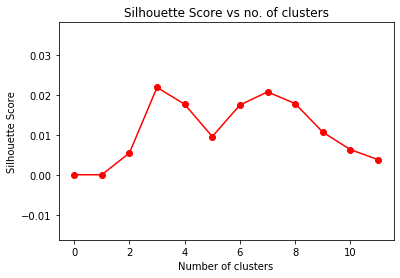

Optimal cluster number is  3

Number of Lines in Summarized text 
5

Google shares fall as staff sell

Shares in Google have fallen 6.7% after employees and early investors in the web search took advantage of the first chance to sell their holdings. Selling the shares could turn many of Google's workers into millionaires. There were fears that the potential increase of shares in circulation from Tuesday would ease demand for stock. However, analysts say they expected most shareholders would be holding back from selling all their shares immediately, as Google's good performance and future growth potential means demand will hold. Google's main service - its internet search - is free to users, so the firm makes much of its money from selling advertising space linked to the words for which its users search.

Document  275

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 12 13 

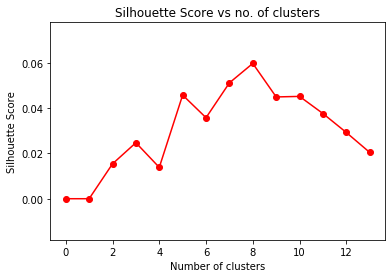

Optimal cluster number is  8

Number of Lines in Summarized text 
2

Five million Germans out of work

Germany's unemployment figure rose above the psychologically important level of five million last month. Unemployment has not been this high in Germany since the 1930s.

Document  276

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


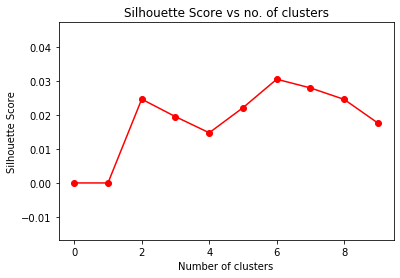

Optimal cluster number is  6

Number of Lines in Summarized text 
3

India power shares jump on debut

Shares in India's largest power producer, National Thermal Power Corp (NTPC) have risen 13% on their stock market debut. It was India's second $1bn stock debut in three months, coming after the flotation by software firm Tata. The firm is the largest utility company in India, and the sixth largest power producer in the world.

Document  277

Number of Lines in Actual text
40
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 

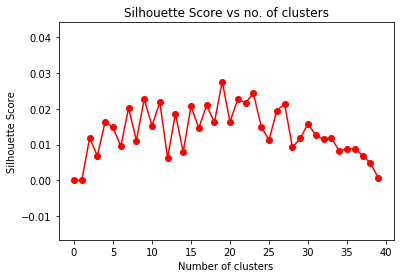

Optimal cluster number is  19

Number of Lines in Summarized text 
3

Turkey turns on the economic charm

Three years after a gruelling economic crisis, Turkey has dressed its economy to impress. Income and corporate taxes will be cut next year in order to attract $15bn of foreign investment over the next three years. Critics insist that much of the optimism about Turkey's economic roadmap has been over-egged - an argument amplified by a 134% rise in the country's current account deficit to $10.7bn during the first 10 months of this year.

Document  278

Number of Lines in Actual text
12
2 3

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 4 5 6 7 8 9 10 11 

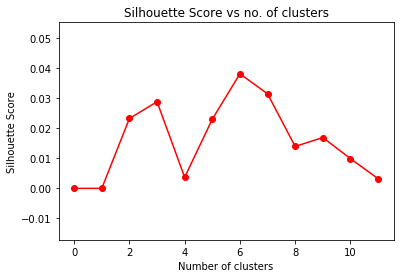

Optimal cluster number is  6

Number of Lines in Summarized text 
4

SBC plans post-takeover job cuts

US phone company SBC Communications said it expects to cut around 12,800 jobs following its $16bn (Â£8.5bn) takeover of former parent AT&T. The deal will be financed with $15bn of shares as well as a $1bn special dividend paid to AT&T shareholders. SBC and AT&T said estimated cost savings of at least $2bn from 2008 were a main driver for the merger. The companies said they expected to complete the agreement during the first half of 2006.

Document  279

Number of Lines in Actual text
18


C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 

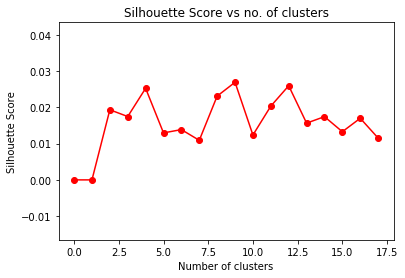

Optimal cluster number is  9

Number of Lines in Summarized text 
5

German bidder in talks with LSE

Deutsche Boerse bosses have held "constructive, professional and friendly" talks with the London Stock Exchange (LSE), its chief has said. The news came as Deutsche Boerse held its third meeting with the LSE since its bid approach in December which was turned down by the London exchange for undervaluing the business. However, the LSE did agree to leave the door open for talks to find out whether a "significantly-improved proposal" would be in the interests of LSE's shareholders and customers. A deal with either bidder would create the biggest stock market operator in Europe and the second biggest in the world after the New York Stock Exchange. However, neither side has made a formal offer for the LSE, with sources claiming such a step may still be weeks away.

Document  280

Number of Lines in Actual text
8
2 3 4 5 6 7

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


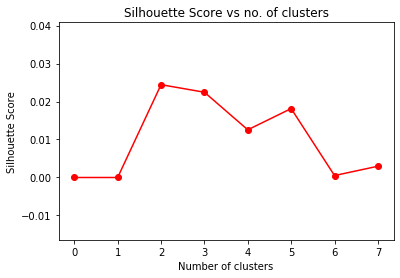

Optimal cluster number is  2

Number of Lines in Summarized text 
3

Amex shares up on spin-off news

Shares in American Express surged more than 8% on Tuesday after it said it was to spin off its less profitable financial advisory subsidiary. "This is an excellent move by American Express to focus on its core businesses, and sell off a laggard division, which has been a problem for quite some time," said Marquis Investment Research analyst Phil Kain. However, the business of selling investments was never integrated with the rest of the group.

Document  281

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


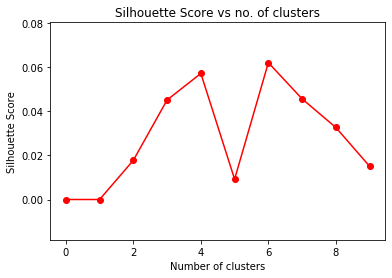

Optimal cluster number is  6

Number of Lines in Summarized text 
2

Axa Sun Life cuts bonus payments

Life insurer Axa Sun Life has lowered annual bonus payouts for up to 50,000 with-profits investors. Axa cut payouts for the same investors last January.

Document  282

Number of Lines in Actual text
14
2 3 4 5 6 7

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 8 9 10 11 12 13 

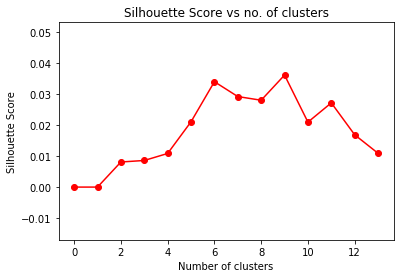

Optimal cluster number is  9

Number of Lines in Summarized text 
3

Chinese dam firm 'defies Beijing'

The China Three Gorges Project Corp is refusing to obey a government order to stop construction of one of its giant dams, the Chinese state press has said. The firm has also ignored orders to stop construction at two of its other projects - the Three Gorges Underground Power Plant and the Three Gorges Project Electrical Power Supply Plant. The Sepa order comes as the Chinese government appears to be trying to cool the country's booming economy.

Document  283

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


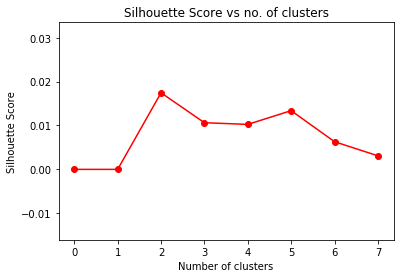

Optimal cluster number is  2

Number of Lines in Summarized text 
5

Stock market eyes Japan recovery

Japanese shares have ended the year at their highest level since 13 July amidst hopes of an economic recovery during 2005. The optimism in the financial markets contrast sharply with pessimism in the Japanese business community. Earlier this month, the quarterly Tankan survey of Japanese manufacturers found that business confidence had weakened for the first time since March 2003. Slower economic growth, rising oil prices, a stronger yen and weaker exports were blamed for the fall in confidence. Despite this, traders expect strength in the global economy to benefit Japan, which has been close to sliding into recession in recent months.

Document  284

Number of Lines in Actual text
34
2 3 4 5 6 7 8 9 10 11 12 13 14 15 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 

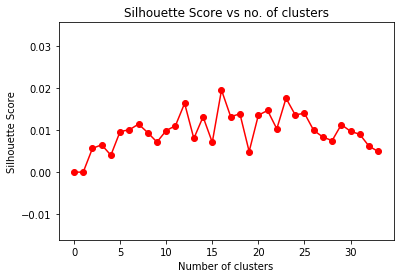

Optimal cluster number is  16

Number of Lines in Summarized text 
3

Iraqi voters turn to economic issues

Beyond the desperate security situation in Iraq lies an economy in tatters. The economy has become the second-most dominant issue for many political parties ahead of Sunday's election, according to Bristol University political scientist Anne Alexander, who is working on a project that looks at governance and security in post-war Iraq. But serious problems remain and the growing divide between haves and have-nots is angering voters.

Document  285

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


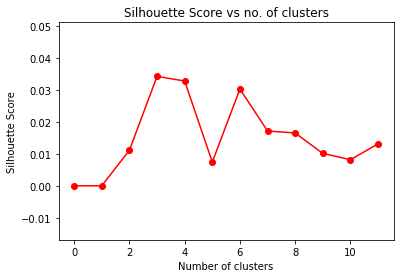

Optimal cluster number is  3

Number of Lines in Summarized text 
5

EU 'too slow' on economic reforms

Most EU countries have failed to put in place policies aimed at making Europe the world's most competitive economy by the end of the decade, a report says. But the Commission report says that, in most EU countries, the pace of economic reform has been too slow, and fulfilling the Lisbon ambitions will be difficult - if not impossible. Only the UK, Finland, Belgium, Denmark, Ireland and the Netherlands have actually followed up policy recommendations. Among the biggest laggards, according to the report, are Greece and Italy. Combined with high environmental standards and efforts to level the playing field for businesses throughout the EU, the plan was for Europe to become the world's most dynamic economy by 2010.

Document  286

Number of Lines in Actual text
18
2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


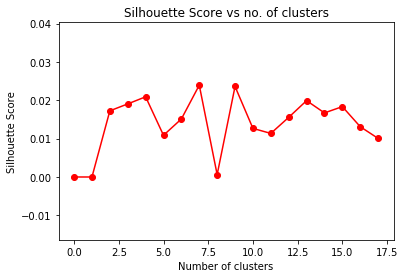

Optimal cluster number is  7

Number of Lines in Summarized text 
3

China continues breakneck growth

China's economy has expanded by a breakneck 9.5% during 2004, faster than predicted and well above 2003's 9.1%. China's economy is not only gathering speed thanks to domestic demand, but also from soaring sales overseas. Part of the impetus comes from the relative cheapness of the yuan, China's currency.

Document  287

Number of Lines in Actual text
46
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 

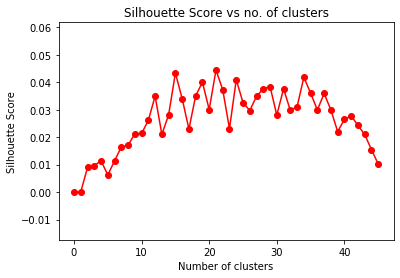

Optimal cluster number is  21

Number of Lines in Summarized text 
4

Japan's ageing workforce: built to last

In his twenties he battled tuberculosis for eight years, then went on to run his own clothing business before marrying in his late thirties. One option is further welfare reform. Japan can either drive some radical reforms or else run the risk of a vicious ageing recession. There are fears that the world's number two economy is doomed to a permanent recession.

Document  288

Number of Lines in Actual text
14
2

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 3 4 5 6 7 8 9 10 11 12 13 

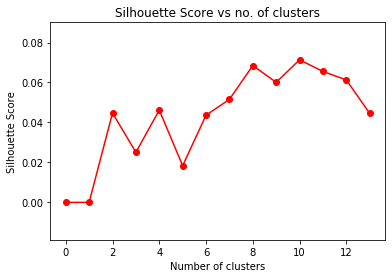

Optimal cluster number is  10

Number of Lines in Summarized text 
1

GE sees 'excellent' world economy

US behemoth General Electric has posted an 18% jump in quarterly sales, and in profits, and declared itself "in great shape".

Document  289

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 

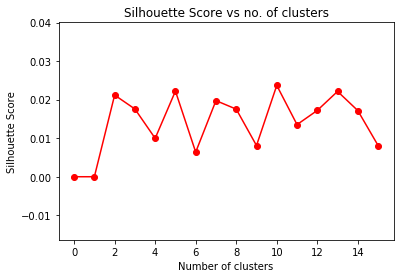

Optimal cluster number is  10

Number of Lines in Summarized text 
2

UK economy facing 'major risks'

The UK manufacturing sector will continue to face "serious challenges" over the next two years, the British Chamber of Commerce (BCC) has said. However, the BCC found the whole UK economy still faced "major risks" and warned that growth is set to slow.

Document  290

Number of Lines in Actual text
22
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


14 15 16 17 18 19 20 21 

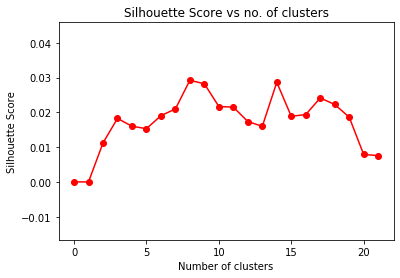

Optimal cluster number is  8

Number of Lines in Summarized text 
5

Bank holds interest rate at 4.75%

The Bank of England has left interest rates on hold again at 4.75%, in a widely-predicted move. "Interest rates are likely to remain on hold for some time." Manufacturers' organisation, the EEF, said it expected the hold in interest rates to continue in the near future. Some economists have predicted rates will drop later in the year, although others feel the Bank may still think there is a need for a rise to 5% before that happens. The Bank remains concerned about the long-term risks posed by personal debt - which is rising at 15% a year - if economic conditions worsen.

Document  291

Number of Lines in Actual text
20
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


15 16 17 18 

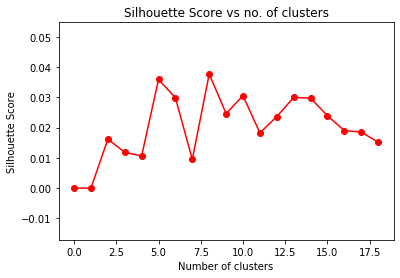

Optimal cluster number is  8

Number of Lines in Summarized text 
4

Tobacco giants hail court ruling

US tobacco companies have welcomed an appeal court's decision to reject the government's $280bn (Â£155bn) claim for alleged deceit about smoking dangers. Tobacco stocks rose sharply on Wall Street after the 2-1 decision. The government had claimed tobacco firms


 - manipulated nicotine levels to increase addiction 
 - targeted teenagers with multi-billion dollar advertising campaigns 
 - lied about the dangers of smoking and ignored research to the contrary. But the tobacco companies denied that they illegally conspired to promote smoking and defraud the public.

Document  292

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


14 15 16 

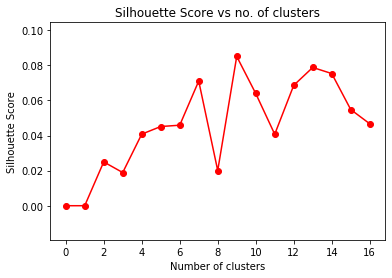

Optimal cluster number is  9

Number of Lines in Summarized text 
4

Steady job growth continues in US

The US created fewer jobs than expected in December, but analysts said that the dip in hiring was not enough to derail the world's biggest economy. While worries still remain, the conditions are set for steady growth in 2005, analysts said. "It was a respectable report," said Michael Moran, analyst at Daiwa Securities. While demand for workers is far from booming, the conditions are set for steady growth.

Document  293

Number of Lines in Actual text
18
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


14 15 

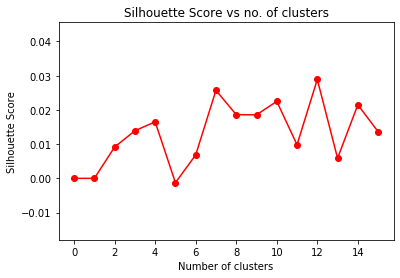

Optimal cluster number is  12

Number of Lines in Summarized text 
1

Glazer makes new Man Utd approach

Malcolm Glazer has made a fresh approach to buy Manchester United, which could lead to a bid valuing the Premiership club at Â£800m.

Document  294

Number of Lines in Actual text
23
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


14 15 16 17 18 19 20 21 22 

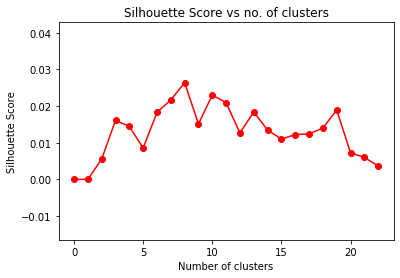

Optimal cluster number is  8

Number of Lines in Summarized text 
2

Wall Street cheers Bush victory

The US stock market has closed higher in response to George W Bush's victory in the presidential elections. Elsewhere in the financial markets on Wednesday, the dollar dipped slightly against the euro and climbed against the yen, while US oil prices closed up $1.26 at $50.88 a barrel in New York.

Document  295

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


14 15 

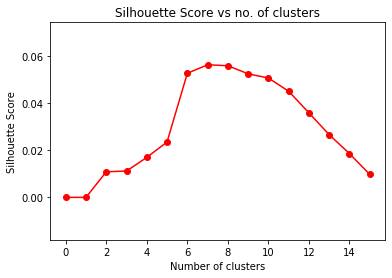

Optimal cluster number is  7

Number of Lines in Summarized text 
3

Business confidence dips in Japan

Business confidence among Japanese manufacturers has weakened for the first time since March 2003, the quarterly Tankan survey has found. The dollar's decline has strengthened the yen, making Japanese exports more expensive in the US. Confidence among non-manufacturers was unchanged in the final quarter of 2004, but it is forecast to drop one point in the March survey.

Document  296

Number of Lines in Actual text
21
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 16 17 18 19 20 

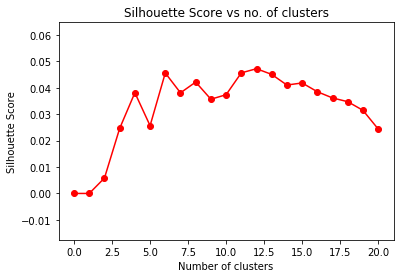

Optimal cluster number is  12

Number of Lines in Summarized text 
3

Millions 'to lose textile jobs'

Millions of the world's poorest textile trade workers will lose their jobs under new trade rules to be introduced in the new year, a charity has warned. The WTO itself has warned that as many as 27 million jobs could be lost as a result of liberalisation in the textile industry. "We are deeply concerned that the New Year will spell misery for huge numbers of garment workers."

Document  297

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


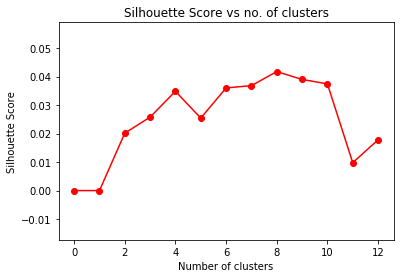

Optimal cluster number is  8

Number of Lines in Summarized text 
2

Dutch bank to lay off 2,850 staff

ABN Amro, the Netherlands' largest bank, is to cut 2,850 jobs as a result of falling profits. ABN Amro currently has more than 100,000 staff.

Document  298

Number of Lines in Actual text
10
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 

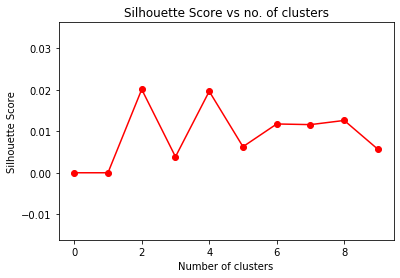

Optimal cluster number is  2

Number of Lines in Summarized text 
4

Fannie Mae 'should restate books'

US mortgage company Fannie Mae should restate its earnings, a move that is likely to put a billion-dollar dent in its accounts, watchdogs have said. The Securities & Exchange Commission accused Fannie Mae of using techniques that "did not comply in material respects" with accounting standards. Fannie Mae last month warned that some records were incorrect. The watchdog's chief accountant Donald Nicolaisen said that "Fannie Mae's methodology of assessing, measuring and documenting hedge ineffectiveness was inadequate and was not supported" by generally accepted accounting principles.

Document  299

Number of Lines in Actual text
17
2 3

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 4 5 6 7 8 9 10 11 12 13 14 15 16 

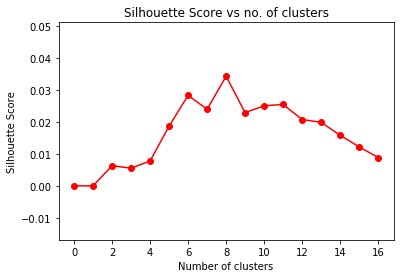

Optimal cluster number is  8

Number of Lines in Summarized text 
3

US to rule on Yukos refuge call

Yukos has said a US bankruptcy court will decide whether to block Russia's impending auction of its main production arm on Thursday. The Russian oil firm has filed for bankruptcy protection in the US in an attempt to halt the forced sale. However, as the firm is based in Russia and has no significant US assets, lawyers are unsure of the outcome of the case.

Document  300

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


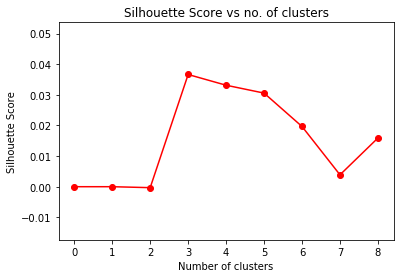

Optimal cluster number is  3

Number of Lines in Summarized text 
5

J&J agrees $25bn Guidant deal

Pharmaceutical giant Johnson & Johnson has agreed to buy medical technology firm Guidant for $25.4bn (Â£13bn). Guidant is a key producer of equipment that combats heart problems such as implant defibrillators and pacemakers. Analysts said that the deal is aimed at offsetting Johnson & Johnson's reliance on a slowing drug business. Meanwhile, demand for defibrillators, which give the heart a small electric shock when an irregular heartbeat or rhythm is detected, is expected to increase, analysts said. The move by Johnson & Johnson has been widely expected and the firm will pay $76 for each Guidant share, 6% more than Wednesday's closing price.

Document  301

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


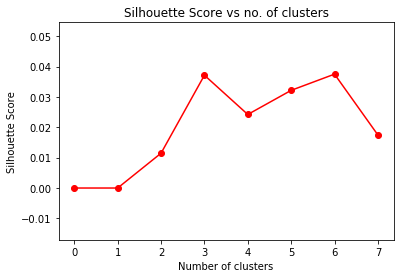

Optimal cluster number is  6

Number of Lines in Summarized text 
2

Libya takes $1bn in unfrozen funds

Libya has withdrawn $1bn in assets from the US, assets which had previously been frozen for almost 20 years, the Libyan central bank has said. The original size of Libya's funds was $400m, the central bank told Reuters.

Document  302

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


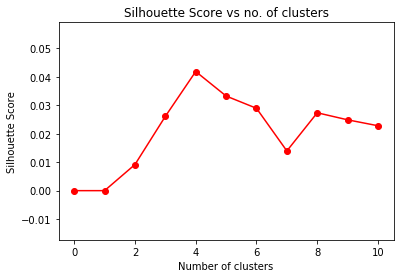

Optimal cluster number is  4

Number of Lines in Summarized text 
1

Cactus diet deal for Phytopharm

A slimming aid made from a southern African cactus is set to be developed by UK firm Phytopharm and Unilever.

Document  303

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 16 

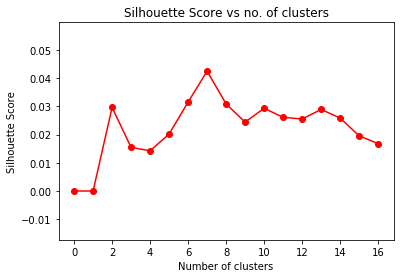

Optimal cluster number is  7

Number of Lines in Summarized text 
5

Brazil plays down Varig rescue

The Brazilian government has played down claims that it could step in to save the country's biggest airline. Brazil's airport authority chief Carlos Wilson had claimed the government was on the brink of stepping in to save Varig, Brazil's flagship airline. Asked whether a rescue was on the cards following a meeting of the country's Congress to discuss the airline's crisis, Mr Alencar replied: "No, I don't think so. Business has improved recently with demand for air travel increasing and a recovery in the Brazilian economy. The airline could also win a sizeable windfall from a compensation claim against the government.

Document  304

Number of Lines in Actual text
12
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 11 

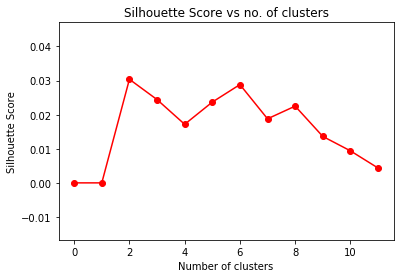

Optimal cluster number is  2

Number of Lines in Summarized text 
7

Bombardier chief to leave company

Shares in train and plane-making giant Bombardier have fallen to a 10-year low following the departure of its chief executive and two members of the board. Paul Tellier, who was also Bombardier's president, left the company amid an ongoing restructuring. Analysts said the resignations seem to have stemmed from a boardroom dispute. The firm's snowmobile division and defence services unit were also sold and Bombardier started the development of a new aircraft seating 110 to 135 passengers. Mr Tellier had indicated he wanted to stay at the world's top train maker and third largest manufacturer of civil aircraft until the restructuring was complete. But Bombardier has been faced with a declining share price and profits. Shares in Bombardier lost 65 Canadian cents or 25% on the news to 1.90 Canadian dollars before rallying to 2.20 Canadian dollars.

Document  305

Number of Lines in Actua

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


9 10 11 

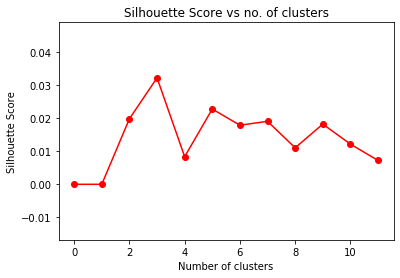

Optimal cluster number is  3

Number of Lines in Summarized text 
5

Brazil approves bankruptcy reform

A major reform of Brazil's bankruptcy laws has been approved by the country's Congress, in a move which it is hoped will cut the cost of borrowing. The law also makes it more difficult for a company to declare bankruptcy. The proposals were opposed in the past by leftist parties, including Mr Lula's Worker Party. But President Lula became a defender of the reforms, arguing that the country's bank lending margins were among the highest in the world and were damaging the economy. According to Andreas Adriano of Latin Trade Magazine, the new bankruptcy law will help in reducing the spread - difference between the interest rates of the banks and federal bonds.

Document  306

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


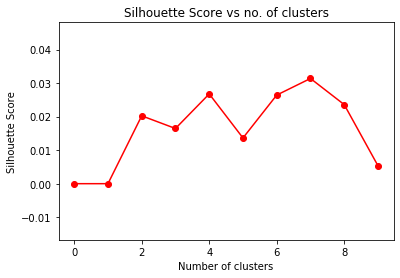

Optimal cluster number is  7

Number of Lines in Summarized text 
2

Retail sales show festive fervour

UK retail sales were better than expected in November as Christmas shoppers began their seasonal flock to the High Street, figures show. Many had expected sales to fall slightly in November as shoppers put off buying Christmas presents until December.

Document  307

Number of Lines in Actual text
24
2 3 4 5 6 7 8 9 10 11 12

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 13 14 15 16 17 18 19 20 21 22 23 

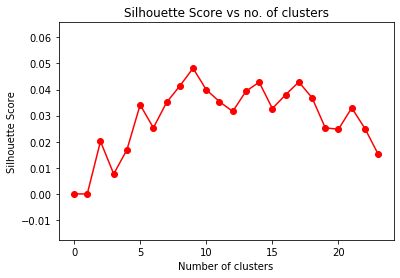

Optimal cluster number is  9

Number of Lines in Summarized text 
7

Cairn shares slump on oil setback

Shares in Cairn Energy, a UK oil firm, have closed down 18% after a disappointing drilling update and a warning over possible tax demands. Cairn's shares have jumped by almost 400% this year. A spokesman for the firm said that the tax would wipe 5% of the field's current value. He insisted that the contract made it clear that the tax should be shouldered by the licensee - India's state-run Oil & Natural Gas Corp (ONGC) - and not the contractor. Investors took a dim view of the statements though. The shares closed down 247p, or 18%, at 1115 pence. Cairn added that it would be appraising another field early next year.

Document  308

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


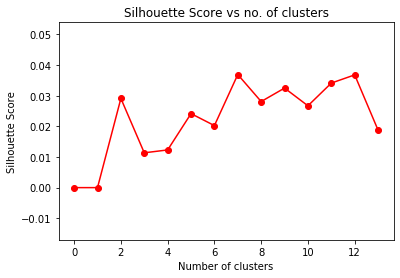

Optimal cluster number is  7

Number of Lines in Summarized text 
3

French boss to leave EADS

The French co-head of European defence and aerospace group EADS Philippe Camus is to leave his post. Fighting between Mr Camus and Mr Forgeard has hit the headlines in France and analysts feared that this fighting could destabilise the defence and aerospace group. Rainer Hertrich, the German co-head of EADS will also step down when his contract expires next year.

Document  309

Number of Lines in Actual text
12
2 3 4 5 6 7

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 8 9 10 11 

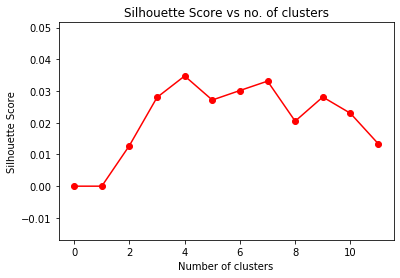

Optimal cluster number is  4

Number of Lines in Summarized text 
4

AstraZeneca hit by drug failure

Shares in Anglo-Swedish drug have closed down 8% in UK trade after the failure of its Iressa drug in a major clinical trial. Meanwhile, another of its major money spinners - cholesterol drug Crestor - is facing mounting safety concerns. AstraZeneca had hoped to pitch its Iressa drug against rival medicine Tarceva. But Iressa proved no better than a placebo in extending lives in the trial involving 1,692 patients.

Document  310

Number of Lines in Actual text
10
2 3 4 5 6 7

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 8 9 

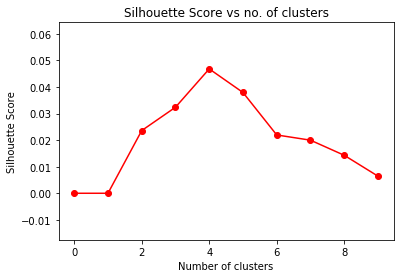

Optimal cluster number is  4

Number of Lines in Summarized text 
3

Strong quarterly growth for Nike

Nike has reported its best second-quarter earnings, helped by strong demand for its athletic shoes and Converse sneakers. Nike, whose products are endorsed by Tiger Woods among other sports stars, said "demand continues to grow". Philip Knight, chairman and chief executive, said: "Nike's second-quarter revenues and earnings per share reached all-time high levels as a result of solid performance across our global portfolio.

Document  311

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


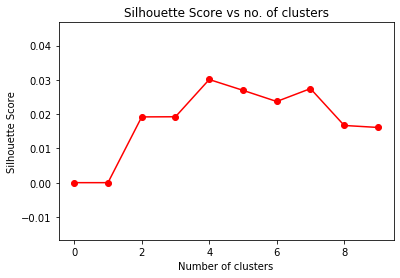

Optimal cluster number is  4

Number of Lines in Summarized text 
3

Stormy year for property insurers

A string of storms, typhoons and earthquakes has made 2004 the most expensive year on record for property insurers, according to Swiss Re. The world's second biggest insurer said disasters around the globe have seen property claims reach $42bn (Â£21.5bn). Twenty-one thousand people lost their lives in the catastrophes with a cost to the global economy of around $105bn (Â£54bn).

Document  312

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


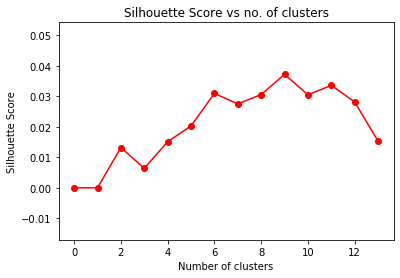

Optimal cluster number is  9

Number of Lines in Summarized text 
3

Parmalat sues 45 banks over crash

Parmalat has sued 45 banks as it tries to reclaim money paid to banks before the scandal-hit Italian dairy company went bust last year. Parmalat has not identified which banks it has gone after this time. It has also gone after auditors Grant Thornton.

Document  313

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


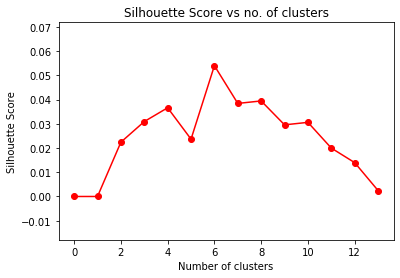

Optimal cluster number is  6

Number of Lines in Summarized text 
3

Irish company hit by Iraqi report

Shares in Irish oil company Petrel Resources have lost more than 50% of their value on a report that the firm has failed to win a contract in Iraq. By 1700 GMT, Petrel's shares fell from 97p ($1.87) to 44p ($0.85). Petrel said that it has not received any information from Iraqi authorities to confirm or deny the report.

Document  314

Number of Lines in Actual text
34
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 

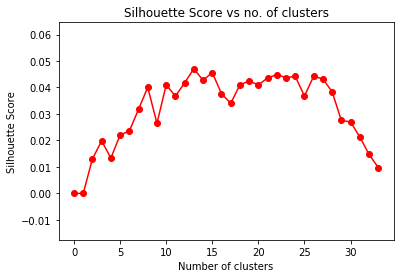

Optimal cluster number is  13

Number of Lines in Summarized text 
2

Yukos unit fetches $9bn at auction

A little-known Russian company has bought the main production unit of oil giant Yukos at auction in Moscow. The unit was seized by the government which claims the oil giant owes more than $27bn in taxes and fines.

Document  315

Number of Lines in Actual text
14
2 3 4 5 6

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 7 8 9 10 11 12 13 

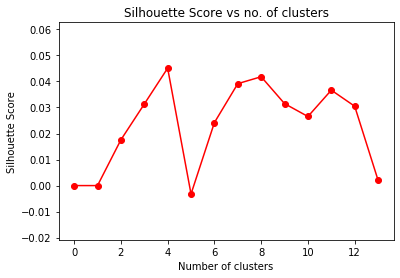

Optimal cluster number is  4

Number of Lines in Summarized text 
7

S&N extends Indian beer venture

The UK's biggest brewer, Scottish and Newcastle (S&N), is to buy 37.5% of India's United Breweries in a deal worth 4.66bn rupees ($106m:Â£54.6m). S&N will buy a 17.5% equity stake in United, maker of the well-known Kingfisher lager brand, and make a public offer to buy another 20% stake. The deal was a "natural development" of its joint venture with United, said Tony Froggatt, S&N's chief executive. In 2002 S&N and United agreed to form a strategic partnership, one that would include a joint venture business and a UK investment in the Indian brewer. India, with a population of more than one billion, consumes about 1.2 billion bottles of beer every year. In addition to the equity stake S&N is to invest 2.47bn rupees in United through non-convertible redeemable preference shares. Meanwhile, United's budget airline, Kingfisher Airlines, is to buy 10 A320 aircraft from Airbus and has the o

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


14 15 16 

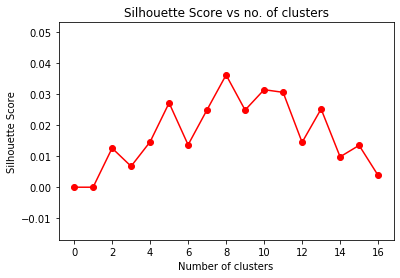

Optimal cluster number is  8

Number of Lines in Summarized text 
3

Euronext 'poised to make LSE bid'

Pan-European group Euronext is poised to launch a bid for the London Stock Exchange, UK media reports say. The LSE, Europe's biggest stock market, is a key prize, listing stocks with a total capitalisation of Â£1.4 trillion. Euronext already has a presence in London due to its 2001 acquisition of London-based options and futures exchange Liffe.

Document  317

Number of Lines in Actual text
19
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


13 14 15 16 17 18 

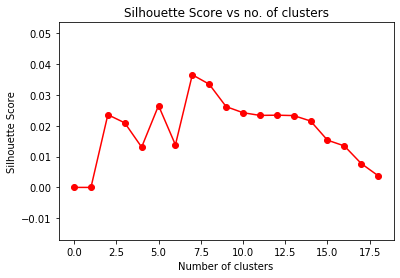

Optimal cluster number is  7

Number of Lines in Summarized text 
4

Christmas shoppers flock to tills

Shops all over the UK reported strong sales on the last Saturday before Christmas with some claiming record-breaking numbers of festive shoppers. And the Regent Street Association said shops in central London were also expecting the "best Christmas ever". "Over the Christmas period we're expecting people to spend in excess of Â£200m at the centre." Regent Street Association director Annie Walker said on Saturday: "The stores were heaving today and a lot of people are going to be doing last minute shopping as many people finished work on Friday and can go in the week."

Document  318

Number of Lines in Actual text
21
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


12 13 14 15 16 17 18 19 20 

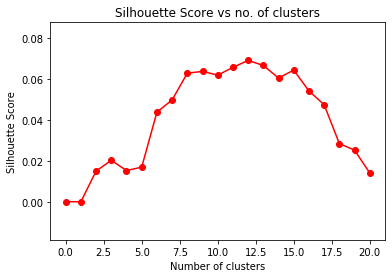

Optimal cluster number is  12

Number of Lines in Summarized text 
1

Mystery surrounds new Yukos owner

The fate of Russia's Yuganskneftegas - the oil firm sold to a little-known buyer on Sunday - is the subject of frantic speculation in Moscow.

Document  319

Number of Lines in Actual text
14
2 3 4 5 6

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 7 8 9 10 11 12 13 

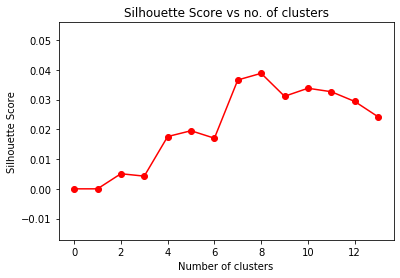

Optimal cluster number is  8

Number of Lines in Summarized text 
2

Euronext joins bid battle for LSE

Pan-European stock market Euronext has approached the London Stock Exchange (LSE) about a possible takeover bid. Talks with the European stock market and with rival bidder Deutsche Boerse will continue, the LSE said.

Document  320

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 

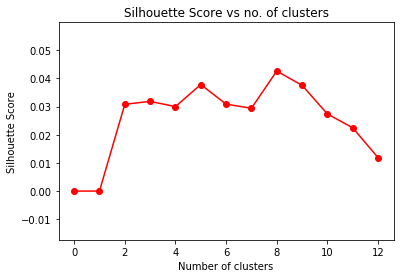

Optimal cluster number is  8

Number of Lines in Summarized text 
3

Iraq and Afghanistan in WTO talks

The World Trade Organisation (WTO) is to hold membership talks with both Iraq and Afghanistan. Iraq's Trade Minister Mohammed Mustafa al-Jibouri welcomed the move, describing it as significant as November's decision by the Paris Club of creditor nations to write off 80% of the country's debts. There are now 27 countries seeking membership of the WTO.

Document  321

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


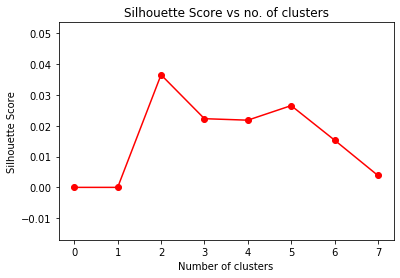

Optimal cluster number is  2

Number of Lines in Summarized text 
4

Diageo to buy US wine firm

Diageo, the world's biggest spirits company, has agreed to buy Californian wine company Chalone for $260m (Â£134m) in an all-cash deal. In July, Diageo, which is listed on the London Stock Exchange, reported an annual turnover of Â£8.89bn, down from Â£9.28bn a year earlier. It blamed a weaker dollar for its lower turnover. In the year ending 31 December 2003, Chalone reported revenues of $69.4m.

Document  322

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


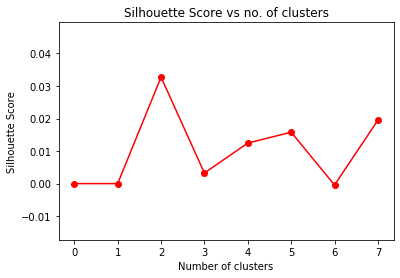

Optimal cluster number is  2

Number of Lines in Summarized text 
6

Tokyo says deflation 'controlled'

The Japanese government has forecast that the country's economic growth will slow to 1.6% in the next fiscal year starting in April 2005. While it predicts this fall from the current 2.1% level, it said it was making progress on ending deflation. The figures were given by economics minister Heizo Takenaka who said the economy would grow by 2% in 2006/07. He said the consumer price index (CPI) would rise 0.1% in the next fiscal year, the first gain since 2000/01. I think we are on track," said Mr Takenaka. Deflation - or falling consumer prices - has plagued Japan for more than five years.

Document  323

Number of Lines in Actual text
19
2 3 4 5 6 7 8 9 10 11 12 13 14

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 15 16 17 18 

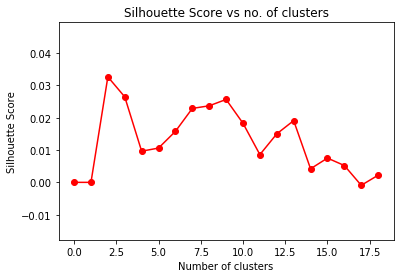

Optimal cluster number is  2

Number of Lines in Summarized text 
9

No seasonal lift for house market

A swathe of figures have provided further evidence of a slowdown in the UK property market. The figures come hot on the heels of new data from property website Rightmove which suggested owners must indulge in a "winter sale" and slash prices by up to 8%. Rightmove said estate agents were set to enter 2005 with a third more properties on their books than a year ago. "Even once the quieter holiday period is over, sellers will find themselves competing with a lot of other properties on the market. "The proof is that some properties that have been appropriately discounted are selling, even in the current market." A host of mortgage lenders and economists have predicted that property prices will either fall or stagnate in 2005. "What is apparent is a picture of a slowing market, but one that should remain stable as we return to more normal volumes of lending over 2005 as a whole," CML dir

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


15 

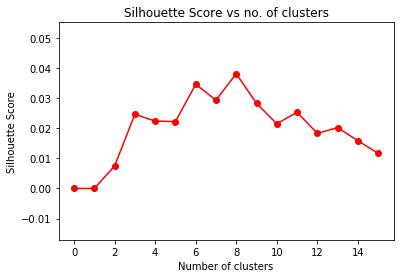

Optimal cluster number is  8

Number of Lines in Summarized text 
5

Yukos seeks court action on sale

Yukos will return to a US court on Wednesday to seek sanctions against Baikal Finance Group, the little-known firm which has bought its main asset. Yukos' US lawyers will attempt to have Baikal assets frozen after the Russian government ignored a US court order last week blocking the sale. Yukos' US lawyers claim the auction was illegal because the firm had filed for bankruptcy and therefore its assets were now under the protection of US bankruptcy law which has worldwide jurisdiction. On Wednesday, Yukos will also seek further legal remedies to prevent the break-up of the group. Yukos has claimed that the sale of its main asset will lead to the collapse of the company.

Document  325

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 12 

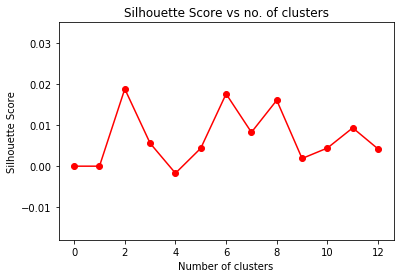

Optimal cluster number is  2

Number of Lines in Summarized text 
6

Indy buys into India paper

Irish publishing group Independent News & Media is buying up a 26% stake in Indian newspaper company Jagran in a deal worth 25m euros ($34.1m). Jagran publishes India's top-selling daily newspaper, the Hindi-language Dainik Jagran, which has been in circulation for 62 years. News of the deal came as the group announced that its results would meet market forecasts. The company reported strong revenue growth across all its major markets. Group advertising revenues were up over 10% year-on-year, the group said, with overall circulation revenues are expected to increase almost 10% year-on-year. I am confident that we will show a meaningful increase in earnings for 2005."

Document  326

Number of Lines in Actual text
19
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 15 16 17 18 

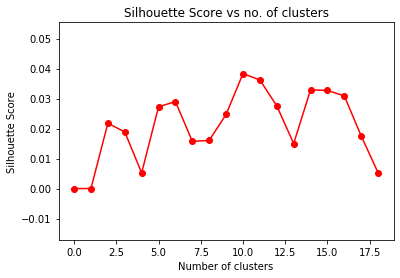

Optimal cluster number is  10

Number of Lines in Summarized text 
2

Senior Fannie Mae bosses resign

The two most senior executives at US mortgage giant Fannie Mae have resigned after accounting irregularities were uncovered at the company. Analysts said the SEC's criticism made it impossible for Fannie Mae's senior executives to remain.

Document  327

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


14 

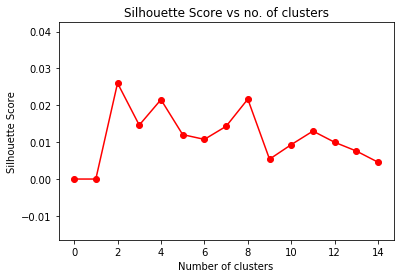

Optimal cluster number is  2

Number of Lines in Summarized text 
10

Cannabis hopes for drug firm

A prescription cannabis drug made by UK biotech firm GW Pharmaceuticals is set to be approved in Canada. The drug is used to treat the central nervous system and alleviate the symptoms of multiple sclerosis (MS). A few weeks ago, shares in GW Pharma lost a third of their value after UK regulators said they wanted more evidence about the drug's benefits. Many patients already smoke cannabis to relieve their symptoms. Now, GW Pharma's Sativex mouth spray could be legally available to MS sufferers in Canada within the next few months. This will be the first time a cannabis-based drug has been approved anywhere in the world, representing a landmark for GW Pharma and for patients with MS. The UK government granted GW Pharma a licence to grow the cannabis plant for medical research purposes. Satifex consists of a cannabis extract containing tetrahydrocannabinol and cannabidiol, a cocktail that

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


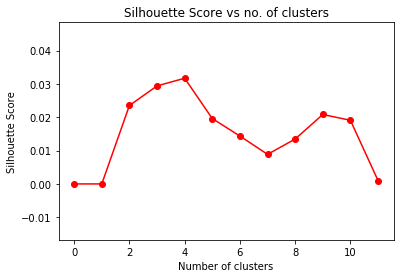

Optimal cluster number is  4

Number of Lines in Summarized text 
3

Bush to get 'tough' on deficit

US president George W Bush has pledged to introduce a "tough" federal budget next February in a bid to halve the country's deficit in five years. The vow to cut the deficit had been one of his re-election declarations. The federal budget deficit hit a record $412bn (Â£211.6bn) in the 12 months to 30 September and $377bn in the previous year.

Document  329

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


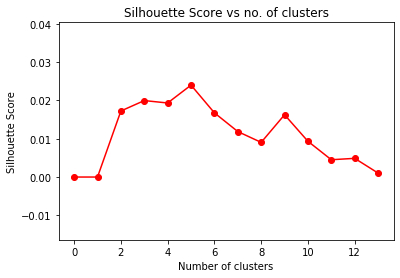

Optimal cluster number is  5

Number of Lines in Summarized text 
5

House prices drop as sales slow

House prices fell further in November and property sale times lengthened as rate rises took their toll, the Royal Institute of Chartered Surveyors found. A total of 48% of chartered surveyor estate agents reported lower prices in the three months to November - the highest level in 12 years. Meanwhile the number of sales dropped 32% to an average of 22 per surveyor. But the news failed to dent confidence that sales will recover in future, with surveyors at their most optimistic in a year - as new purchase inquiries stabilised despite holding at lower levels. Looking ahead, the group is anticipating a quiet start to 2005 with the market picking up in the second half - prompting a 3% rise in prices over the coming 12 months.

Document  330

Number of Lines in Actual text
45
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 

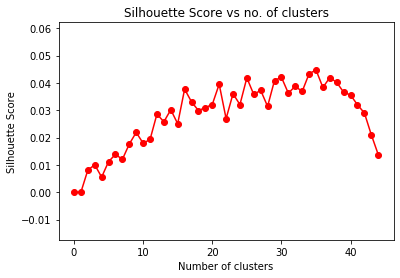

Optimal cluster number is  35

Number of Lines in Summarized text 
4

Fresh hope after Argentine crisis

Three years after Argentina was hit by a deadly economic crisis, there is fresh hope. "The Argentine authorities are proud, should be proud, of the strong performance of the economy," Thomas Dawson, an IMF director, said earlier this month. "Three years ago, every sector [of the economy] was hit by the crisis," said entrepreneur Drayton Valentine. "Agriculture and tourism are helping," said entrepreneur Drayton Valentine.

Document  331

Number of Lines in Actual text
12
2

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 3 4 5 6 7 8 9 10 11 

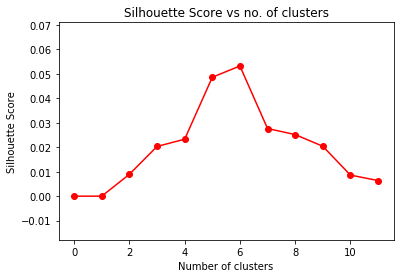

Optimal cluster number is  6

Number of Lines in Summarized text 
2

Disney settles disclosure charges

Walt Disney has settled charges from US federal regulators that it failed to disclose how family members of directors were employed by the company. Disney failed to tell investors that between 1999 and 2001 it employed three adult children of three then directors.

Document  332

Number of Lines in Actual text
29
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 

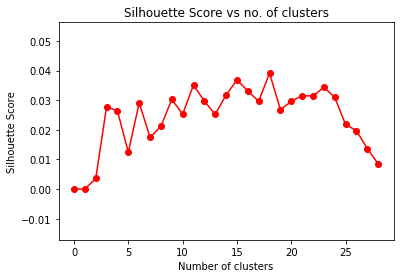

Optimal cluster number is  18

Number of Lines in Summarized text 
2

Putin backs state grab for Yukos

Russia's president has defended the purchase of Yukos' key production unit by state-owned oil firm Rosneft, saying it followed free market principles. By selling the Yukos unit to little-known Baikal and then to Rosneft, Russia is able to circumvent a host of tricky legal landmines, analysts said.

Document  333

Number of Lines in Actual text
13
Number of Lines in Summarized text 
0

Document  334

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 

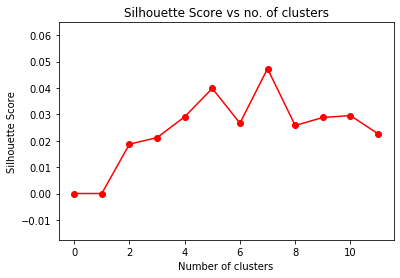

Optimal cluster number is  7

Number of Lines in Summarized text 
3

US firm pulls out of Iraq

A US company has pulled out of a major contract to rebuild Iraq's transport system after attacks on reconstruction efforts, Pentagon officials have said. But the firm denied reports it was withdrawing completely from Iraq. US firms and their workers have been targets of attacks, and security concerns are said to be a major reason for the slow pace of reconstruction in Iraq.

Document  335

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 

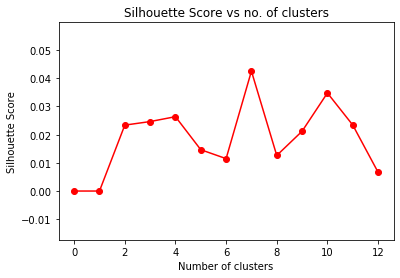

Optimal cluster number is  7

Number of Lines in Summarized text 
5

Boeing secures giant Japan order

Boeing is to supply Japan Airlines with up to 50 of its forthcoming 7E7 planes in a deal that could be worth as much as $6bn (Â£3.1bn) for the US giant. Japan Airlines has made a firm order for 30 of the aircraft, at $120m each, with the option to buy 20 more. Asia's biggest airline joins Japanese rival All Nippon as one of the first carriers to order the mid-size 7E7, which Boeing says is super-economical. Boeing's great European competitor is to sell 10 of its forthcoming A350 to Spanish carrier Air Europe, which has the option to buy two more in a deal that could be worth more than $1.8bn. Boeing has set itself a target of getting 200 firm commitments for the 7E7 by the end of this year, and has orders for 56 so far.

Document  336

Number of Lines in Actual text
18
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 16 17 

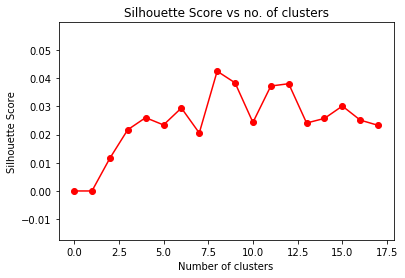

Optimal cluster number is  8

Number of Lines in Summarized text 
2

Banker loses sexism claim

A former executive at the London offices of Merrill Lynch has lost her Â£7.5m ($14.6m) sex discrimination case against the US investment bank. "Merrill Lynch is dedicated to creating a true meritocracy where every employee has the opportunity to advance based on their skills and hard work."

Document  337

Number of Lines in Actual text
16
2 3 4 5 6 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


7 8 9 10 11 12 13 14 15 

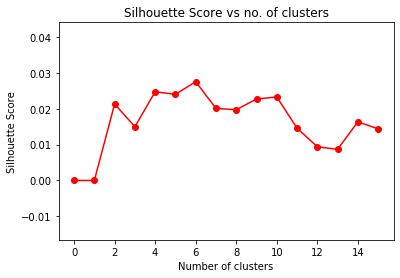

Optimal cluster number is  6

Number of Lines in Summarized text 
6

Building giant in asbestos payout

Australian building products group James Hardie has agreed to pay $1.1bn (Â£568m) to victims of asbestos-related diseases. The landmark deal could see thousands of people suffering from lung diseases - caused by asbestos the company once made - receive compensation. However, the deal still has to receive the approval of Hardie's shareholders. Hardie, which currently makes more than 80% of its revenues in the US, was once Australia's biggest supplier of asbestos building materials. A decision by Hardie to move its headquarters to the Netherlands - while remaining a listed company in Australia - provoked a damaging public outcry. Australia's securities watchdog is currently investigating Hardie's former chief executive and former chief financial officer over allegations of misleading investors and the general public.

Document  338

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 

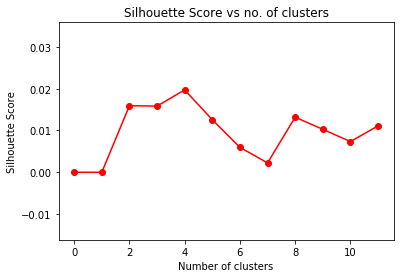

Optimal cluster number is  4

Number of Lines in Summarized text 
3

Police detain Chinese milk bosses

Chinese police have detained three top executives at milk firm Yili, with reports suggesting that they are being investigated for embezzlement. A Yili spokesman said it may now move to oust chairman Zheng Junhuai. The spokesman did not say why the three had been detained by the police.

Document  339

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


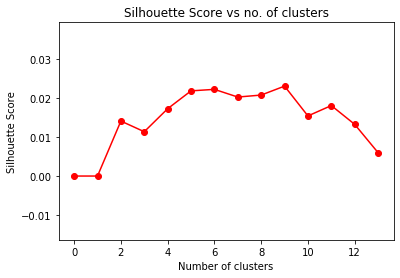

Optimal cluster number is  9

Number of Lines in Summarized text 
1

India's Deccan seals $1.8bn deal

Air Deccan has ordered 30 Airbus A320 planes in a $1.8bn (Â£931m) deal as India's first low-cost airline expands in the fast-growing domestic market.

Document  340

Number of Lines in Actual text
15
2 3 4 5 6

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 7 8 9 10 11 12 13 14 

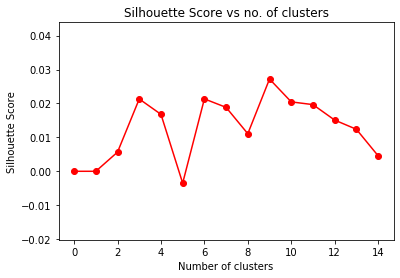

Optimal cluster number is  9

Number of Lines in Summarized text 
3

Venezuela and China sign oil deal

Venezuelan president Hugo Chavez has offered China wide-ranging access to the country's oil reserves. Venezuela has also offered to supply 120,000 barrels of fuel oil a month to China. China has been a net importer of oil since the mid 1990's with more than a third of the oil and gas it consumes coming from abroad.

Document  341

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


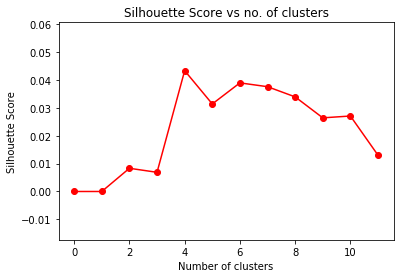

Optimal cluster number is  4

Number of Lines in Summarized text 
3

Jarvis sells Tube stake to Spain

Shares in engineering group Jarvis have soared more than 16% on news that it is offloading its stake in London underground consortium Tube Lines. Instead, it plans to focus on UK rail renewal, roads and plant hire work. Madrid-based Ferrovial already holds a 33% stake in Tube Lines, which maintains the Jubilee, Northern and Piccadilly lines.

Document  342

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


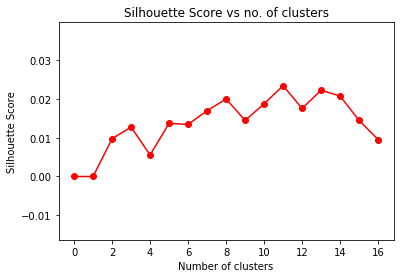

Optimal cluster number is  11

Number of Lines in Summarized text 
4

Honda wins China copyright ruling

Japan's Honda has won a copyright case in Beijing, further evidence that China is taking a tougher line on protecting intellectual property rights. Beijing also has been threatened with sanctions if it fails to clamp down. Earlier this week China said that in future it will punish violators of intellectual property rights with up to seven years in jail. And on Tuesday, Paws Incorporated - the owner of the rights to Garfield the cat - won a court battle against a publishing house that violated its copyright.

Document  343

Number of Lines in Actual text
6
2 3 4 5 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


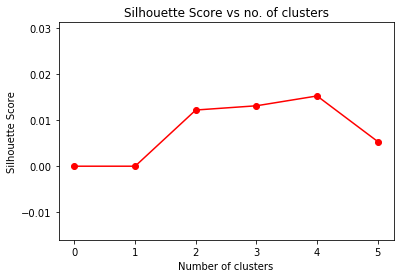

Optimal cluster number is  4

Number of Lines in Summarized text 
2

Air Jamaica back in state control

The Jamaican government is regaining control of Air Jamaica in an bid to help the ailing company out of its financial difficulties. In common with many carriers, Air Jamaica, with debts of $560m (Â£291m), has been hit by high fuel costs and the impact of the 11 September attacks.

Document  344

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 13 14 15 16 

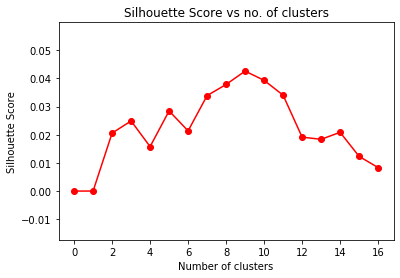

Optimal cluster number is  9

Number of Lines in Summarized text 
5

Battered dollar hits another low

The dollar has fallen to a new record low against the euro after data fuelled fresh concerns about the US economy. Ministers from European and Asian governments have recently called on the US to strengthen the dollar, saying the excessively high value of the euro was starting to hurt their export-driven economies. Thursday's new low for the dollar came after data was released showing year-on-year sales of new homes in the US had fallen 12% in November - with some analysts saying this could indicate problems ahead for consumer activity. Commerce Department data also showed consumer spending - which drives two thirds of the US economy - grew just 0.2% last month. The dollar has now fallen for a third consecutive year and analysts are forecasting a further, albeit less dramatic weakening, in 2005.

Document  345

Number of Lines in Actual text
23
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


14 15 16 17 18 19 20 21 22 

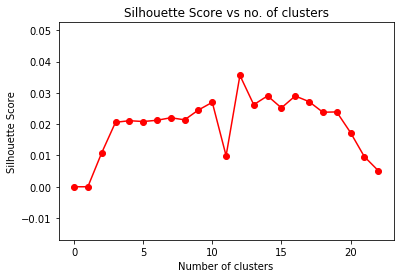

Optimal cluster number is  12

Number of Lines in Summarized text 
2

Quake's economic costs emerging

Asian governments and international agencies are reeling at the potential economic devastation left by the Asian tsunami and floods. World Bank president James Wolfensohn has said his agency is "only beginning to grasp the magnitude of the disaster" and its economic impact.

Document  346

Number of Lines in Actual text
33
2 3 4 5 6 7 8 9 10 11 12 13 14 15

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 

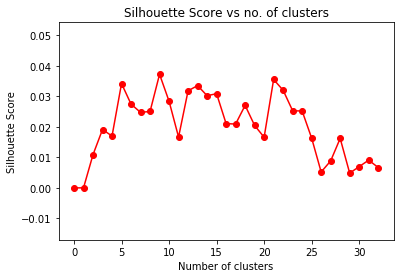

Optimal cluster number is  9

Number of Lines in Summarized text 
5

Disaster claims 'less than $10bn'

Insurers have sought to calm fears that they face huge losses after an earthquake and giant waves killed at least 38,000 people in southern Asia. Munich Re and Swiss Re, the world's two biggest reinsurers, have said exposure will be less than for other disasters. Swiss Re has said total claims are likely to be less than $10bn (Â£5.17bn). He anticipated that his own company's total claims would be less then those from the hurricanes, which the company put at $640m. Mitch killed about 10,000 people and caused damage of about $10bn in 1998.

Document  347

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


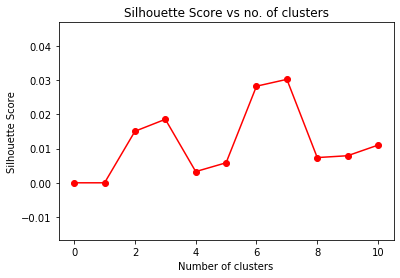

Optimal cluster number is  7

Number of Lines in Summarized text 
3

India-Pakistan peace boosts trade

Calmer relations between India and Pakistan are paying economic dividends, with new figures showing bilateral trade up threefold in the summer. Nonethless, the figures represent less than 1% of India's overall exports. Its mid-year economic review forecasts growth of 6-6.5% in 2004, compared with 8.2% in 2003.

Document  348

Number of Lines in Actual text
22
2 3 4 5 6 7 8 9 10 11

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 12 13 14 15 16 17 18 19 20 21 

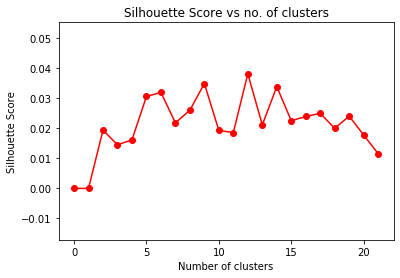

Optimal cluster number is  12

Number of Lines in Summarized text 
2

US to probe airline travel chaos

The US government is to investigate two airlines- US Airways and Delta Air Lines' Comair subsidiary - after travel chaos over the Christmas weekend. Analysts said the Christmas chaos cast doubt on US Airway's ability to emerge from bankruptcy - and was likely to worsen the finances of troubled Delta, parent of Comair.

Document  349

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 13 14 15 16 

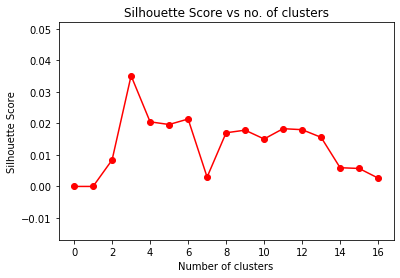

Optimal cluster number is  3

Number of Lines in Summarized text 
5

S Korean lender faces liquidation

Creditors of South Korea's top credit card firm have said they will put the company into liquidation if its ex-parent firm fails to back a bail-out. The firm avoided bankruptcy thanks to a $4.5bn bail-out in January 2004, which gave control to the creditors. At least seven million people in South Korea use LG Card's plastic for purchases. LG Card almost collapsed in 2003 due to an increase in overdue credit card bills after the bursting of a credit bubble. The firm returned to profit in September 2004, but now needs a capital injection to avoid being delisted from the Korea Stock Exchange.

Document  350

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


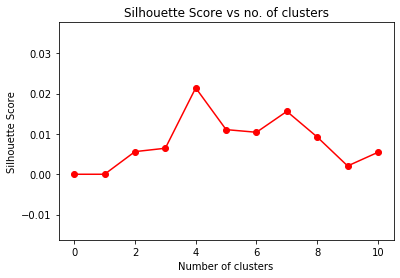

Optimal cluster number is  4

Number of Lines in Summarized text 
5

Dollar hits new low versus euro

The US dollar has continued its record-breaking slide and has tumbled to a new low against the euro. The US currency was trading at $1.364 per euro at 1800 GMT on Monday. This compares with $1.354 to the euro in late trading in New York on Friday, which was then a record low. The dollar has weakened sharply since September when it traded about $1.20 against the euro. It has lost 7% this year, while against the Japanese yen it is down 3.2%.

Document  351

Number of Lines in Actual text
11
2 3 4 5 6

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 7 8 9 10 

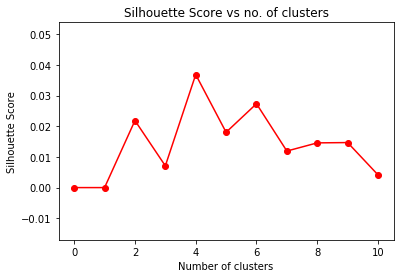

Optimal cluster number is  4

Number of Lines in Summarized text 
4

Mild winter drives US oil down 6%

US oil prices have fallen by 6%, driven down by forecasts of a mild winter in the densely populated northeast. Traders ignored the possible effects of Asia's tidal waves on global supplies. Instead, the focus is now on US consumption, which is heavily influenced in the short term by the weather. Statistics released last week showed that stockpiles of oil products in the US had risen, an indication that severe supply disruptions may not arise this winter, barring any serious incident.

Document  352

Number of Lines in Actual text
7
2 3 4 5 6 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


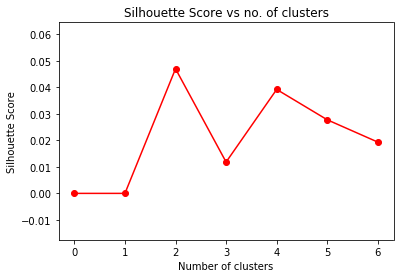

Optimal cluster number is  2

Number of Lines in Summarized text 
3

Share boost for feud-hit Reliance

The board of Indian conglomerate Reliance has agreed a share buy-back, to counter the effects of a power struggle in the controlling family. The board hopes the move will reverse a 13% fall in Reliance's shares since the feud became public last month. The company plans to buy back 52 million shares at 570 rupees (Â£6.80; $13) apiece, a premium of more than 10% to its current market price.

Document  353

Number of Lines in Actual text
42
2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 

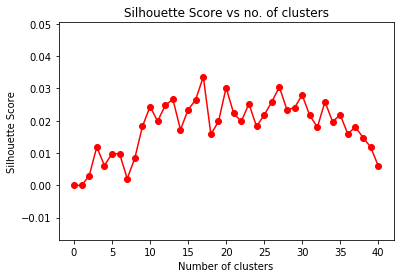

Optimal cluster number is  17

Number of Lines in Summarized text 
5

Giant waves damage S Asia economy

Governments, aid agencies, insurers and travel firms are among those counting the cost of the massive earthquake and waves that hammered southern Asia. But the damage covers fishing, farming and businesses too, with hundreds of thousands of buildings and small boats destroyed by the waves. Insurers are also struggling to assess the cost of the damage, but several big players believe the final bill is likely to be less than the $27bn cost of the hurricanes that battered the US earlier this year. December and January are two of the busiest months for the travel in southern Asia and the damage will be even more keenly felt as the industry was only just beginning to emerge from a post 9/11 slump. In southern Asia that expansion is 23%.

Document  354

Number of Lines in Actual text
28
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


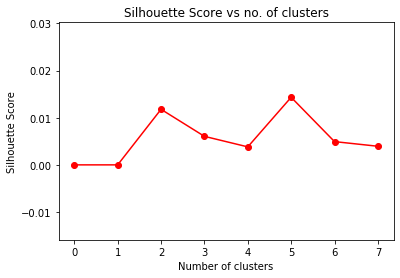

Optimal cluster number is  5

Number of Lines in Summarized text 
2

Asia shares defy post-quake gloom

Thailand has become the first of the 10 southern Asian nations battered by giant waves at the weekend to cut its economic forecast. Thailand's economy is now expected to grow by 5.7% in 2005, rather than 6% as forecast before tsunamis hit six tourist provinces.

Document  355

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


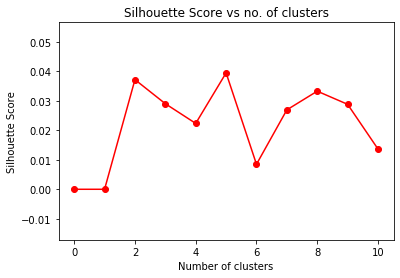

Optimal cluster number is  5

Number of Lines in Summarized text 
1

Israeli economy picking up pace

Israel's economy is forecast to grow by 4.2% in 2004 as it continues to emerge from a three-year recession.

Document  356

Number of Lines in Actual text
20
Number of Lines in Summarized text 
0

Document  357

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 12 13 14 

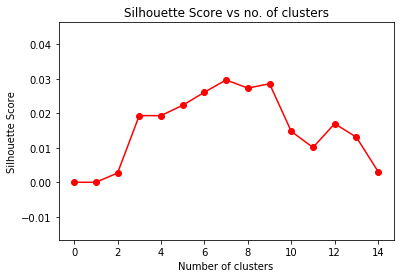

Optimal cluster number is  7

Number of Lines in Summarized text 
5

Soros group warns of Kazakh close

The Open Society Institute (OSI), financed by billionaire George Soros, has accused Kazakhstan officials of trying to close down its local office. It denies having any role, but offices have had to close across the region. In the Ukraine earlier this year, Mr Soros - who took on the Bank of England in the 1990s - and won, was pelted by protestors. "This legal prosecution can be considered an attempt by the government to force Soros Foundation-Kazakhstan to cease its activities in Kazakhstan and shut its doors for Kazakh citizens and organisations," the OSI said. The OSI aims to promote democratic and open, market-based societies.

Document  358

Number of Lines in Actual text
20
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


10 11 12 13 14 15 16 17 18 19 

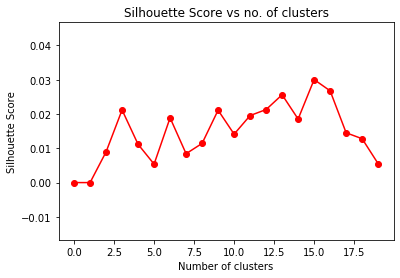

Optimal cluster number is  15

Number of Lines in Summarized text 
2

Deutsche attacks Yukos case

German investment bank Deutsche Bank has challenged the right of Yukos to claim bankruptcy protection in the US. Deutsche Bank claimed Yukos had artificially manufactured a legal case to stop the sale of its main asset.

Document  359

Number of Lines in Actual text
15
2 3 4 5 6 7

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 8 9 10 11 12 13 14 

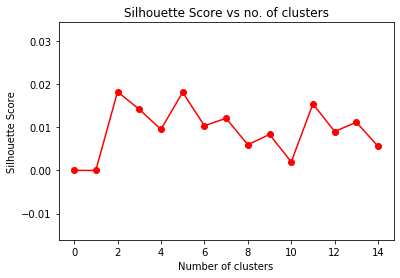

Optimal cluster number is  2

Number of Lines in Summarized text 
10

GM in crunch talks on Fiat future

Fiat will meet car giant General Motors (GM) on Tuesday in an attempt to reach agreement over the future of the Italian firm's loss-making auto group. The meeting between Fiat boss Sergio Marchionne and GM's Rick Wagoner is due to take place at 1330 GMT in Zurich, according to the Reuters news agency. Mr Marchionne is confident of his firm's legal position, saying in an interview with the Financial Times that GM's argument "has no legs". The agreement in question dates back to GM's decision to buy 20% of Fiat's auto division in 2000. At the time, it gave the Italian firm the right, via a 'put option', to sell the remaining stake to GM. However, GM argues that a Fiat share sale made last year, which cut GM's holding to 10%, together with asset sales made by Fiat have terminated the agreement. Selling the Fiat's car-making unit may not prove so simple, analysts say, especially as it i

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


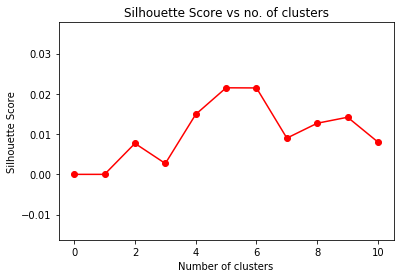

Optimal cluster number is  5

Number of Lines in Summarized text 
4

Record year for Chilean copper

Chile's copper industry has registered record earnings of $14.2bn in 2004, the governmental Chilean Copper Commission (Cochilco) has reported. He added that the boom has allowed the government to collect $950m in taxes. Australia's BHP Billiton - which operates La Escondida, the world's largest open pit copper mine - is planning to invest $1.9bn between now and 2007, while state-owned Codelco will spend about $1bn on various projects. Cochilco expects for 2005 a slight reduction on copper prices and forecasts export earnings will fall 10.7%.

Document  361

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


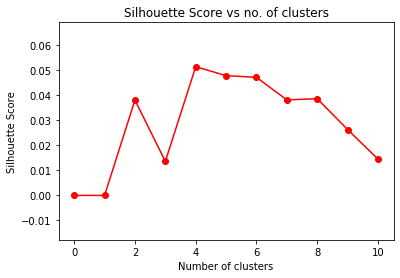

Optimal cluster number is  4

Number of Lines in Summarized text 
4

US consumer confidence up

Consumers' confidence in the state of the US economy is at its highest for five months and they are optimistic about 2005, an influential survey says. The feel-good factor among US consumers rose in December for the first time since July according to new data. Consumer confidence figures are considered a key economic indicator because consumer spending accounts for about two thirds of all economic activity in the United States. The overall US economy has performed strongly in recent months, prompting the Federal Reserve to increase interest rates five times since June.

Document  362

Number of Lines in Actual text
10


C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


2 3 4 5 6 7 8 9 

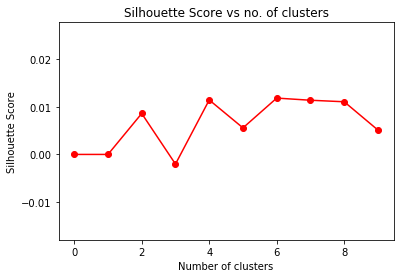

Optimal cluster number is  6

Number of Lines in Summarized text 
1

Cash gives way to flexible friend

Spending on credit and debit cards has overtaken cash spending in the UK for the first time.

Document  363

Number of Lines in Actual text
12
2 3 4 5 6 7

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 8 9 10 11 

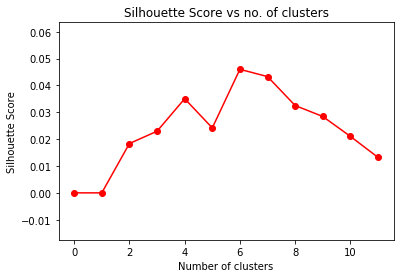

Optimal cluster number is  6

Number of Lines in Summarized text 
4

Go-ahead for Balkan oil pipeline

Albania, Bulgaria and Macedonia has given the go ahead for the construction of a $1.2bn oil pipeline that will pass through the Balkan peninsula. By signing the agreement on Tuesday, the prime ministers of Bulgaria, Albania and Macedonia have overcome the problem. "This is one of the most important infrastructure projects for regional, EU, and Euro-Atlantic integration for the western Balkans," said Albanian Prime Minister Fatos Nano. He added that the company had already raised about $900m from the Overseas Private Investment Corporation (OPIC) - a US development agency - the Eximbank and Credit Suisse First Boston, among others.

Document  364

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


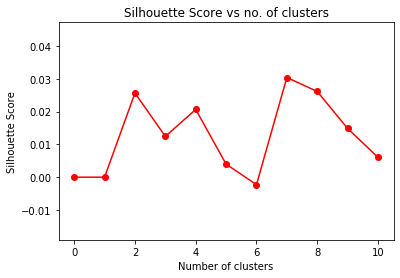

Optimal cluster number is  7

Number of Lines in Summarized text 
1

Durex maker SSL awaits firm bid

UK condom maker SSL International has refused to comment on reports it may be subject to a takeover early in 2005.

Document  365

Number of Lines in Actual text
10
Number of Lines in Summarized text 
1
Nasdaq planning $100m-share sale

The owner of the technology-dominated Nasdaq stock index plans to sell shares to the public and list itself on the market it operates.
Document  366

Number of Lines in Actual text
20
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


11 12 13 14 15 16 17 18 19 

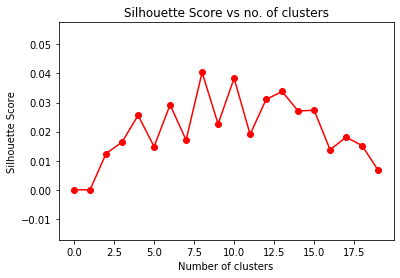

Optimal cluster number is  8

Number of Lines in Summarized text 
3

WMC says Xstrata bid is too low

Australian mining firm WMC Resources has said it is worth up to 30% more than a hostile 7.4bn Australian dollar ($5.8bn; Â£3bn) bid by rival Xstrata. A report from investment firm Grant Samuel in WMC defence documents values WMC shares at A$7.17 to A$8.24, against Xstrata's bid of A$6.35 a share. Analysts said the defence documents provided more details on WMC, and may trigger a possible rival bid.

Document  367

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12 13 14 15 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


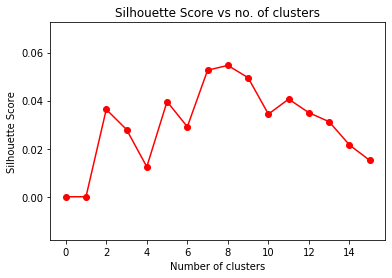

Optimal cluster number is  8

Number of Lines in Summarized text 
1

Takeover offer for Sunderland FC

Bob Murray, chairman of Sunderland FC, has launched a Â£1.5m ($2.8m) bid for the club after buying broadcaster BSkyB's stake in the business.

Document  368

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


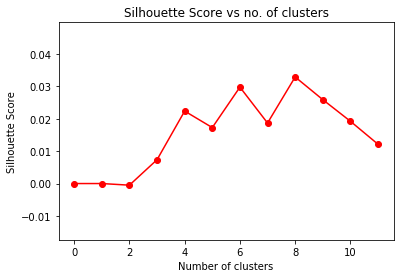

Optimal cluster number is  8

Number of Lines in Summarized text 
2

Warning over US pensions deficit

Taxpayers may have to bail out the US agency that protects workers' pension funds, leading economists have warned. With the Pension Benefit Guaranty Corporation (PBGC) some Â£23bn (Â£12m) in deficit, the Financial Economists Roundtable (FER) wants Congress to act.

Document  369

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


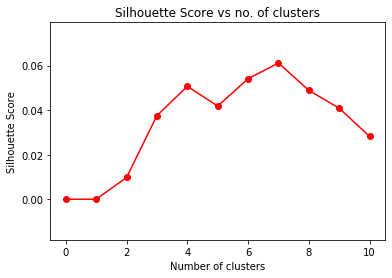

Optimal cluster number is  7

Number of Lines in Summarized text 
2

Beer giant swallows Russian firm

Brewing giant Inbev has agreed to buy Alfa-Eco's stake in Sun Interbrew, Russia's second-largest brewer, for up to 259.7m euros ($353.3m; Â£183.75m). The deal gives Inbev, the world's biggest beermaker, near-total control over the Russian brewer.

Document  370

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


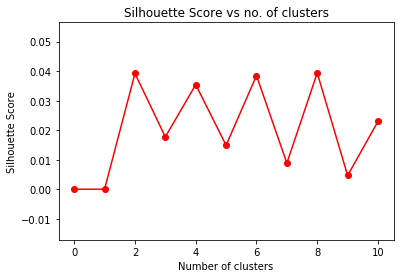

Optimal cluster number is  8

Number of Lines in Summarized text 
1

US manufacturing expands

US industrial production increased in December, according to the latest survey from the Institute for Supply Management (ISM).

Document  371

Number of Lines in Actual text
11
Number of Lines in Summarized text 
0

Document  372

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


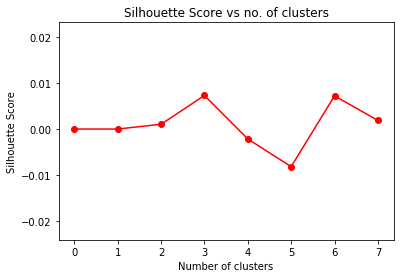

Optimal cluster number is  3

Number of Lines in Summarized text 
2

Madagascar completes currency switch

Madagascar has completed the replacement of its Malagasy franc with a new currency, the ariary. Since we left the French monetary zone in 1973 we should have our own currency with its own name."

Document  373

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


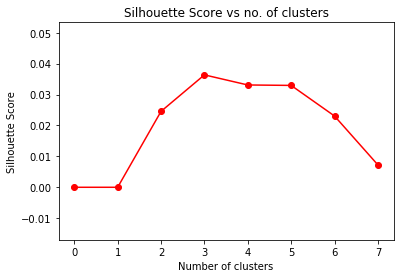

Optimal cluster number is  3

Number of Lines in Summarized text 
3

Quiksilver moves for Rossignol

Shares of Skis Rossignol, the world's largest ski-maker, have jumped as much as 15% on speculation that it will be bought by US surfwear firm Quiksilver. Rossignol shares touched 17.70 euros, before falling back to trade 7.8% higher at 16.60 euros. Companies such as Quiksilver would be able to cut costs by selling Rossignol skis through their shops, they added.

Document  374

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


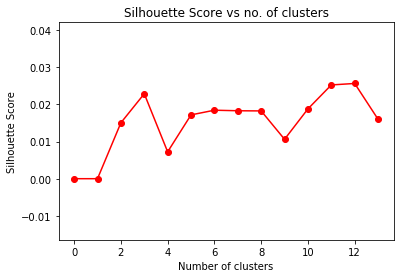

Optimal cluster number is  12

Number of Lines in Summarized text 
2

Dollar hovers around record lows

The US dollar hovered close to record lows against the euro on Friday as concern grows about the size of the US budget deficit. The dollar was trading at $1.3652 versus the euro on Friday morning after hitting a fresh record low of $1.3667 on Thursday.

Document  375

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


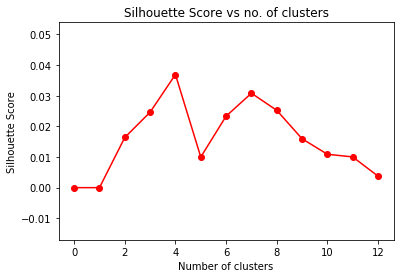

Optimal cluster number is  4

Number of Lines in Summarized text 
5

S Korean credit card firm rescued

South Korea's largest credit card firm has averted liquidation following a one trillion won ($960m; Â£499m) bail-out. A consortium of creditors and LG Group, a family owned conglomerate, have each put up $480m to stabilise the firm. They took control of the company in January when it avoided bankruptcy only through a $4.5bn bail-out. The agreement will see some 12 trillion won of debt converted into equity. South Korea's consumer credit market has been slowly recovering from a crisis in 2002 when a credit bubble burst and millions of consumers fell behind on their debt repayments.

Document  376

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


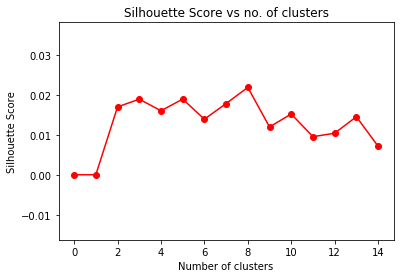

Optimal cluster number is  8

Number of Lines in Summarized text 
4

Dollar slides ahead of New Year

The US dollar has hit a new record low against the euro and analysts predict that more declines are likely in 2005. The dollar slid to a record $1.3666 versus the euro on Thursday, before bouncing back to $1.3636. Against the yen the dollar was trading down at $103.05. On Thursday, disappointing business figures from Chicago brought a sudden end to a rally in the value of the dollar.

Document  377

Number of Lines in Actual text
7
2 3 4 5 6 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


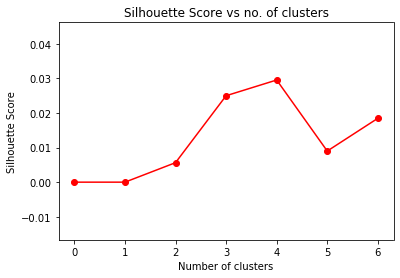

Optimal cluster number is  4

Number of Lines in Summarized text 
2

VW considers opening Indian plant

Volkswagen is considering building a car factory in India, but said it had yet to make a final decision. The German giant said it was studying the possibility of opening an assembly plant in the country, but that it remained only a "potential" idea.

Document  378

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


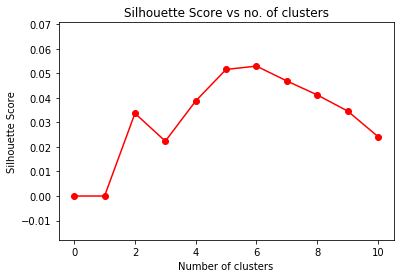

Optimal cluster number is  6

Number of Lines in Summarized text 
3

Ukraine strikes Turkmen gas deal

Ukraine has agreed to pay 30% more for natural gas supplied by Turkmenistan. Supplies from Turkmenistan account for 45% of all natural gas imported by Ukraine, which has large coal deposits but no gas fields. Turkmenistan is also trying to strike a similar deal with Russia, which is not so dependent on its gas.

Document  379

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 

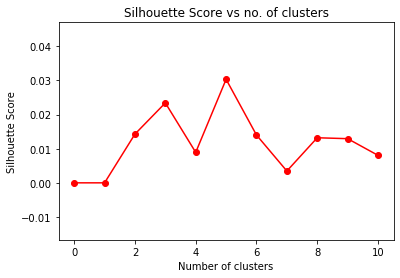

Optimal cluster number is  5

Number of Lines in Summarized text 
4

Reliance unit loses Anil Ambani

Anil Ambani, the younger of the two brothers in charge of India's largest private company, has resigned from running its petrochemicals subsidiary. The move is likely to be seen as the latest twist in a feud between Mr Ambani and his brother Mukesh. Anil, 45, has stepped down as director and vice-chairman of Indian Petrochemicals Corporation (IPC). Speculation has been rife about what has triggered the stand-off, with some observers blaming Anil's political ambitions, others the heavy investment by Mukesh and Reliance in a mobile phone venture.

Document  380

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


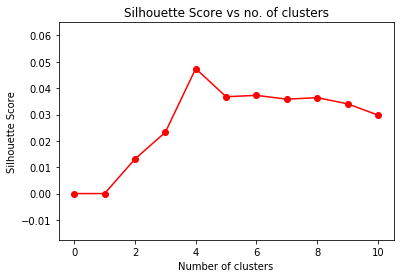

Optimal cluster number is  4

Number of Lines in Summarized text 
4

India opens skies to competition

India will allow domestic commercial airlines to fly long haul international routes, a move it hopes will stoke competition and drive down prices. India is looking to develop its airline industry as booming economic growth drives demand for travel. Infrastructure development is lagging demand, however, and will have to improve. Steps have been take to move things forward and the government recently changed legislation that limited foreign investment in domestic airlines.

Document  381

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


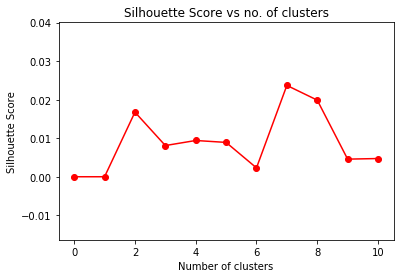

Optimal cluster number is  7

Number of Lines in Summarized text 
2

Oil rebounds from weather effect

Oil prices recovered in Asian trade on Tuesday, after falling in New York on milder winter weather across the US. With milder temperatures expected to continue in the northern parts of the US over the next few days at least, analysts have said the price of oil may fall further - even if the decline was only temporary.

Document  382

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


13 14 

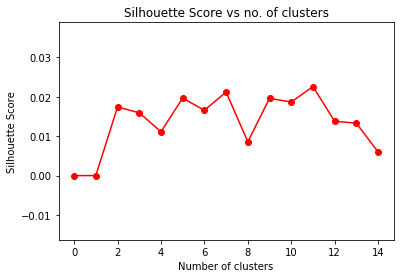

Optimal cluster number is  11

Number of Lines in Summarized text 
1

Ban on forced retirement under 65

Employers will no longer be able to force workers to retire before 65, unless they can justify it.

Document  383

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


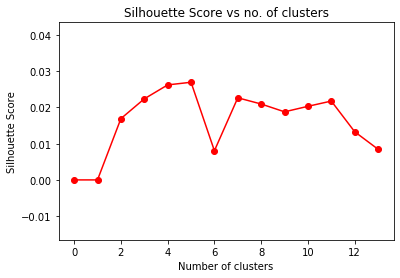

Optimal cluster number is  5

Number of Lines in Summarized text 
2

Fed warns of more US rate rises

The US looks set for a continued boost to interest rates in 2005, according to the Federal Reserve. The odds now favour a further boost to rates at the next meeting in early February, economists said.

Document  384

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 16 

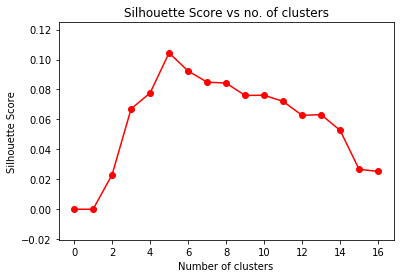

Optimal cluster number is  5

Number of Lines in Summarized text 
3

Weak end-of-year sales hit Next

Next has said its annual profit will be Â£5m lower than previously expected because its end-of-year clearance sale has proved disappointing. The High Street retailer said it now expected to report annual profits of between Â£415m and Â£425m ($779m-798m). "Profits of around Â£420m would be well within the comfort zone."

Document  385

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


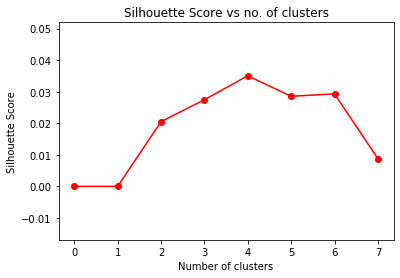

Optimal cluster number is  4

Number of Lines in Summarized text 
2

Tate & Lyle boss bags top award

Tate & Lyle's chief executive has been named European Businessman of the Year by a leading business magazine. Tate & Lyle, which was an original member of the historic FT-30 index in 1935, operates more than 41 factories and 20 more additional production facilities in 28 countries.

Document  386

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


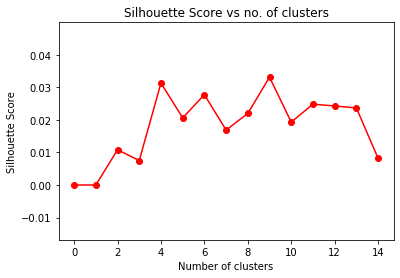

Optimal cluster number is  9

Number of Lines in Summarized text 
3

Krispy Kreme shares hit

Shares in Krispy Kreme Doughnuts have taken a dunking on Wall Street after the firm revealed it would have to restate its 2004 financial reports. The company warned the move would cut its profits by $3.8m to $4.9m (Â£2m to Â£2.6m) - or between 6.6% and 8.6%. Shares in Krispy Kreme sank 14.87% - or $1.83 - to close at $10.48 on the news.

Document  387

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


15 16 

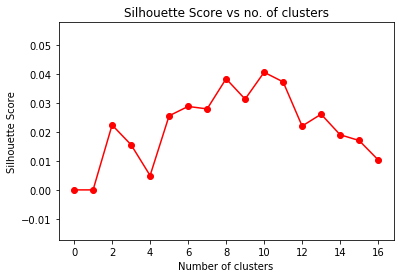

Optimal cluster number is  10

Number of Lines in Summarized text 
2

Germany nears 1990 jobless level

German unemployment rose for the 11th consecutive month in December - making the year's average jobless total the highest since reunification. But he did add that the numbers should "subside" throughout the year, to remain near 2004's level of 4.4 million jobless.

Document  388

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


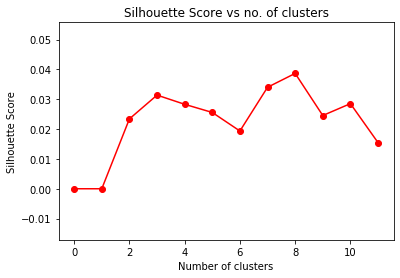

Optimal cluster number is  8

Number of Lines in Summarized text 
1

Venezuela identifies 'idle' farms

Venezuelan authorities have identified more than 500 farms, including 56 large estates, as idle as it continues with its controversial land reform policy.

Document  389

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


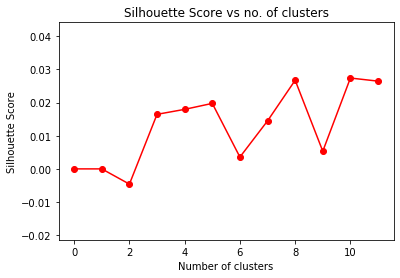

Optimal cluster number is  10

Number of Lines in Summarized text 
3

Egypt to sell off state-owned bank

The Egyptian government is reportedly planning to privatise one of the country's big public banks. Nevertheless, the Egyptian government has spoken for years about privatising one of the big four state banks - Banque Misr, National Bank of Egypt, Banque du Caire and Bank of Alexandria. It had been expected one of the smallest of the four big public banks - Bank of Alexandria or Banque du Caire - would be sold first.

Document  390

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


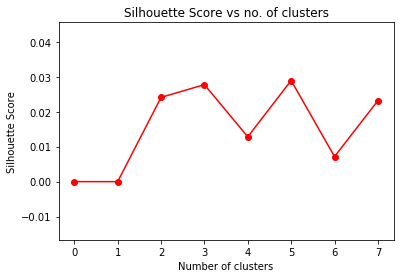

Optimal cluster number is  5

Number of Lines in Summarized text 
3

Wal-Mart to pay $14m in gun suit

The world's largest retailer, Wal-Mart, has agreed to pay a total of $14.5m (Â£7.74m) to settle a lawsuit over gun sales violations in California. The total payment includes $5m in fines and more than $4m to fund state compliance checks with gun laws and prevent ammunition sales to minors. The world's largest retailer has not yet decided whether to resume firearms sales in California, company spokesman Gus Whitcomb said.

Document  391

Number of Lines in Actual text
19
2 3 4 5 6 7 8 9 10 11 12 13 14 15 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


16 17 18 

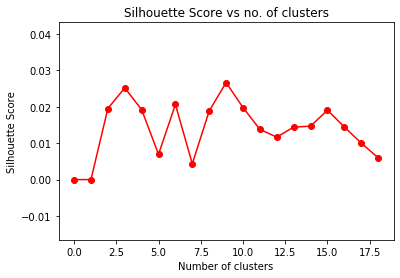

Optimal cluster number is  9

Number of Lines in Summarized text 
6

Yukos heading back to US courts

Russian oil and gas company Yukos is due in a US court on Thursday as it continues to fight for its survival. Judge Letitia Clark will hear different motions, including one from Deutsche Bank to throw out the Chapter 11 bankruptcy filing. Deutsche Bank, which is also an advisor to Gazprom, has called on the US court to overturn its decision to provide Yukos with bankruptcy protection. On top of that, the firm only has limited assets in the US. Yukos has won small victories, however, and is bullish about its chances in court. We think we do," said Mike Lake, a Yukos spokesman.

Document  392

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


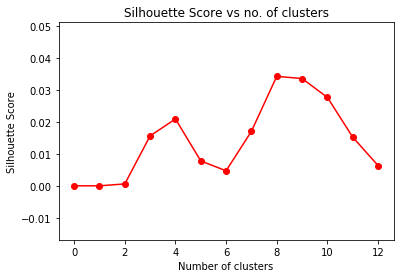

Optimal cluster number is  8

Number of Lines in Summarized text 
3

Deutsche Boerse set to 'woo' LSE

Bosses of Deutsche Boerse and the London Stock Exchange are to meet amid talk that a takeover bid for the LSE will be raised to Â£1.5bn ($2.9bn). Euronext is due to hold talks with LSE this week and it is reported to be ready to raise Â£1.4bn to fund a bid. Euronext chief Jean-Francois Theodore is scheduled to meet his LSE counterpart Clara Furse on Friday.

Document  393

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 13 14 15 16

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


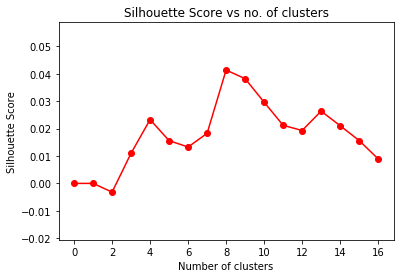

Optimal cluster number is  8

Number of Lines in Summarized text 
3

Laura Ashley chief stepping down

Laura Ashley is parting company with its chief executive Ainum Mohd-Saaid. In a statement issued on Thursday, Laura Ashley thanked Ms Mohd-Saaid for her services to the company. Laura Ashley, which is due to issue its next trading statement in the next few weeks, has in recent months been hit by reports of poor sales.

Document  394

Number of Lines in Actual text
8
2 3 4 5

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 6 7 

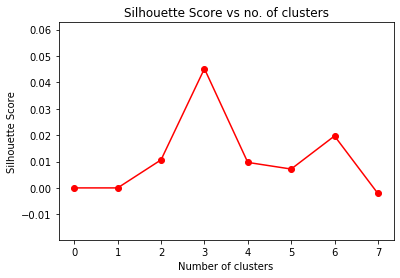

Optimal cluster number is  3

Number of Lines in Summarized text 
4

US Airways staff agree to pay cut

A union representing 5,200 flight attendants at bankrupt US Airways have agreed to a new contract that cuts pay by nearly 10%. More than two thirds of its 28,000 staff have now accepted wage cuts. But talks are still continuing with a union representing mechanics, baggage handlers and cleaners, which has so far failed to negotiate a new contract. US Airways management has said it may need to start liquidating assets if it does not receive concessions from all staff by the middle of this month.

Document  395

Number of Lines in Actual text
11
2 3 4 5 6 7

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 8 9 10 

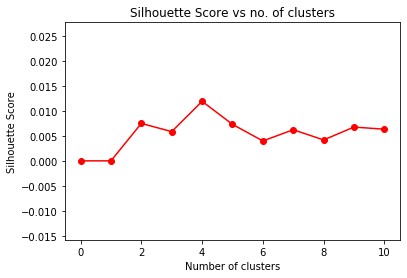

Optimal cluster number is  4

Number of Lines in Summarized text 
5

Delta cuts fares in survival plan

Delta Air Lines is cutting domestic fares by as much as 50% as part of a plan to ensure its financial survival. Delta is restructuring in a bid to fight off insolvency. In October, it reached a crucial agreement with pilots on pay and conditions and it has also issued new shares to staff in return for wage cuts. Airline shares closed lower on the announcement, with Delta, Continental and American Airlines all falling by more than 7%. "We believe the whole airline industry will now have to move in this direction; this will likely hurt revenue in the short run but could be beneficial in the long run," said analyst Ray Neidl at Calyon Securities.

Document  396

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


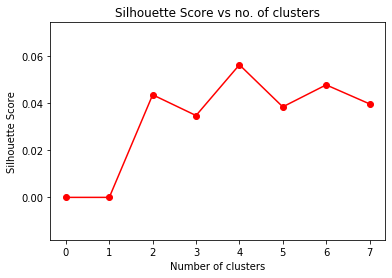

Optimal cluster number is  4

Number of Lines in Summarized text 
3

Profits jump at China's top bank

Industrial and Commercial Bank (ICBC), China's biggest lender, has seen an 18% jump in profits during 2004. It has already pumped $45bn (Â£24bn) into two of its largest banks, and has identified ICBC as a recipient of aid. ICBC's profits were 74.7bn yuan ($9bn; Â£4.8bn) in 2004, the bank said in a statement.

Document  397

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 13 14 15 16 

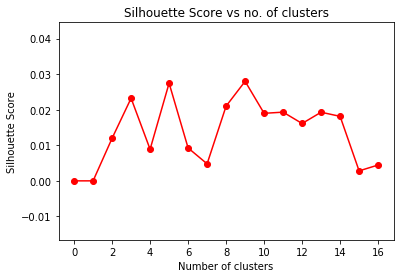

Optimal cluster number is  9

Number of Lines in Summarized text 
1

Green reports shun supply chain

Nearly 20% more UK top 250 firms produced non-financial reports on social and environment issues than last year.

Document  398

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 12

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


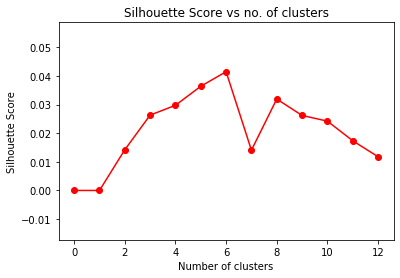

Optimal cluster number is  6

Number of Lines in Summarized text 
4

Tsunami to cost Sri Lanka $1.3bn

Sri Lanka faces a $1.3bn (Â£691m) bill in 2005 for reconstruction after the tsunami which killed more than 30,000 of its people, its central bank says. The bank has 5bn rupees ($50m; Â£27m) set aside to lend at a lower interest rate to those who lost property. Some 150,000 people across the region are feared to be dead and millions have been left homeless and destitute. A full reckoning of the economic cost to Sri Lanka of the tsunami will not be clear for some time to come.

Document  399

Number of Lines in Actual text
28
2 3 4 5 6 7 8 9 10 11 12 13 14

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 15 16 17 18 19 20 21 22 23 24 25 26 27 

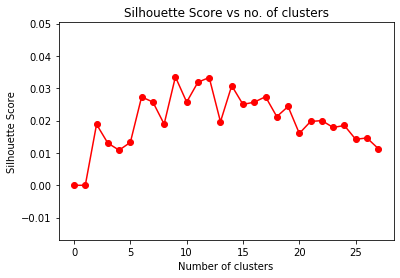

Optimal cluster number is  9

Number of Lines in Summarized text 
5

Indian oil firm eyes Yukos assets

India's biggest oil exploration firm, Oil & Natural Gas Corp (ONGC), says it is in talks to buy the former assets of troubled Russian crude producer Yukos. At the same time, India's economy is booming and the country's thirst for oil is so strong that it has helped pushed up the price of crude worldwide. ONGC, which is majority-owned by the Indian state, already has bought petroleum assets in countries including Vietnam, Sudan and Russia. ONGC is, however, not the only firm interested in Yugansk. ONGC's interest is the latest twist in a saga that has seen one of the world's biggest oil producers brought to its knees.

Document  400

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 

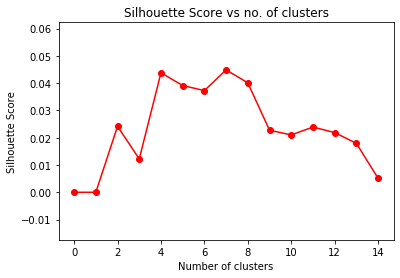

Optimal cluster number is  7

Number of Lines in Summarized text 
3

Monsanto fined $1.5m for bribery

The US agrochemical giant Monsanto has agreed to pay a $1.5m (Â£799,000) fine for bribing an Indonesian official. In addition to the penalty, Monsanto also agreed to three years' close monitoring of its business practices by the American authorities. A former senior manager at Monsanto directed an Indonesian consulting firm to give a $50,000 bribe to a high-level official in Indonesia's environment ministry in 2002.

Document  401

Number of Lines in Actual text
13
2 3 4

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 5 6 7 8 9 10 11 12 

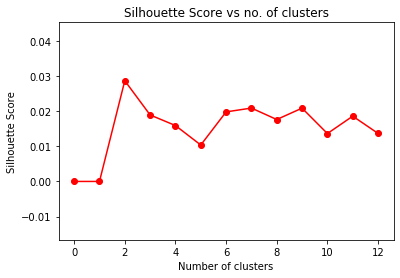

Optimal cluster number is  2

Number of Lines in Summarized text 
11

Marsh executive in guilty plea

An executive at US insurance firm Marsh & McLennan has pleaded guilty to criminal charges in connection with an ongoing fraud and bid-rigging probe. New York Attorney General Elliot Spitzer said senior vice president Robert Stearns had pleaded guilty to scheming to defraud. Mr Spitzer's office added Mr Stearns had also agreed to testify in future cases during the industry inquiry. "We are saddened by the development," Marsh said in a statement. The company added it would continue to co-operate in the case, adding it was "committed to resolving the company's legal issues and to serving our clients with the highest standards of transparency and ethics". According to a statement from Mr Spitzer's office, the Marsh executive admitted he instructed insurance companies to submit non-competitive bids for insurance business between 2002 and 2004. Those bids were then "conveyed to Marsh clients

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


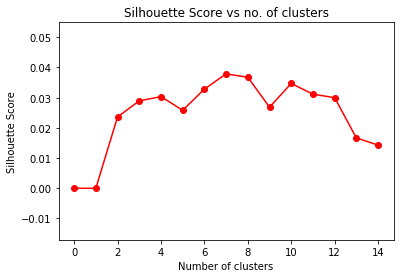

Optimal cluster number is  7

Number of Lines in Summarized text 
1

US interest rate rise expected

US interest rates are expected to rise for the fifth time since June following the US Federal Reserve's latest rate-setting meeting later on Tuesday.

Document  403

Number of Lines in Actual text
16
2 3 4 5 6 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


7 8 9 10 11 12 13 14 15 

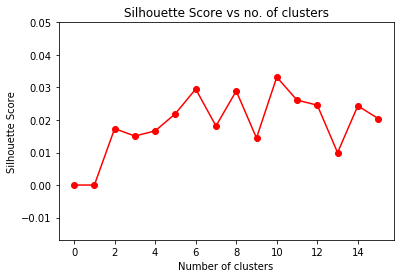

Optimal cluster number is  10

Number of Lines in Summarized text 
2

WorldCom bosses' $54m payout

Ten former directors at WorldCom have agreed to pay $54m (Â£28.85m), including $18m from their own pockets, to settle a class action lawsuit, reports say. The remaining $36m will be paid by the directors' insurers.

Document  404

Number of Lines in Actual text
11
2

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 3 4 5 6 7 8 9 10 

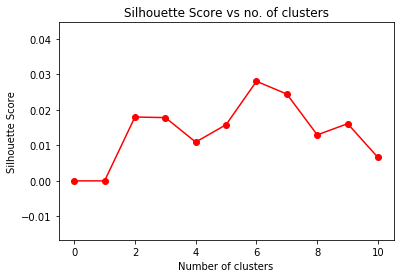

Optimal cluster number is  6

Number of Lines in Summarized text 
4

Continental 'may run out of cash'

Shares in Continental Airlines have tumbled after the firm warned it could run out of cash. In a filing to US regulators the airline warned of "inadequate liquidity" if it fails to reduce wage costs by $500m by the end of February. "Without the reduction in wage and benefit costs and a reasonable prospect of future profitability, we believe that our ability to raise additional money through financings would be uncertain," Continental said in its filing to the US Securities and Exchange Commission (SEC). Two weeks' ago the group also announced it would be able to shave a further $48m a year from its costs with changes to wage and benefits for most of its US-based management and clerical staff.

Document  405

Number of Lines in Actual text
22
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 11 12 13 14 15 16 17 18 19 20 21 

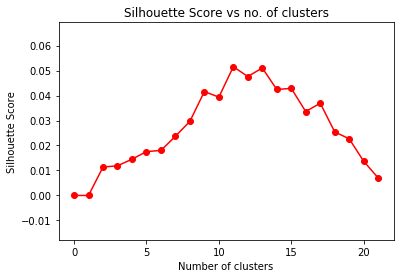

Optimal cluster number is  11

Number of Lines in Summarized text 
2

House prices rebound says Halifax

UK house prices increased by 1.1% in December, the first monthly rise since September, the Halifax has said. The average price of a house in the UK now stands at Â£162,086, Halifax said.

Document  406

Number of Lines in Actual text
23
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


15 16 17 18 19 20 21 22 

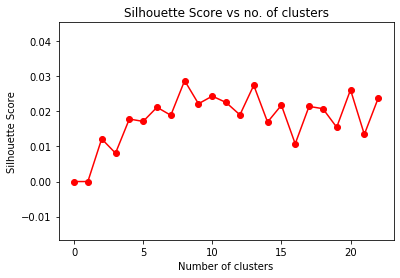

Optimal cluster number is  8

Number of Lines in Summarized text 
1

Mixed Christmas for US retailers

US retailers posted mixed results for December - with luxury retailers faring well while many others were forced to slash prices to lift sales.

Document  407

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


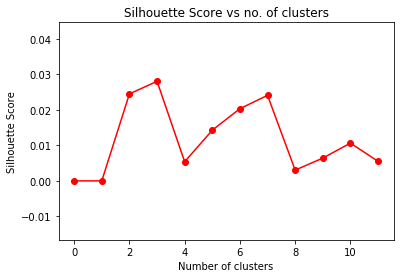

Optimal cluster number is  3

Number of Lines in Summarized text 
3

India's Deccan gets more planes

Air Deccan has signed a deal to acquire 36 planes from Avions de Transport Regional (ATR). But Air Deccan's managing director Gorur Gopinath has said the price agreed was less than the catalogue price of $17.6m (Â£9.49m) per plane. Mr Gopinath said the planes will connect regional Indian cities.

Document  408

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


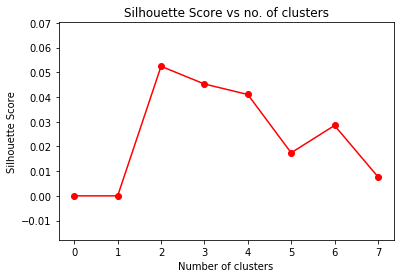

Optimal cluster number is  2

Number of Lines in Summarized text 
4

South African car demand surges

Car manufacturers with plants in South Africa, including BMW, General Motors, Toyota and Volkswagen, have seen a surge in demand during 2004. Strong economic growth and low interest rates have driven demand, and analysts expect the trend to continue. While domestic demand is set to continue to enjoy rapid growth, foreign sales could come under pressure, analysts said. However, the world auto market has its problems and analysts warn that overcapacity and the strength of the rand could hit exports.

Document  409

Number of Lines in Actual text
31
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 

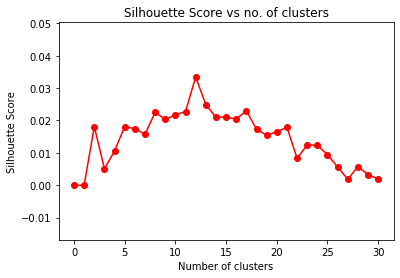

Optimal cluster number is  12

Number of Lines in Summarized text 
3

UK bank seals South Korean deal

UK-based bank Standard Chartered said it would spend $3.3bn (Â£1.8bn) to buy one of South Korea's main retail banks. Its shares fell nearly 3% in London as the bank raised funds for the deal by selling new stocks worth Â£1bn ($1.8bn), equal to 10% of its share capital. The move, a year after Citigroup beat Standard Chartered to buy Koram bank, would be the South Korean financial sector's biggest foreign takeover.

Document  410

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


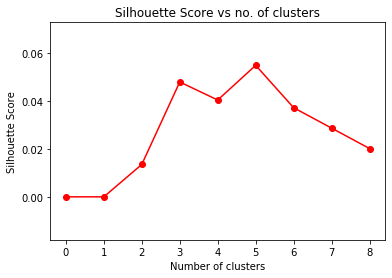

Optimal cluster number is  5

Number of Lines in Summarized text 
2

DaimlerChrysler's 2004 sales rise

US-German carmaker DaimlerChrysler has sold 2.1% more cars in 2004 than in the previous year, as solid Chrysler sales offset a weak showing for Mercedes. Similarly on the up was the Smart brand of compact cars, with the division's sales jumping by 21.1% during 2004 to 136,000.

Document  411

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


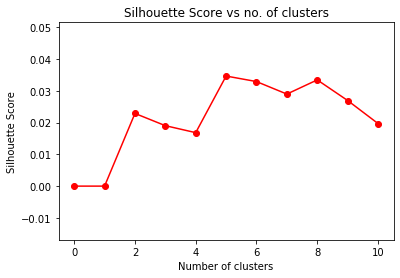

Optimal cluster number is  5

Number of Lines in Summarized text 
3

Tsunami cost hits Jakarta shares

The stock market in Jakarta has seen its biggest slide in a month, after the country doubled the likely cost of rebuilding from the Asian tsunami. By Monday's close, the Jakarta Stock Exchange was down 2.1% at 1,011.15. Bar a slight dip at the New Year, The JSE had risen steadily by 4.7% since the tsunami hit on 26 December.

Document  412

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12 13 14 15 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


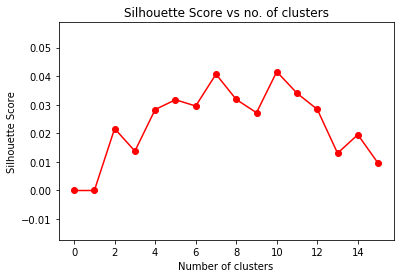

Optimal cluster number is  10

Number of Lines in Summarized text 
2

Iran budget seeks state sell-offs

Iran's president, Mohammad Khatami, has unveiled a budget designed to expand public spending by 30% but loosen the Islamic republic's dependence on oil. Mr Khatami's second term as president ends on 1 August, making this his last budget.

Document  413

Number of Lines in Actual text
19
2 3 4 5 6 7 8 9 10 11 12 13 14 15

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 16 17 18 

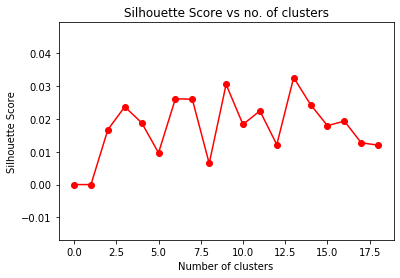

Optimal cluster number is  13

Number of Lines in Summarized text 
1

EC calls truce in deficit battle

The European Commission (EC) has called a truce in its battle with France and Germany over breaching deficit limits.

Document  414

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 16 

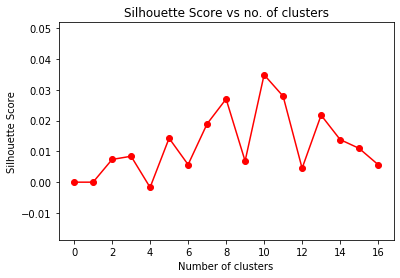

Optimal cluster number is  10

Number of Lines in Summarized text 
6

Enron bosses in $168m payout

Eighteen former Enron directors have agreed a $168m (Â£89m) settlement deal in a shareholder lawsuit over the collapse of the energy firm. Leading plaintiff, the University of California, announced the news, adding that 10 of the former directors will pay $13m from their own pockets. Under the terms of the $168m settlement - $155m of which will be covered by insurance - none of the 18 former directors will admit any wrongdoing. So far, including the latest deal, just under $500m (Â£378.8m) has been retrieved for investors. However, the latest deal does not include former Enron chief executives Ken Lay and Jeff Skilling. It joined the lawsuit in December 2001alleging "massive insider trading" and fraud, claiming it had lost $145m on its investments in the company.

Document  415

Number of Lines in Actual text
18
2 3 4 5 6 7 8 9 10 11 12 13 14

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 15 16 

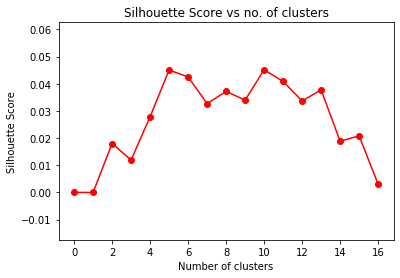

Optimal cluster number is  10

Number of Lines in Summarized text 
3

UK house prices dip in November

UK house prices dipped slightly in November, the Office of the Deputy Prime Minister (ODPM) has said. It said annual inflation rose between October and November because prices had fallen by 1.1% in the same period in 2003. In London, the area with the highest average house price at Â£262,825, annual inflation rose only slightly in November to 7.1% from 7% the previous month.

Document  416

Number of Lines in Actual text
17
Number of Lines in Summarized text 
0

Document  417

Number of Lines in Actual text
12
2 3 4 5 6 7

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 8 9 10 11 

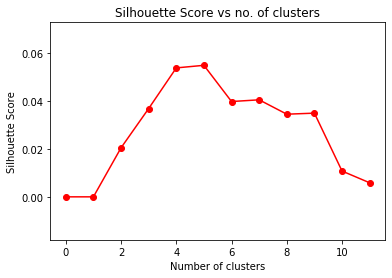

Optimal cluster number is  5

Number of Lines in Summarized text 
6

Barclays shares up on merger talk

Shares in UK banking group Barclays have risen on Monday following a weekend press report that it had held merger talks with US bank Wells Fargo. A tie-up between Barclays and California-based Wells Fargo would create the world's fourth biggest bank, valued at $180bn (Â£96bn). The two banks reportedly held talks in October and November 2004. Barclays shares were up 8 pence, or 1.3%, at 605 pence by late morning in London on Monday, making it the second biggest gainer in the FTSE 100 index. In 2003, Barclays reported a 20% rise in pre-tax profits to Â£3.8bn, and it has recently forecast similar gains in 2004, predicting that full year pre-tax profits would rise 18% to Â£4.5bn. Wells Fargo had net income of $6.2bn in its last financial year, a 9% increase on the previous year, and revenues of $28.4bn.

Document  418

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


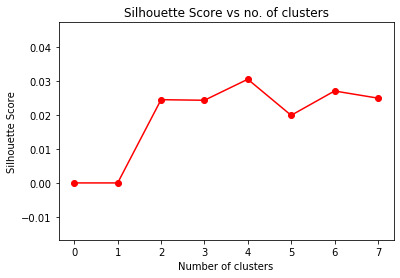

Optimal cluster number is  4

Number of Lines in Summarized text 
3

US firm 'bids for Lacroix label'

A US firm has said it is in final negotiations with luxury goods group LVMH to buy the loss-making Christian Lacroix haute-couture house. Privately-held Falic Group bought two cosmetics brands, Hard Candy and Urban Decay, from LVMH in early 2003. But one of the three brothers behind the Falic Group said the firm had also held talks with the designer Christian Lacroix, and wished to retain him.

Document  419

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


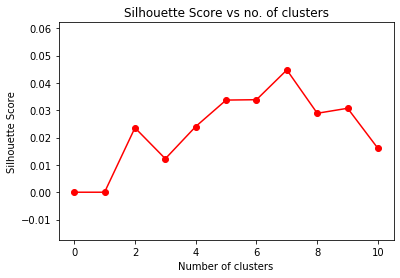

Optimal cluster number is  7

Number of Lines in Summarized text 
3

$1m payoff for former Shell boss

Shell is to pay $1m (Â£522,000) to the ex-finance chief who stepped down from her post in April 2004 after the firm over-stated its reserves. In January 2004, Shell told shocked investors that its reserves were 20% smaller than previously thought. In all, Shell restated its reserves four times during 2003.

Document  420

Number of Lines in Actual text
11
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


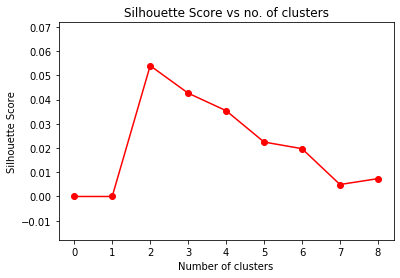

Optimal cluster number is  2

Number of Lines in Summarized text 
5

India and Iran in gas export deal

India has signed a $40bn (Â£21bn) deal to import millions of tonnes of liquefied natural gas from Iran. Firms led by the Oil & Natural Gas Corporation (ONGC) will also assist in the development of Iranian oil fields. Under the agreement, it will supply India with 7.5 million tonnes of LPG annually over a 25 year period from 2009. ONGC and the National Iranian Oil Company (NIOC) reached a preliminary deal for Indian firms to take part in the development of the Yadavaran and Jufeyr oilfields, both countries said in a statement. Consumption has jumped to 2.4 million barrels per day, compared with 474,000 bpd in 1973.

Document  421

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


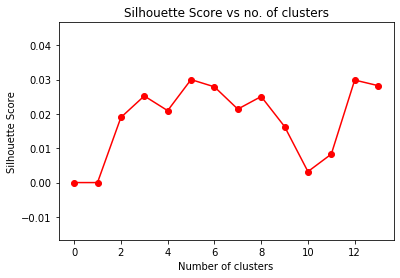

Optimal cluster number is  5

Number of Lines in Summarized text 
3

LSE 'sets date for takeover deal'

The London Stock Exchange (LSE) is planning to announce a preferred takeover by the end of the month, newspaper reports claim. Unions for Deutsche Boerse staff in Frankfurt have reportedly expressed fears that up to 300 jobs would be moved to London if the takeover is successful. Others claim it will weaken the city's status as Europe's financial centre, while German politicians are also said to be angry over the market operator's promise to move its headquarters to London if a bid is successful.

Document  422

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


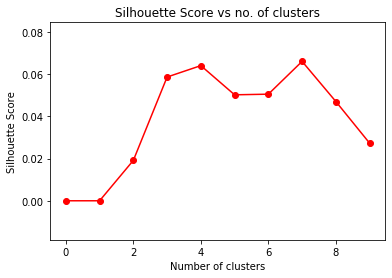

Optimal cluster number is  7

Number of Lines in Summarized text 
2

News Corp makes $5.4bn Fox offer

News Corporation is seeking to buy out minority investors in Fox Entertainment Group, its broadcasting subsidiary, for about $5.4bn (Â£3.7bn). Fox Entertainment Group generated revenues of $12bn last year.

Document  423

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


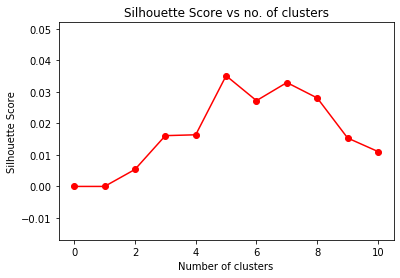

Optimal cluster number is  5

Number of Lines in Summarized text 
3

Israel looks to US for bank chief

Israel has asked a US banker and former International Monetary Fund director to run its central bank. Stanley Fischer, vice chairman of banking giant Citigroup, has agreed to take the Bank of Israel job subject to approval from parliament and cabinet. The US says he will not have to give up US citizenship to do so.

Document  424

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 15 

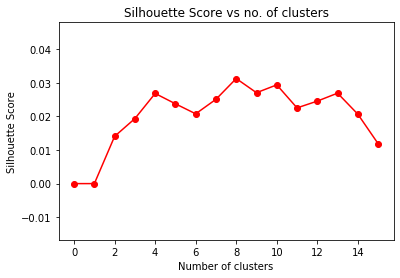

Optimal cluster number is  8

Number of Lines in Summarized text 
3

EU-US seeking deal on air dispute

The EU and US have agreed to begin talks on ending subsidies given to aircraft makers, EU Trade Commissioner Peter Mandelson has announced. Last year, the US terminated an agreement with the EU, reached in 1992, which limits the subsidies countries can hand over to civil aircraft makers. However, both sides agreed to suspend their requests for WTO arbitration at the beginning of December, to allow bilateral talks to continue.

Document  425

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


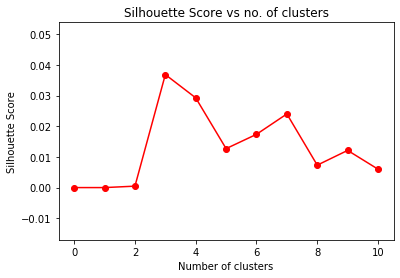

Optimal cluster number is  3

Number of Lines in Summarized text 
4

Nortel in $300m profit revision

Telecoms equipment maker Nortel Networks has sharply revised downwards its profits for the 2003 fiscal year. In a long-awaited filing, Nortel said it had made $434m (Â£231m), compared to the previously reported $732m. Nortel shares, which have lost nearly 50% of their value since last year, climbed 1.46% in Toronto on Tuesday. The company also said 12 senior executives - none of whom were involved directly in the accounting of the revised figures - have voluntarily agreed to repay to bonuses awarded in 2003 totalling $8.6m.

Document  426

Number of Lines in Actual text
22
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 13 14 15 16 17 18 19 20 21 

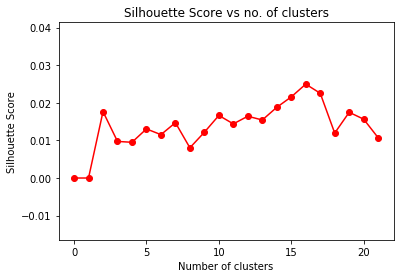

Optimal cluster number is  16

Number of Lines in Summarized text 
1

Minister hits out at Yukos sale

Russia's renationalisation of its energy industry needs to be reversed, a senior government figure has warned.

Document  427

Number of Lines in Actual text
13
2 3 4 5

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 6 7 8 9 10 11 12 

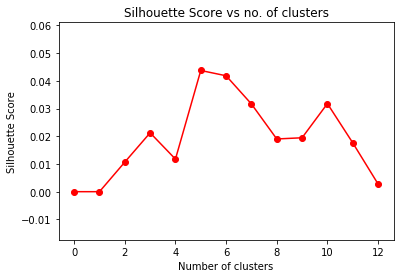

Optimal cluster number is  5

Number of Lines in Summarized text 
1

Chinese exports rise 25% in 2004

Exports from China leapt during 2004 over the previous year as the country continued to show breakneck growth.

Document  428

Number of Lines in Actual text
29
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 

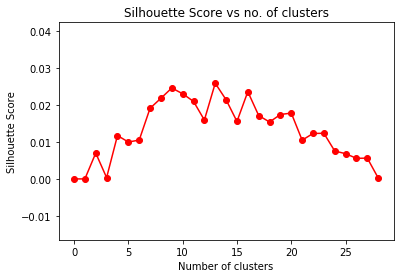

Optimal cluster number is  13

Number of Lines in Summarized text 
2

Karachi stocks hit historic high

The Karachi Stock Exchange (KSE) has recorded its largest single day gain, surging 3.5% to a new high. In 2002, the KSE was the world's best performing stock market, with the index rising 112%.

Document  429

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 13 14 

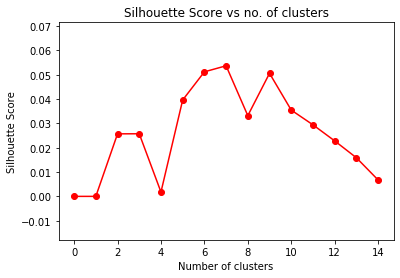

Optimal cluster number is  7

Number of Lines in Summarized text 
3

US trade gap ballooned in October

The US trade deficit widened by more than expected in October, hitting record levels after higher oil prices raised import costs, figures have shown

The trade shortfall was $55.5bn (Â£29bn), up 9% from September, the Commerce Department said. That pushed the 10 month deficit to $500.5bn. The US imported almost $20bn worth of goods from China during October, exporting a little under $3bn.

Document  430

Number of Lines in Actual text
20
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


12 13 14 15 16 17 18 19 

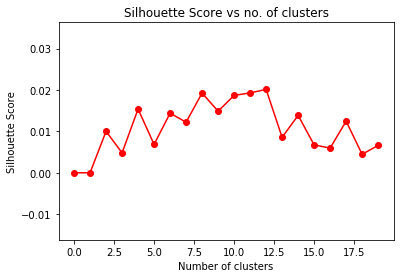

Optimal cluster number is  12

Number of Lines in Summarized text 
2

US prepares for hybrid onslaught

Sales of hybrid cars in the US are set to double in 2005, research suggests. Research group JD Power estimates sales will hit 200,000 in 2005, despite higher prices and customer scepticism.

Document  431

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


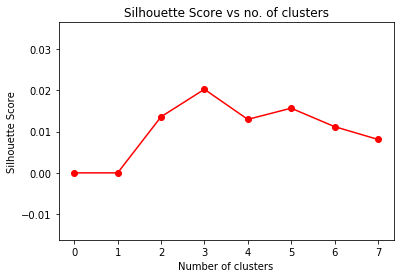

Optimal cluster number is  3

Number of Lines in Summarized text 
3

Mitsubishi in Peugeot link talks

Trouble-hit Mitsubishi Motors is in talks with French carmaker PSA Peugeot Citroen about a possible alliance. Mitsubishi's sales have slid 41% in the past year, catalysed by the revelation that the company had systematically been hiding records of faults and then secretly repairing vehicles. Analysts said that alliances with other carmakers would be a necessary part of whatever it came up with, not least because its own slow sales have left its manufacturing capacity under-used.

Document  432

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


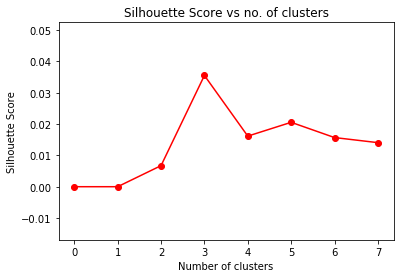

Optimal cluster number is  3

Number of Lines in Summarized text 
5

BA to suspend two Saudi services

British Airways is to halt its flights from London Heathrow to Jeddah and Riyadh in Saudi Arabia from 27 March. BA currently operates four flights per week from Heathrow to Jeddah, and three weekly journeys to Riyadh. It suspended flights to Saudi Arabia for three weeks in autumn 2003 after a government warning about a "threat to UK aviation interests in Saudi Arabia". BA will now suspend the Saudi flights - which it says will remain "under constant review" - from 27 March. "The decision to suspend flights between the UK and Saudi Arabia is a difficult one to make as we have enjoyed a long history of flying between the two countries," said BA director of commercial planning, Robert Boyle.

Document  433

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


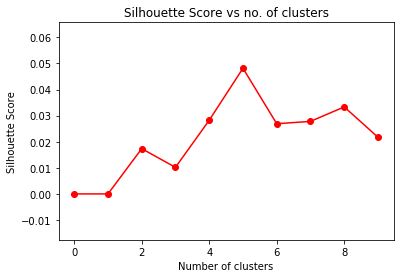

Optimal cluster number is  5

Number of Lines in Summarized text 
2

Cairn Energy in Indian gas find

Shares in Cairn Energy rose 3.8% to 1,088 pence on Tuesday after the UK firm announced a fresh gas discovery in northern India. The firm, which last year made a number of other new finds in the Rajasthan area, said the latest discovery could lead to large gas volumes.

Document  434

Number of Lines in Actual text
27
2 3 4 5 6 7 8 9 10 11 12 13 14 15 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


16 17 18 19 20 21 22 23 24 25 26 

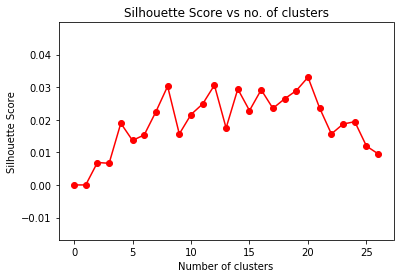

Optimal cluster number is  20

Number of Lines in Summarized text 
3

Asia quake increases poverty risk

Nearly two million people across Asia could be thrown into poverty because of the Indian Ocean tsunami, the Asian Development Bank (ADB) has said. The ADB fears that 1 million Indonesians could join them, while in India just over half a million people - 645,000 - are at risk of falling into poverty. A quarter of a million Sri Lankans and 23,500 people in the Maldives are also facing poverty.

Document  435

Number of Lines in Actual text
24
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 

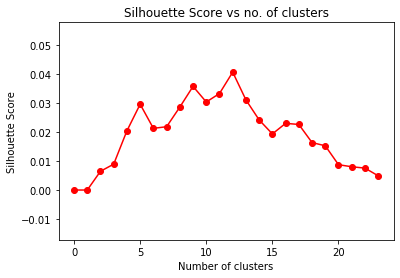

Optimal cluster number is  12

Number of Lines in Summarized text 
1

Fosters buys stake in winemaker

Australian brewer Fosters has bought a large stake in Australian winemaker Southcorp, sparking rumours of a possible takeover.

Document  436

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


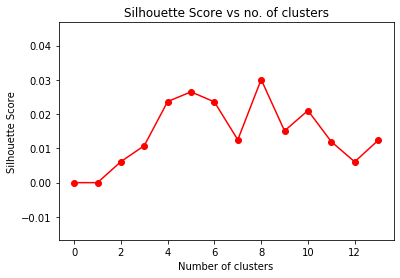

Optimal cluster number is  8

Number of Lines in Summarized text 
5

ECB holds rates amid growth fears

The European Central Bank has left its key interest rate unchanged at 2% for the 19th month in succession. Borrowing costs have remained on hold amid concerns about the strength of economic growth in the 12 nations sharing the euro, analysts said. Inflation in the eurozone, however, is estimated at about 2.3% in December, above ECB guidelines of 2%. ECB President Jean-Claude Trichet has remained upbeat about prospects for the region, and inflation is expected to drop below 2% later in 2005. The ECB has forecast economic growth in the eurozone of 1.9% in 2005.

Document  437

Number of Lines in Actual text
25
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 

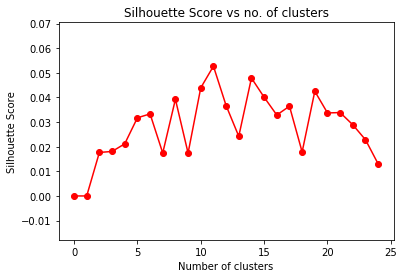

Optimal cluster number is  11

Number of Lines in Summarized text 
7

China bans new tobacco factories

The world's biggest tobacco consumer, China, has said it will not allow any new tobacco factories to be built. The ban threatens to reignite tensions between the regulator and British American Tobacco, which plans to become China's first foreign cigarette maker. "China won't allow any new tobacco factories to be built, including joint ventures", said Xing Wangli, a spokesman for the State Tobacco Administration Monopoly quoted in China Daily. China has 350 million smokers who consumer 1.7 trillion cigarettes a year. "Xing's statement comes as especially bad news for British American Tobacco", the China Daily newspaper said of the latest development. The decision to ban further tobacco factories does not apply to deals made before 2005, according to the French news agency AFP. China's tobacco market is increasingly valuable as anti-smoking campaigners target public smoking in the West

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 11 

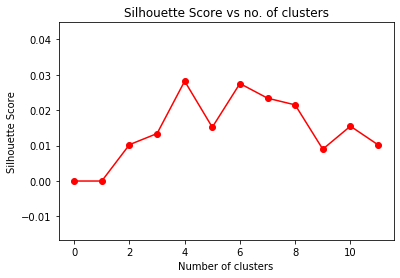

Optimal cluster number is  4

Number of Lines in Summarized text 
3

German economy rebounds

Germany's economy, the biggest among the 12 countries sharing the euro, grew at its fastest rate in four years during 2004, driven by strong exports. The economy contracted in 2003. "During 2004 we profited from the fact that the world economy was strong," said Stefan Schilbe, analyst at HSBC Trinkaus & Burkhardt.

Document  440

Number of Lines in Actual text
19
2

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 

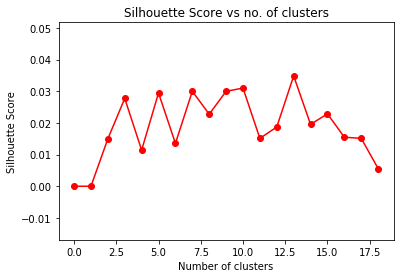

Optimal cluster number is  13

Number of Lines in Summarized text 
4

US trade deficit widens sharply

The gap between US exports and imports has widened to more than $60bn (Â£31.7bn), an all-time record. Figures from the Commerce Department for November showed exports down 2.3% to $95.6bn, while imports grew 1.3% to $155.8bn on rising consumer demand. In November, the fall in exports was largely due to a decline in sales of industrial supplies and materials such as chemicals, as well as of cars, consumer goods and food. Although China's overall trade surplus is expanding, according to Chinese government figures, the Commerce Department revealed the US's deficit with China was $19.6bn in November, down from $19.7bn the month before.

Document  441

Number of Lines in Actual text
18


C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 

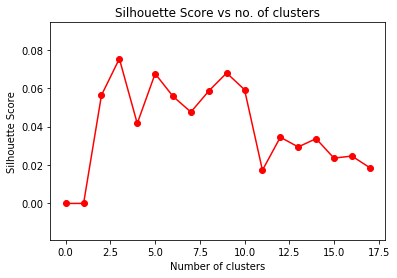

Optimal cluster number is  3

Number of Lines in Summarized text 
3

Trade gap narrows as exports rise

The UK's trade gap narrowed in November, helped by a 7.5% rise in exports outside the European Union. The export boost offset a 1% rise in imports. "There have been some very encouraging signs that the UK export recovery is starting to take hold.

Document  442

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 13 

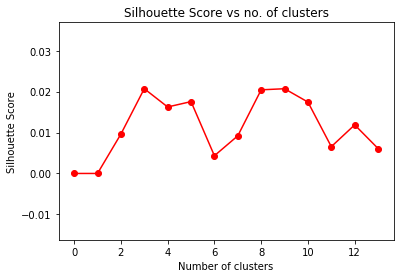

Optimal cluster number is  3

Number of Lines in Summarized text 
7

Lesotho textile workers lose jobs

Six foreign-owned textile factories have closed in Lesotho, leaving 6,650 garment workers jobless, union officers told the AP news agency. Factory Workers Union secretary general Billy Macaefa blamed the closures on the end of worldwide textile quotas. "We understand that some (owners)... were complaining that the South African rand was strong against the US dollar, and they were losing when exporting textiles and clothing to the United States," Mr Macaefa said at a news briefing in the capital, Maseru. He said the six factories were Leisure Garments, Modern Garments, Precious Six Garments, TW Garments, Lesotho Hats and Vogue Landmark. The owners - two from Taiwan, two from China, one from Mauritius and one from Malaysia - left over the December holiday period without informing or paying their employees, he said. In the mountainous country surrounded by South Africa, it is feared as 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


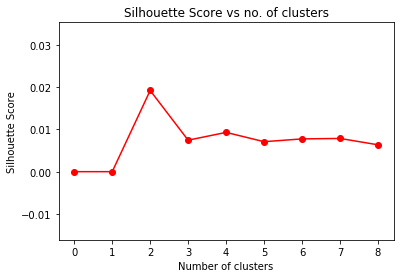

Optimal cluster number is  2

Number of Lines in Summarized text 
8

Kraft cuts snack ads for children

Kraft plans to cut back on advertising of products like Oreo cookies and sugary Kool-Aid drinks as part of an effort to promote healthy eating. The largest US food maker will also add a label to its more nutritional and low-fat brands to promote the benefits. Kraft rival PepsiCo began a similar labelling initiative last year. Major food manufacturers have recently been reformulating the content of some calorie-heavy products. Kraft's new advertising policy, which covers advertising on TV, radio and in print publications, is aimed at children between the ages of six and 11. It means commercials for some of its most famous snacks and cereals shown during early morning cartoon shows on TV will now be replaced by food and drink qualifying for Kraft's new "Sensible Solution" label. But the firm said it would continue to advertise all its products in media seen by parents and "all family" 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


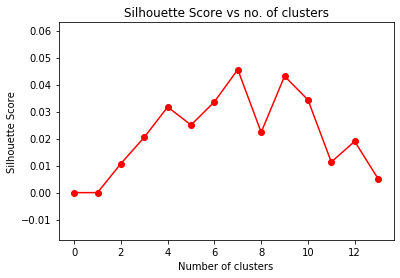

Optimal cluster number is  7

Number of Lines in Summarized text 
3

Khodorkovsky quits Yukos shares

Jailed tycoon Mikhail Khodorkovsky has transferred his controlling stake in oil giant Yukos to a business partner. Mr Khodorkovsky handed over his entire 59.5% stake in holding company Group Menatep - which controls Yukos - to Leonid Nevzlin. Mr Khodorkovsky handed over his stake after the forced sale of Yukos' core oil production unit, Yuganskneftegaz to pay a giant tax bill.

Document  445

Number of Lines in Actual text
18
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 15 16 17 

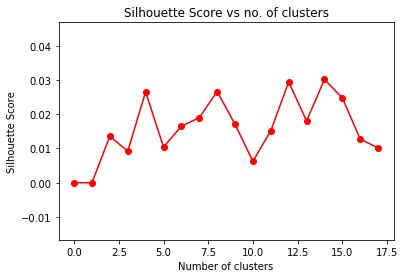

Optimal cluster number is  14

Number of Lines in Summarized text 
3

Executive trio leave Aer Lingus

Three senior executives of Ireland's state-owned airline, Aer Lingus, are set to leave early on 28 January after accusations of a conflict of interest. "There's absolutely no question of a conflict of interest. Last Friday the minister had announced he was to advertise for three senior executives for Aer Lingus.

Document  446

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 13 14 

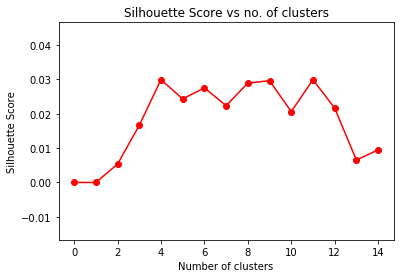

Optimal cluster number is  4

Number of Lines in Summarized text 
7

US in EU tariff chaos trade row

The US has asked the World Trade Organisation to investigate European Union customs tariffs, which it says are inconsistent and hamper trade. The EU's own institutions have noted the uneven way EU customs rules are applied but failed to act, the US Trade Representative's Office said. Explaining why it has asked the WTO to set up a dispute settlement panel on customs barriers, the US Trade Representative's Office said that it wants to tackle the issue "early in the EU's process of dealing with the problems of enlargement". "Although the EU is a customs union, there is no single EU customs administration," a statement issued on behalf of Robert Zoellick, US Trade Representative, said. "We think the US case is very weak. They haven't come up with any evidence that US companies are being harmed," said Anthony Gooch. It could take several months for the WTO's dispute settlement panel to rep

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 13 14 15 16 17 18 

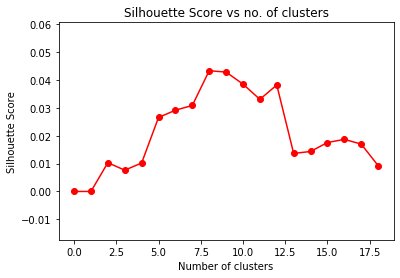

Optimal cluster number is  8

Number of Lines in Summarized text 
5

US Ahold suppliers face charges

US prosecutors have charged nine food suppliers with helping Dutch retailer Ahold inflate earnings by more than $800m (Â£428m). Three former Ahold top executives last year agreed to settle fraud charges. The nine now charged, who worked as suppliers to Ahold, are accused of signing false documents relating to the amount of money they paid the retailer for promoting their products in its stores. The suppliers in question are said to have inflated the amount of money they paid, providing auditors with signed letters that allowed Ahold to inflate its earnings. US Attorney David Kelley said he expects the nine vendors will plead guilty to the charges.

Document  449

Number of Lines in Actual text
20
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 13 14 15 16 17 18 19 

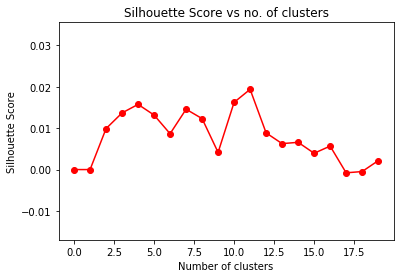

Optimal cluster number is  11

Number of Lines in Summarized text 
5

Wal-Mart fights back at accusers

Two big US names have launched advertising campaigns to "set the record straight" about their products and corporate behaviour. Meanwhile, drugs group Eli Lilly is planning a campaign against "false" claims about its product Prozac. Meanwhile Eli Lilly is launching a series of adverts in a dozen major newspapers, to present what is says are the true facts about its anti-depressant drug Prozac. "It was simply wrong to suggest that information on Prozac was missing, or that important research data on the benefits and possible side effects of the drug were not available to doctors and regulators," the letter added. Eli Lilly's chief medical officer Alan Breier said that the article was "false and misleading" as the documents it referred to were actually created by officials at the US Food and Drug Administration (FDA) and presented to an FDA meeting in 1991.

Document  450

Number of Li

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 15 16 17 18 

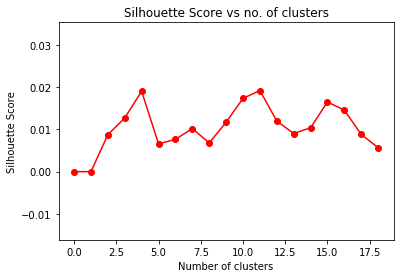

Optimal cluster number is  11

Number of Lines in Summarized text 
3

US retail sales surge in December

US retail sales ended the year on a high note with solid gains in December, boosted by strong car sales. The gains were led by a 4.3% jump in auto sales as dealers used enhanced offers to get cars out of showrooms. Retail sales are seen as a major part of consumer spending - which in turn makes up two-thirds of economic output in the US.

Document  451

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


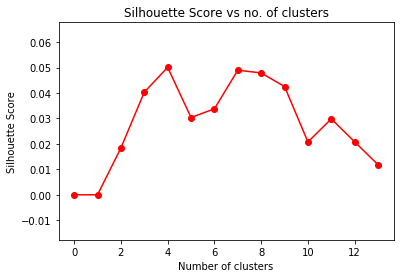

Optimal cluster number is  4

Number of Lines in Summarized text 
5

Winemaker rejects Foster's offer

Australian winemaker Southcorp has rejected a takeover offer worth 3.1bn Australian dollars ($2.3bn; Â£1.8bn) from brewing giant Foster's Group. Southcorp said Foster's A$4.17-a-share takeover proposal offered a "excellent strategic fit" but undervalued the company. "Southcorp's board has informed Foster's that it is not prepared to recommend the offer as it does not adequately reflect the strategic value of the company," said Southcorp chairman Brian Finn. Southcorp said Foster's takeover offer was "opportunistic". However, it said that the offer may represent an 'opening bid', opening up the possibility of Foster's returning with an improved offer.

Document  452

Number of Lines in Actual text
17
2 3 4

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 5 6 7 8 9 10 11 12 13 14 15 16 

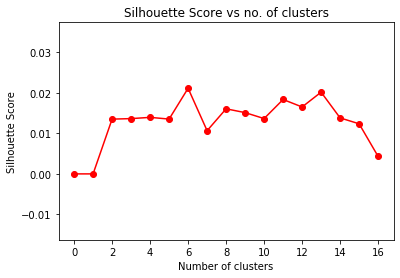

Optimal cluster number is  6

Number of Lines in Summarized text 
7

McDonald's boss Bell dies aged 44

Charlie Bell, the straight-talking former head of fast-food giant McDonald's, has died of cancer aged 44. Joining the company as a 15-year-old part-time worker, Mr Bell quickly moved through its ranks, becoming Australia's youngest store manager at 19. A popular go-getter, he is credited with helping revive McDonald's sales. After running the company's Australian business in the 1990s, Mr Bell moved to the US in 1999 to run operations in Asia, Africa and the Middle East. In 2001, he took over the reins in Europe, McDonald's second most important market. Mr Bell took over as chief executive after his predecessor as CEO, Jim Cantalupo, died suddenly of a heart attack in April. Having worked closely with Mr Cantalupo, who came out of retirement to turn McDonald's around, Mr Bell focused on boosting demand at existing restaurants rather than follow a policy of rapid expansion.

Document 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


11 12 13 

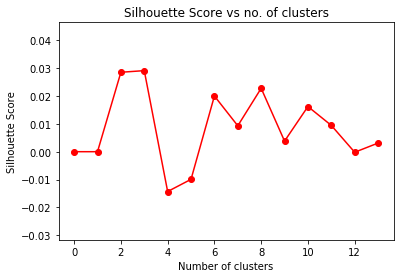

Optimal cluster number is  3

Number of Lines in Summarized text 
3

US industrial output growth eases

US industrial production continued to rise in November, albeit at a slower pace than the previous month. Many analysts were upbeat about the prospects for the US economy, with the increase in production coming on the heels of news of a recovery in retail sales. The US economy grew at a respectable annual rate of 3.7% in the three months between July and September, while jobs growth averaged 178,000 during the same period.

Document  454

Number of Lines in Actual text
22
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


14 15 16 17 18 19 20 21 

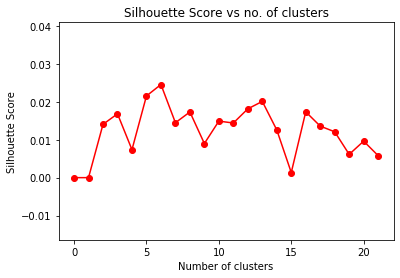

Optimal cluster number is  6

Number of Lines in Summarized text 
5

LSE doubts boost bidders' shares

Shares in Deutsche Boerse have risen more than 3% after a shareholder fund voiced opposition to the firm's planned takeover of the London Stock Exchange. "If that cannot be achieved, then we would wish for a distribution of liquid assets to shareholders." The Financial Times also reported a third Deutsche Boerse shareholder as opposed to the deal. Yet under German business law, DB does not have to gain shareholder approval before making a significant acquisition. "Deutsche Boerse is convinced that its contemplated cash acquisition of the London Stock Exchange is in the best interests of its shareholders and the company," it said.

Document  455

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 15 16 

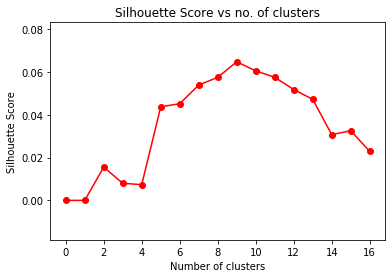

Optimal cluster number is  9

Number of Lines in Summarized text 
3

Qantas considers offshore option

Australian airline Qantas could transfer as many as 7,000 jobs out of its home country as it seeks to save costs, according to newspaper reports. More than 90% of the airline's staff are based in Australia. If Qantas were to follow the lead of other airlines moving staff 'offshore' 7,000 jobs could shift overseas, the newspaper reported.

Document  456

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


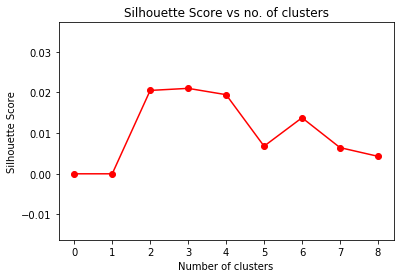

Optimal cluster number is  3

Number of Lines in Summarized text 
4

Gazprom 'in $36m back-tax claim'

The nuclear unit of Russian energy giant Gazprom is reportedly facing a 1bn rouble ($35.7m; Â£19.1m) back-tax claim for the 2001-2003 period. Vedomosti newspaper reported that Russian authorities made the demand at the end of last year. Gazprom is one of the key players in the complex Russian energy market, where the government of Vladimir Putin has made moves to regain state influence over the sector. Some analysts fear the Kremlin will continue to use these sort of moves to boost the efforts of the state to regain control over strategically important sectors such as oil.

Document  457

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


15 16 

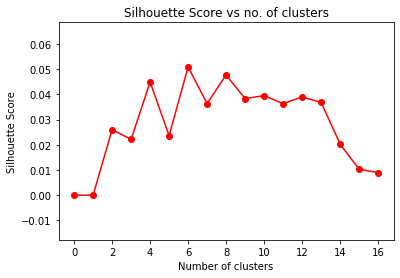

Optimal cluster number is  6

Number of Lines in Summarized text 
2

Germany calls for EU reform

German Chancellor Gerhard Schroeder has called for radical reform of the EU's stability pact to grant countries more flexibility over their budget deficits. Mr Schroeder also called for heads of government to play a larger role in shaping reforms to the pact.

Document  458

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


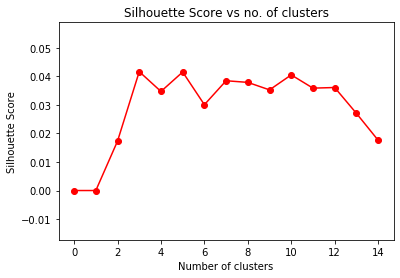

Optimal cluster number is  3

Number of Lines in Summarized text 
8

Parmalat founder offers apology

The founder and former boss of Parmalat has apologised to investors who lost money as a result of the Italian dairy firm's collapse. Parmalat was placed into bankruptcy protection in 2003 after a 14bn euro black hole was found in its accounts. More than 130,000 people lost money following the firm's collapse. Two former Parmalat auditors will stand trial later this month for their role in the firm's collapse. Mr Tanzi spent several months in jail in the wake of Parmalat's collapse and was kept under house arrest until last September. Parmalat is now being run by a state appointed administrator, Enrico Bondi, who has launched lawsuits against 80 banks in an effort to recover money for the bankrupt company and its shareholders. Parmalat was declared insolvent after it emerged that 4 billion euros (Â£2.8bn; $4.8bn) it supposedly held in an offshore account did not in fact exist. The firm'

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


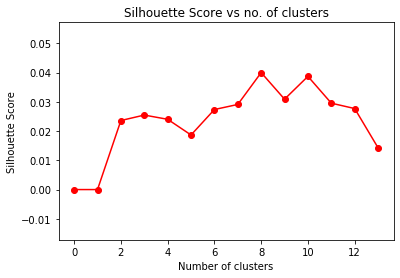

Optimal cluster number is  8

Number of Lines in Summarized text 
3

'Golden economic period' to end

Ten years of "golden" economic performance may come to an end in 2005 with growth slowing markedly, City consultancy Deloitte has warned. In its quarterly economic review, Deloitte said the UK economy had enjoyed a "golden period" during the past decade with unemployment falling to a near 30 year low and inflation at its lowest since the 1960s. "Although 2005 may not be the year when things go completely wrong, it will probably mark the start of a more difficult period for the UK economy," Mr Bootle.

Document  460

Number of Lines in Actual text
18
2 3 4 5 6 7 8 9 10 11 12 13 14 15 16

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 17 

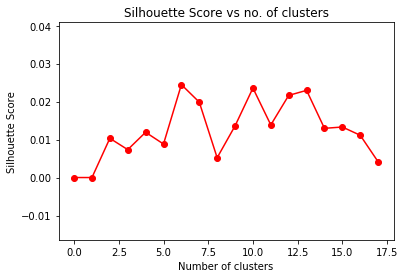

Optimal cluster number is  6

Number of Lines in Summarized text 
4

Jobs go at Oracle after takeover

Oracle has announced it is cutting about 5,000 jobs following the completion of its $10.3bn takeover of its smaller rival Peoplesoft last week. Oracle's 18-month fight to acquire Peoplesoft was one of the most drawn-out and hard-fought US takeover battles of recent times. Correspondents say 6,000 job losses had been expected - and some suggest more cuts may be announced in future. They say Mr Ellison may be trying to placate Peoplesoft customers riled by Oracle's determined takeover strategy.

Document  461

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


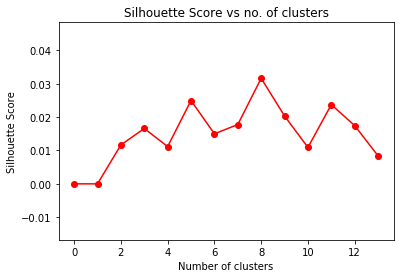

Optimal cluster number is  8

Number of Lines in Summarized text 
2

Beijingers fume over parking fees

Choking traffic jams in Beijing are prompting officials to look at reorganising car parking charges. Mr Wang, who is in charge of collecting car parking fees, said his team would be looking at adjusting parking prices to close the gap.

Document  462

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


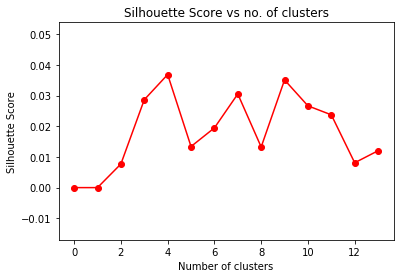

Optimal cluster number is  4

Number of Lines in Summarized text 
4

GM issues 2005 profits warning

General Motors has warned that it expects earnings this year be lower than in 2004. GM said higher healthcare costs in North America, and lower profits at its financial services subsidiary would hurt its performance in 2005. The car maker has diversified into financial services, and is extending the reach of General Motors Acceptance Corp (GMAC), which has said it may enter the home loans market. GMAC has been a strong contributor to profits in 2004 but GM said it will do less well this year, delivering net income of $2.5bn.

Document  463

Number of Lines in Actual text
8
2 3 4 5 6 7 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


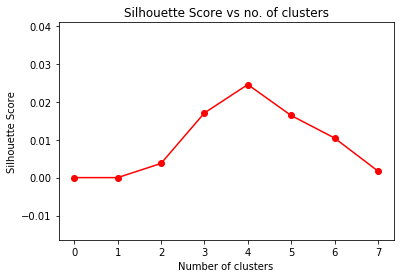

Optimal cluster number is  4

Number of Lines in Summarized text 
2

US economy still growing says Fed

Most areas of the US saw their economy continue to expand in December and early January, the US Federal Reserve said in its latest Beige Book report. The employment picture also improved, the Fed said.

Document  464

Number of Lines in Actual text
12
2 3 4 5

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 6 7 8 9 10 11 

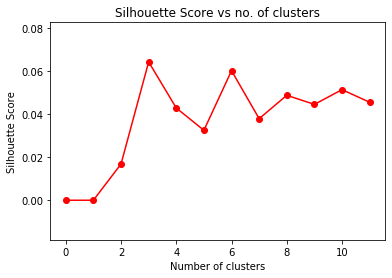

Optimal cluster number is  3

Number of Lines in Summarized text 
7

Wall Street cool to eBay's profit

Shares in online auction house eBay fell 9.8% in after-hours trade on Wednesday, after its quarterly profits failed to meet market expectations. EBay stock fell to $92.9 in after-hours trade, from a $103.05 end on Nasdaq. Excluding special items, eBay's profit was 33 cents a share, but analysts had expected 34 cents. For 2004 as a whole, eBay earned $778.2m on sales of $3.27bn. EBay president and chief executive Meg Whitman called 2004 an "outstanding success" that generated "tremendous momentum" for 2005. EBay now forecasts 2005 revenue of $4.2bn to $4.35bn and earnings excluding items of $1.48 to $1.52 per share. Analysts had previously estimated that eBay would achieve 2005 revenues of $4.37bn and earnings of $1.62 per share, excluding items.

Document  465

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


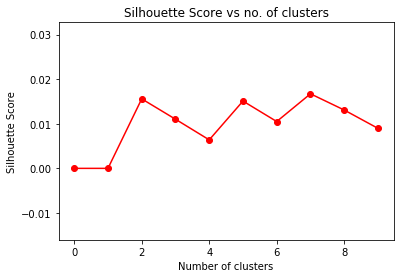

Optimal cluster number is  7

Number of Lines in Summarized text 
2

WorldCom trial starts in New York

The trial of Bernie Ebbers, former chief executive of bankrupt US phone company WorldCom, has started in New York with the selection of the jury. Mr Ebbers' trial, which is expected to last two months, is the latest in a series of attempts by US prosecutors to pursue senior executives for fraud.

Document  466

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


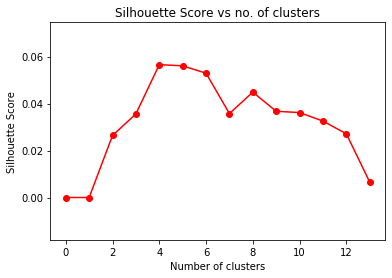

Optimal cluster number is  4

Number of Lines in Summarized text 
3

High fuel costs hit US airlines

Two of the largest airlines in the US - American and Southwest - have blamed record fuel prices for their disappointing quarterly results. Southwest, which has the highest market value of any US carrier, said it would remain profitable despite high fuel prices. Both American and Southwest have been squeezed by cut-throat competition in the US airline industry, as a glut of available seats has led to fierce price reductions.

Document  467

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


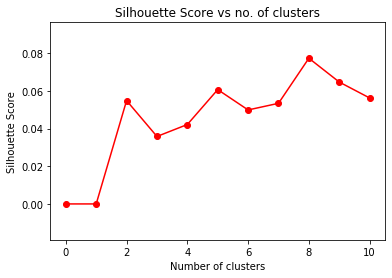

Optimal cluster number is  8

Number of Lines in Summarized text 
1

European losses hit GM's profits

General Motors (GM) saw its net profits fall 37% in the last quarter of 2004, as it continued to be hit by losses at its European operations.

Document  468

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12 13 14 15 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


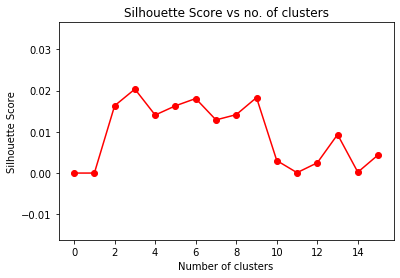

Optimal cluster number is  3

Number of Lines in Summarized text 
8

EU to probe Alitalia 'state aid'

The European Commission has officially launched an in-depth investigation into whether Italian airline Alitalia is receiving illegal state aid. Both the Italian government and Alitalia have repeatedly denied that the money - part of a vital restructuring plan - is state aid. The investigation could take up to 18 months. "We now have to verify certain aspects to confirm that this plan contains no state aid. The matter of possible state aid was brought to the Commission's attention by eight of Alitalia's rivals, including Germany's Lufthansa, British Airways and Spain's Iberia. While Alitalia needs to restructure to bring itself back to profitability, the rival carriers say it has both violated state aid rules and threatened competition. Alitalia already enjoyed state aid in 1997. Otherwise, EU regulations on state aid stipulate that governments may help companies financially, but only 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


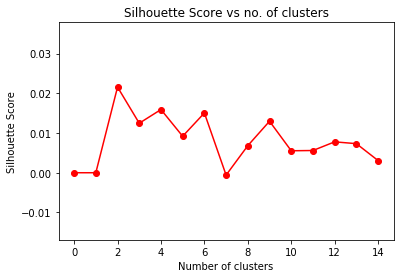

Optimal cluster number is  2

Number of Lines in Summarized text 
7

IMF agrees fresh Turkey funding

Turkey has agreed a draft proposal with the International Monetary Fund to borrow $10bn (Â£5.19bn), extending its ongoing financial support until 2007. Turkey's current $18.6bn loan agreement with the IMF expires in February and the new deal would see it receive added support between 2005 and 2007. Turkey's economy has steadily recovered from a severe crisis in 2001. However, Turkey has a huge debt burden - already owing $23bn to the IMF - while its current account deficit has swelled to $10.7bn this year. Rodrigo de Rato, the IMF's managing director, said the loan agreement would help to improve Turkish economic prospects by cutting its debt and stimulating growth. "I believe the new programme, if implemented successfully, will help Turkey create the conditions for sustained growth and employment creation, reduce inflation toward European level and enhance the economy's resilience," h

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


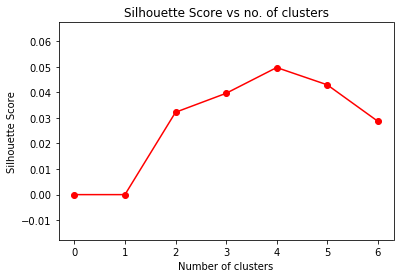

Optimal cluster number is  4

Number of Lines in Summarized text 
2

Saudi investor picks up the Savoy

London's famous Savoy hotel has been sold to a group combining Saudi billionaire investor Prince Alwaleed bin Talal and a unit of HBOS bank. Prince Alwaleed's hotel investments include the luxury George V in Paris.

Document  471

Number of Lines in Actual text
25
2 3 4 5 6 7 8 9 10 11 12 13 14 15 16

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 17 18 19 20 21 22 23 24 

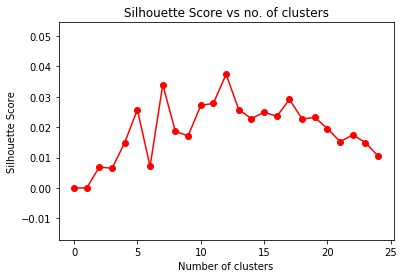

Optimal cluster number is  12

Number of Lines in Summarized text 
3

Tsunami slows Sri Lanka's growth

Sri Lanka's president has launched a reconstruction drive worth $3.5bn (Â£1.8bn) by appealing for peace and national unity. Meanwhile, the International Monetary Fund (IMF) said damage from the tsunami would cut one percentage point from Sri Lanka's economic growth this year. Last week, the IMF approved Sri Lanka's request for a freeze on loan repayments.

Document  472

Number of Lines in Actual text
23
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 15 16 17 18 19 20 21 22 

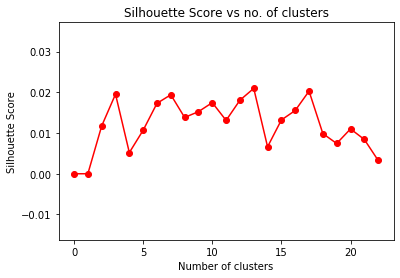

Optimal cluster number is  13

Number of Lines in Summarized text 
2

China suspends 26 power projects

China has ordered a halt to construction work on 26 big power stations, including two at the Three Gorges Dam, on environmental grounds. The Three Gorges Dam has proved controversial in China - where more than half a million people have been relocated to make way for it - and abroad.

Document  473

Number of Lines in Actual text
7
2 3 4 5 6 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


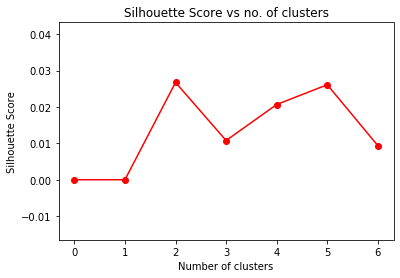

Optimal cluster number is  2

Number of Lines in Summarized text 
4

Two Nigerian banks set to merge

Nigerian banks United Bank of Africa and Standard Trust Bank have agreed plans to merge and create the biggest bank in West Africa. The deal is also in line with a 2004 directive from the Nigerian central bank that called for more consolidation in the nation's crowded banking sector. United Bank is the third biggest in Nigeria in terms of number of branches. "The boards of United Bank and Standard Trust, at separate meetings yesterday, approved arrangements to merge both institutions," Standard Trust said.

Document  474

Number of Lines in Actual text
11
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


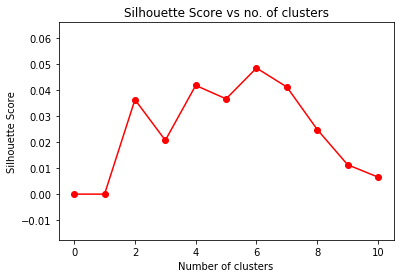

Optimal cluster number is  6

Number of Lines in Summarized text 
3

Virgin Blue shares plummet 20%

Shares in Australian budget airline Virgin Blue plunged 20% after it warned of a steep fall in full year profits. Virgin Blue reported a 22% fall in first quarter profits in August 2004 due to tough competition. Virgin Blue was launched four years ago and now has roughly one third of Australia's domestic airline market.

Document  475

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 

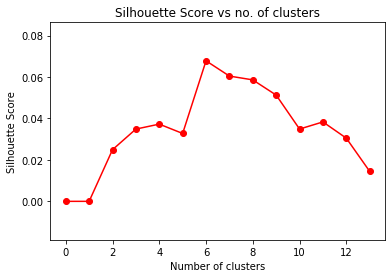

Optimal cluster number is  6

Number of Lines in Summarized text 
4

Watchdog probes Vivendi bond sale

French stock market regulator AMF has filed complaints against media giant Vivendi Universal, its boss and another top executive. AMF has begun proceedings against Vivendi, its chief executive Jean-Rene Fourtou and chief operating officer Jean-Bernard Levy. Back in December, Vivendi and its former chief executive Jean-Marie Messier were each fined 1m euros ($1.3m; Â£690,000) by AMF. The fines came after a 15-month probe into allegations that the media giant misled investors after a costly acquisition programme went wrong.

Document  476

Number of Lines in Actual text
12
2 3 4 5 6 7 8

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 9 10 11 

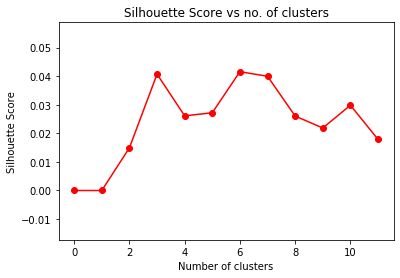

Optimal cluster number is  6

Number of Lines in Summarized text 
4

Saudi NCCI's shares soar

Shares in Saudi Arabia's National Company for Cooperative Insurance (NCCI) soared on their first day of trading in Riyadh. Previously, only NCCI has been legally allowed to offer insurance products within Saudi Arabia. Saudi Arabia now wants a fully functioning insurance industry and is introducing legislation that will clamp down on unauthorised companies. Saudi Arabia sold 7 million NCCI shares, or about 70% of the company's total capital last month.

Document  477

Number of Lines in Actual text
12
2

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 3 4 5 6 7 8 9 10 11 

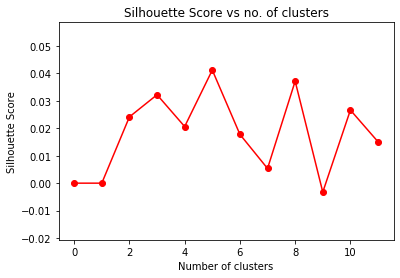

Optimal cluster number is  5

Number of Lines in Summarized text 
3

JP Morgan admits US slavery links

Thousands of slaves were accepted as collateral for loans by two banks that later became part of JP Morgan Chase. The admission is part of an apology sent to JP Morgan staff after the bank researched its links to slavery in order to meet legislation in Chicago. About 13,000 slaves were used as loan collateral between 1831 and 1865.

Document  478

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


12 

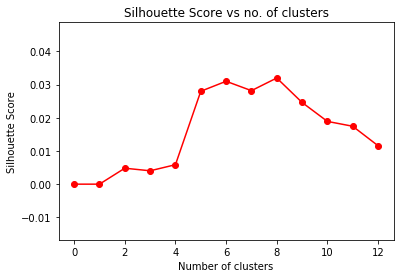

Optimal cluster number is  8

Number of Lines in Summarized text 
2

Egypt and Israel seal trade deal

In a sign of a thaw in relations between Egypt and Israel, the two countries have signed a trade protocol with the US, allowing Egyptian goods made in partnership with Israeli firms free access to American markets. Products from these zones will enjoy duty free access to the US, provided that 35% of their components are the product of Israeli-Egyptian cooperation.

Document  479

Number of Lines in Actual text
18
2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


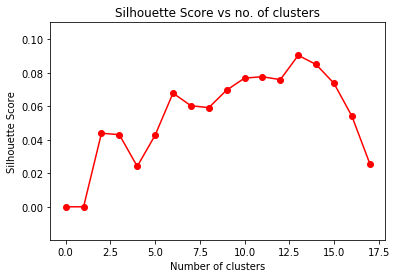

Optimal cluster number is  13

Number of Lines in Summarized text 
3

Ford gains from finance not cars

Ford, the US car company, reported higher fourth quarter and full-year profits on Thursday boosted by a buoyant period for its car loans unit. But its auto unit made a loss. Though car and truck loan profits saved the day, Ford's auto unit made a pre-tax loss of $470m in the fourth quarter (compared to a profit of Â£13m in the year-ago period) and its US sales dipped 3.8%.

Document  480

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


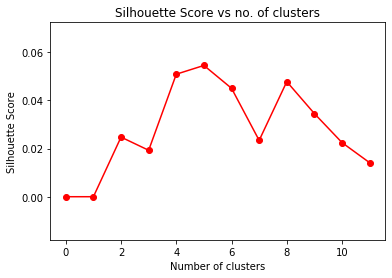

Optimal cluster number is  5

Number of Lines in Summarized text 
4

Wipro beats forecasts once again

Wipro, India's third-biggest software firm, has reported a 60% rise in profit, topping market expectations. Net income in the last quarter was 4.3bn rupees ($98m; Â£52m), against 2.7bn a year earlier. Profit had been forecast to be 4.1bn rupees. Third-quarter sales rose 34% to 20.9bn rupees.

Document  481

Number of Lines in Actual text
17
2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


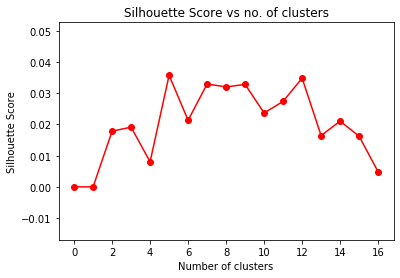

Optimal cluster number is  5

Number of Lines in Summarized text 
8

Christmas sales worst since 1981

UK retail sales fell in December, failing to meet expectations and making it by some counts the worst Christmas since 1981. Retail sales dropped by 1% on the month in December, after a 0.6% rise in November, the Office for National Statistics (ONS) said. The ONS revised the annual 2004 rate of growth down from the 5.9% estimated in November to 3.2%. The last time retailers endured a tougher Christmas was 23 years previously, when sales plunged 1.7%. The November-December jump last year was roughly comparable with recent averages, although some way below the serious booms seen in the 1990s. Morrisons, Woolworths, House of Fraser, Marks & Spencer and Big Food all said that the festive period was disappointing. And a British Retail Consortium survey found that Christmas 2004 was the worst for 10 years. Yet, other retailers - including HMV, Monsoon, Jessops, Body Shop and Tesco - reported

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


15 16 17 18 19 20 

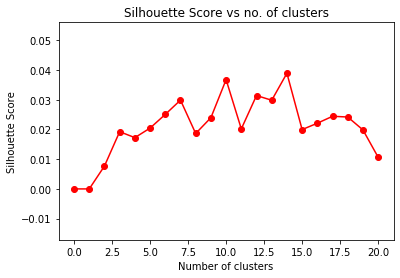

Optimal cluster number is  14

Number of Lines in Summarized text 
5

Businesses fail to plan for HIV

Companies fail to draw up plans to cope with HIV/Aids until it affects 20% of people in a country, new research says. Most (71%) have no policies in place to address the disease. One company that does have a plan is Anglo-American, the international mining company, which estimates an HIV prevalence of 24% among its 130,000-strong Southern African workforce. Across sub-Saharan Africa, even in countries with an HIV prevalence of 10-19%, only around 7% of companies have formal HIV/Aids policies in place, according to the report. The gap is even wider in China, Ethiopia, India, Nigeria and Russia, the so-called "next wave" countries, which are predicted to experience the highest numbers of new HIV/Aids cases worldwide by 2010.

Document  483

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


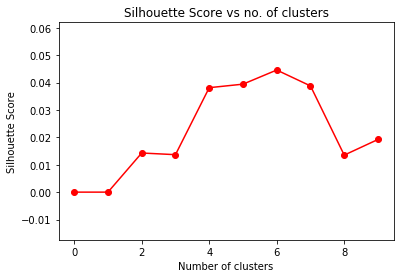

Optimal cluster number is  6

Number of Lines in Summarized text 
2

Ailing EuroDisney vows turnaround

EuroDisney, the European home of Mickey Mouse and friends, has said it will sell 253m euros (Â£175m; $328m) of new shares as it looks to avoid insolvency. EuroDisney will sell the new shares priced at 9 euros cents each.

Document  484

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


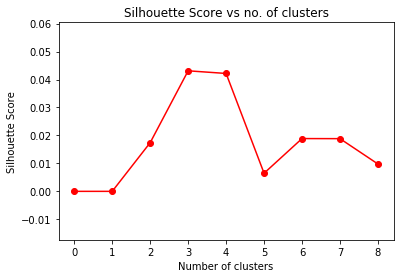

Optimal cluster number is  3

Number of Lines in Summarized text 
3

UK young top Euro earnings league

British children enjoy the highest average annual income in Europe - more than double that of Spanish or Italian youngsters, a report suggests. Children in the UK between the ages of 10 and 17 had an annual income of Â£775, said market analyst Datamonitor. And the good times are likely to keep rolling for British children, as the report predicts that they will still be topping the earnings table in 2008.

Document  485

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


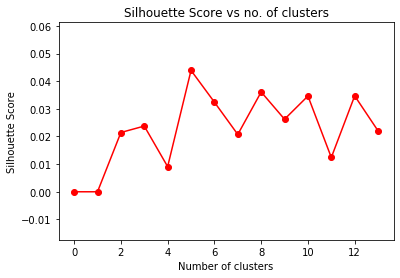

Optimal cluster number is  5

Number of Lines in Summarized text 
6

Swiss cement firm in buying spree

Swiss cement firm Holcim has bid $800m (Â£429m) to buy two Indian cement firms and a holding company in the country. It plans to buy Associated Cement Companies (ACC), Ambuja Cement Eastern and the holding firm, Ambuja Cement India Ltd, a Holcim statement said. Meanwhile, UK-based firm Aggregate Industries said it had agreed a Â£1.8bn takeover by Holcim. The Markfield, Leicestershire-based company runs 142 quarries in the UK and the US. It also has 164 ready-mixed concrete plants, 90 asphalt plants and 32 pre-cast concrete factories. "Holcim is looking to buy it (ACC) very cheap," said KK Mittal, a fund manager with Escorts Mutual Fund in New Delhi.

Document  486

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


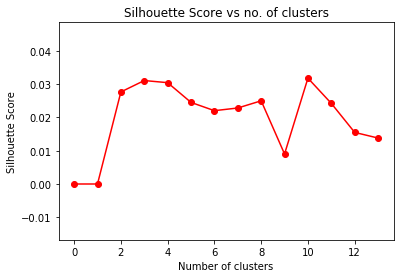

Optimal cluster number is  10

Number of Lines in Summarized text 
4

India's Reliance family feud heats up

The ongoing public spat between the two heirs of India's biggest conglomerate, Reliance Group, has spilled over to the board meeting of a leading company within the group. The IPCL board met in Mumbai to discuss the company's results for the October-to-December quarter. On Wednesday, the board of Reliance Energy, another Reliance Group company, reaffirmed its faith in Anil, who is the company's chief. Meanwhile, the group's flagship company, Reliance Industries, has its board meeting on Friday to consider its financial results.

Document  487

Number of Lines in Actual text
31
2 3 4 5 6 7 8 9 10 11 12 13 14

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 

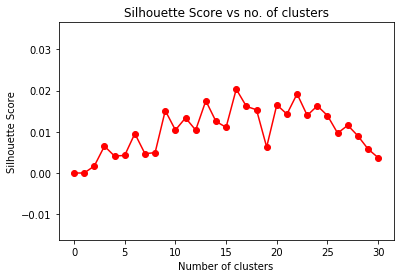

Optimal cluster number is  16

Number of Lines in Summarized text 
3

World leaders gather to face uncertainty

More than 2,000 business and political leaders from around the globe are arriving in the Swiss mountain resort Davos for the annual World Economic Forum (WEF). But much of the media focus will be on the political leaders coming to Davos, not least because the agenda of this year's forum seems to lack an overarching theme. Microsoft founder Bill Gates, the world's richest man and a regular at Davos, will focus on campaigning for good causes, though business interests will not be wholly absent either.

Document  488

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 12 13 14 

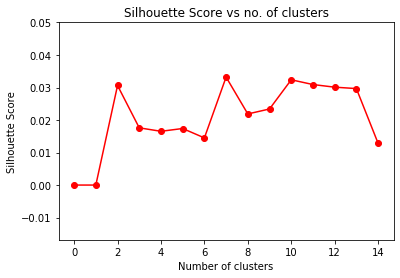

Optimal cluster number is  7

Number of Lines in Summarized text 
3

US budget deficit to reach $368bn

The US budget deficit is set to hit a worse-than-expected $368bn (Â£197bn) this year, officials said on Tuesday. In recent months, the dollar has weakened amid market jitters about the size of the budget and trade deficits. The budget deficit hit a record $412bn in the 12 months to 30 September 2004, after reaching $377bn in the previous fiscal year.

Document  489

Number of Lines in Actual text
15
2 3 4 5

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 6 7 8 9 10 11 12 13 14 

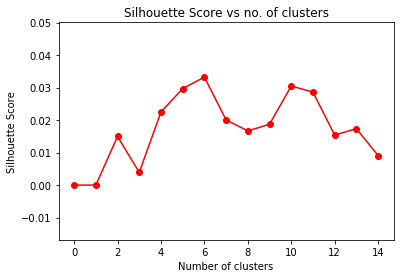

Optimal cluster number is  6

Number of Lines in Summarized text 
5

Criminal probe on Citigroup deals

Traders at US banking giant Citigroup are facing a criminal investigation in Germany over a controversial bond deal. However, under German criminal law, prosecutors cannot pursue Citigroup itself. "It is now a criminal investigation." Regulatory investigations are still going on in France, the UK and elsewhere. Its private banking operation in Japan was closed down by regulators in Tokyo after an "aggressive sales culture" led the bank to flout anti-money laundering rules.

Document  490

Number of Lines in Actual text
14
2 3 4 5 6 7 8 9 10 11 12 13 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


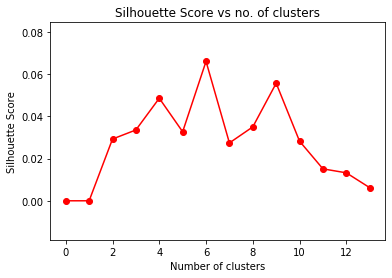

Optimal cluster number is  6

Number of Lines in Summarized text 
7

Brazil jobless rate hits new low

Brazil's unemployment rate fell to its lowest level in three years in December, according to the government. The Brazilian Institute for Geography and Statistics (IBGE) said it fell to 9.6% in December from 10.6% in November and 10.9% in December 2003. IBGE also said that average monthly salaries grew 1.9% in December 2004 from December 2003. However, average monthly wages fell 1.8% in December to 895.4 reais ($332; Â£179.3) from November. The unemployment rate has been falling gradually since April 2004 when it reached a peak of 13.1%. The jobless rate average for the whole of 2004 was 11.5%, down from 12.3% in 2003, the IBGE said. Nevertheless, some analysts say that unemployment could increase in the next months.

Document  491

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 14 

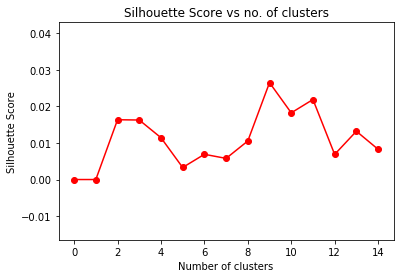

Optimal cluster number is  9

Number of Lines in Summarized text 
3

Indonesia 'declines debt freeze'

Indonesia no longer needs the debt freeze offered by the Paris Club group of creditors, Economics Minister Aburizal Bakrie has reportedly said. Nevertheless, one of Mr Bakrie's deputies, Mahendra Siregar, told AFP news agency that Indonesia was still considering the offer by the Paris Club of rich creditor nations to temporarily suspend its debt payments. That's how far we are at this stage," said Mr Siregar.

Document  492

Number of Lines in Actual text
7
2 3 4 5 6 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


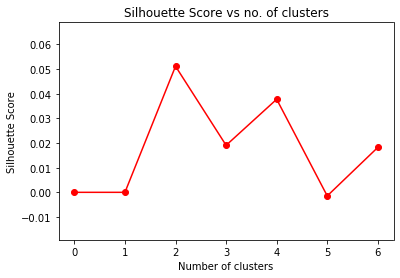

Optimal cluster number is  2

Number of Lines in Summarized text 
3

Parmalat bank barred from suing

Bank of America has been banned from suing Parmalat, the food group which went bust in 2003 after an accounting scandal. But a judge has barred Bank of America and two auditors from the case. A second auditor, Deloitte & Touche, has also been banned from the case.

Document  493

Number of Lines in Actual text
18
Number of Lines in Summarized text 
1
China continues rapid growth

China's economy has expanded by a breakneck 9.5% during 2004, faster than predicted and well above 2003's 9.1%.
Document  494

Number of Lines in Actual text
23
Number of Lines in Summarized text 
0

Document  495

Number of Lines in Actual text
23
2 3 4 5 6 7 8 9 10 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


11 12 13 14 15 16 17 18 19 20 21 22 

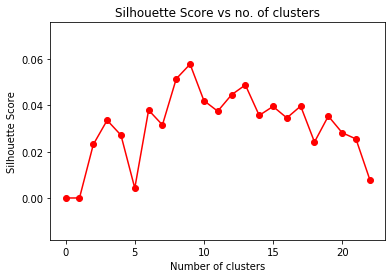

Optimal cluster number is  9

Number of Lines in Summarized text 
3

BBC poll indicates economic gloom

Citizens in a majority of nations surveyed in a BBC World Service poll believe the world economy is worsening. Those surveyed in three countries were split. The margin of error is between 2.5 and 4 points, depending on the country.

Document  496

Number of Lines in Actual text
9
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


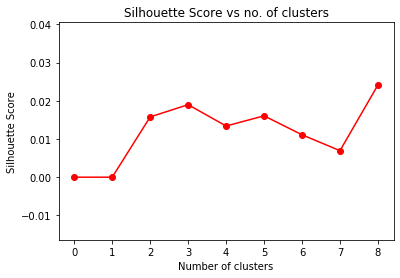

Optimal cluster number is  8

Number of Lines in Summarized text 
2

Europe asks Asia for euro help

European leaders say Asian states must let their currencies rise against the US dollar to ease pressure on the euro. But now Europe says the euro has had enough, and Asia must now share some of the burden.

Document  497

Number of Lines in Actual text
16
2 3 4 5 6 7 8 9 10 11 12 13 14

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 15 

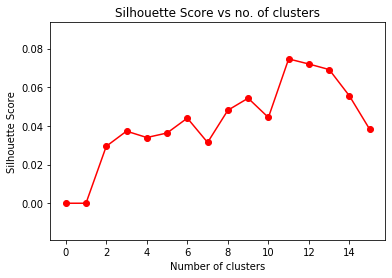

Optimal cluster number is  11

Number of Lines in Summarized text 
1

FBI agent colludes with analyst

A former FBI agent and an internet stock picker have been found guilty of using confidential US government information to manipulate stock prices.

Document  498

Number of Lines in Actual text
24
2 3 4 5 6 7 8 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 

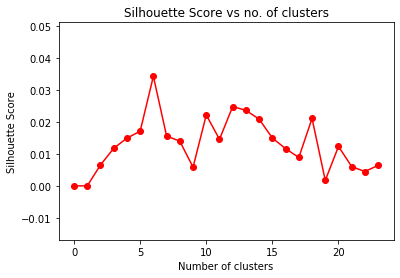

Optimal cluster number is  6

Number of Lines in Summarized text 
9

Millions go missing at China bank

Two senior officials at one of China's top commercial banks have reportedly disappeared after funds worth up to $120m (Â£64m) went missing. The pair both worked at Bank of China in the northern city of Harbin, the South China Morning Post reported. The latest scandal at Bank of China will do nothing to reassure foreign investors that China's big four banks are ready for international listings. The other is China Construction Bank. They shared a $45bn state bailout in 2003, to help clean up their balance sheets in preparation for a foreign stock market debut. Bank of China is the country's biggest foreign exchange dealer, while China Construction Bank is the largest deposit holder. China's banking sector is burdened with at least $190bn of bad debt according to official data, though most observers believe the true figure is far higher. China's leaders see reforming the top four banks 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


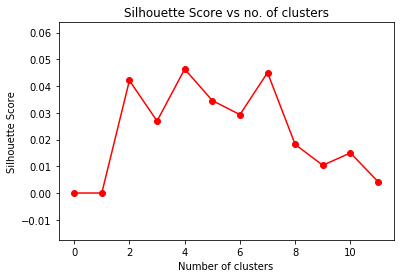

Optimal cluster number is  4

Number of Lines in Summarized text 
5

China Aviation seeks rescue deal

Scandal-hit jet fuel supplier China Aviation Oil has offered to repay its creditors $220m (Â£117m) of the $550m it lost on trading in oil futures. The firm said it hoped to pay $100m now and another $120m over eight years. With assets of $200m and liabilities totalling $648m, it needs creditors' backing for the offer to avoid going into bankruptcy. The firm had been betting heavily on a fall in the price of oil during October, but prices rose sharply instead. Of the immediate payment, the firm - China's biggest jet fuel supplier - said it would be paying $30m out of its own resources.

Document  500

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 11 

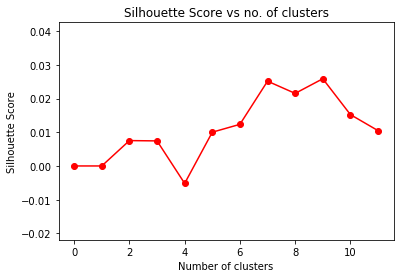

Optimal cluster number is  9

Number of Lines in Summarized text 
1

Low-cost airlines hit Eurotunnel

Channel Tunnel operator Eurotunnel has seen sales fall in the face of the upsurge in European low-cost airlines.

Document  501

Number of Lines in Actual text
26
2 3 4 5

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 

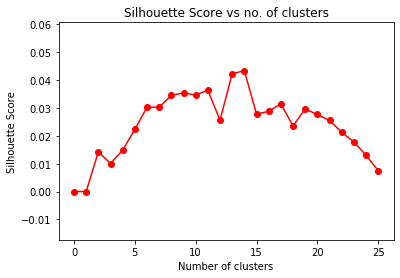

Optimal cluster number is  14

Number of Lines in Summarized text 
1

Water firm Suez in Argentina row

A conflict between the Argentine State and water firm Aguas Argentinas, controlled by France's Suez, is casting doubt on the firm's future.

Document  502

Number of Lines in Actual text
10


C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


2 3 4 5 6 7 8 9 

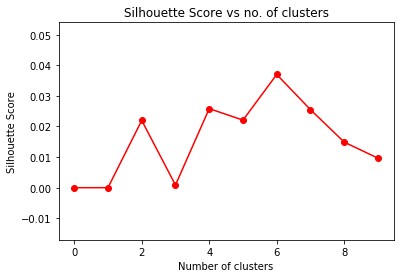

Optimal cluster number is  6

Number of Lines in Summarized text 
2

Algeria hit by further gas riots

Algeria suffered a weekend of violent protests against government plans to raise gas prices, local press reports. According to local press reports, trouble flared up again on Saturday and carried on into Sunday.

Document  503

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


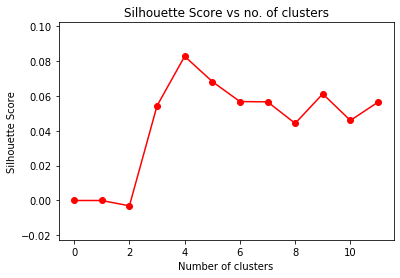

Optimal cluster number is  4

Number of Lines in Summarized text 
3

India's Maruti sees profits jump

India's biggest carmaker Maruti has reported a sharp increase in quarterly profit after a booming economy and low interest rates boosted demand. Sales in the fiscal third quarter, including vans and utility vehicles, rose by 17.8% to 136.069 units. Utility vehicle and tractor maker Mahindra has reported a 52% rise in net profit during the last three months of 2004.

Document  504

Number of Lines in Actual text
18
2 3 4 5 6 7 8 9 10 11 12 13 14 15 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


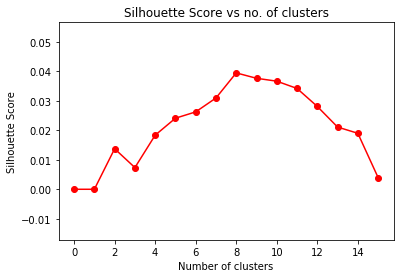

Optimal cluster number is  8

Number of Lines in Summarized text 
3

Aids and climate top Davos agenda

Climate change and the fight against Aids are leading the list of concerns for the first day of the World Economic Forum in the Swiss resort of Davos. Showbiz figures will also put in an appearance, from U2 frontman Bono - a well-known campaigner on trade and development issues - to Angelina Jolie, a goodwill campaigner for the UN on refugees. In contrast, the Davos forum is dominated by business issues - from outsourcing to corporate leadership - with bosses of more than a fifth of the world's 500 largest companies scheduled to attend.

Document  505

Number of Lines in Actual text
13
2 3 4 5 6 7 8 9

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


 10 11 12 

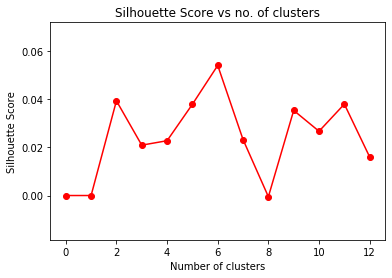

Optimal cluster number is  6

Number of Lines in Summarized text 
5

China now top trader with Japan

China overtook the US to become Japan's biggest trading partner in 2004, according to numbers released by Japan's Finance Ministry on Wednesday. China accounted for 20.1% of Japan's trade in 2004, compared with 18.6% for the US. In 2003, the US was ahead with 20.5% and China came second with 19.2%. The change highlights China's growing importance as an economic powerhouse. On Tuesday, figures showed China's economy grew by 9.5% in 2004 and experts say the overall growth picture remains strong.

Document  506

Number of Lines in Actual text
12
2 3 4 5 6 7 8 9 10 11 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


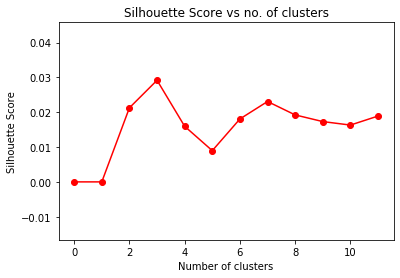

Optimal cluster number is  3

Number of Lines in Summarized text 
5

Trial begins of Spain's top banker

The trial of Emilio Botin, the chairman of Spain's most powerful bank, Santander Central Hispano, has started in Madrid. Both executives helped Mr Botin orchestrate Spain's biggest bank merger, between Santander and Banco Central Hispano, in 1999. As he arrived at Spain's High Court earlier on Wednesday, Mr Botin greeted the waiting media, saying: "I have full faith in justice." Santander's board of governors strongly reject the charges against their chairman, saying the payouts were legal and made with their unanimous support. Mr Corcostegui, a former CEO at Santander, also asked the court for new evidence to be admitted.

Document  507

Number of Lines in Actual text
20
2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


18 19 

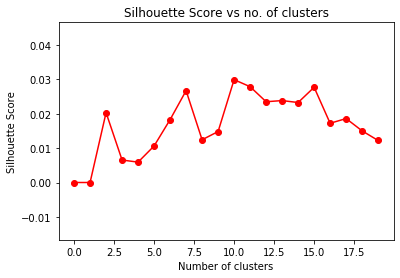

Optimal cluster number is  10

Number of Lines in Summarized text 
4

UK economy ends year with spurt

The UK economy grew by an estimated 3.1% in 2004 after accelerating in the last quarter of the year, says the Office for National Statistics (ONS). The ONS says gross domestic product (GDP) rose by a strong 0.7% in the three months to 31 December, compared with 0.5% in the previous quarter. The ONS said the services sector, which accounts for nearly three-quarters of the UK economy, grew 1.0% in the quarter. However, output in the production sector contracted 0.5%, the second quarterly fall in row and a state of affairs that some economists classify as a recession.

Document  508

Number of Lines in Actual text
10
2 3 4 5 6 7 8 9 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


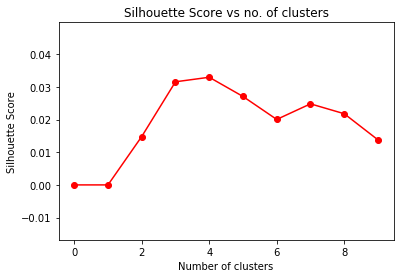

Optimal cluster number is  4

Number of Lines in Summarized text 
3

HealthSouth ex-boss goes on trial

The former head of US medical services firm HealthSouth overstated earnings and assets to boost the company's share price, it was claimed in court. Among the charges he faces are conspiracy to commit fraud, filing false statements and money laundering. After federal agents raided HealthSouth's offices in March 2003, the company said none of its past financial statements could be relied on.

Document  509

Number of Lines in Actual text
15
2 3 4 5 6 7 8 9 10 11 12 13 14 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


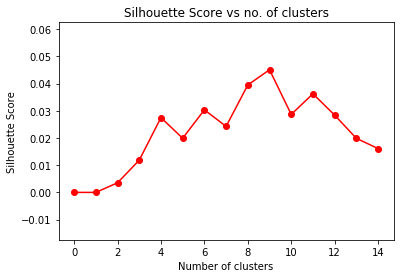

Optimal cluster number is  9

Number of Lines in Summarized text 
4

Euro firms miss out on optimism

More than 90% of large companies around the world are highly optimistic about their economic prospects, a survey of 1,300 bosses suggests. When business advisers PricewaterhouseCoopers (PwC) conducted the same survey two years ago, nearly 30% of bosses were gloomy about their prospects. Already, about 28% of the bosses polled for the survey say that they have moved parts of their business into low-wage countries, and another 11% plan to do so in the future. Surprisingly, the survey suggests that the rapid decline of the US dollar is not seen as a huge threat anymore, unlike even a year ago, when it was cited as the third-largest problem.

Document  510

Number of Lines in Actual text
7
2 3 4 5 6 

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:507: UserWarning: The parameter 'token_pattern' will not be used since 'tokenizer' is not None'
  warnings.warn("The parameter 'token_pattern' will not be used"
C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


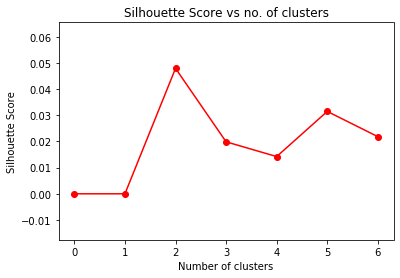

Optimal cluster number is  2

Number of Lines in Summarized text 
5

Lacroix label bought by US firm

Luxury goods group LVMH has sold its loss-making Christian Lacroix clothing label to a US investment group. The Paris-based firm has been shedding non-core businesses and focusing on its most profitable brands including Moet & Chandon champagne and Louis Vuitton. The Falic Group bought two cosmetics labels from LVMH in 2003. The Florida-based Falic group, which also runs a chain of 90 duty free stores in the US, said it planned to expand the brand by opening new stores. Mr Lacroix said he planned to stay at the label he founded in 1987 although exact details are still to be confirmed.

No. of lines in actual document is  7996
No of lines in summarized document is  1729
Final summary of the Multi-Document is 
Ad sales boost Time Warner profit

Quarterly profits at US media giant TimeWarner jumped 76% to $1.13bn (600m) for the three months to December, from $639m year-earlier. TimeWarner

In [9]:
from sklearn.datasets import fetch_20newsgroups

clusters_list = []
count_lines_doc = 0
sent_lines = []
final_sum = []
for i in range(len(all_doc_data)):
    doc = i
    print("Document  {}".format(i+1))
    print()
    #newsgroups_train = fetch_20newsgroups(subset='train', categories=['alt.atheism', 'sci.space'])
    sentences_list = []
    sentenc_list = nltk.sent_tokenize(all_doc_data[i])
    count_lines_doc += len(sentenc_list)
    print("Number of Lines in Actual text")
    print(len(sentenc_list))
    
    for i in range(len(sentenc_list)):
        if sentenc_list[i] not in sent_lines:
            sent_lines.append(sentenc_list[i])
            sentences_list.append(sentenc_list[i])
            
    #sentences_list = newsgroups_train.data
    if(len(sentences_list)>2):
        vectorizer = TfidfVectorizer(analyzer='word',min_df = 0,preprocessor=preprocessing,stop_words='english',tokenizer=LemmaTokenizer(), sublinear_tf=True)
        vectorizer = vectorizer.fit(sentences_list)
        tfidf = vectorizer.transform(sentences_list)
        feature_names = vectorizer.get_feature_names()
        #print(feature_names)

        #Clustering the sentences using KMeans clustering
        n_cluster = cluster_no(tfidf, len(sentences_list))
        clusters_list.append(n_cluster)
        print("Optimal cluster number is ",n_cluster)
        print()
        kmeans = KMeans(n_clusters=n_cluster, init='k-means++', max_iter=100, n_init=1).fit(tfidf)
        kmean_indices = list(kmeans.fit_predict(tfidf))
        #Extracting sentences  with highest tf-idf values
    
        ind = maxTfIdfIndex(sentences_list, feature_names, tfidf)
        cluster_max = [] 

        index = kmean_indices[ind]
        sent = []

        for i in range(len(sentences_list)):
            if kmean_indices[i] == index:
                sent.append(sentences_list[i])
                #print(sentences_list[i])
        print("Number of Lines in Summarized text ")
        print(len(sent))
        print()
        
        final_sum.extend(sent)
        summary = ' '.join(sent)
        
        #file1 = open(path+'/SummarizedText/summarized_text'+str(i+1)+'.txt','w+')
        #file1.write(summary)
        #file1.close()
        print(summary)
        print()
    else:
        final_sum.extend(sentences_list)
        print("Number of Lines in Summarized text ")
        print(len(sentences_list))
        print(' '.join(sentences_list))
        clusters_list.append(None)
        
print("No. of lines in actual document is ",count_lines_doc)
print("No of lines in summarized document is ",len(final_sum))
print("Final summary of the Multi-Document is ")
print(' '.join(final_sum))

In [10]:
with open(path+"/system_sum.txt","w") as file:
    file.write("\n".join(final_sum))

# Visualizing the data

Document  1



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


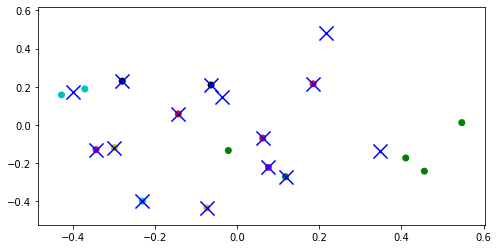

Document  2



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


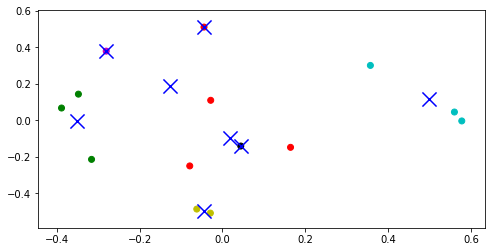

Document  3



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


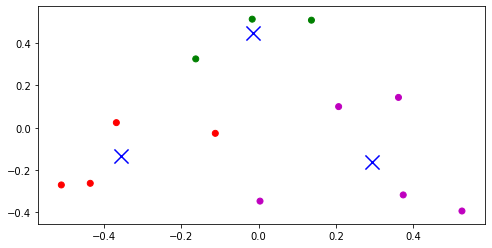

Document  4



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


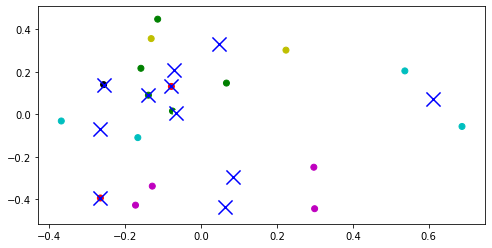

Document  5



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


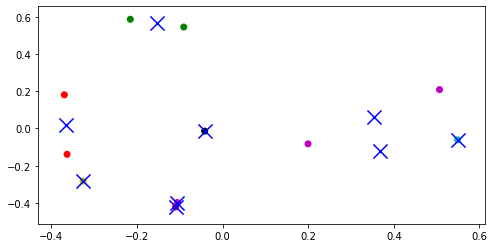

Document  6



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


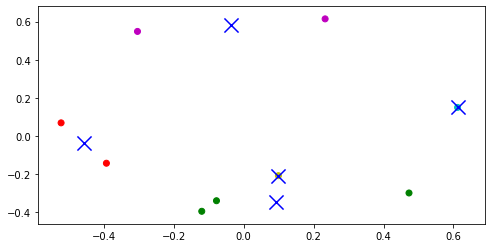

Document  7



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


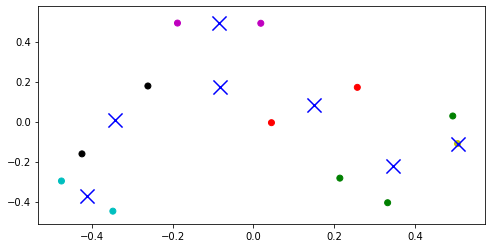

Document  8



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


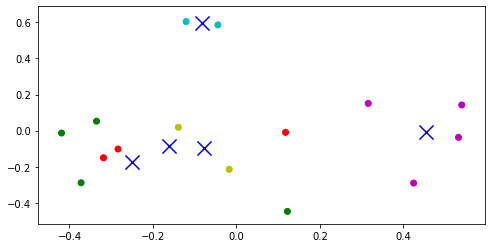

Document  9



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


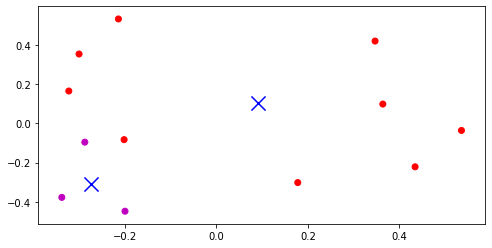

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  10



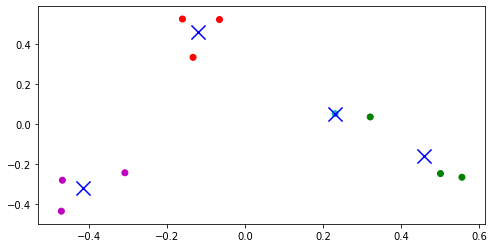

Document  11



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


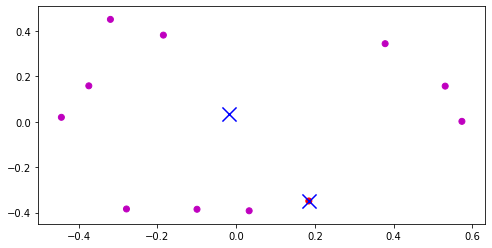

Document  12



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


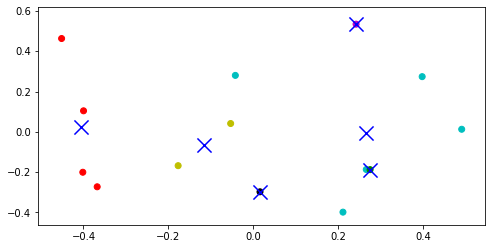

Document  13



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


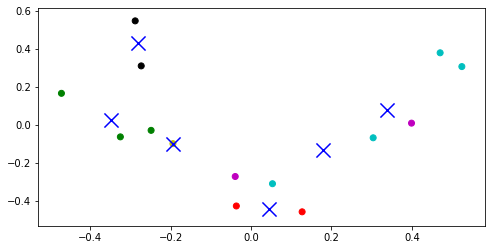

Document  14



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


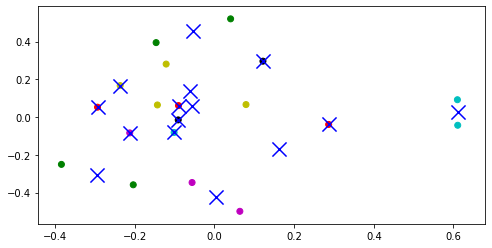

Document  15



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


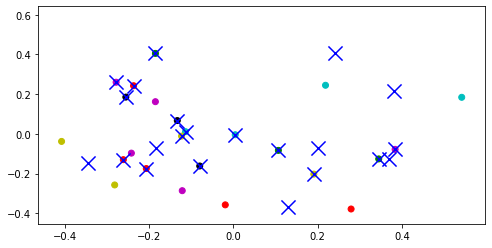

Document  16



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


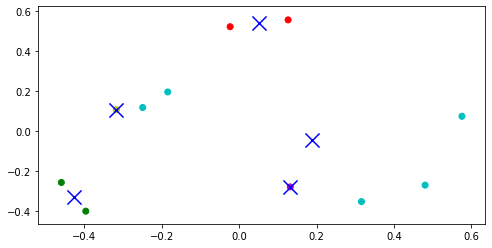

Document  17



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


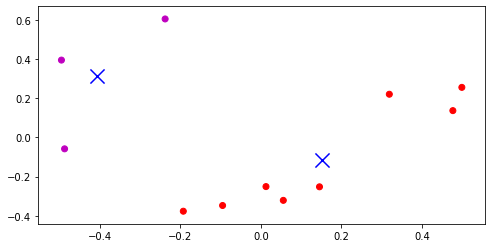

Document  18



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


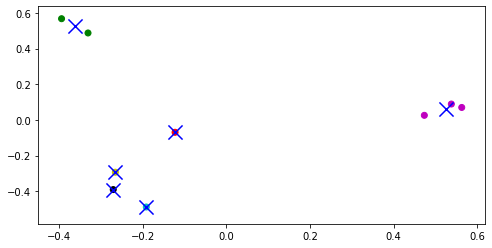

Document  19



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


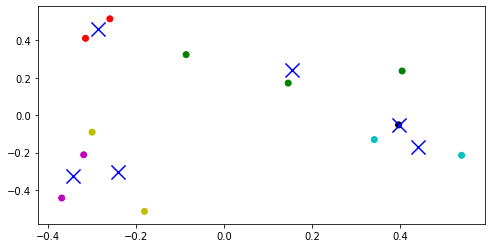

Document  20



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


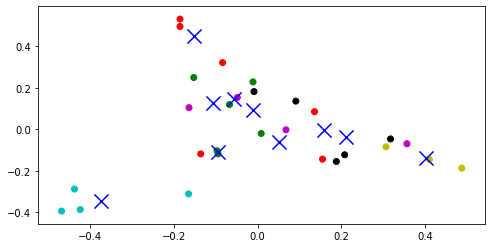

Document  21



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


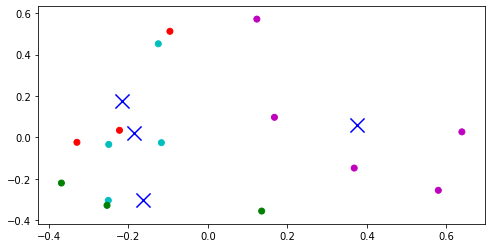

Document  22



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


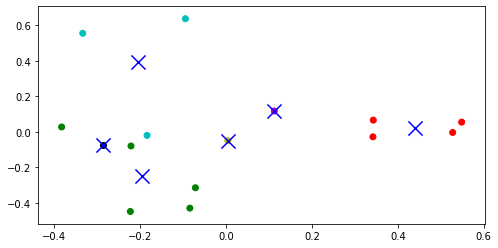

Document  23



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


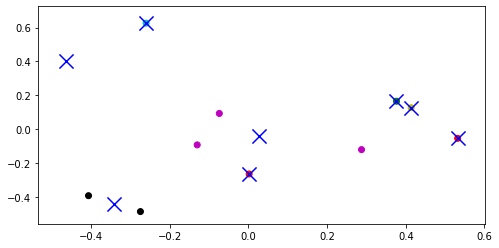

Document  24



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


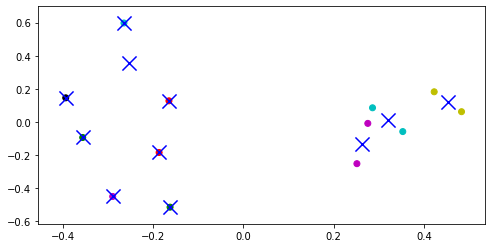

Document  25



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


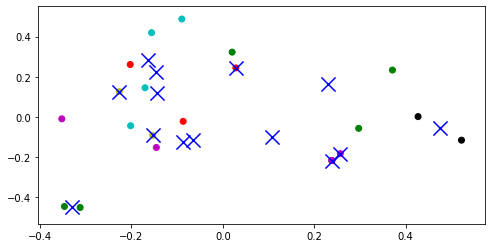

Document  26



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


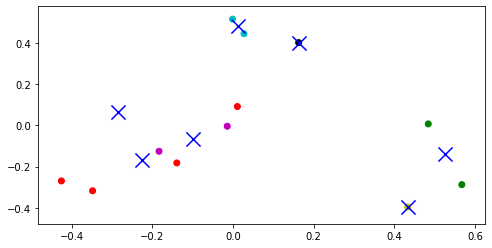

Document  27



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


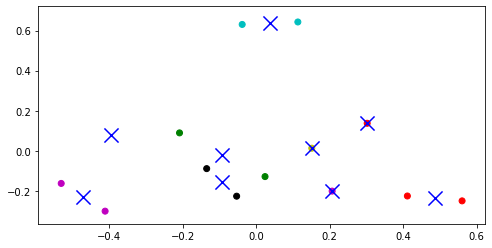

Document  28



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


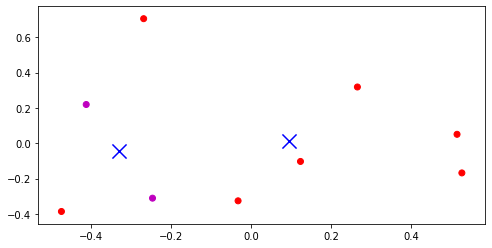

Document  29

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


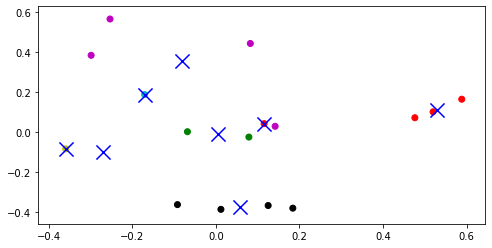

Document  30



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


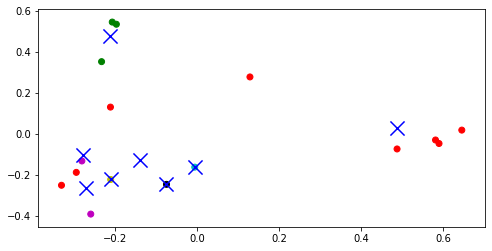

Document  31



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


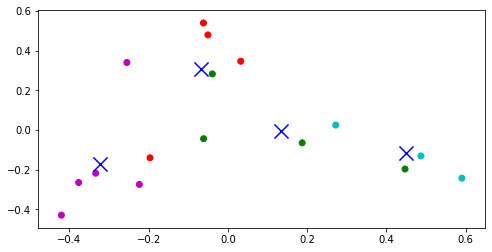

Document  32



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


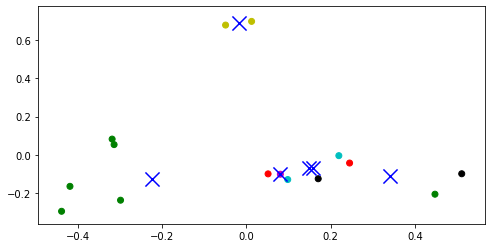

Document  33



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


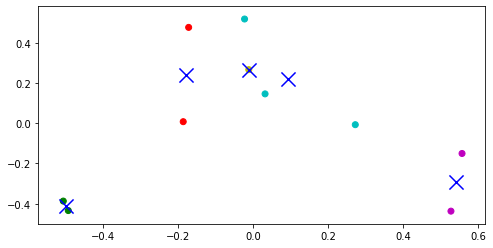

Document  34



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


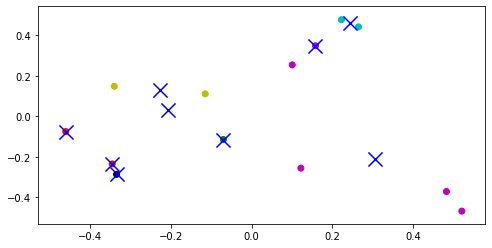

Document  35



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


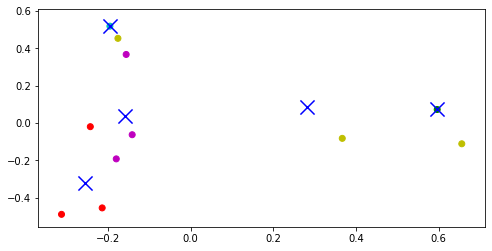

Document  36



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


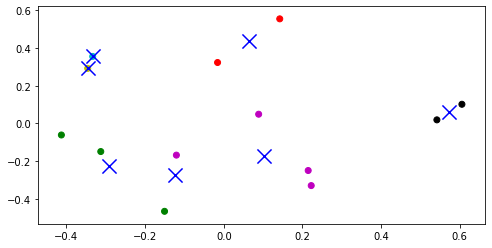

Document  37



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


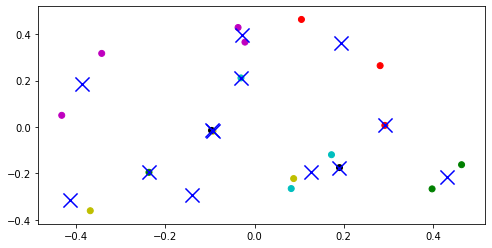

Document  38



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


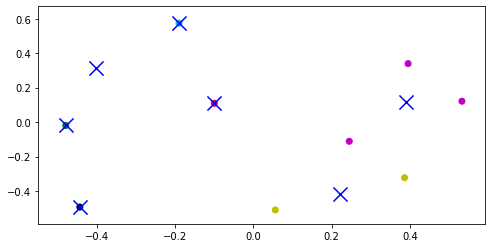

Document  39



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


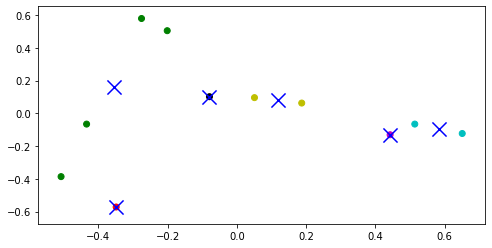

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  40



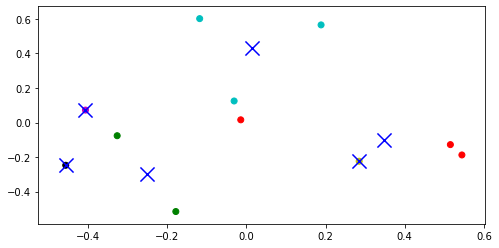

Document  41



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


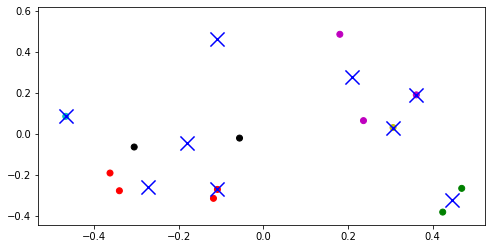

Document  42



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


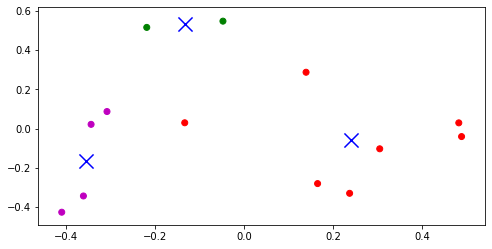

Document  43



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


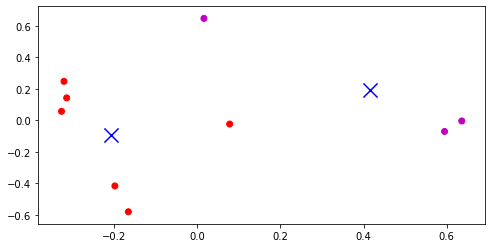

Document  44



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


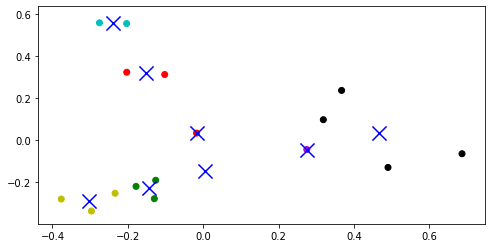

Document  45



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


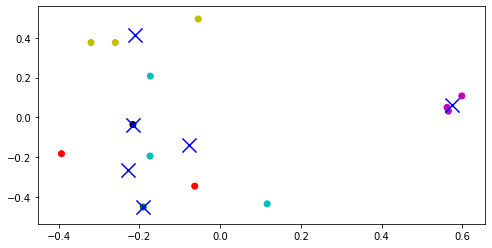

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  46



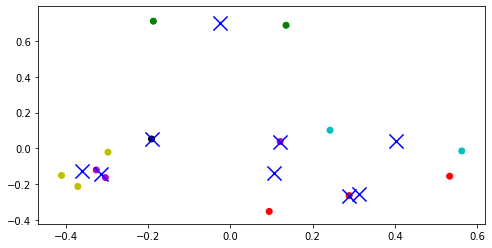

Document  47



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


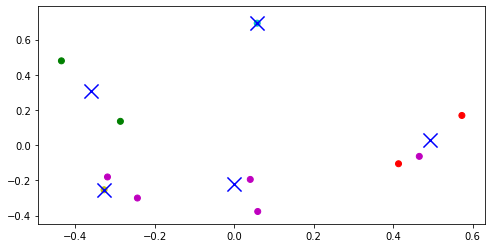

Document  48



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


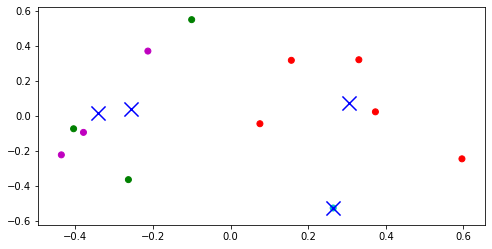

Document  49



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


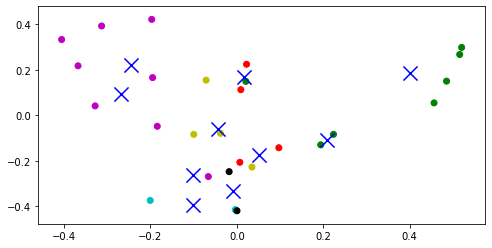

Document  50



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


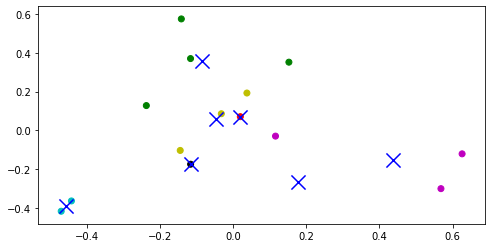

Document  51



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


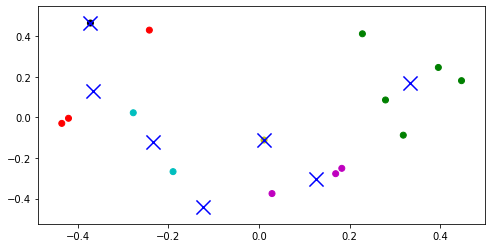

Document  52



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


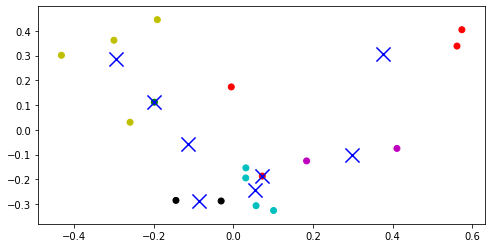

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  53



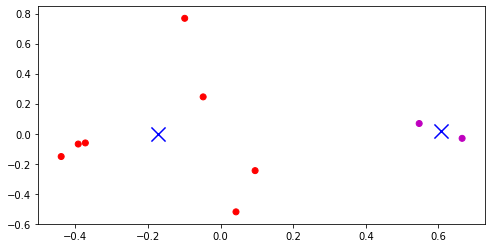

Document  54



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


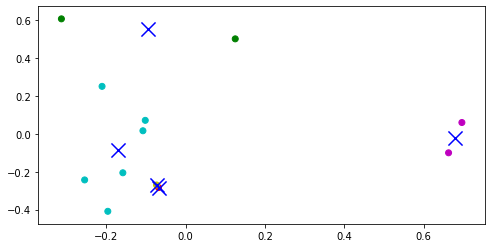

Document  55



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


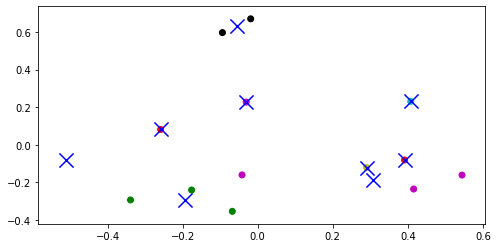

Document  56



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


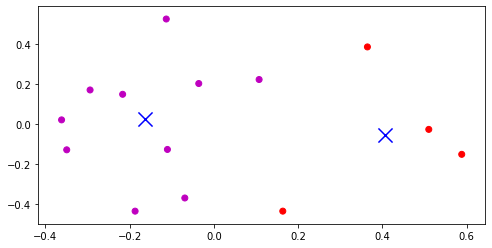

Document  57



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


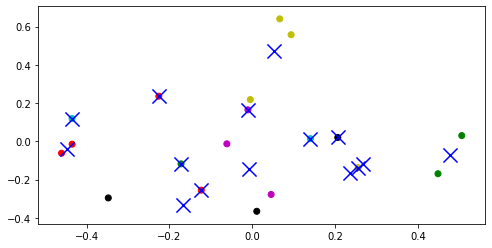

Document  58



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


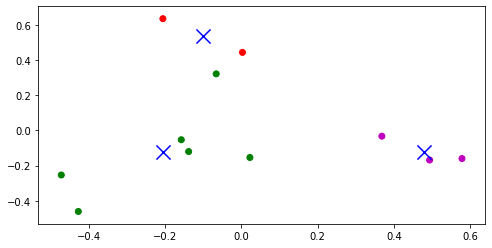

Document  59



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


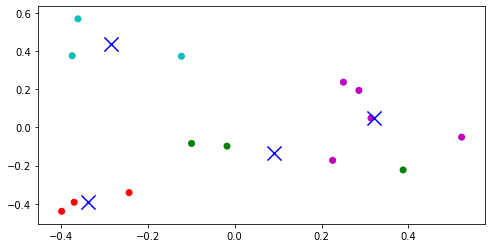

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  60



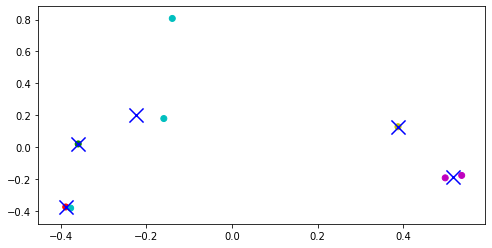

Document  61



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


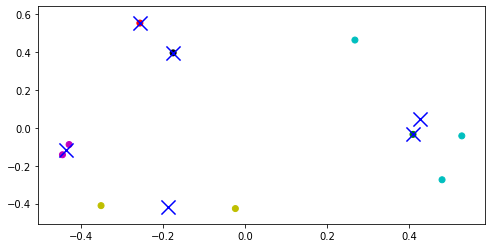

Document  62



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


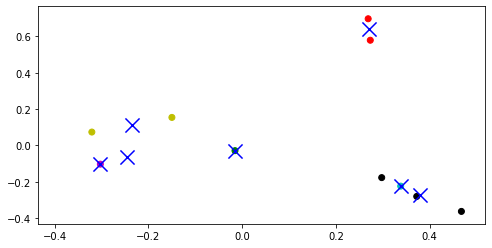

Document  63



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


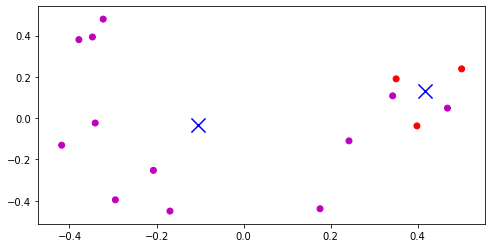

Document  64



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


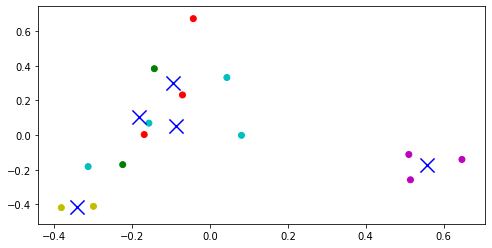

Document  65



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


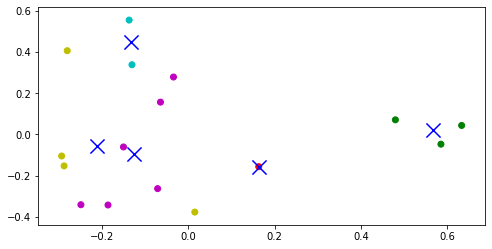

Document  66



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


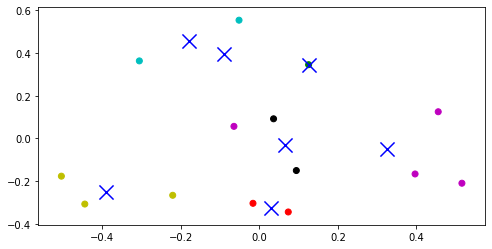

Document  67



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


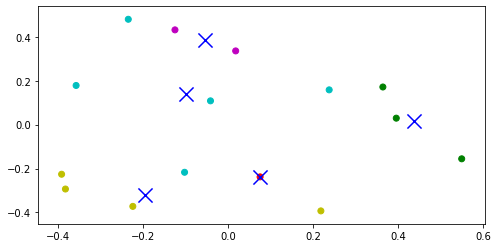

Document  68



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


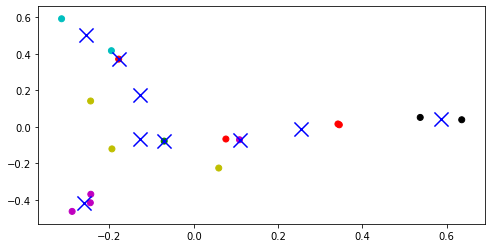

Document  69



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


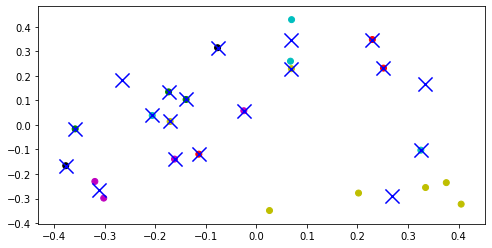

Document  70



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


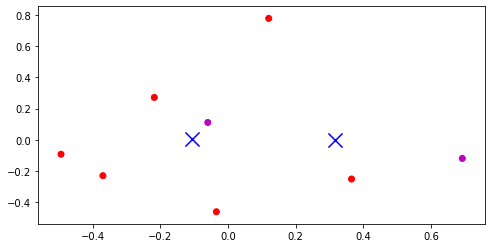

Document  71



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


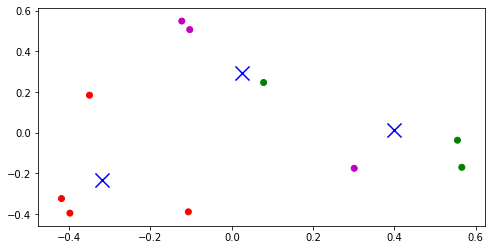

Document  72



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


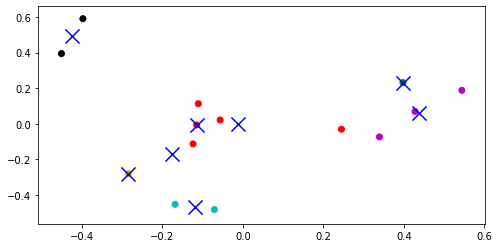

Document  73



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


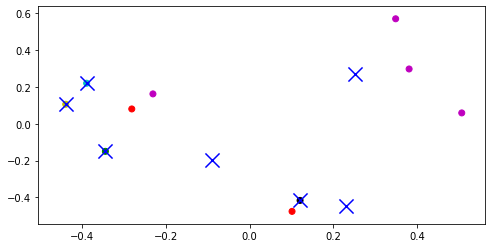

Document  74



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


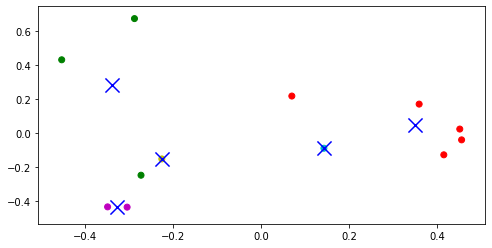

Document  75



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


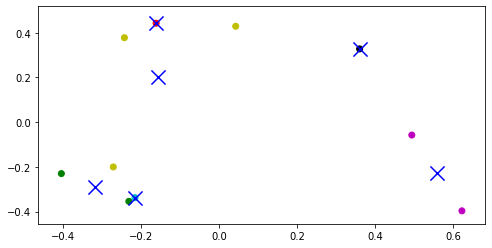

Document  76



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


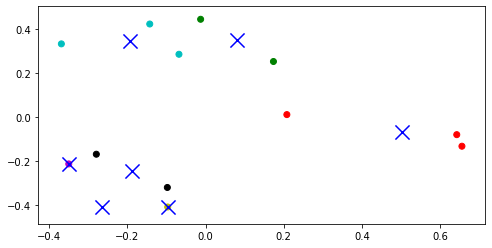

Document  77



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


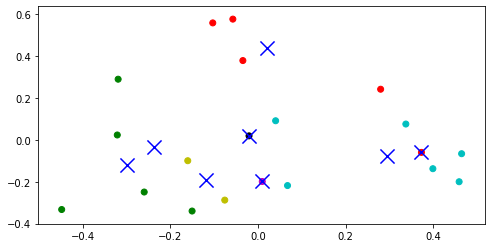

Document  78



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


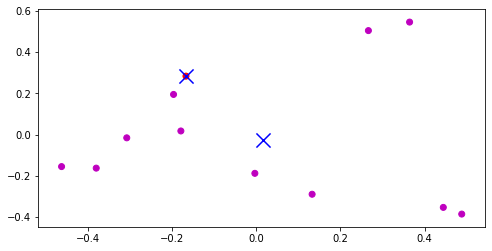

Document  79



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


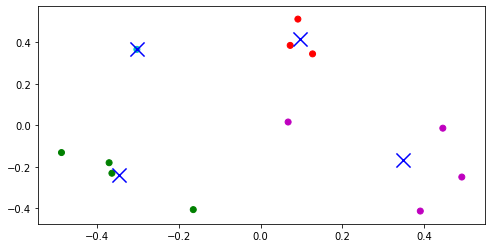

Document  80



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


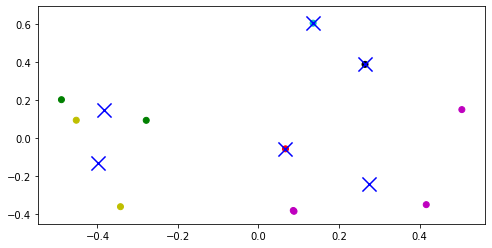

Document  81



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


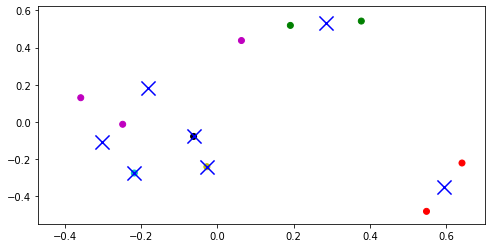

Document  82



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


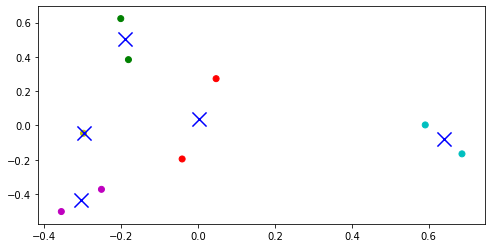

Document  83



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


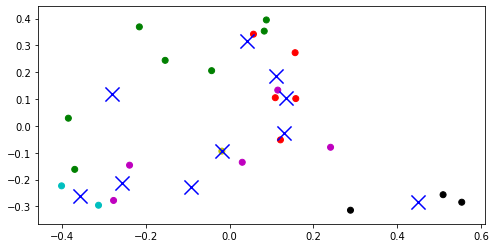

Document  84



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


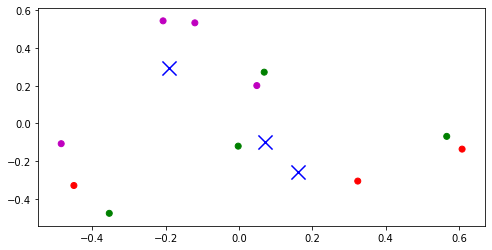

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  85



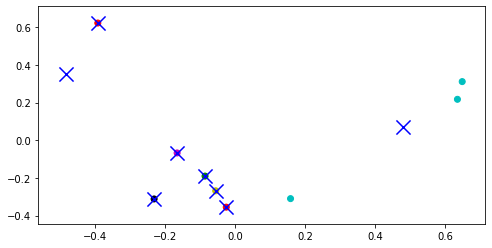

Document  86



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


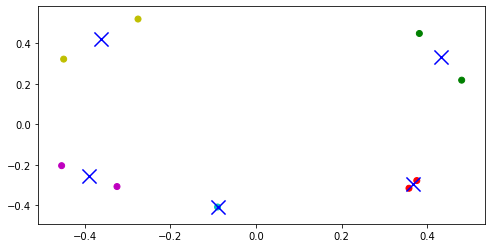

Document  87



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


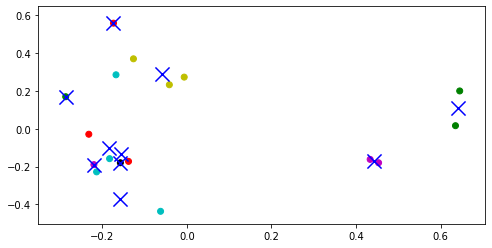

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  88



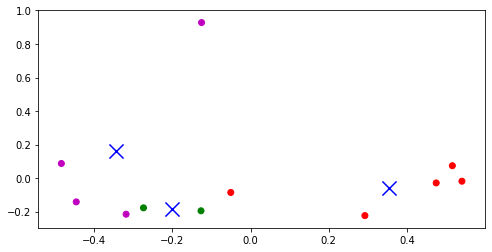

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  89



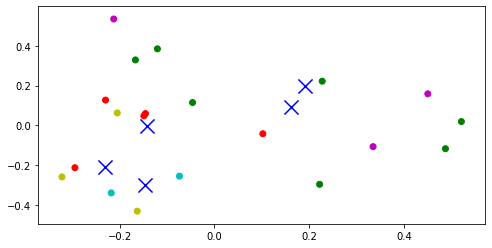

Document  90



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


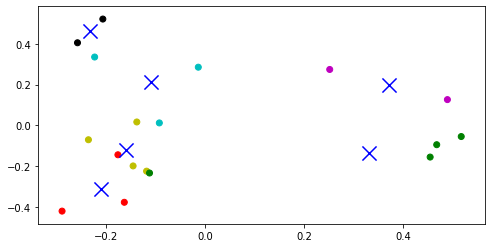

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  91



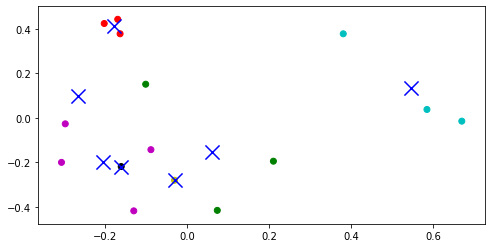

Document  92



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


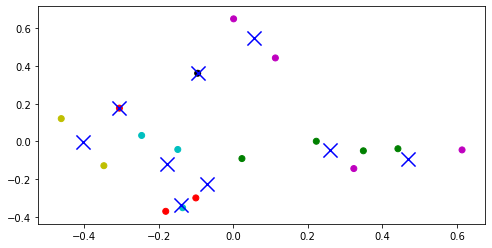

Document  93



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


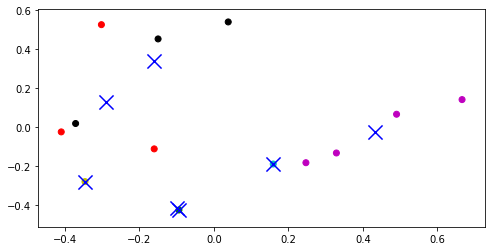

Document  94



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


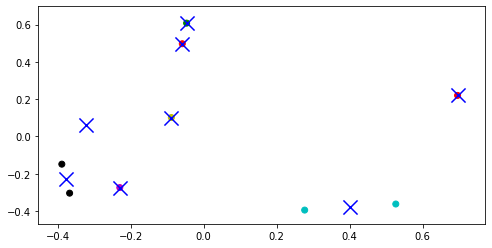

Document  95



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


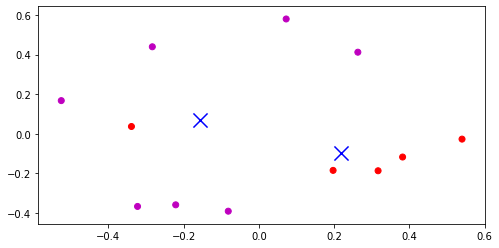

Document  96



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


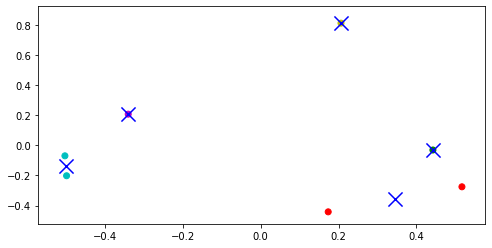

Document  97



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


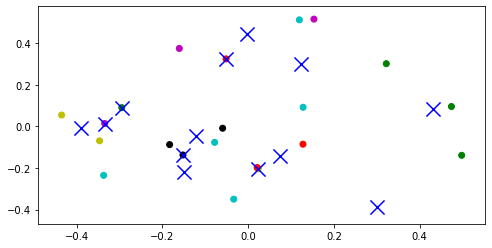

Document  98



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


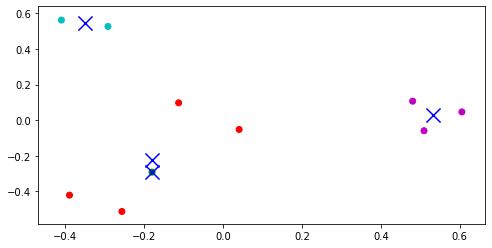

Document  99



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


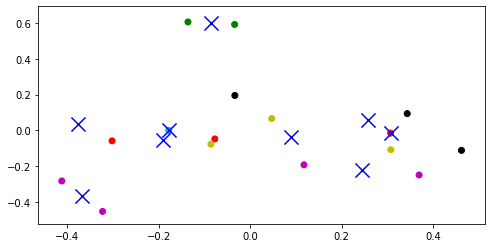

Document  100



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


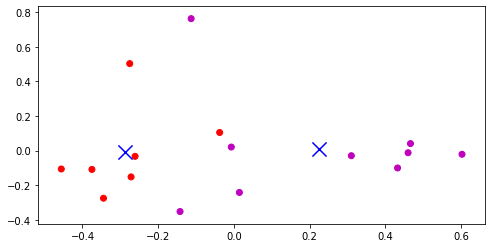

Document  101



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


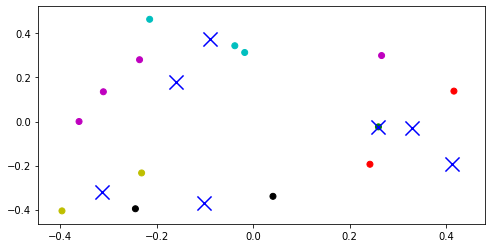

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  102



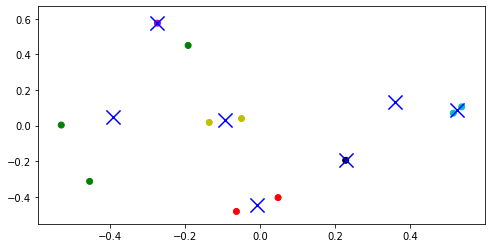

Document  103



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


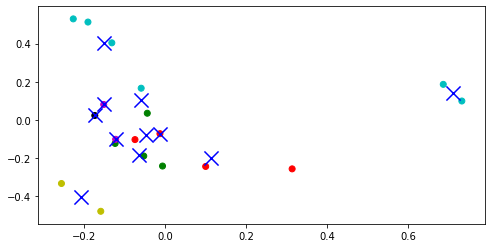

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  104



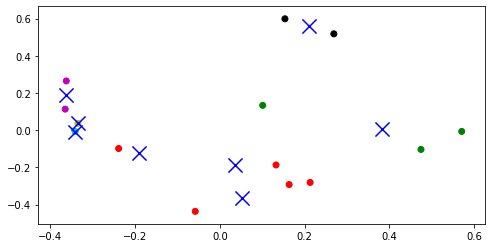

Document  105



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


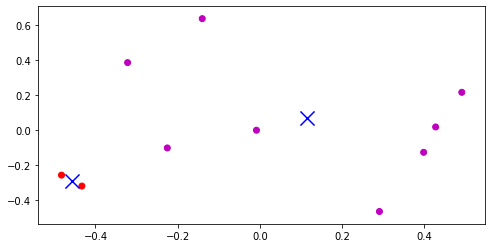

Document  106



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


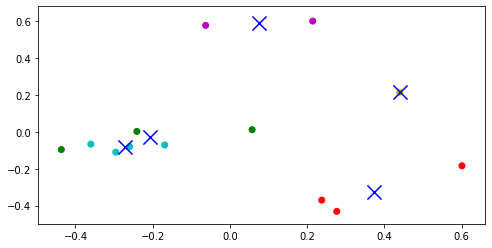

Document  107



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


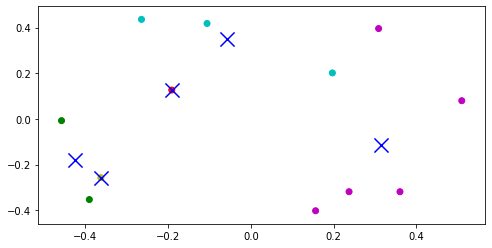

Document  108



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


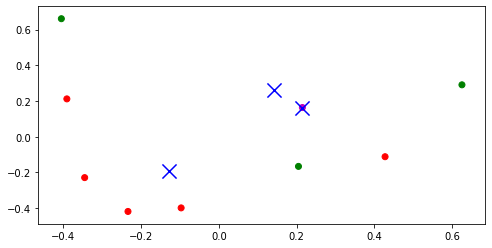

Document  109



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


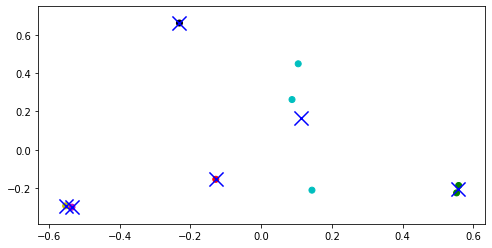

Document  110



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


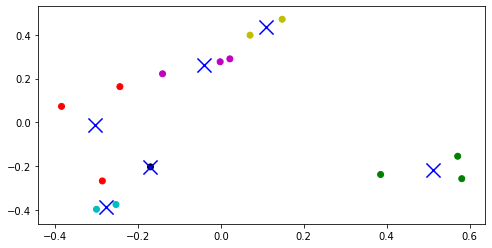

Document  111



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


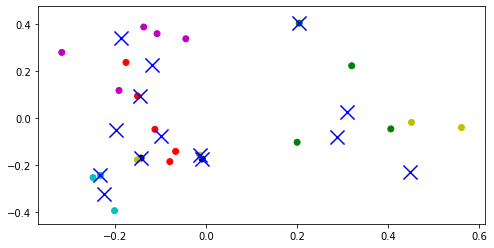

Document  112



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


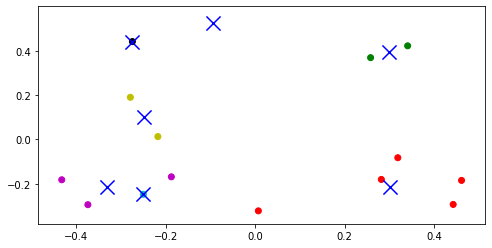

Document  113



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


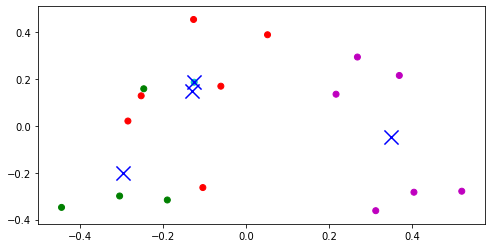

Document  114



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


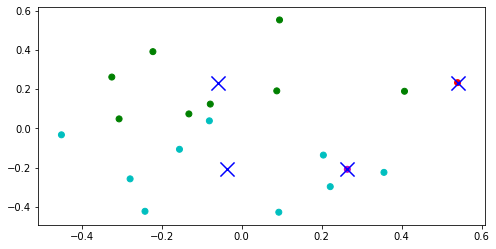

Document  115



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


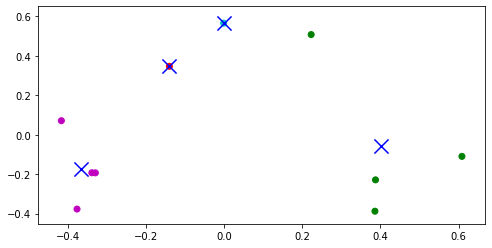

Document  116



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


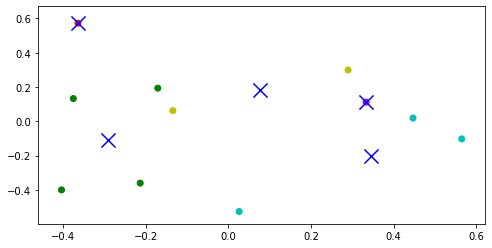

Document  117



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


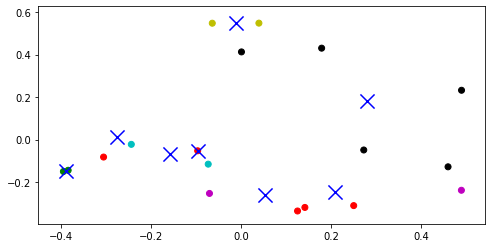

Document  118



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


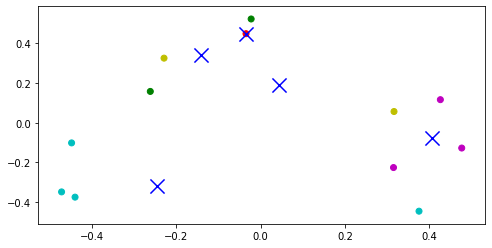

Document  119



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


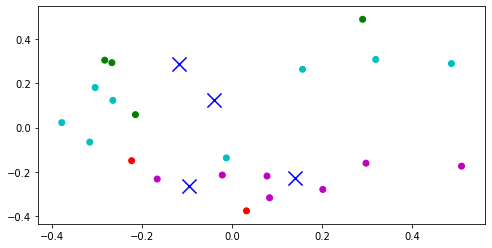

Document  120



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


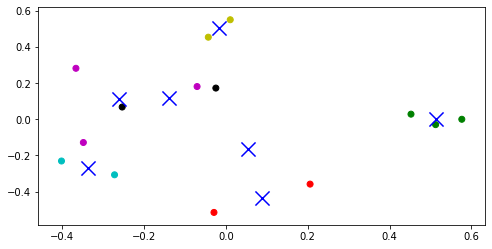

Document  121



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


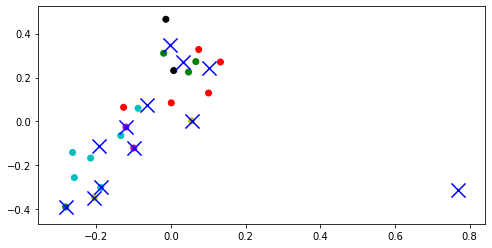

Document  122



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


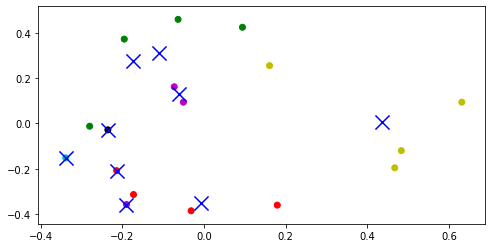

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  123



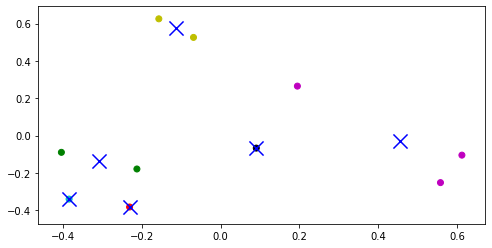

Document  124



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


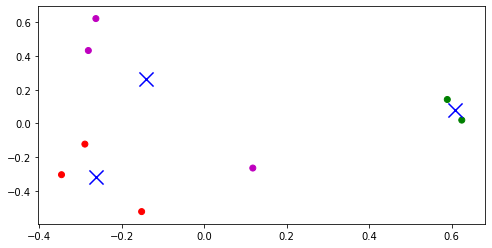

Document  125



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


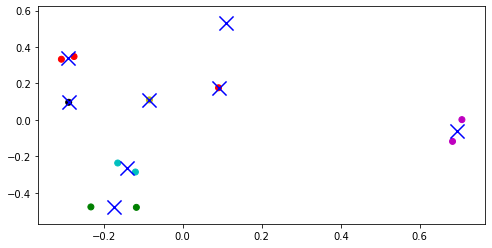

Document  126



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


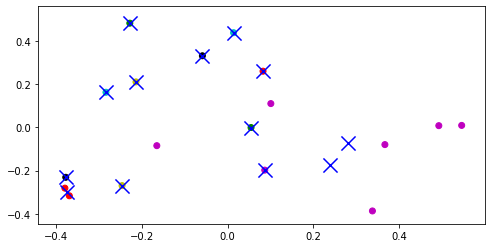

Document  127



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


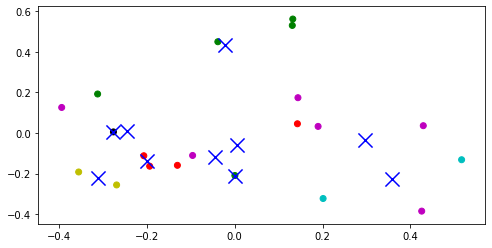

Document  128



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


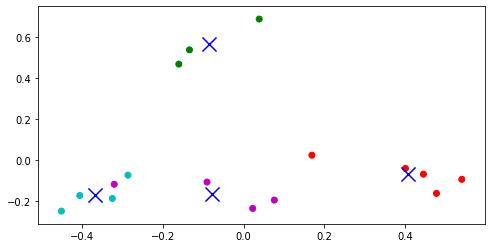

Document  129



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


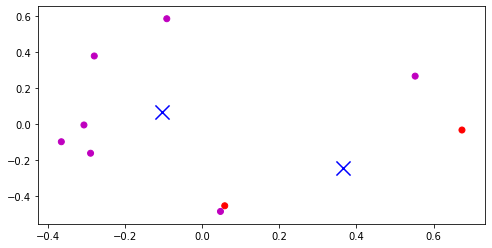

Document  130



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


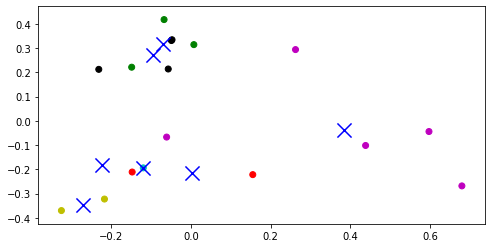

Document  131



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


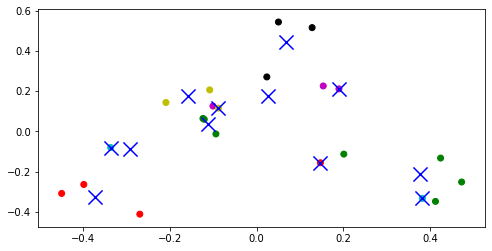

Document  132



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


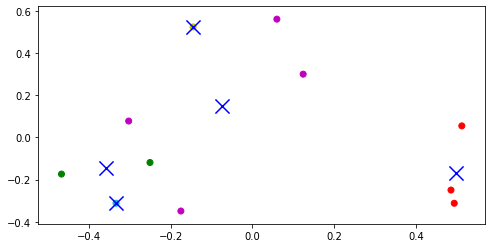

Document  133



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


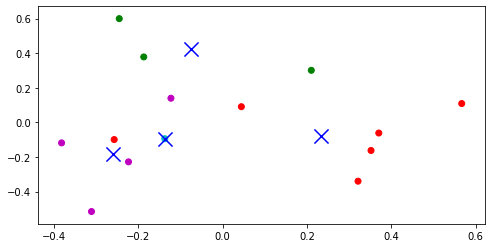

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  134



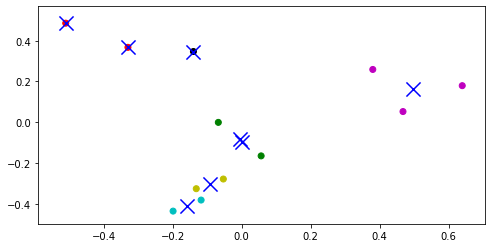

Document  135



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


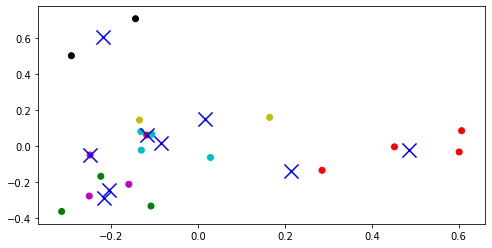

Document  136



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


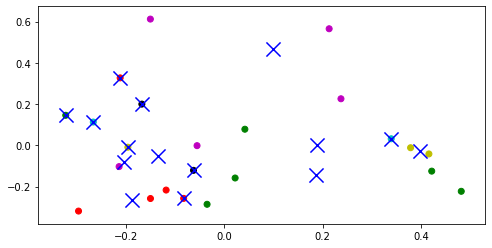

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  137



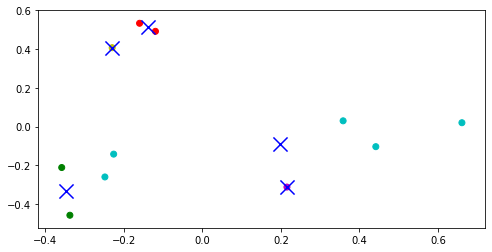

Document  138



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


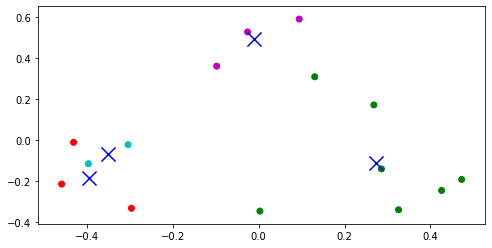

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  139



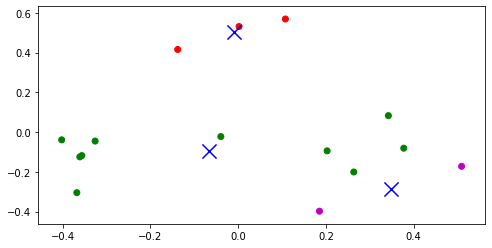

Document  140



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


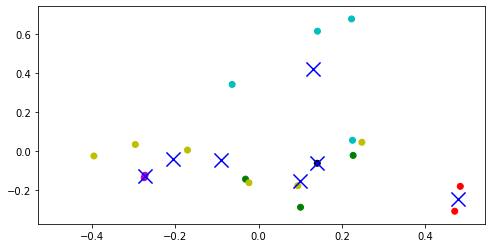

Document  141



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


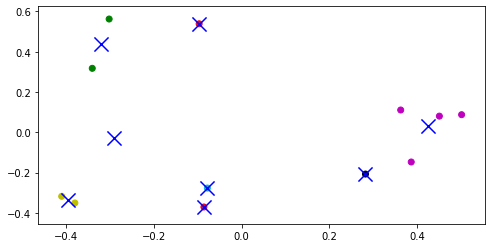

Document  142



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


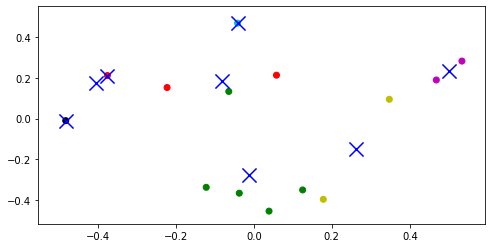

Document  143



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


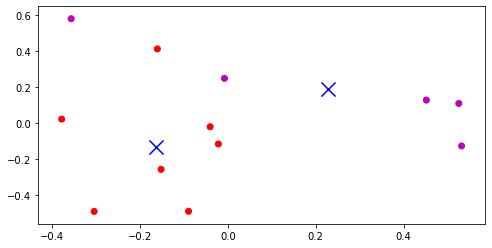

Document  144



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


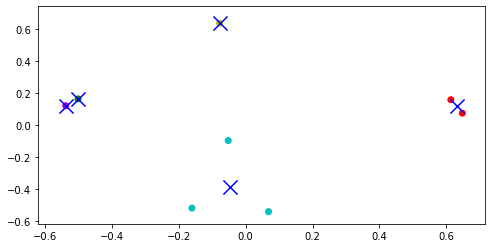

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  145



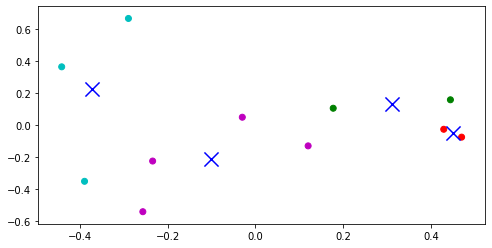

Document  146



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


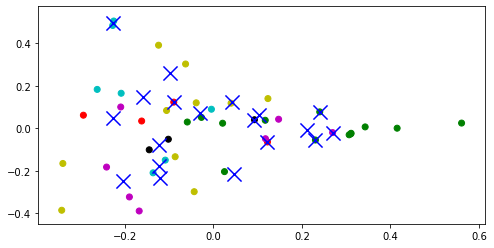

Document  147



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


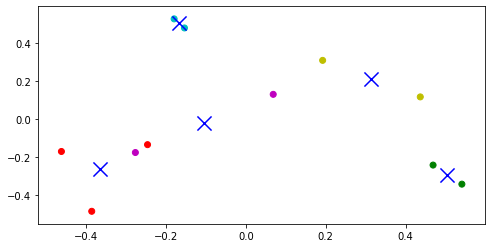

Document  148



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


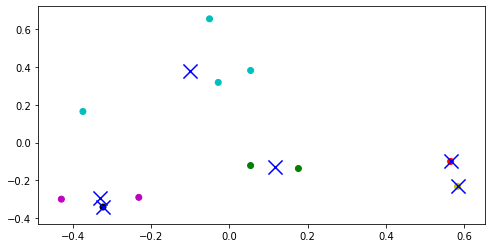

Document  149



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


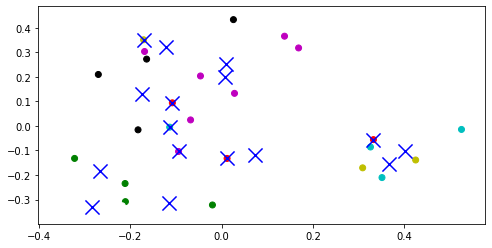

Document  150



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


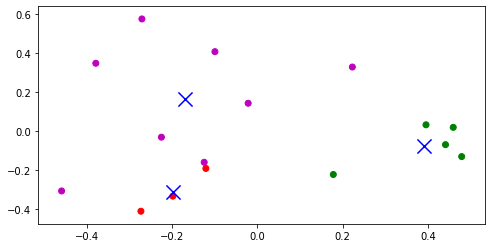

Document  151



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


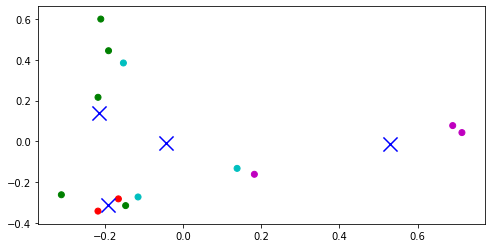

Document  152



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


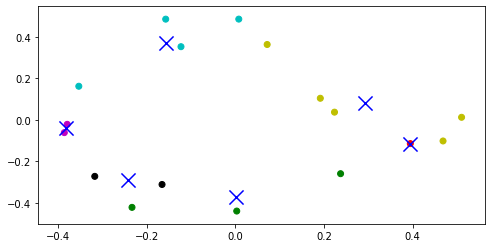

Document  153



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


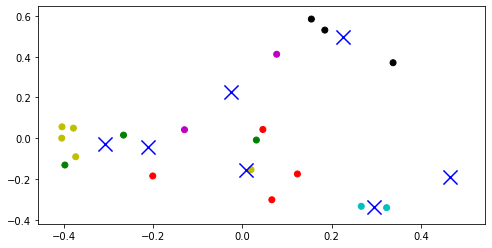

Document  154



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


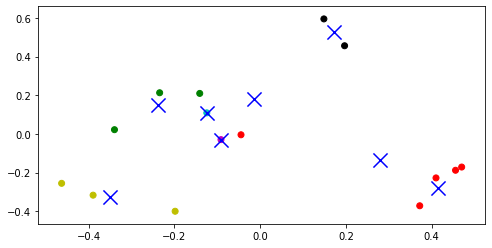

Document  155



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


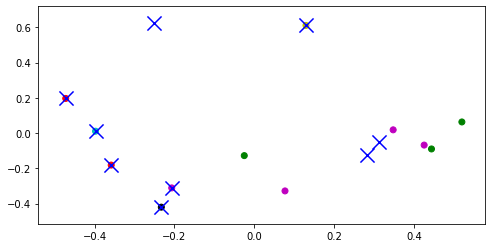

Document  156



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


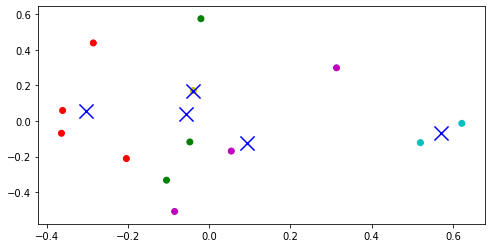

Document  157



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


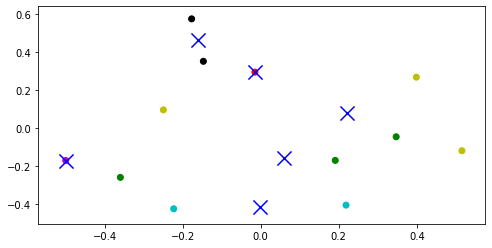

Document  158



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


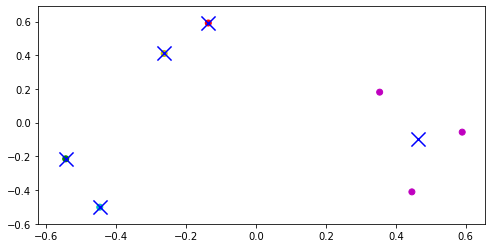

Document  159



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


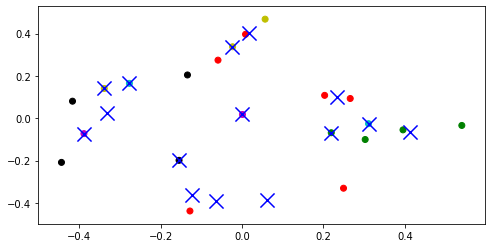

Document  160



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


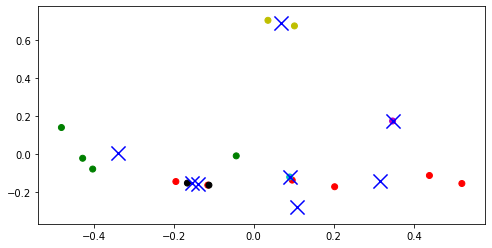

Document  161



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


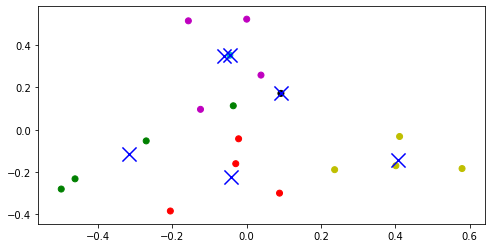

Document  162



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


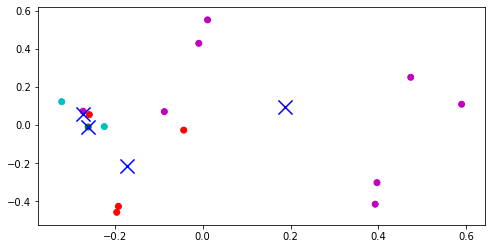

Document  163



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


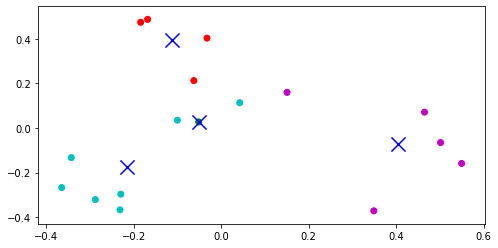

Document  164



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


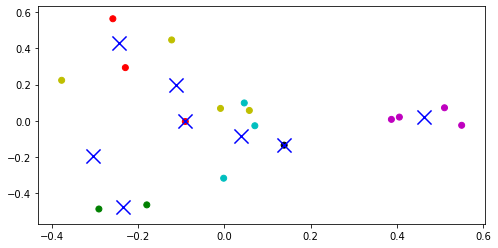

Document  165



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


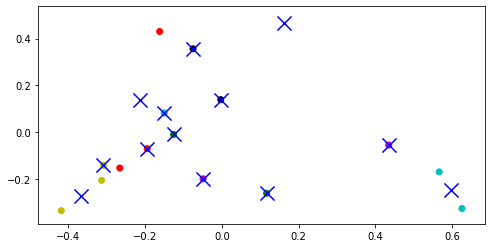

Document  166



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


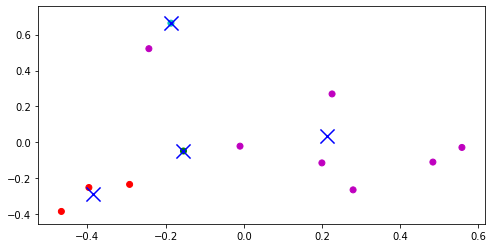

Document  167



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


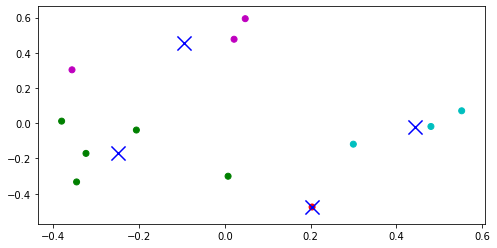

Document  168



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


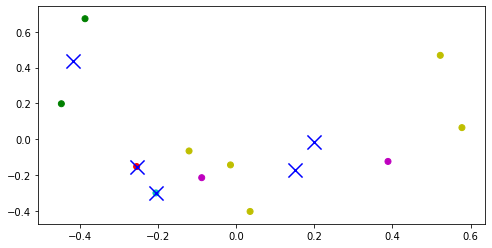

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  169



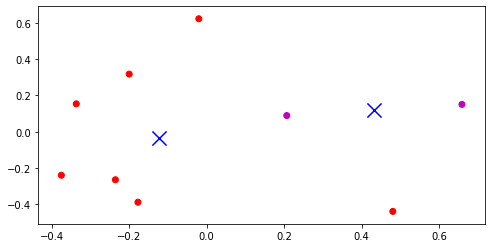

Document  170



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


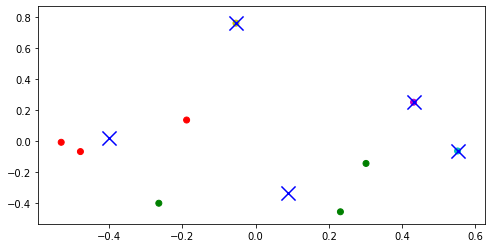

Document  171



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


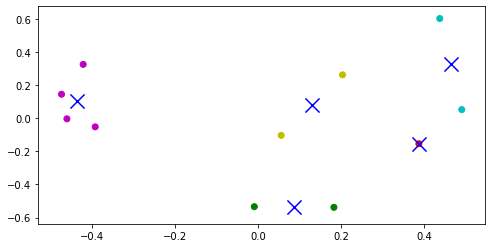

Document  172



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


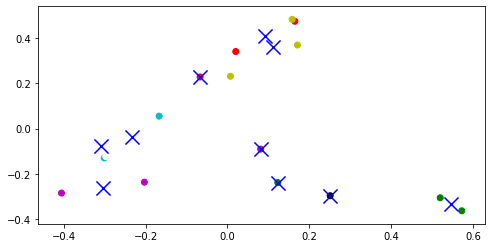

Document  173



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


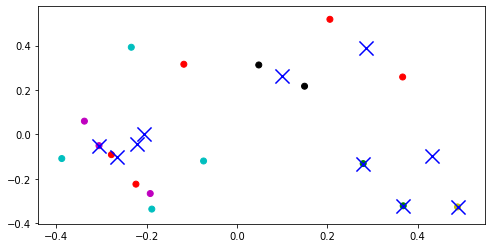

Document  174



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


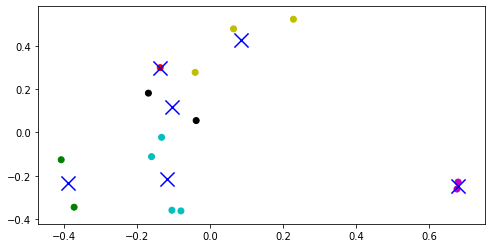

Document  175



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


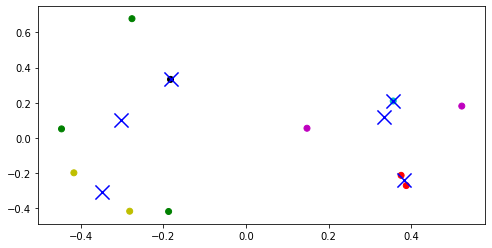

Document  176



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


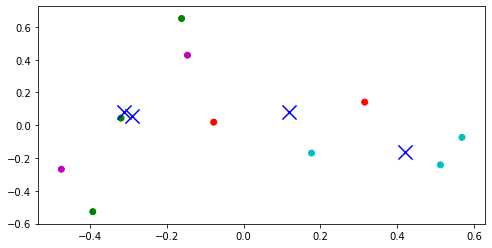

Document  177



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


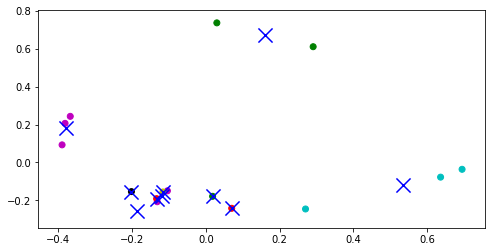

Document  178



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


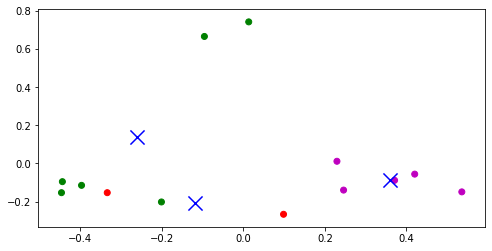

Document  179



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


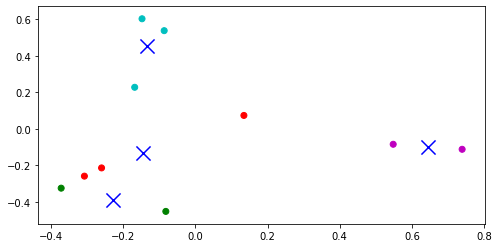

Document  180



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


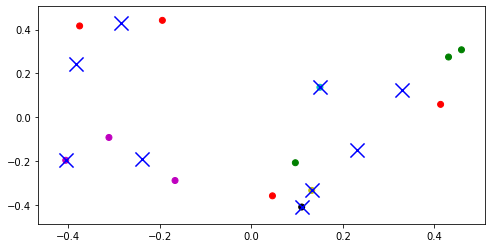

Document  181



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


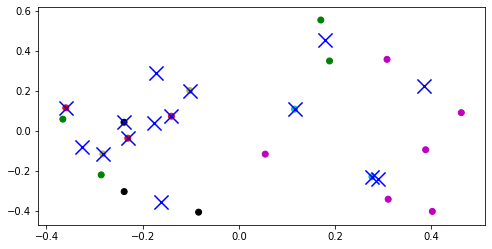

Document  182



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


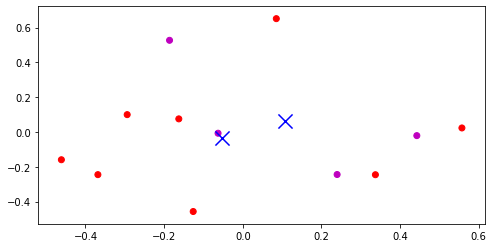

Document  183



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


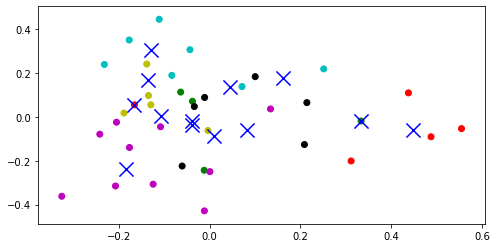

Document  184



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


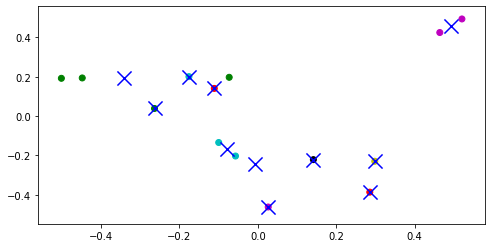

Document  185



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


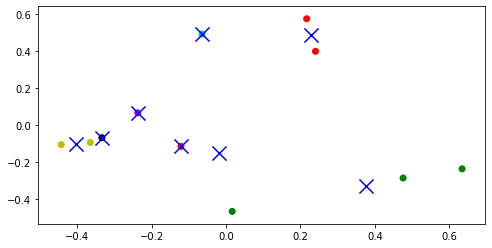

Document  186



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


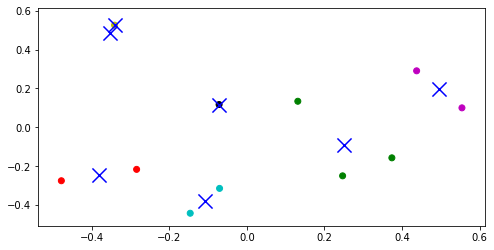

Document  187



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


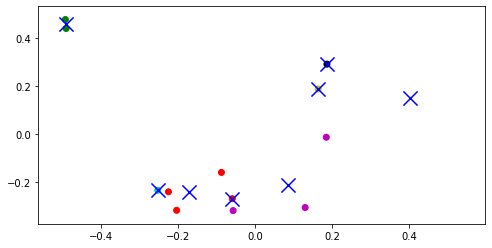

Document  188



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


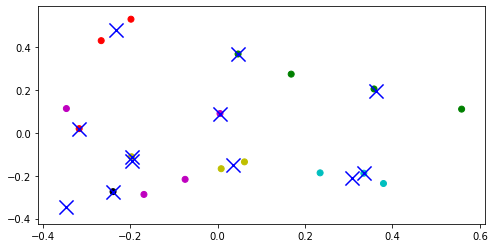

Document  189



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


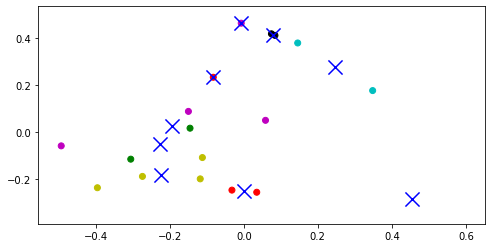

Document  190



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


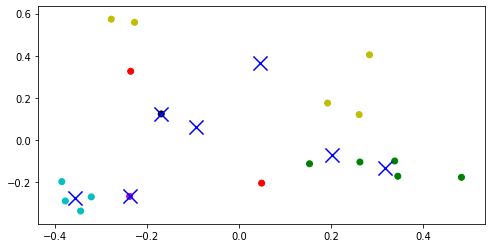

Document  191



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


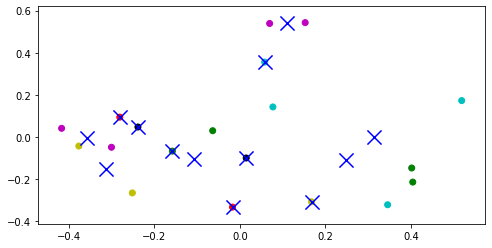

Document  192



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


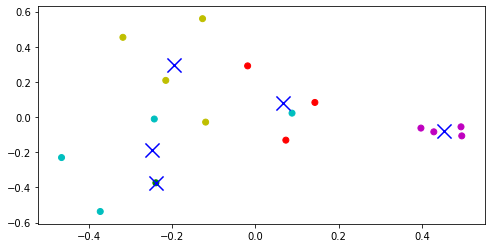

Document  193



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


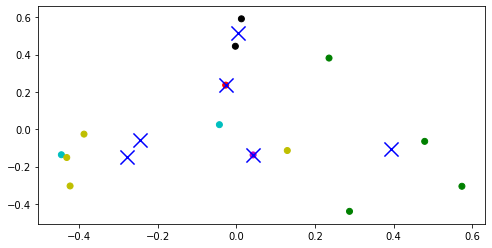

Document  194



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


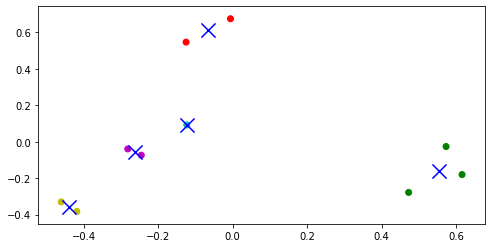

Document  195



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


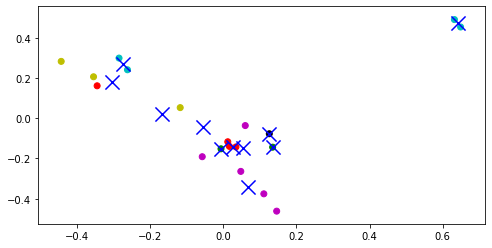

Document  196



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


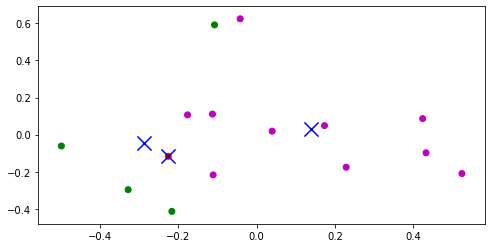

Document  197



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


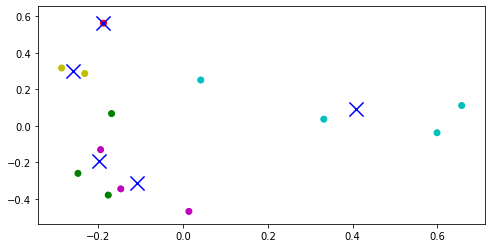

Document  198



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


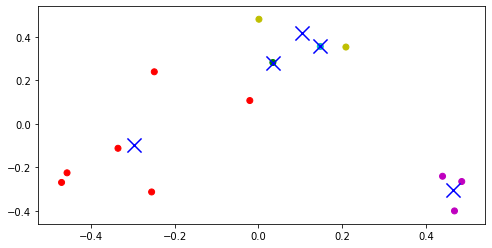

Document  199



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


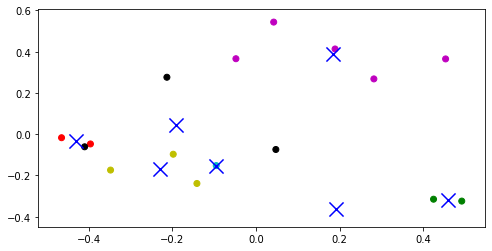

Document  200



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


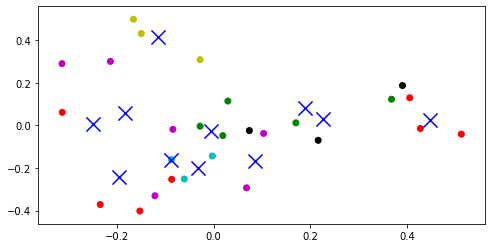

Document  201



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


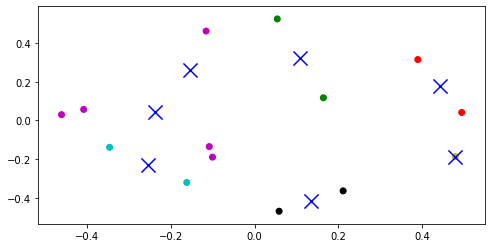

Document  202



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


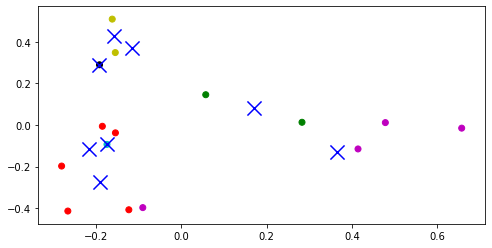

Document  203



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


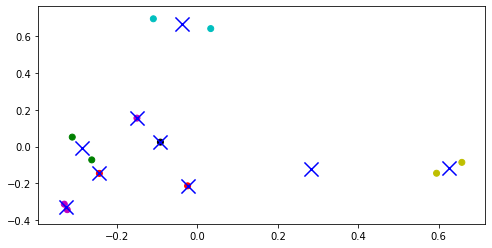

Document  204



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


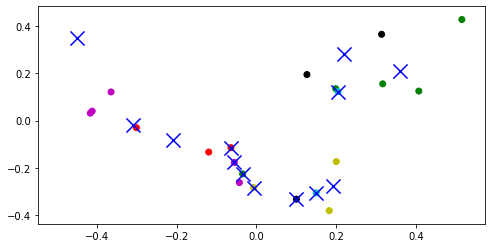

Document  205



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


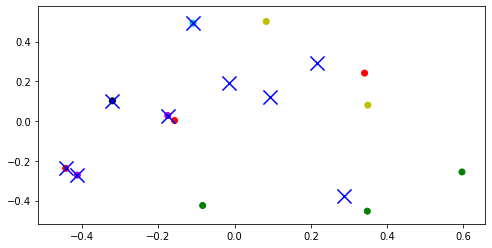

Document  206



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


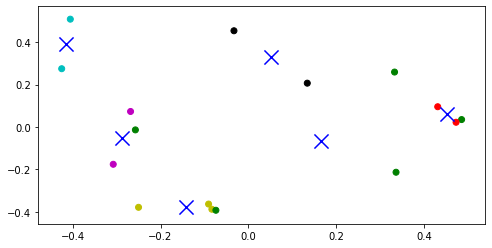

Document  207



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


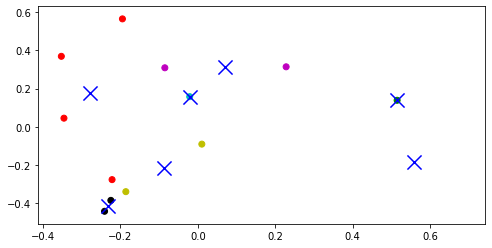

Document  208



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


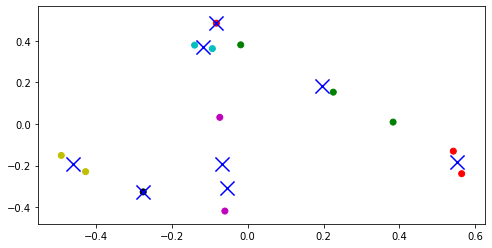

Document  209



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


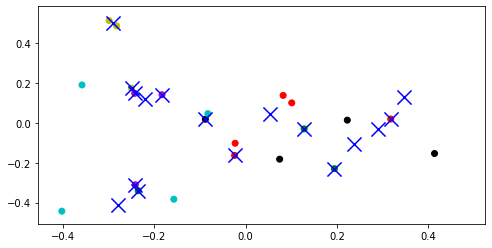

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  210



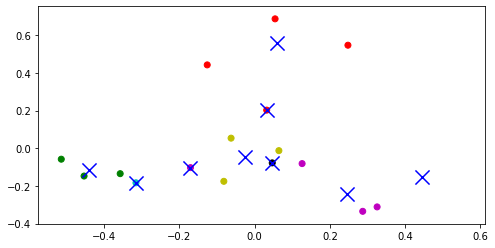

Document  211



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


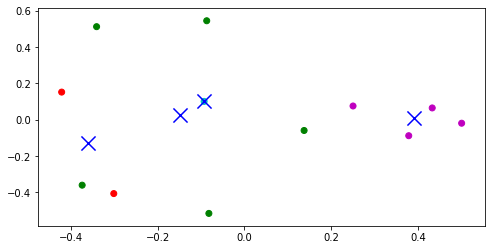

Document  212



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


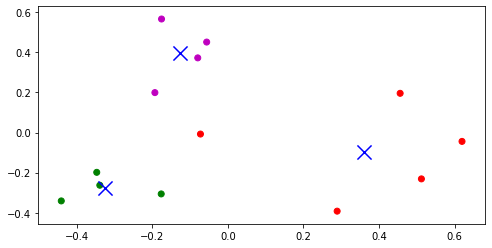

Document  213



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


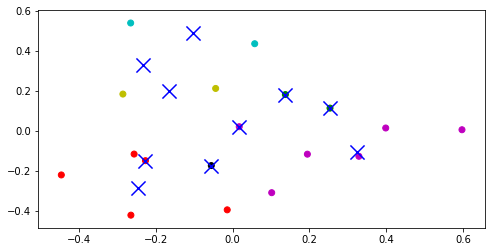

Document  214



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


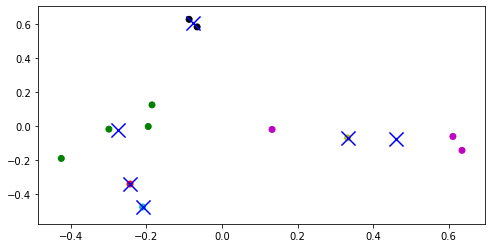

Document  215



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


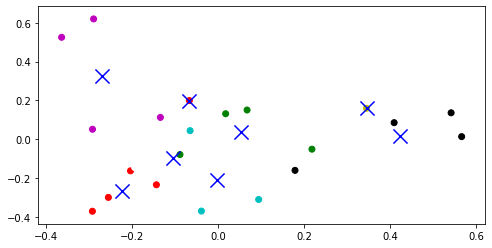

Document  216



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


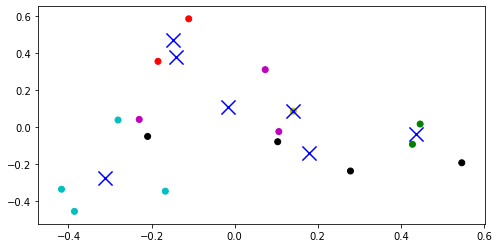

Document  217



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


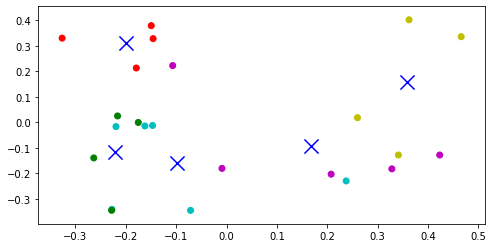

Document  218



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


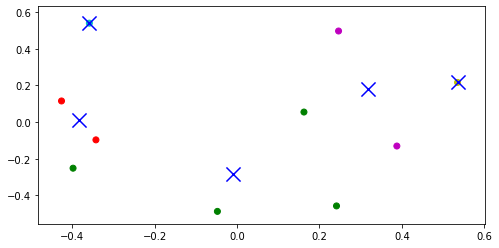

Document  219



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


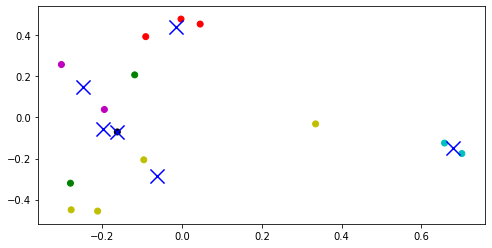

Document  220



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


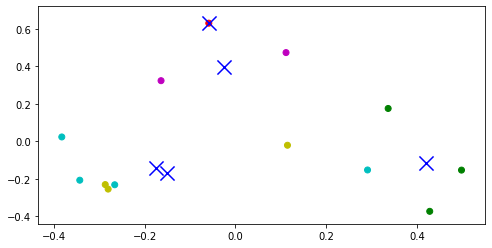

Document  221



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


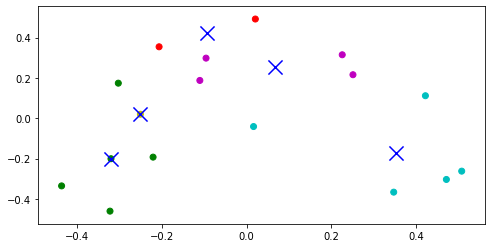

Document  222



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


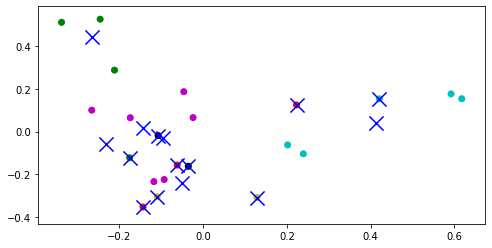

Document  223



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


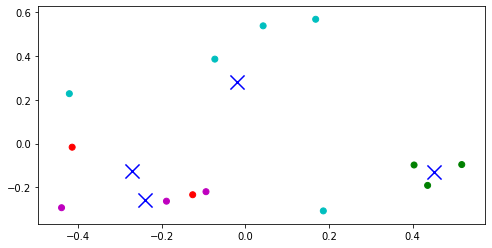

Document  224



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


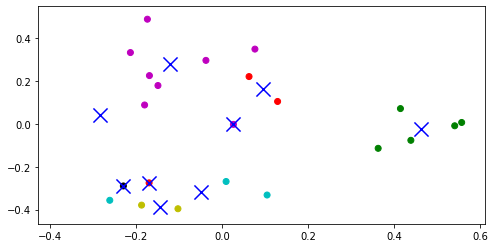

Document  225



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


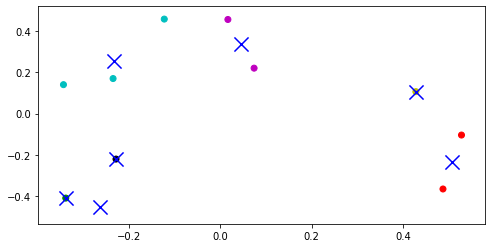

Document  226



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


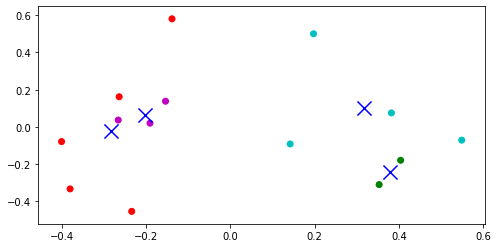

Document  227



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


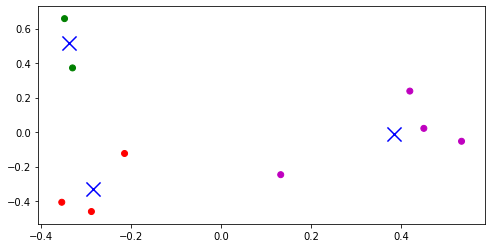

Document  228



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


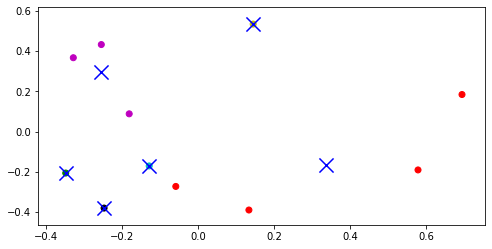

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  229



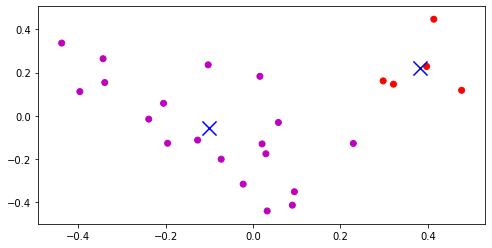

Document  230



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


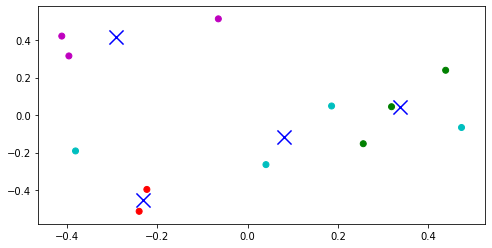

Document  231



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


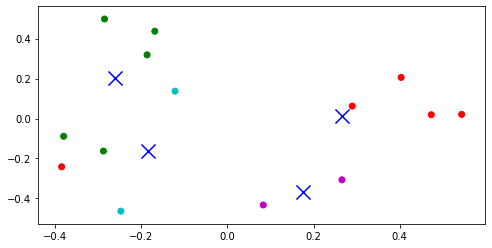

Document  232



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


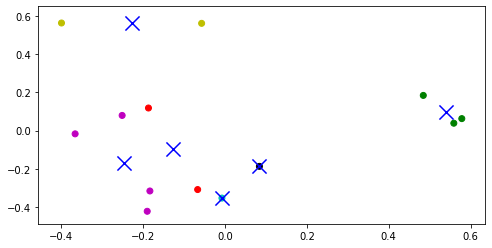

Document  233



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


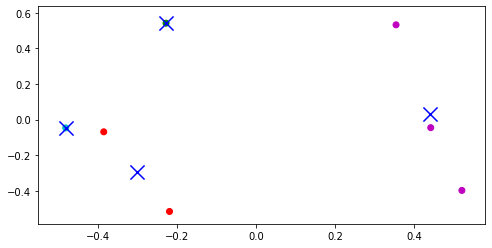

Document  234



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


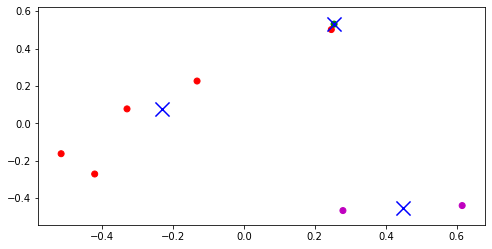

Document  235



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


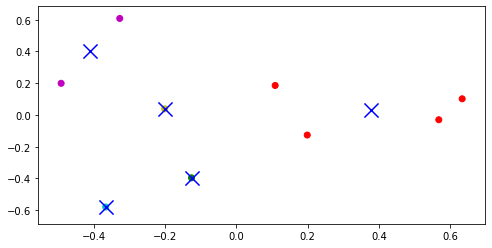

Document  236



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


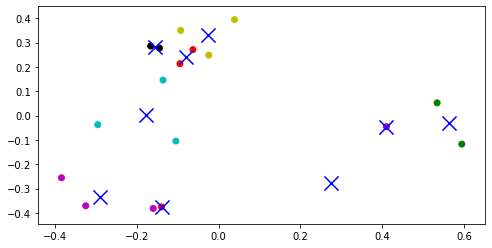

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  237



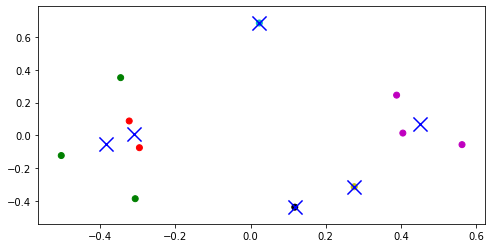

Document  238



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


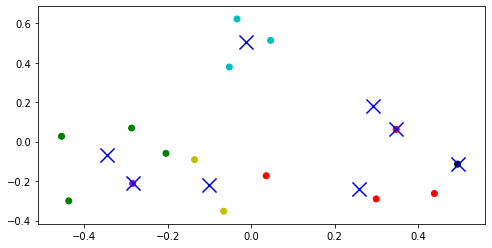

Document  239



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


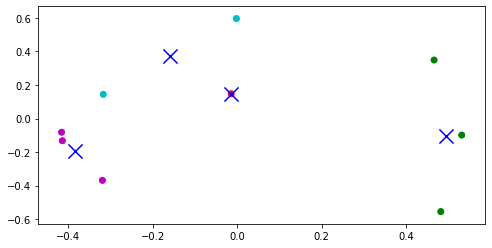

Document  240

Visualization is not possible for text with redundant data
Document  241



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


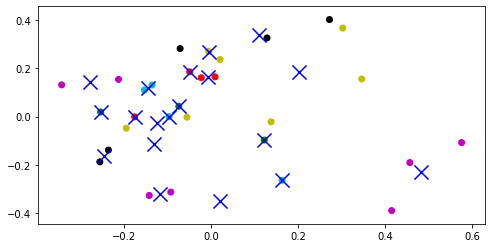

Document  242



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


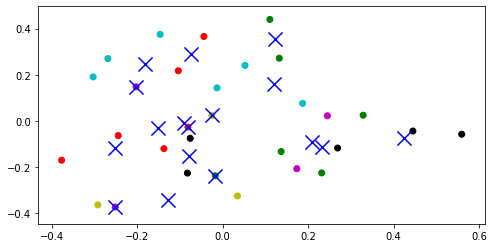

Document  243



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


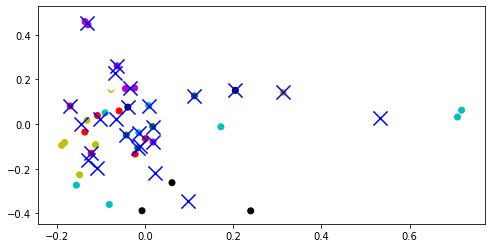

Document  244



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


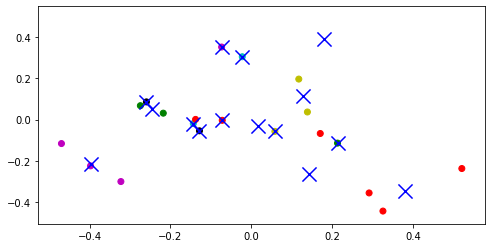

Document  245



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


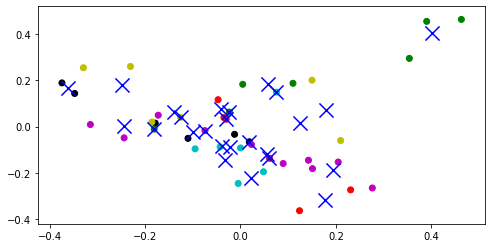

Document  246



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


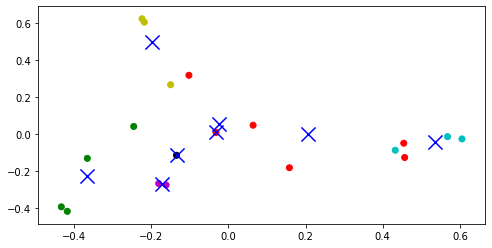

Document  247



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


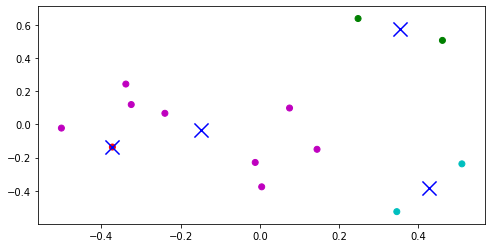

Document  248



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


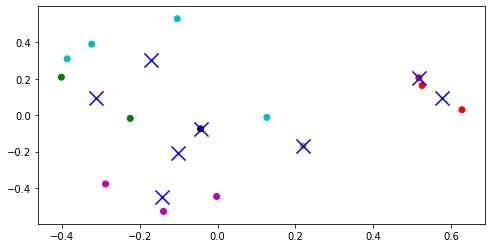

Document  249



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


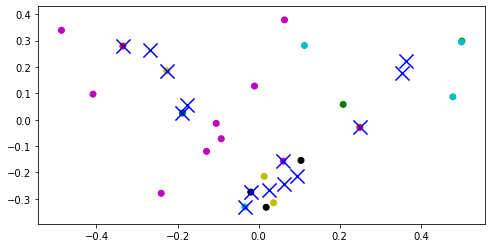

Document  250



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


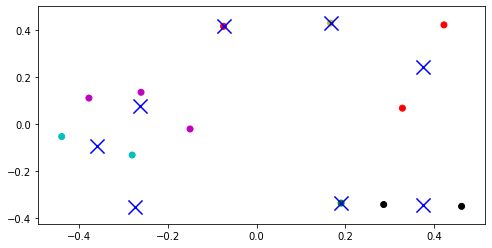

Document  251



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


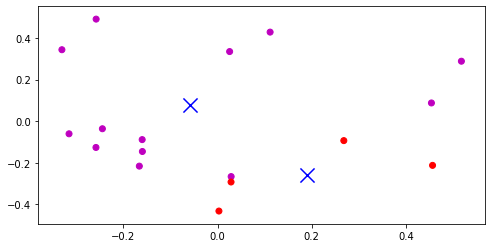

Document  252



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


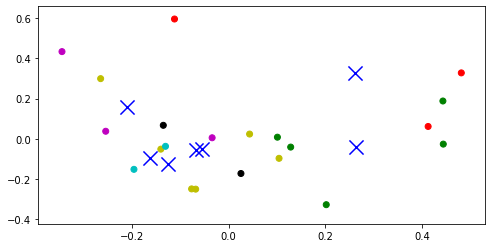

Document  253

Visualization is not possible for text with redundant data
Document  254



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


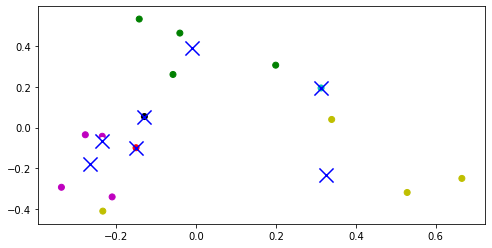

Document  255



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


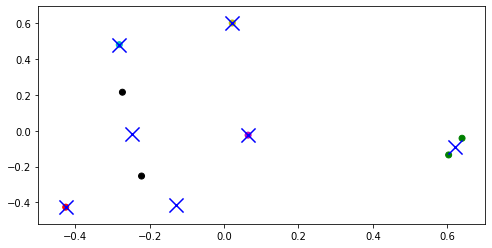

Document  256



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


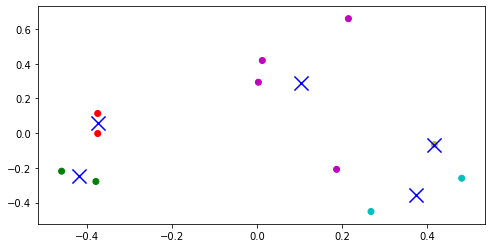

Document  257



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


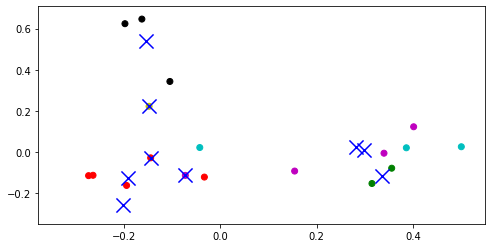

Document  258



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


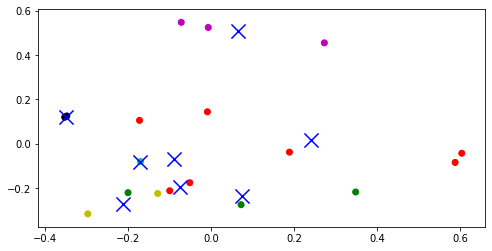

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  259



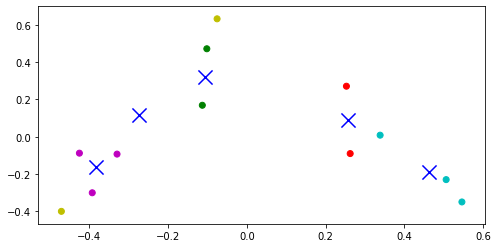

Document  260



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


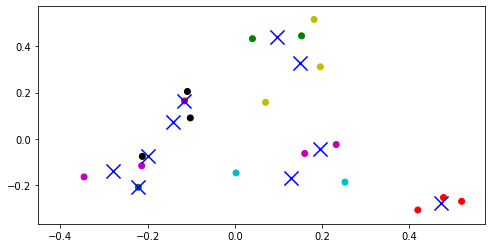

Document  261



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


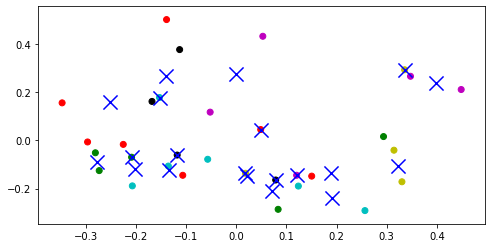

Document  262



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


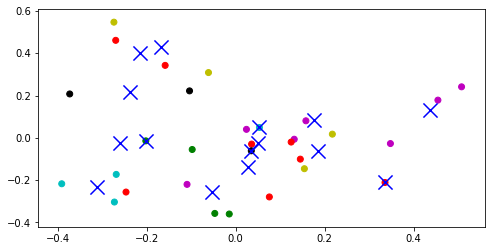

Document  263



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


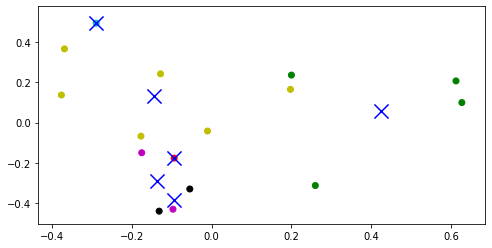

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  264



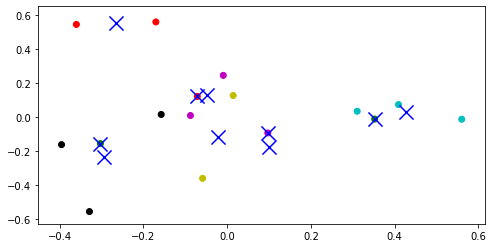

Document  265



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


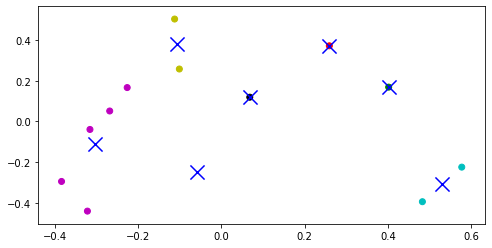

Document  266



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


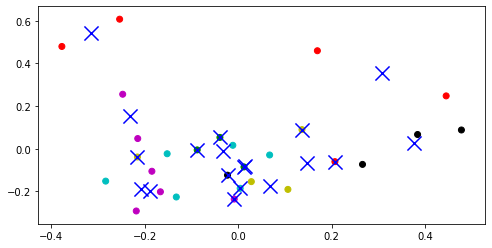

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  267



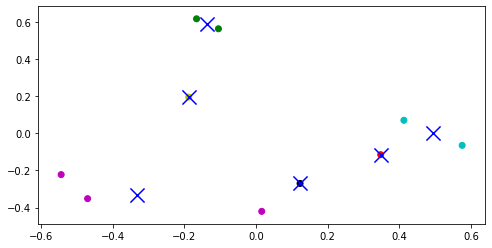

Document  268



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


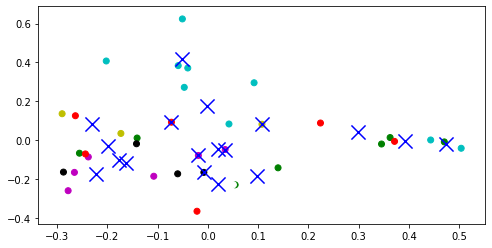

Document  269



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


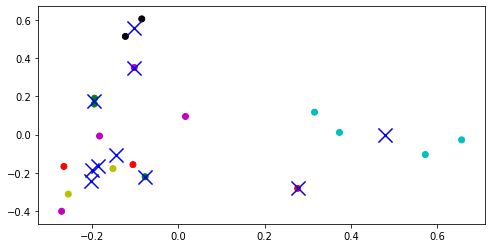

Document  270



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


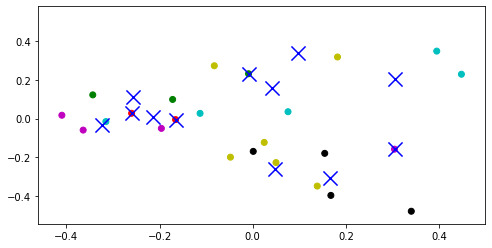

Document  271



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


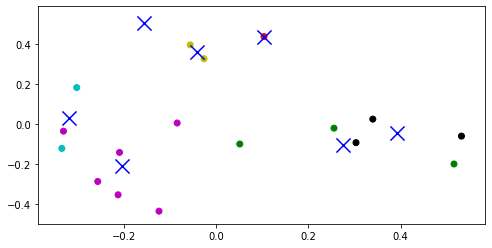

Document  272



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


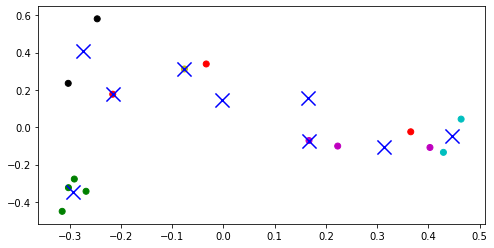

Document  273



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


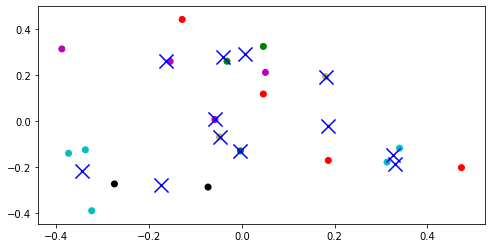

Document  274



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


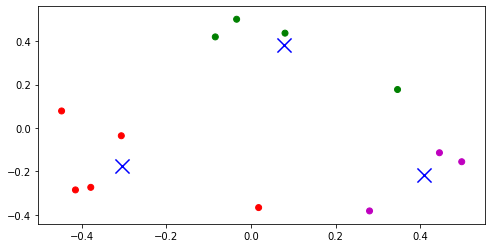

Document  275



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


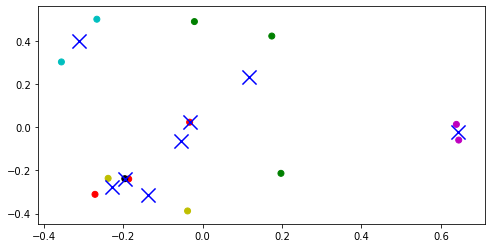

Document  276



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


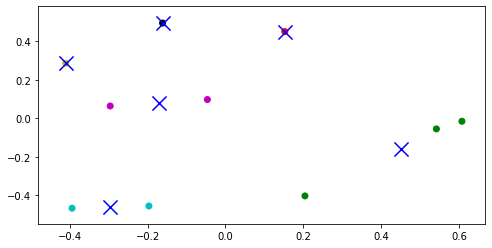

Document  277



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


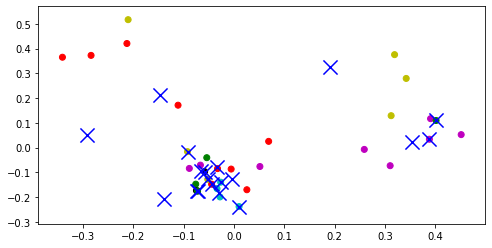

Document  278



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


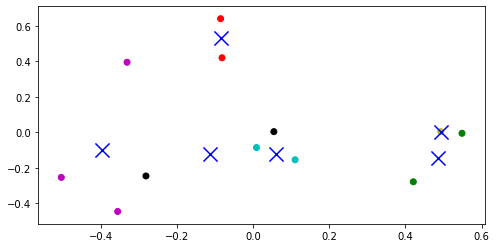

Document  279



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


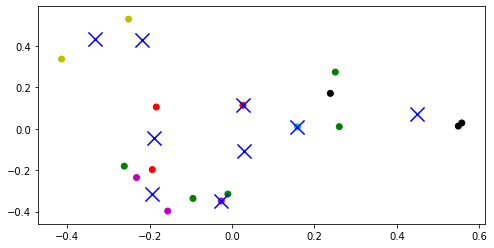

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  280



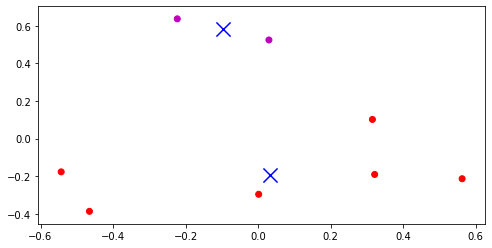

Document  281



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


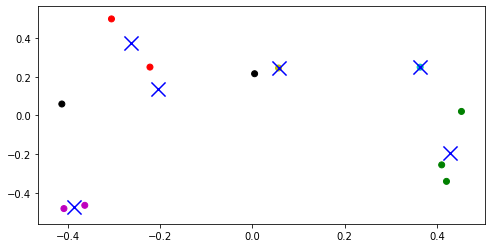

Document  282



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


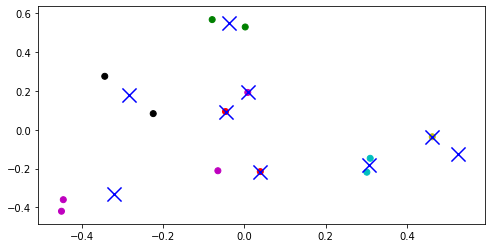

Document  283



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


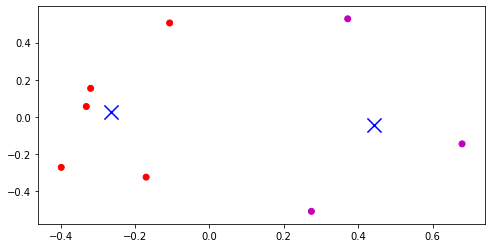

Document  284



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


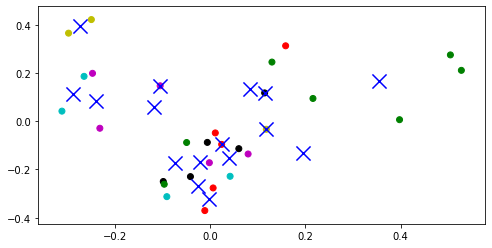

Document  285



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


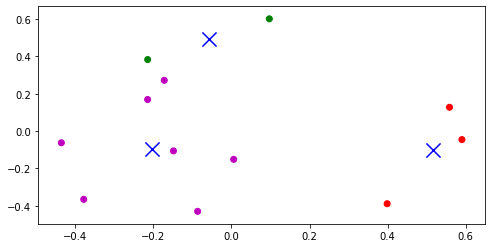

Document  286



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


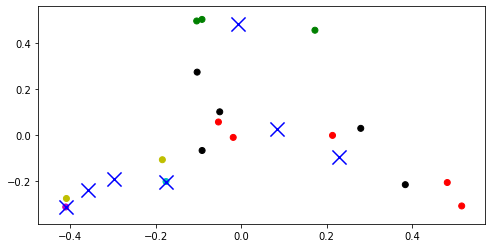

Document  287



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


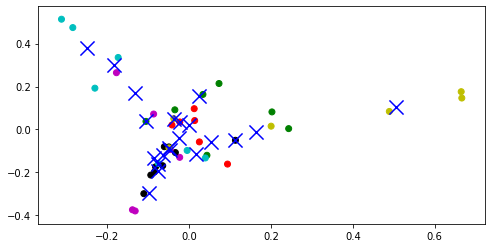

Document  288



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


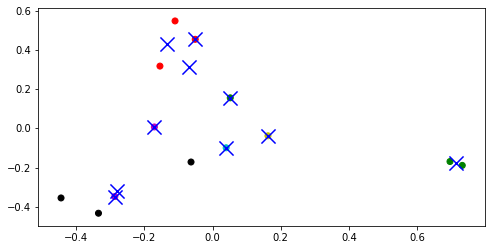

Document  289



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


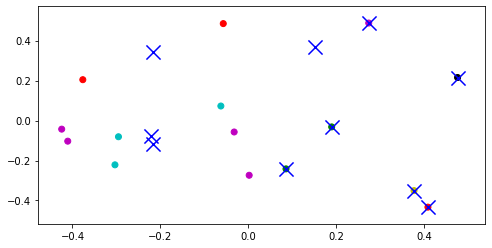

Document  290



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


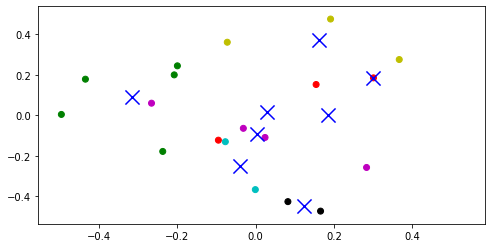

Document  291



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


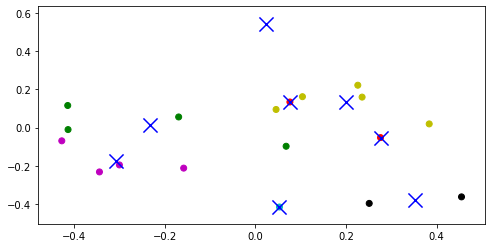

Document  292



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


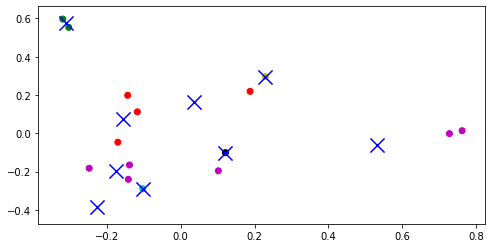

Document  293



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


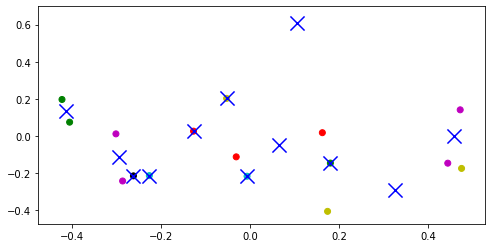

Document  294



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


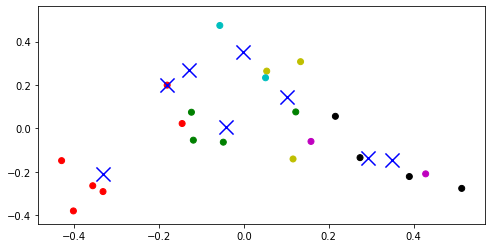

Document  295



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


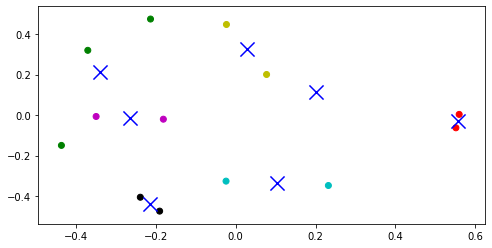

Document  296



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


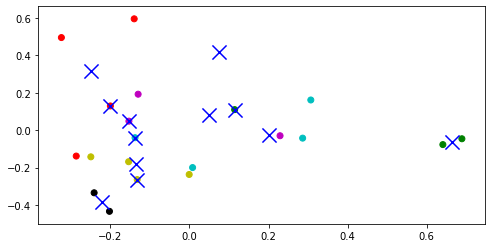

Document  297



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


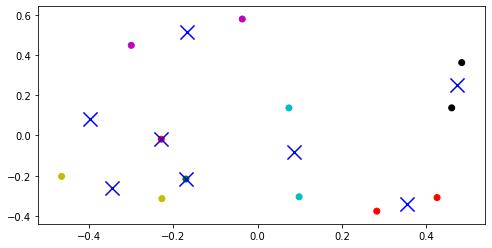

Document  298



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


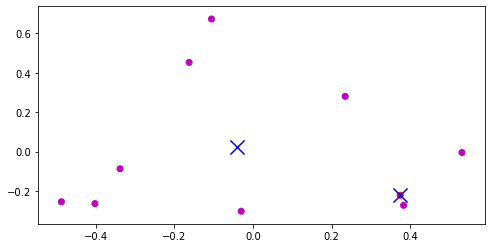

Document  299



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


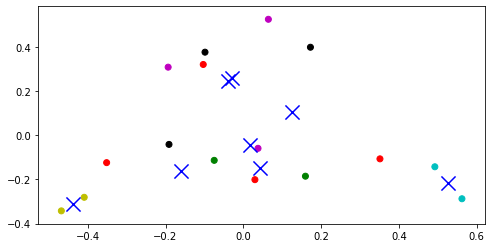

Document  300



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


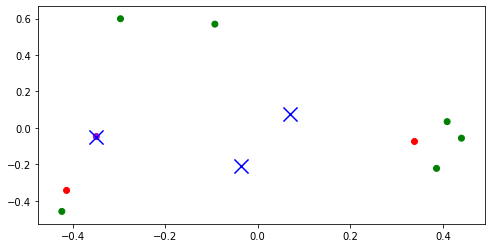

Document  301



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


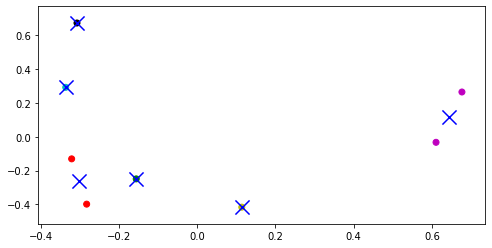

Document  302



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


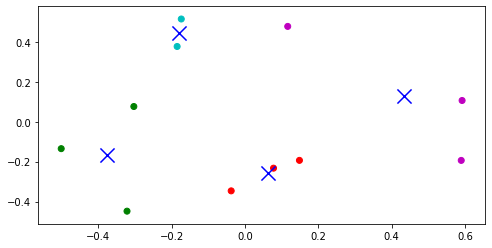

Document  303



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


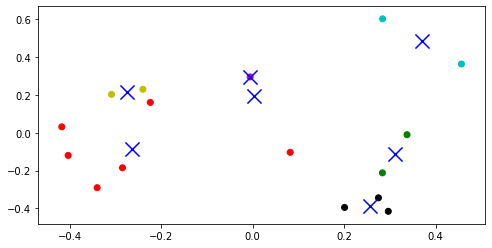

Document  304



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


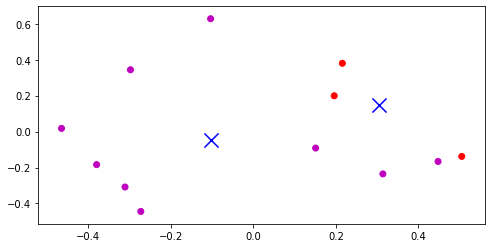

Document  305



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


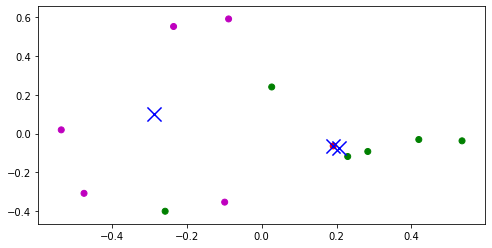

Document  306



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


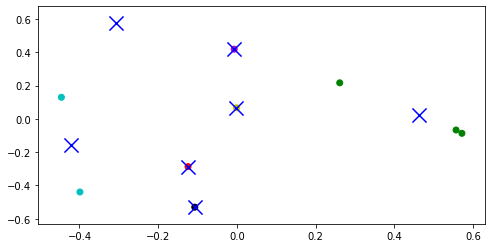

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  307



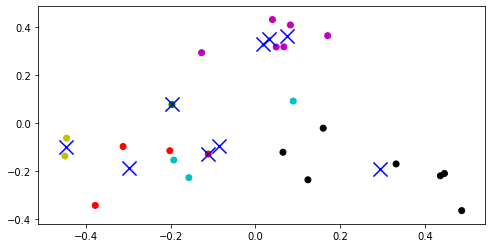

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  308



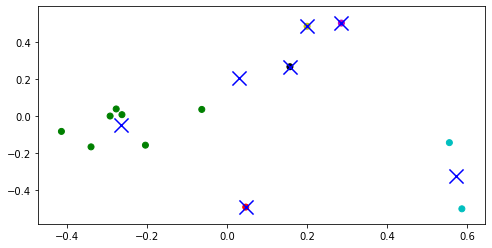

Document  309



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


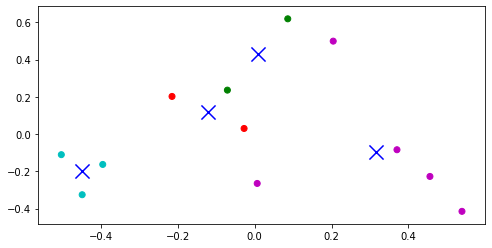

Document  310



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


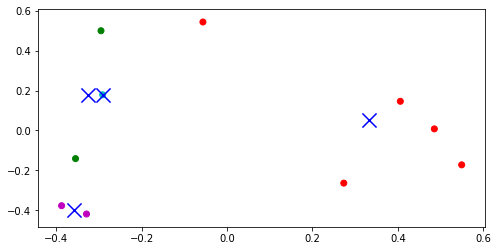

Document  311



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


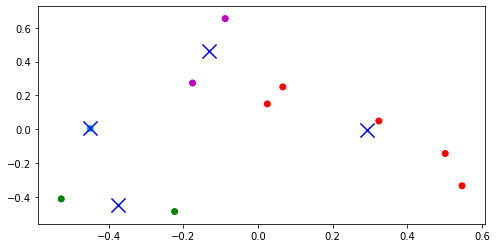

Document  312



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


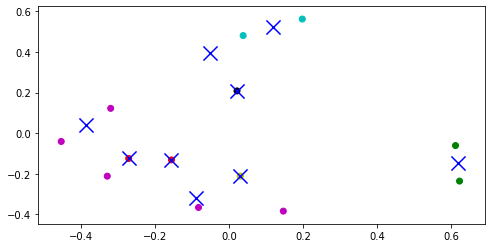

Document  313



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


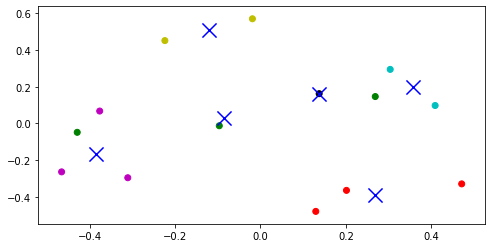

Document  314



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


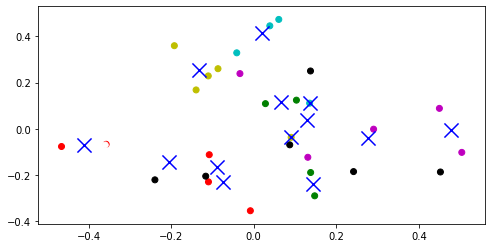

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  315



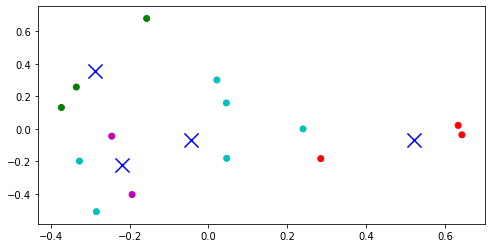

Document  316



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


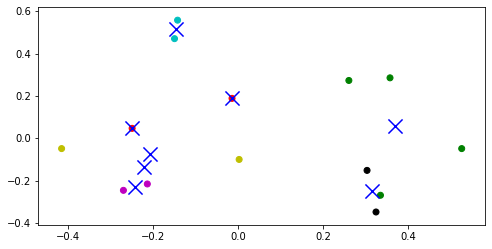

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  317



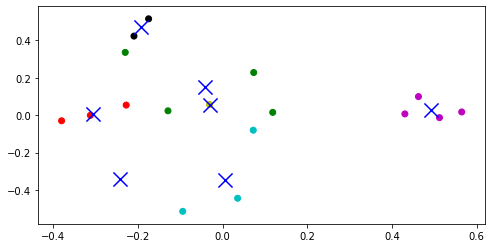

Document  318



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


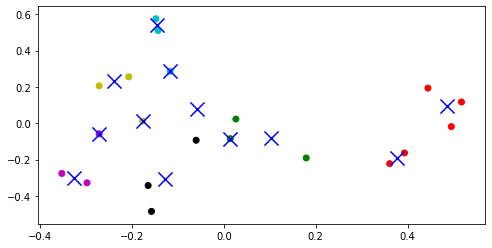

Document  319



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


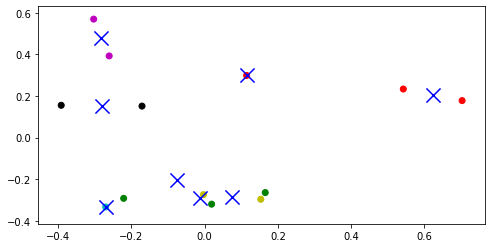

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  320



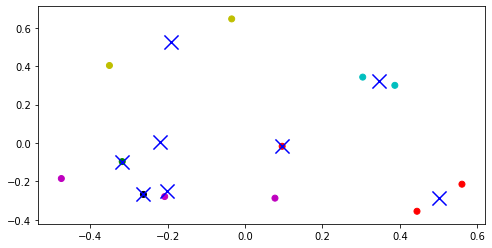

Document  321



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


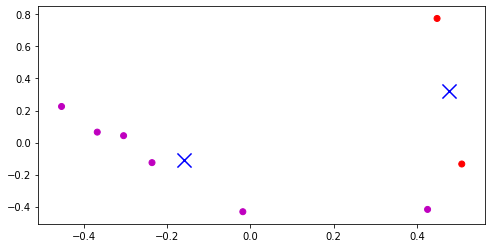

Document  322



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


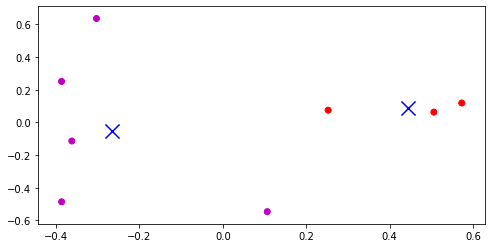

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  323



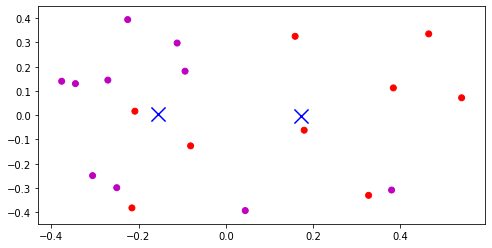

Document  324



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


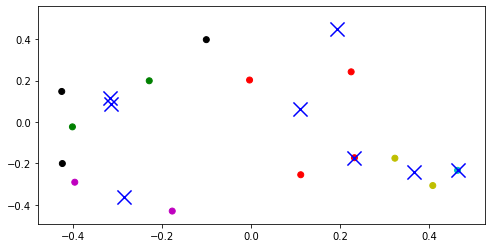

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  325



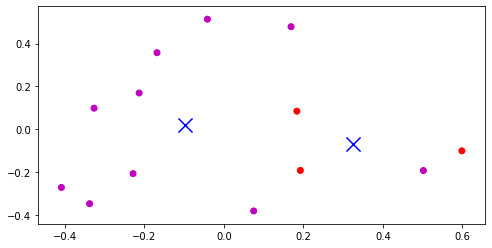

Document  326



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


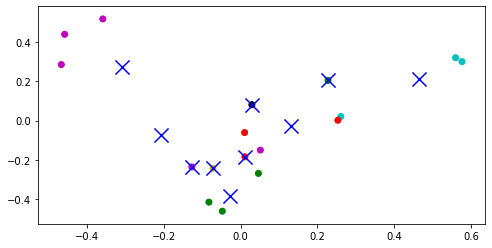

Document  327



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


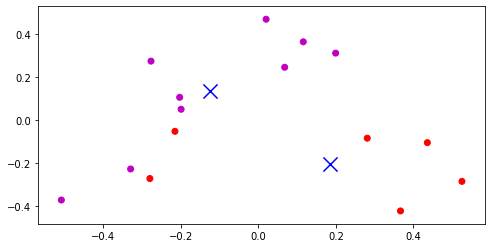

Document  328



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


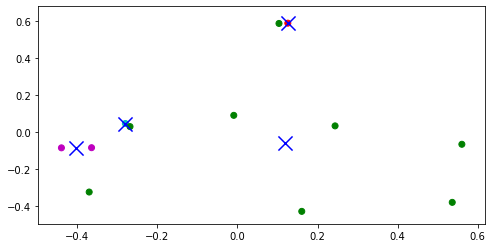

Document  329



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


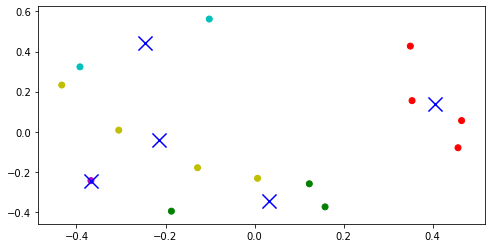

Document  330



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


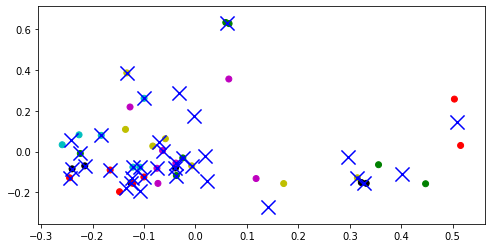

Document  331



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


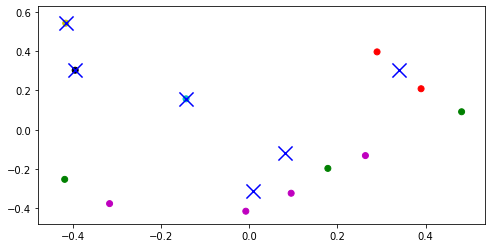

Document  332



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


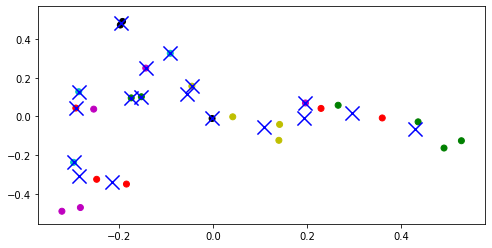

Document  333

Visualization is not possible for text with redundant data
Document  334



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


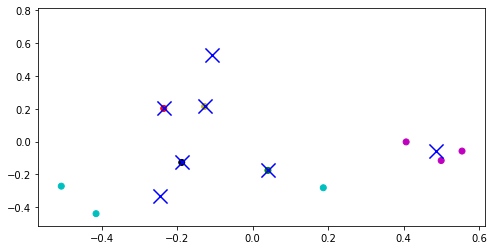

Document  335



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


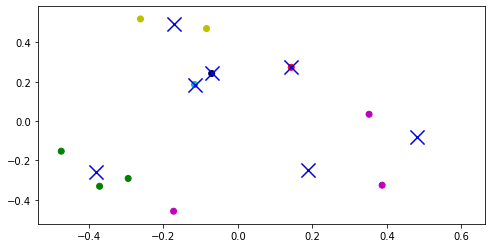

Document  336



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


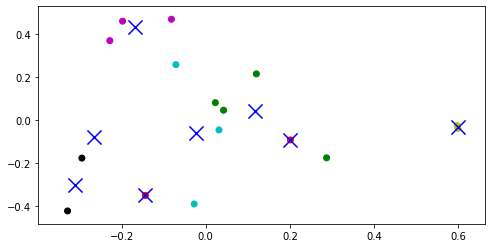

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  337



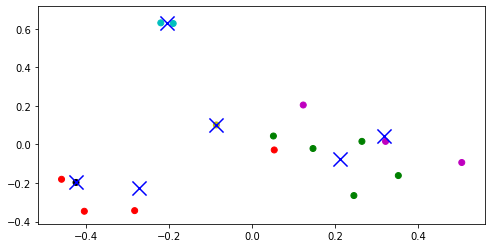

Document  338



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


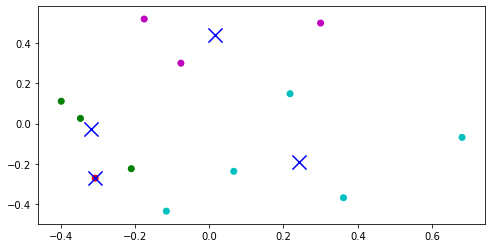

Document  339



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


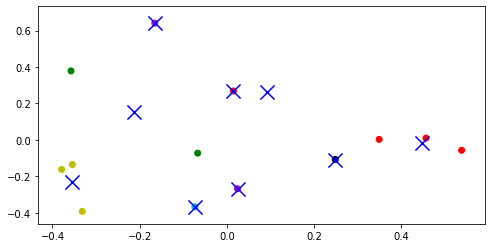

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  340



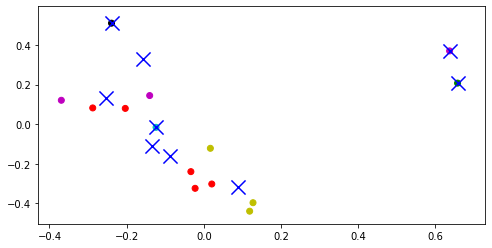

Document  341



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


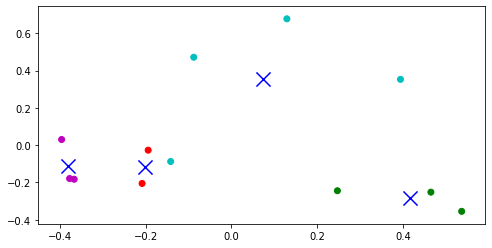

Document  342



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


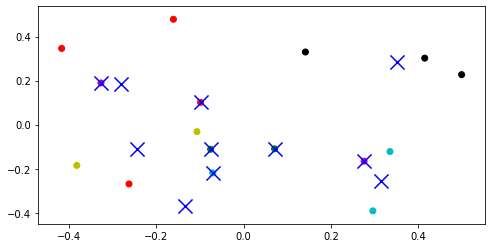

Document  343



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


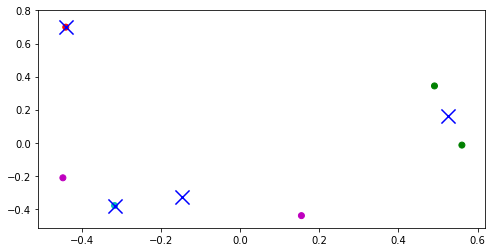

Document  344



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


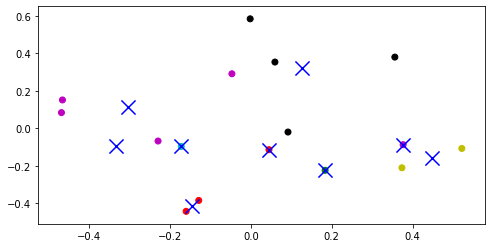

Document  345



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


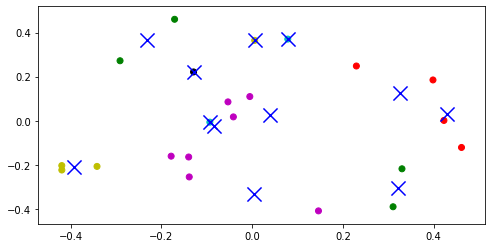

Document  346



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


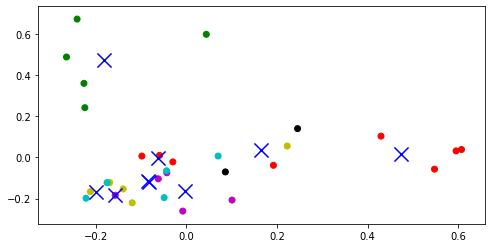

Document  347



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


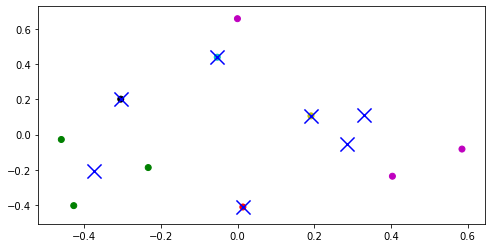

Document  348



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


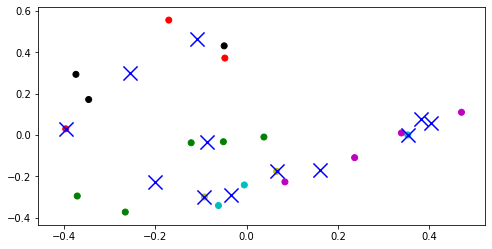

Document  349



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


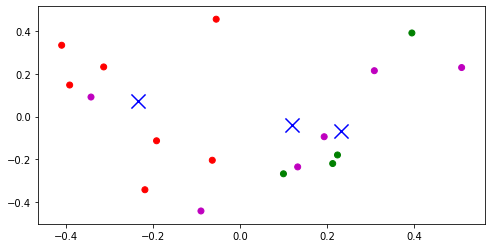

Document  350



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


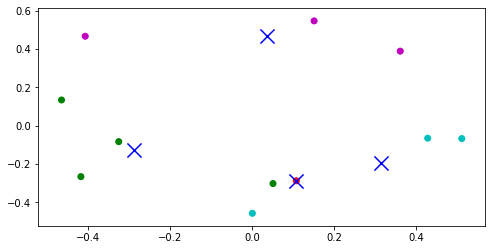

Document  351



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


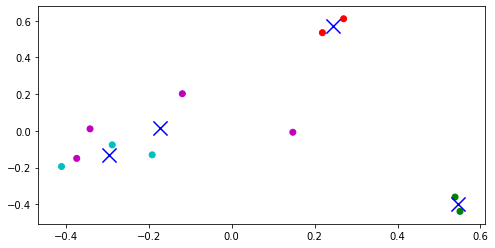

Document  352



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


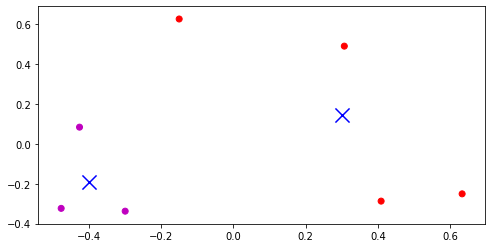

Document  353



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


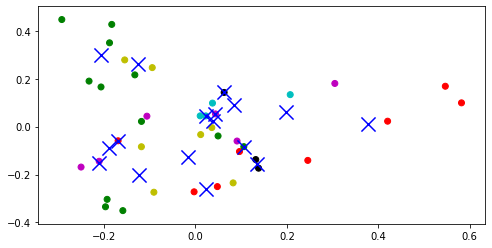

Document  354



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


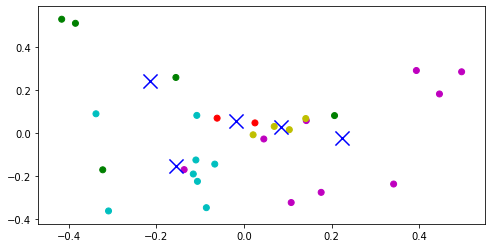

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  355



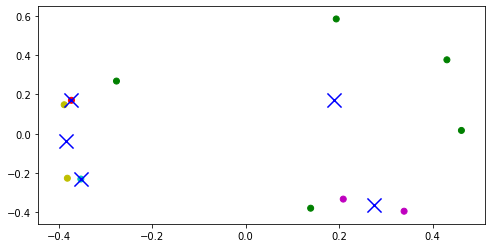

Document  356

Visualization is not possible for text with redundant data
Document  357



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


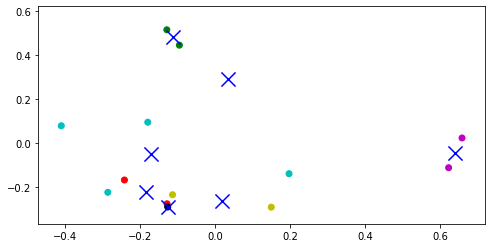

Document  358



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


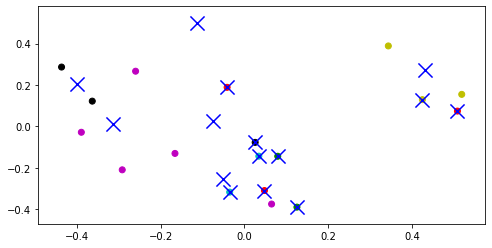

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  359



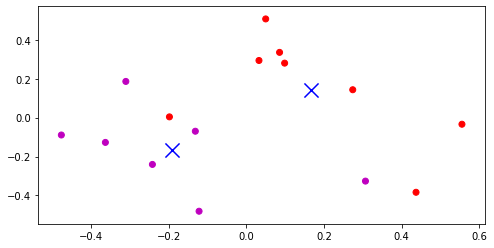

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  360



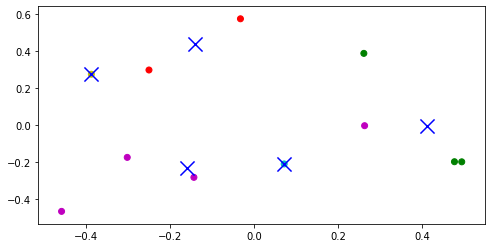

Document  361



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


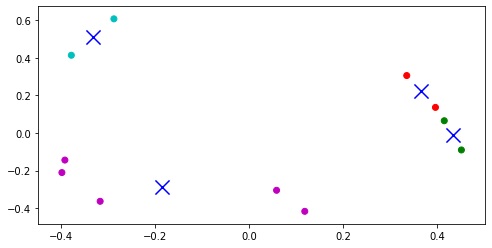

Document  362



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


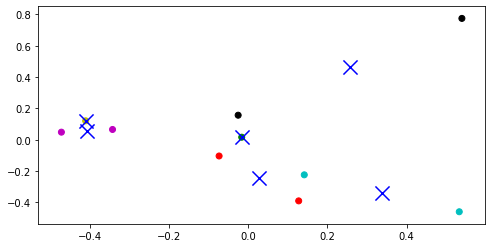

Document  363



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


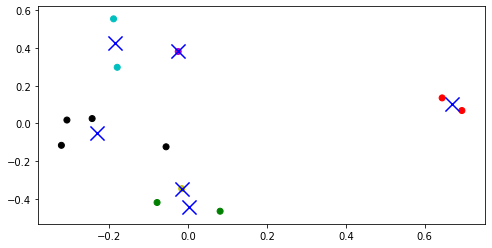

Document  364



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


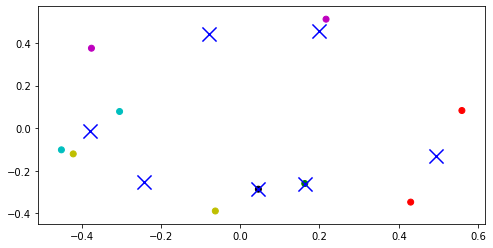

Document  365

Visualization is not possible for text with redundant data
Document  366



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


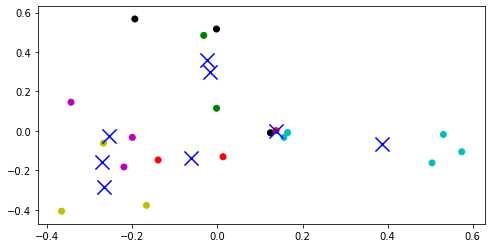

Document  367



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


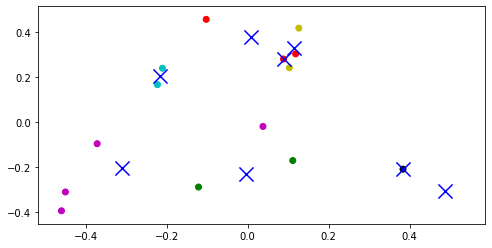

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  368



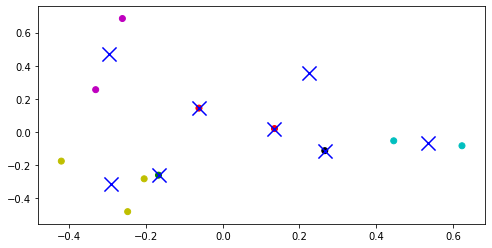

Document  369



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


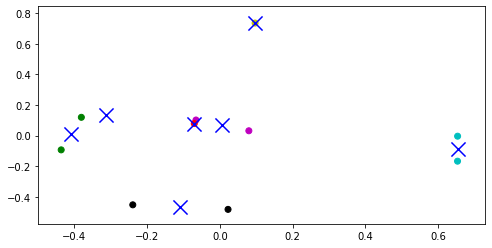

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  370



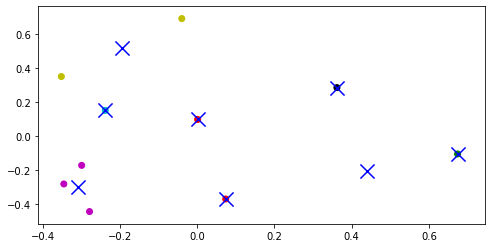

Document  371

Visualization is not possible for text with redundant data
Document  372



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


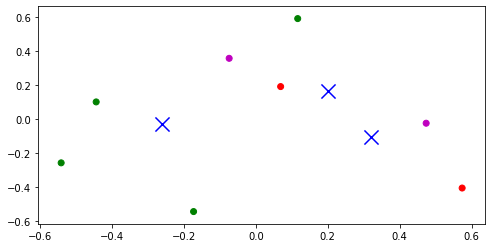

Document  373



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


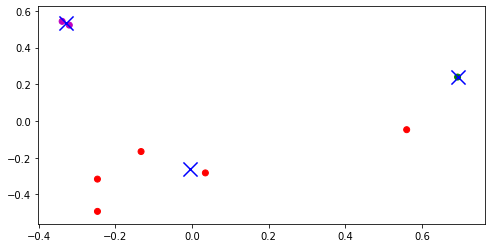

Document  374



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


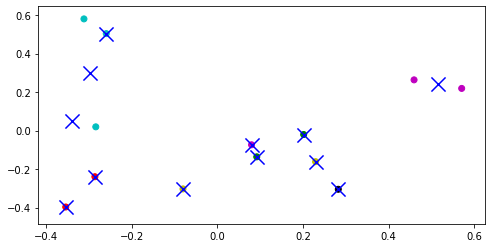

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  375



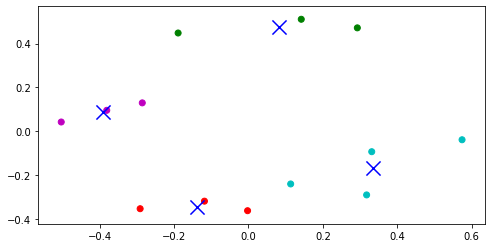

Document  376



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


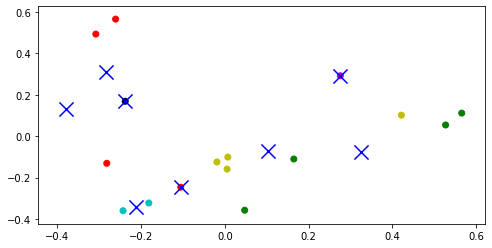

Document  377



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


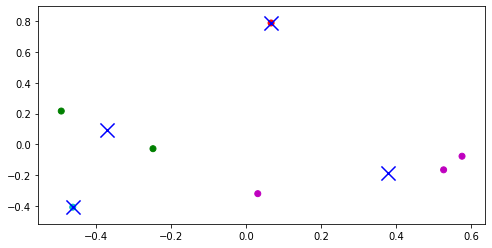

Document  378



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


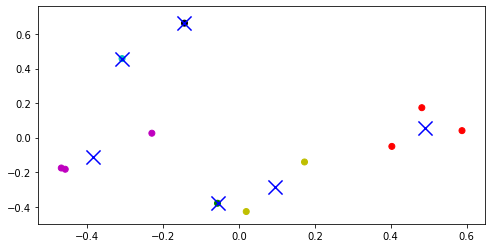

Document  379



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


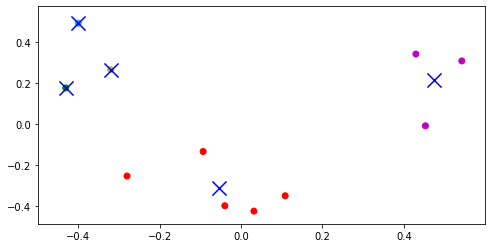

Document  380



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


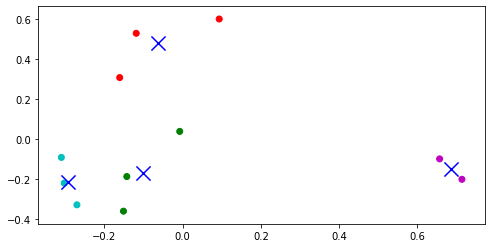

Document  381



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


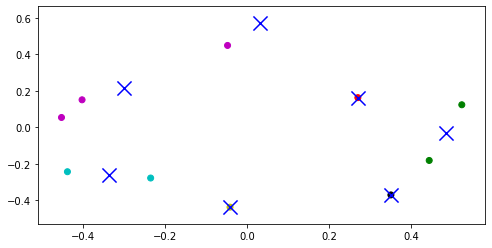

Document  382



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


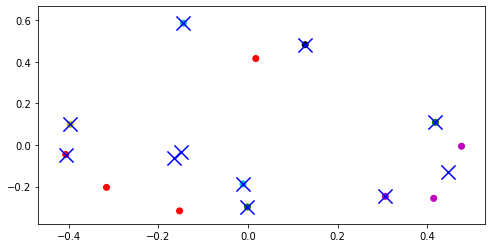

Document  383



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


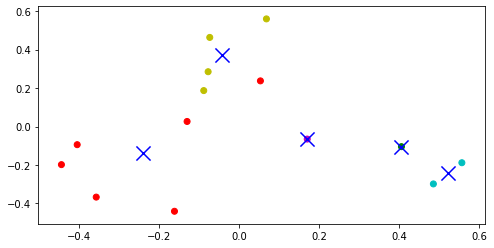

Document  384



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


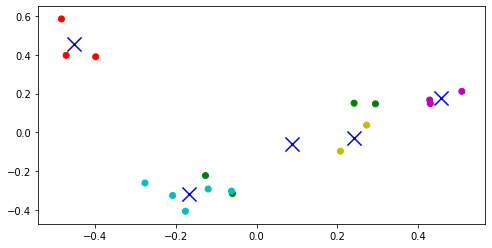

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  385



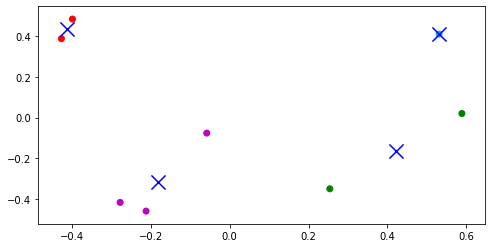

Document  386



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


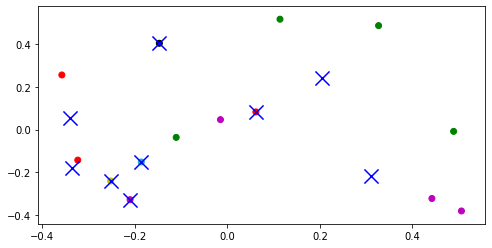

Document  387



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


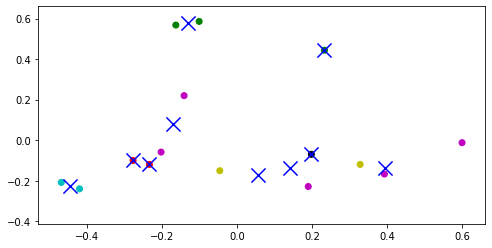

Document  388



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


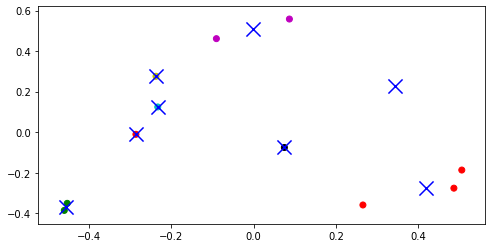

Document  389



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


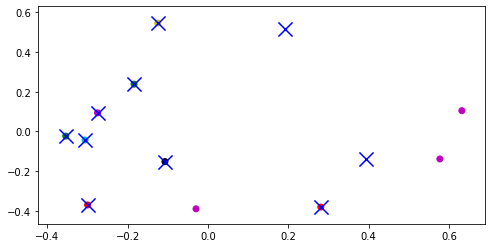

Document  390



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


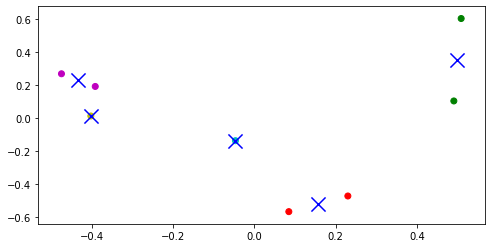

Document  391



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


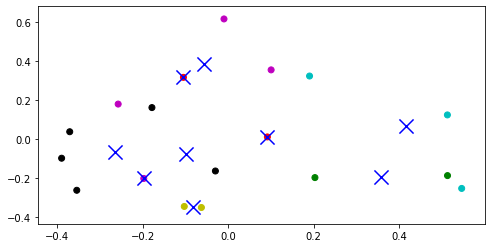

Document  392



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


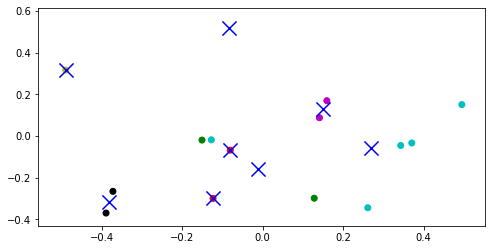

Document  393



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


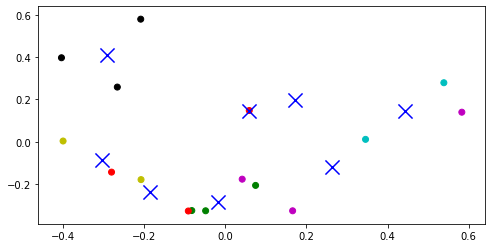

Document  394



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


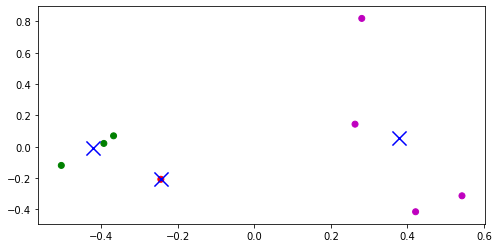

Document  395



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


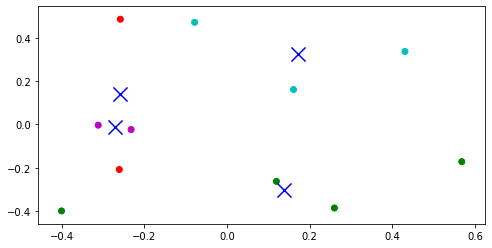

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  396



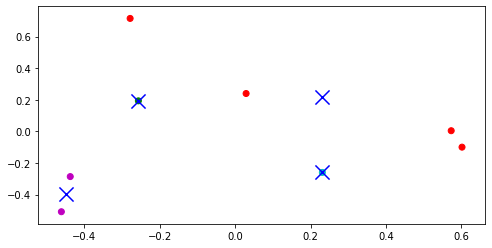

Document  397



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


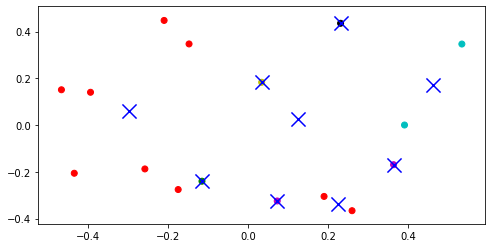

Document  398



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


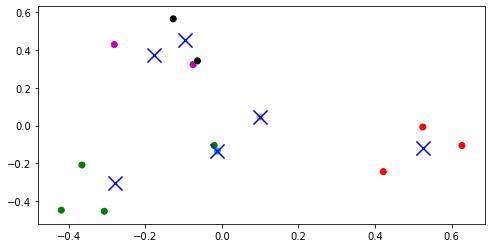

Document  399



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


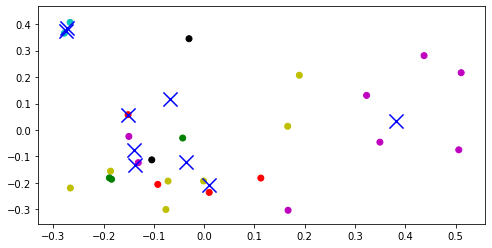

Document  400



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


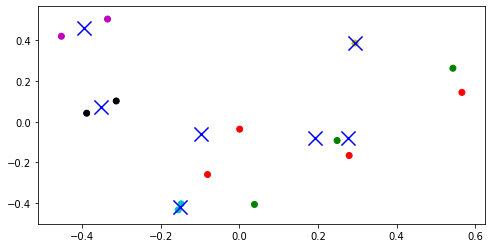

Document  401



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


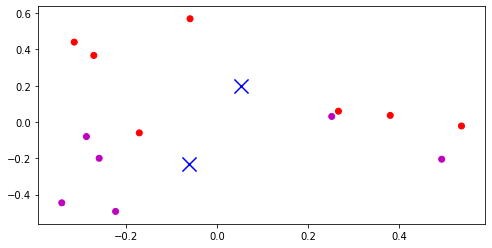

Document  402



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


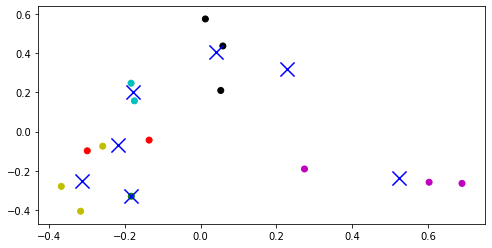

Document  403



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


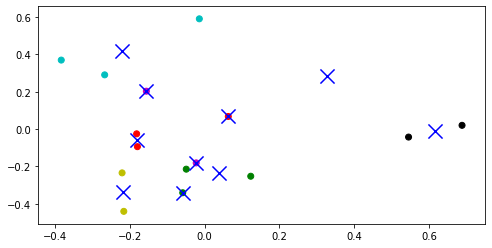

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  404



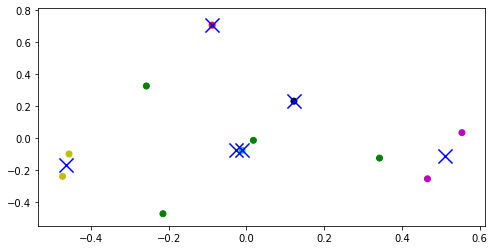

Document  405



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


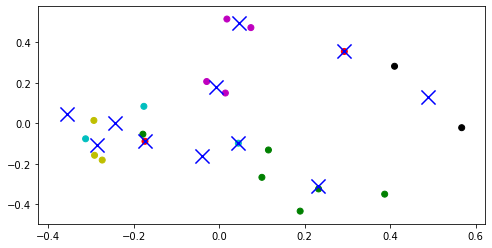

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  406



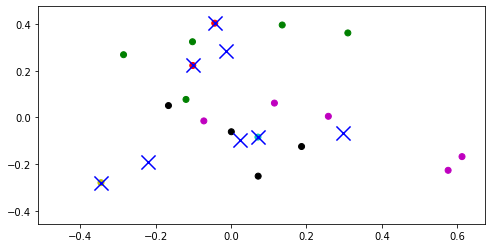

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  407



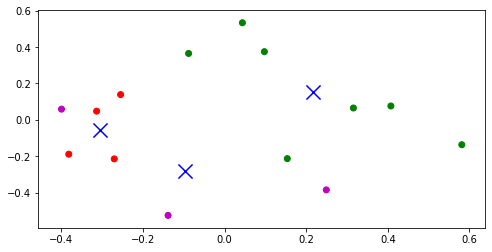

Document  408



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


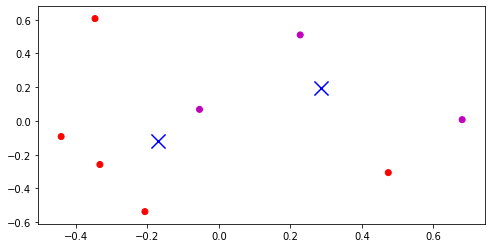

Document  409



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


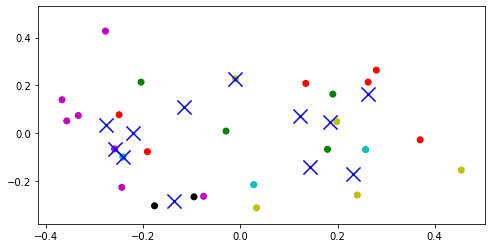

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  410



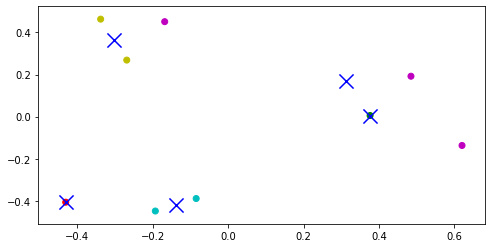

Document  411



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


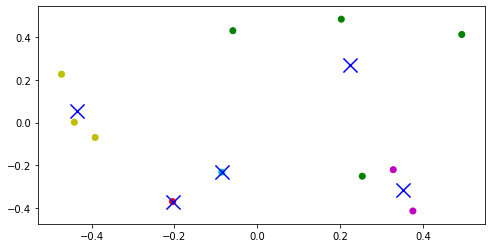

Document  412



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


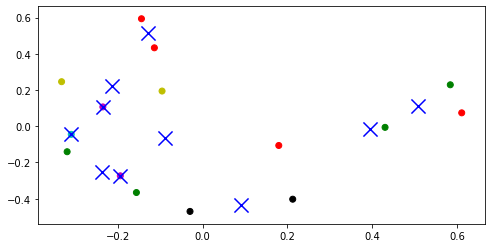

Document  413



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


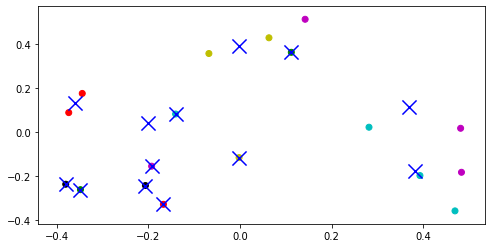

Document  414



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


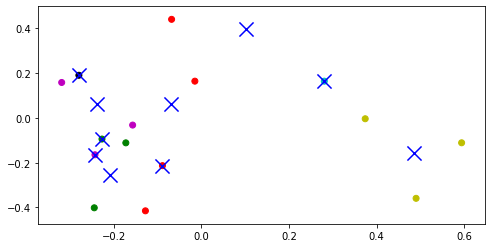

Document  415



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


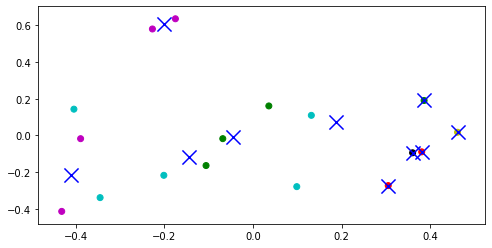

Document  416

Visualization is not possible for text with redundant data
Document  417



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


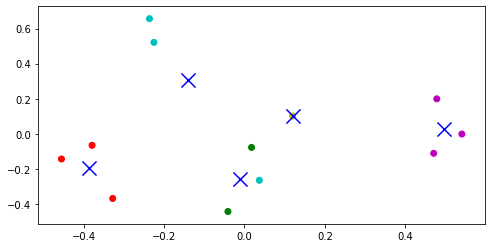

Document  418



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


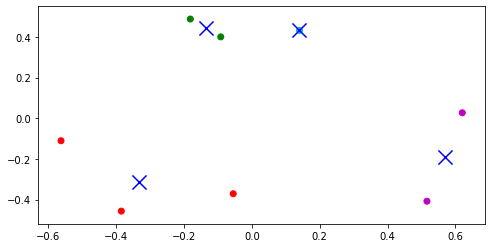

Document  419



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


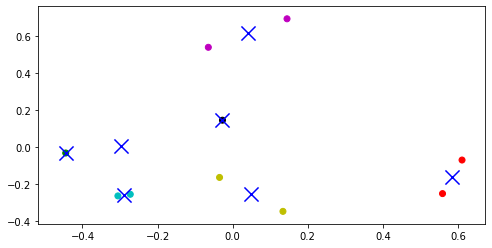

Document  420



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


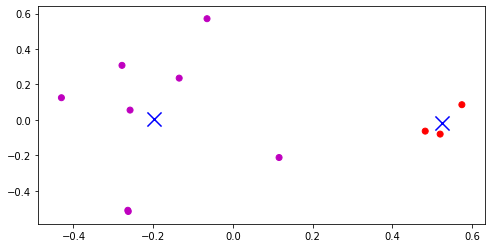

Document  421



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


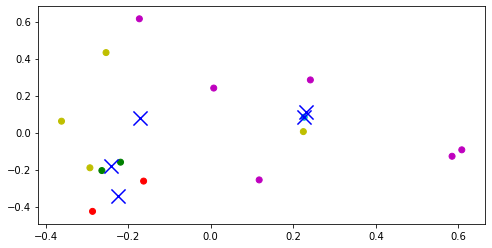

Document  422



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


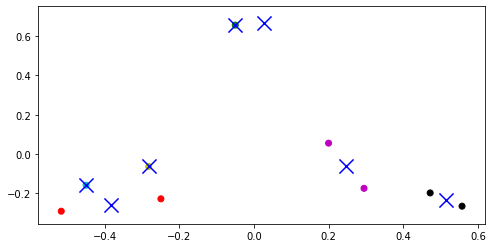

Document  423



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


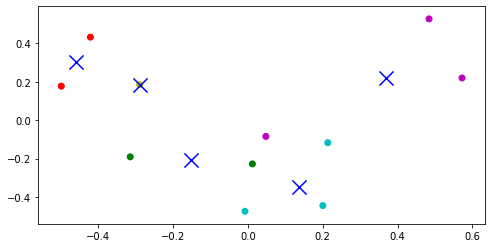

Document  424



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


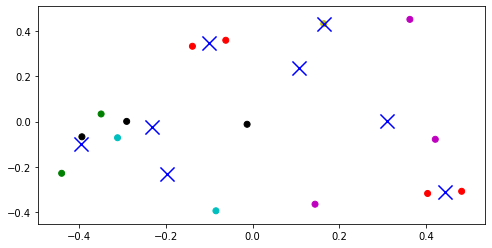

Document  425



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


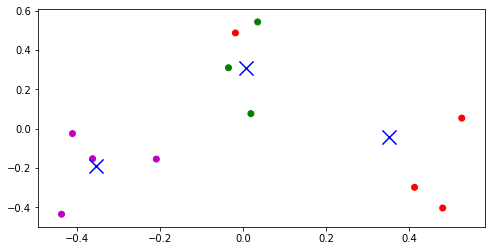

Document  426



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


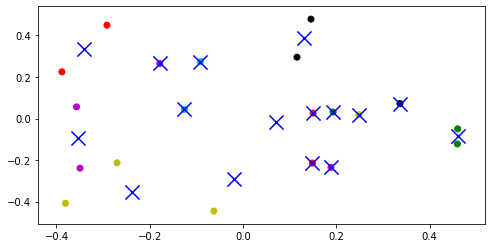

Document  427



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


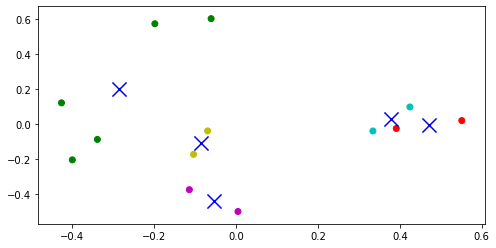

Document  428



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


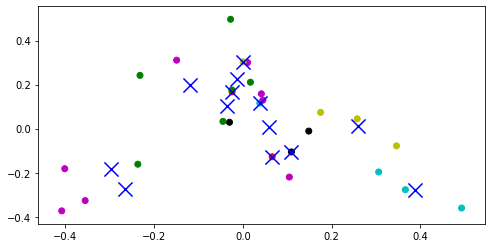

Document  429



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


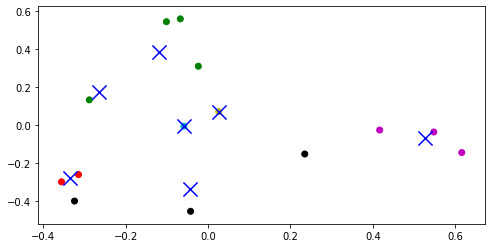

Document  430



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


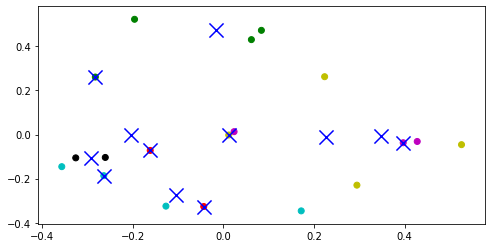

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  431



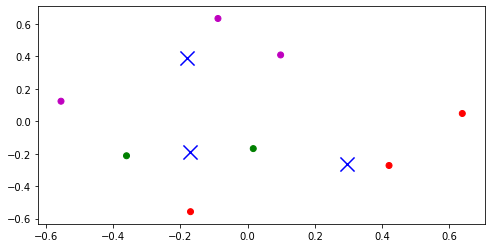

Document  432



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


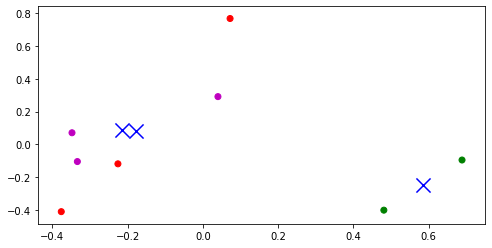

Document  433



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


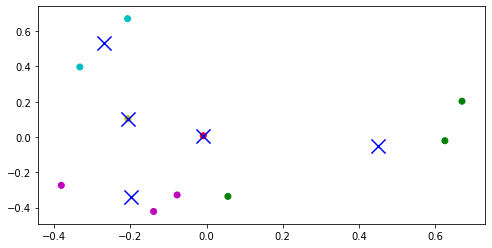

Document  434



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


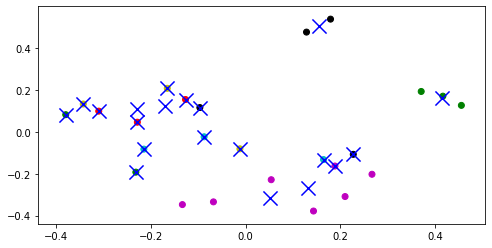

Document  435



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


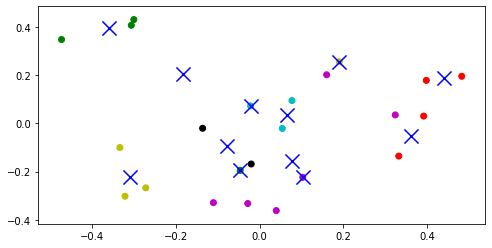

Document  436



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


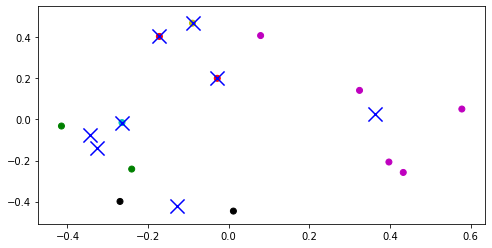

Document  437



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


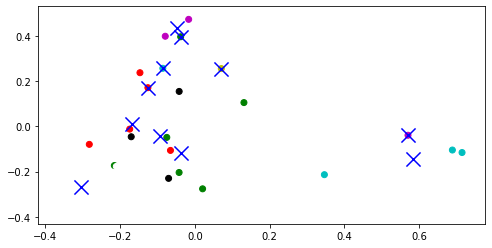

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  438

Visualization is not possible for text with redundant data
Document  439



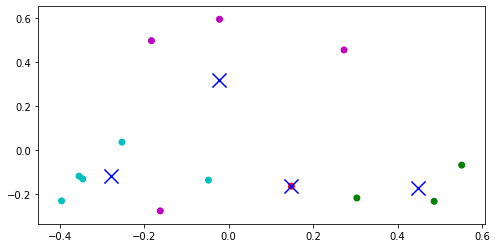

Document  440



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


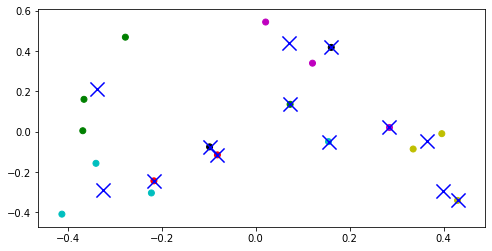

Document  441



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


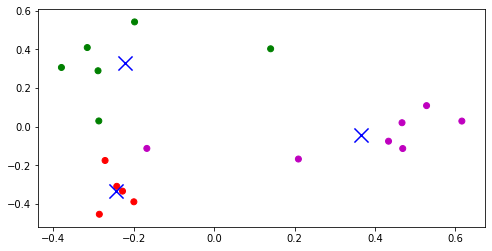

Document  442



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


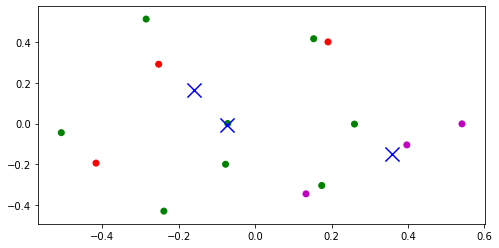

Document  443



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


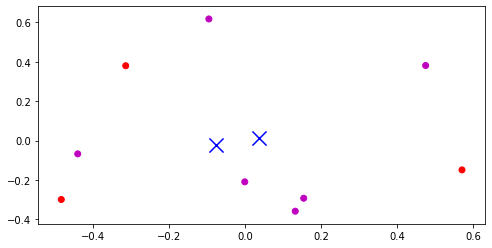

Document  444



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


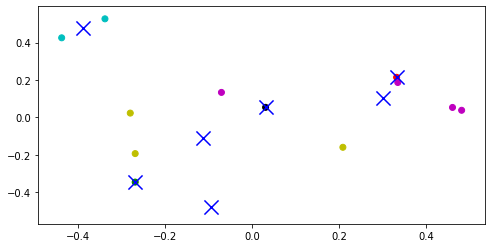

Document  445



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


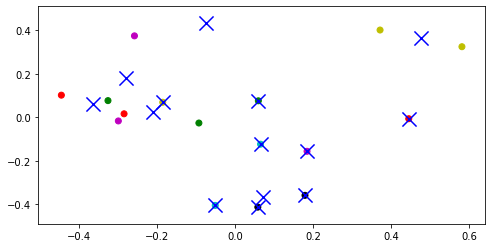

Document  446



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


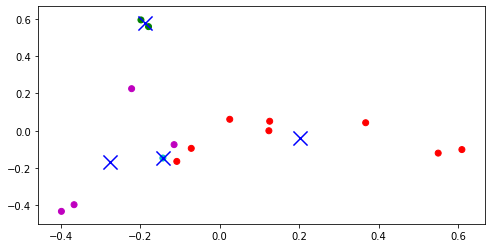

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  447

Visualization is not possible for text with redundant data
Document  448



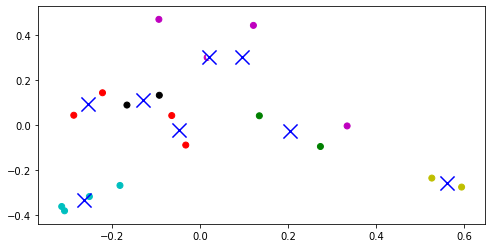

Document  449



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


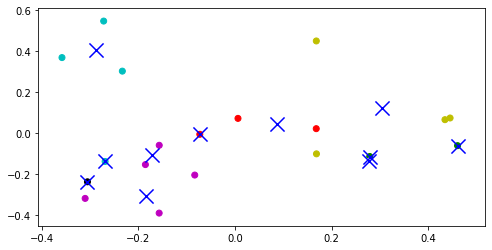

Document  450



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


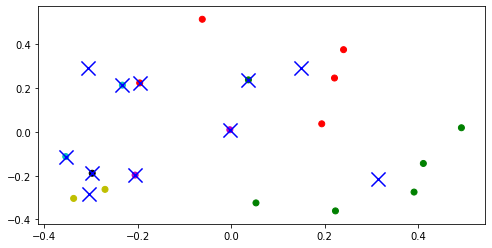

Document  451



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


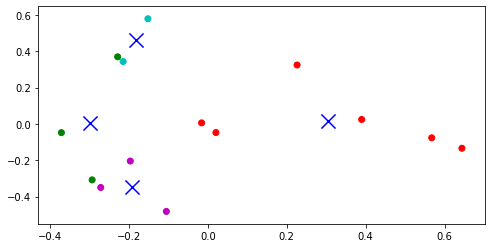

Document  452



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


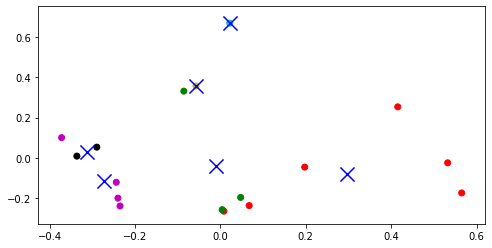

Document  453



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


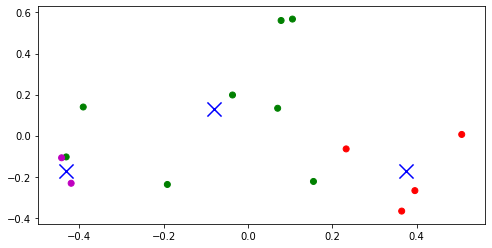

Document  454



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


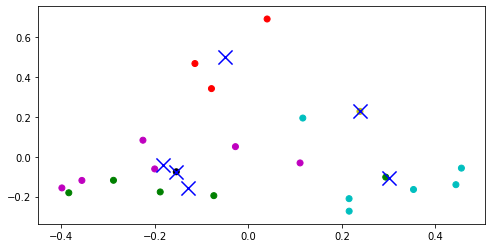

Document  455



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


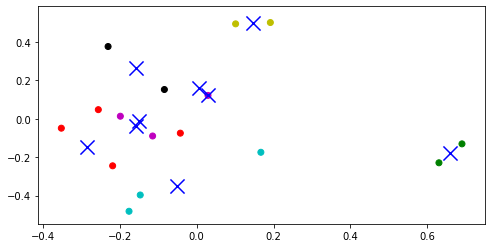

Document  456



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


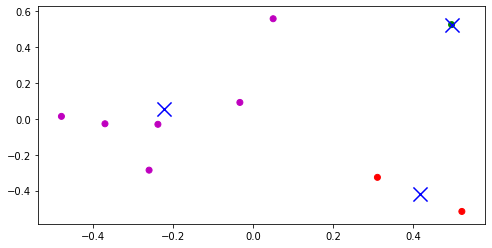

Document  457



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


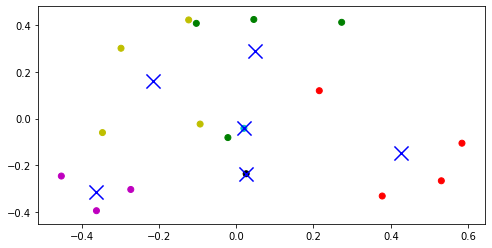

Document  458



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


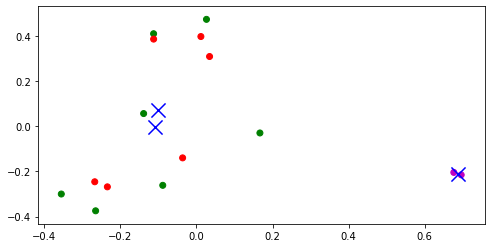

Document  459



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


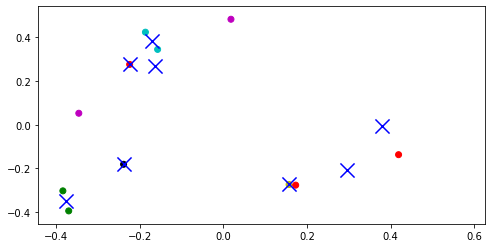

Document  460



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


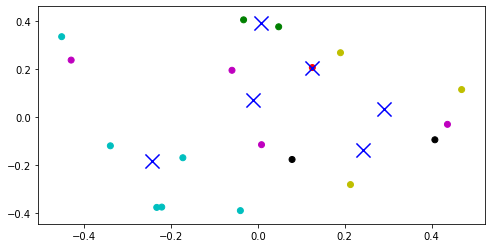

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  461



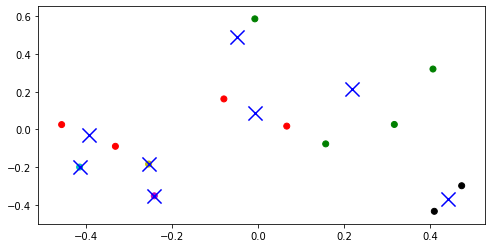

Document  462



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


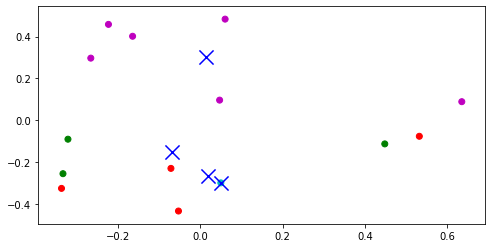

Document  463



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


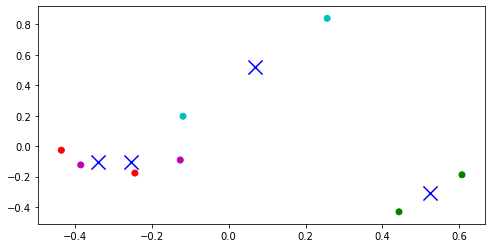

Document  464



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


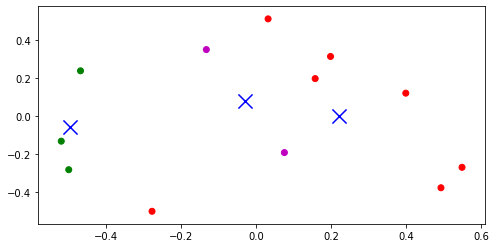

Document  465



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


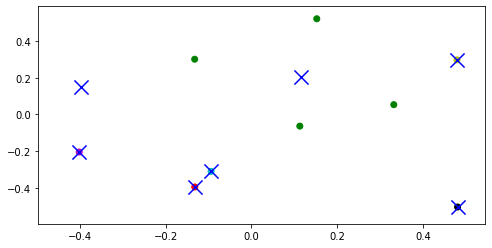

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  466



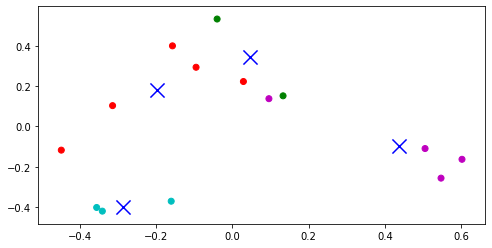

Document  467



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


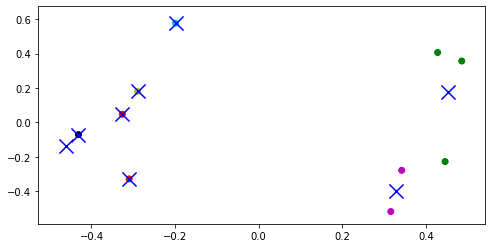

Document  468



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


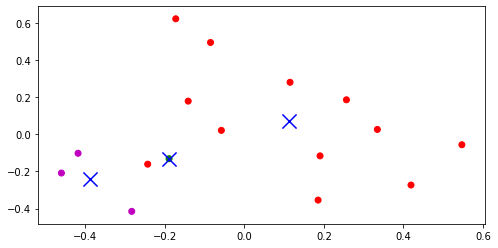

Document  469



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


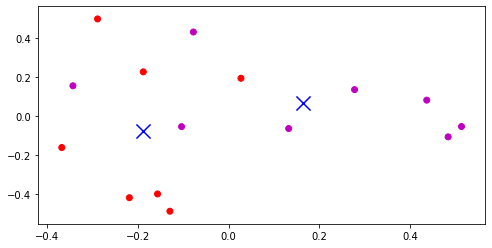

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  470



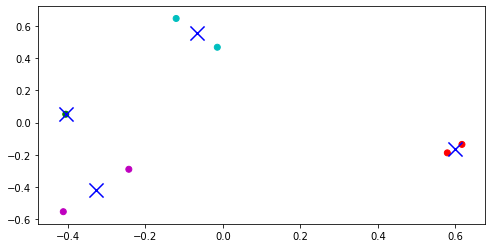

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  471



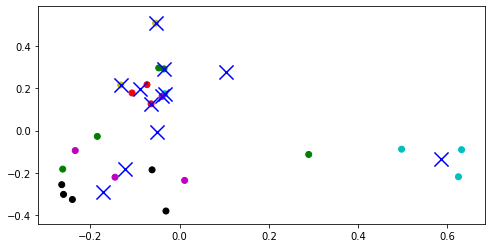

Document  472



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


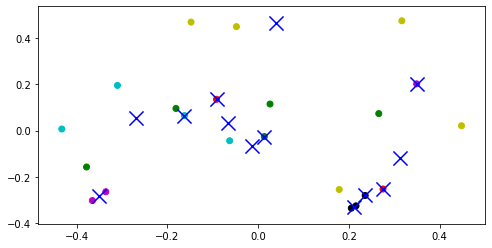

Document  473



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


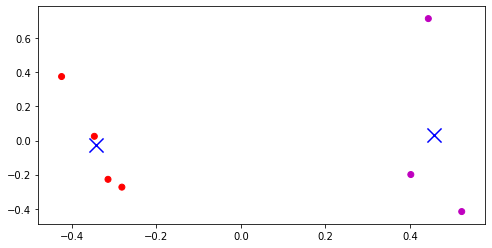

Document  474



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


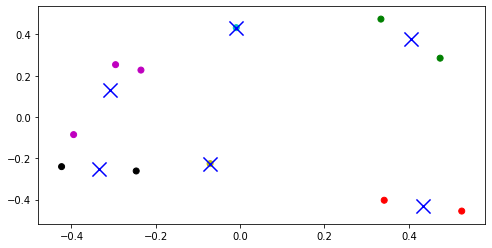

Document  475



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


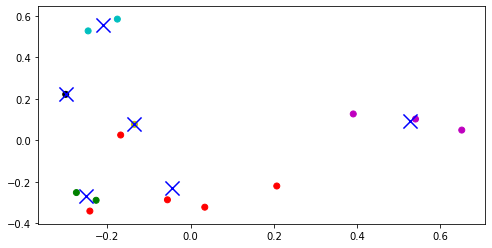

Document  476



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


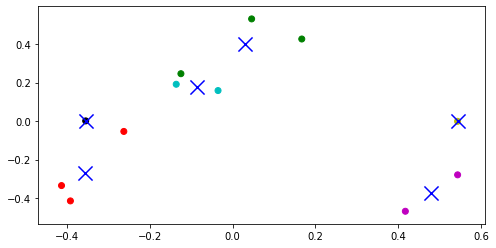

Document  477



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


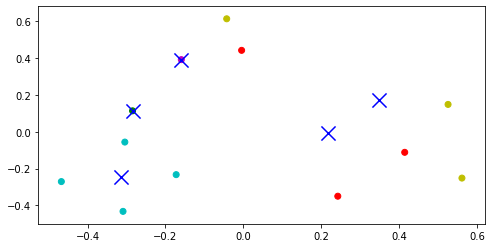

Document  478



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


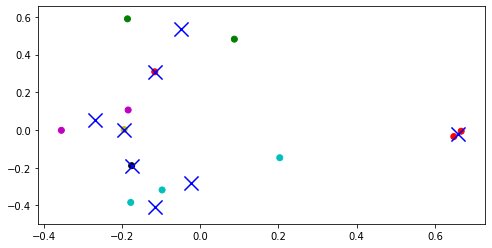

Document  479



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


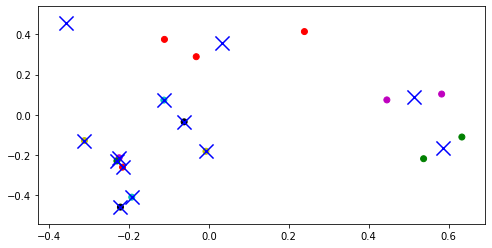

Document  480



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


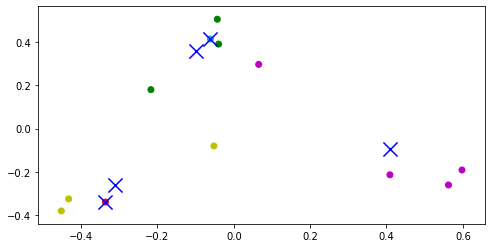

Document  481



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


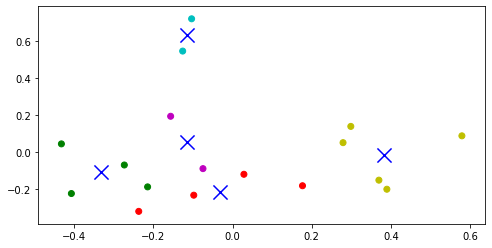

Document  482



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


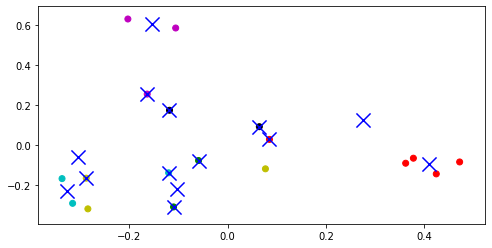

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  483



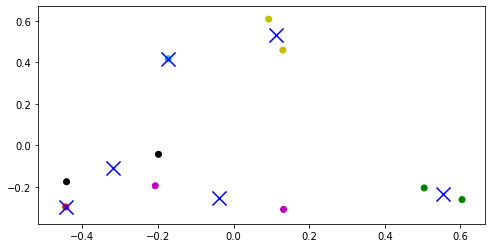

Document  484



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


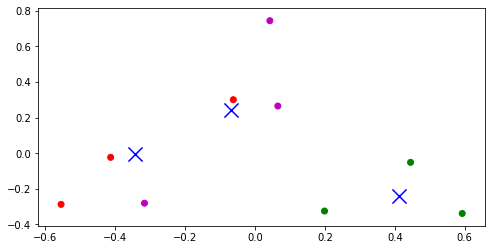

Document  485



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


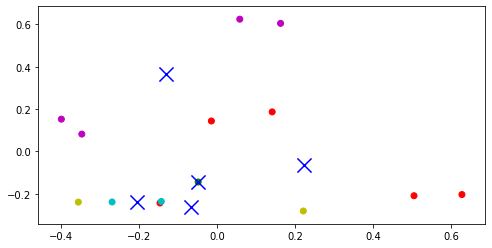

Document  486



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


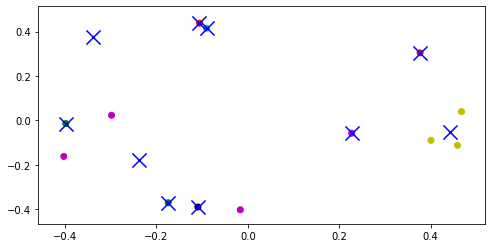

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  487



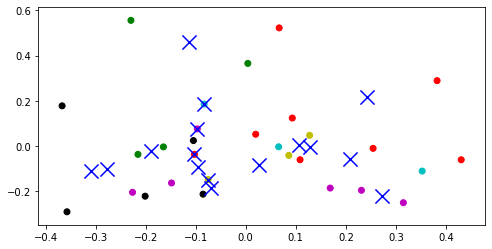

Document  488



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


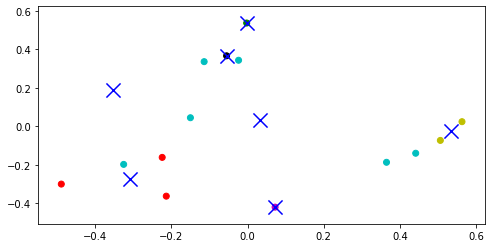

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  489



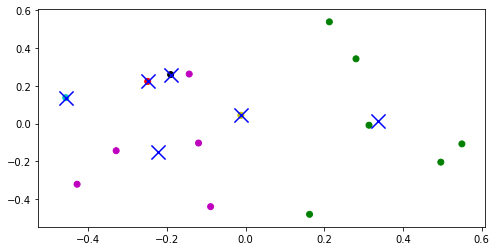

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  490



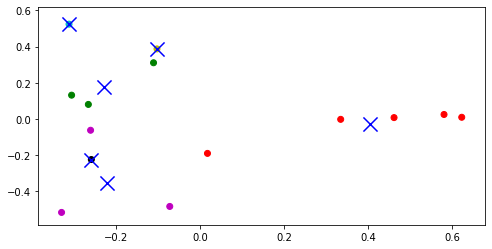

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  491



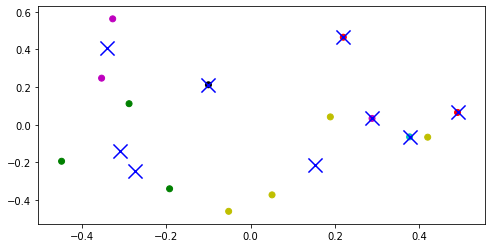

Document  492



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


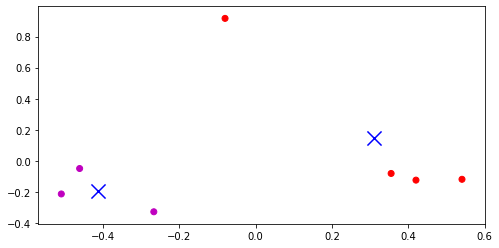

Document  493

Visualization is not possible for text with redundant data
Document  494

Visualization is not possible for text with redundant data
Document  495



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


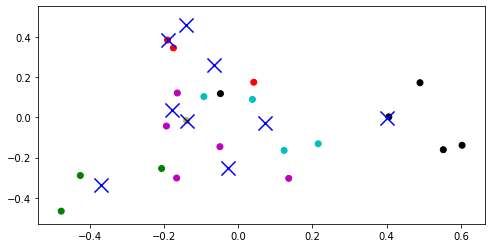

Document  496



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


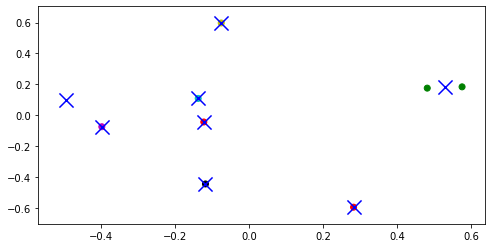

Document  497



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


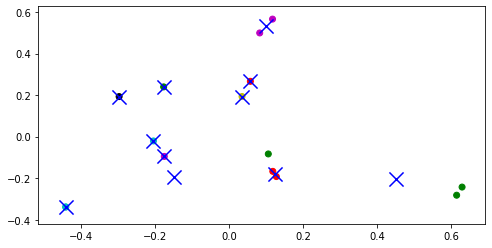

Document  498



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


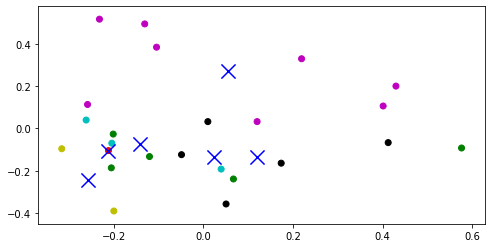

Document  499



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


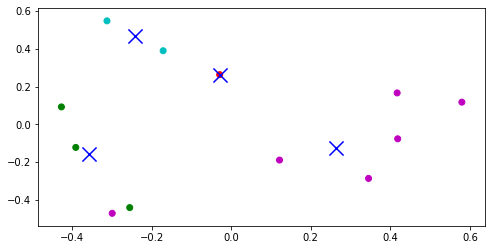

Document  500



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


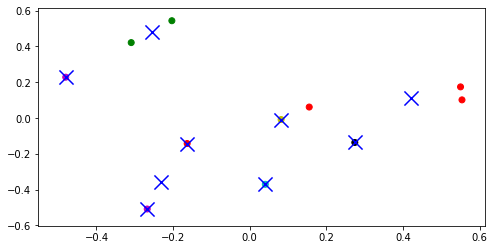

Document  501



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


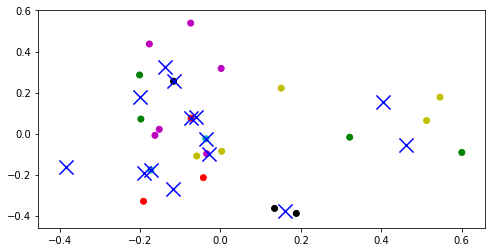

Document  502



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


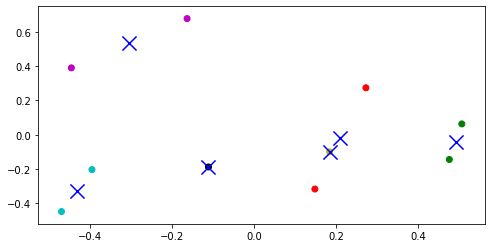

Document  503



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


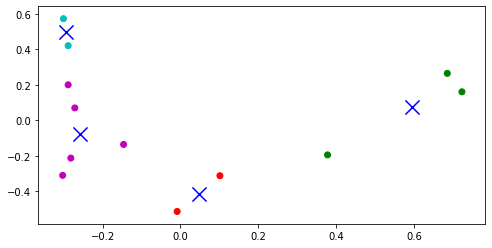

Document  504



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


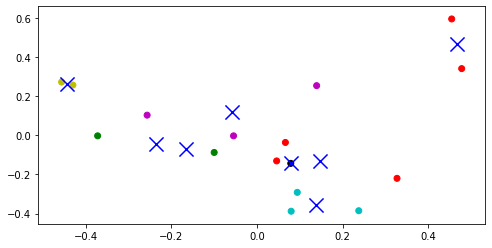

Document  505



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


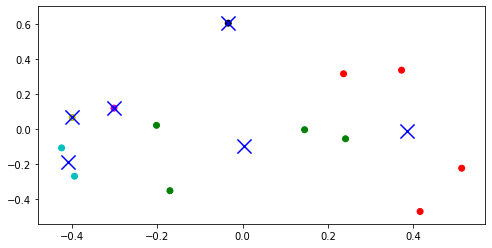

C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


Document  506



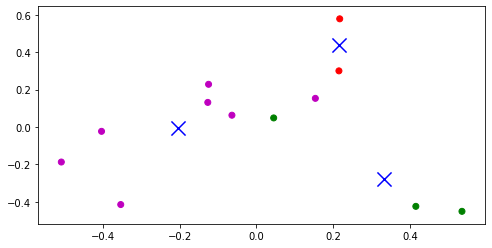

Document  507



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


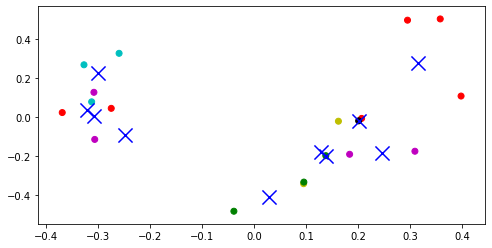

Document  508



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


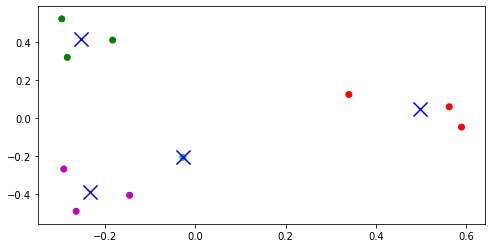

Document  509



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


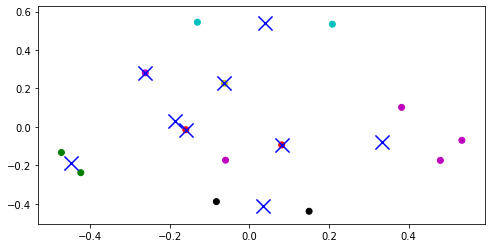

Document  510



C:\Users\Nagendra\Anaconda3\lib\site-packages\sklearn\feature_extraction\text.py:385: UserWarning: Your stop_words may be inconsistent with your preprocessing. Tokenizing the stop words generated tokens ['ha', 'le', 'u', 'wa'] not in stop_words.
  'stop_words.' % sorted(inconsistent))


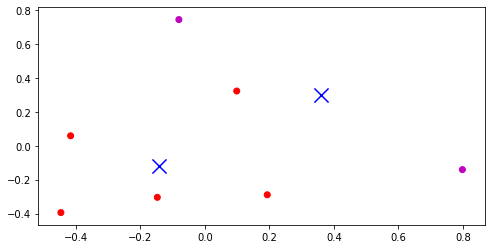

In [11]:
from sklearn.decomposition import PCA

for i in range(len(all_doc_data)):
    print("Document  {}".format(i+1))
    print()
    if clusters_list[i] != None :
        sentences_list = nltk.sent_tokenize(all_doc_data[i])
        #sentences_list = newsgroups_train.data
        
        # vectorizing the Document
    
        vectorizer = TfidfVectorizer(analyzer='word',min_df = 0,preprocessor=preprocessing,stop_words='english',tokenizer=LemmaTokenizer(), sublinear_tf=True)
        tfidf = vectorizer.fit_transform(sentences_list)
    
        #Clustering the sentences using KMeans clustering
        kmeans = KMeans(n_clusters=clusters_list[i], init='k-means++', max_iter=100, n_init=1).fit(tfidf)
        kmean_indices = kmeans.fit_predict(tfidf)
    
        #Decomposing the sparse matrix into list . Inplace of  todense() toarray() can be used
        pca = PCA(n_components=2)
        scatter_plot_points = pca.fit_transform(tfidf.todense())
    
        #Assigning 1st column to x_axis
        x_axis = [o[0] for o in scatter_plot_points]
    
        #Assigning 2nd column to y_axis
        y_axis = [o[1] for o in scatter_plot_points]

    
        colors = ["r", "m","g","c","y","k","w"]*((clusters_list[i]//7)+1)
        fig, ax = plt.subplots(figsize=(8,4))
        ax.scatter(x_axis, y_axis, c=[colors[d] for d in kmean_indices])

        #Plotting centroids in the subplot
        centers2D = pca.transform(kmeans.cluster_centers_)
        ax.scatter(centers2D[:,0], centers2D[:,1], marker='x', s=200, linewidths=3, c="b") 
    
    
        #for i, txt in enumerate(sentences_list):
            #ax.annotate(txt, (x_axis[i], y_axis[i]))
        plt.show()
    else:
        print("Visualization is not possible for text with redundant data")